# Extraction of extracellular matrix from histological microscopic images of the liver using machine learning methods
Jan Burian

## Installing dependencies and import needed modules

### ImageSplitterMerger

In [ ]:
# Installations of needed modules
!pip install openslide-python openslide-bin imagecodecs loguru read_roi czifile
!pip install git+https://github.com/mjirik/imma.git

# WSI tools installation
!pip install git+https://github.com/mjirik/wsitools.git

# Modules import
import matplotlib.pyplot as plt
import numpy as np
import imma
import requests
import sys
import os

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.0/359.0 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.6/39.6 MB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for openslide-python: filename=openslide_python-1.3.1-cp310-cp310-linux_x86_64.whl size=33550 sha256=ddafd24167c940366dc4d89f2b5bcb320e206246b1ccafca020f24ad383eca1f
  Stored in directory: /root/.cache/pip/wheels/79/79/fa/29a0087493c69dff7fd0b70fab5d6771002a531010161d2d97
  Created wheel for read_roi: filename=read_roi-1.6.0-py2.py3-none-any.whl size=8017 sha256=55116d119a372bc49b5ce54de278f73db1f53c94adeb1300fcbc245a5698def8
  Stored in directory: /root/.cache/pip/wheels/09/67/72/4903ef58791d5330f9946373f84126b8b79027879ac828702e
Successfully built openslide-python read_roi


### Main repository

In [ ]:
!git clone https://github.com/janburian/Masters_thesis.git
sys.path.insert(0, os.path.abspath('./Masters_thesis/src'))

Cloning into 'Masters_thesis'...
remote: Enumerating objects: 288, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 288 (delta 21), reused 22 (delta 4), pack-reused 230
Receiving objects: 100% (288/288), 380.84 MiB | 20.69 MiB/s, done.
Resolving deltas: 100% (146/146), done.
Updating files: 100% (42/42), done.


Methods import

In [ ]:
from ECM_removal_methods import (
    download_czi_file,
    download_public_gdrive_folder,
    jaccard_coef,
    jaccard_coef_loss,
    do_inference_unet,
    do_inference_mask_rcnn,
    apply_dilation,
    do_inpainting_biharmonic,
    remove_ECM_unet,
    # process_tile_unet,
    # process_tile_mask_rcnn
)

### Detectron2

In [ ]:
!python -m pip install pyyaml==5.1
import distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 3.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15676, done.
remote: Counting objects: 100% (399/399), done.
remote: Compressing objects: 100% (304/304), done.
remote: Total 15676 (delta 176), reused 287 (delta 95), pack-reused 15277
Receiving objects: 100% (15676/15676), 6.51 MiB | 13.65 MiB/s, done.
Resolving deltas: 100% (11288/11288), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 971.3 kB/s eta 0:

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from pathlib import Path

import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

# U-Net
import numpy as np
import keras
import tensorflow as tf
from tensorflow.keras.models import load_model
from keras.preprocessing.image import load_img, img_to_array
from PIL import Image
from skimage.transform import resize

# Inpainting
from skimage.restoration import inpaint
from skimage.morphology import dilation

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


## CZI file

In [ ]:
# Possible filenames: J7_5_a.czi, J7_25_a_ann0004.czi, J8_8_a.czi
filename = "J7_5_a.czi"
url_path = "https://github.com/janburian/Masters_thesis/raw/main/data_czi/"

download_czi_file(url_path, filename)

## Segmentation setup

### Mask R-CNN (Detectron2)

In [ ]:
mask_rcnn_weights_url = "https://drive.google.com/drive/folders/1j7Mn7EREHOGCKJDk77NRjeRxboUHrEti?usp=sharing"
local_download_path = "/content/mask_rcnn_weights"

download_public_gdrive_folder(mask_rcnn_weights_url, local_download_path)

1j7Mn7EREHOGCKJDk77NRjeRxboUHrEti?usp=sharing


Retrieving folder contents


Retrieving folder 1-UDHDGhWHAoJjsfgk3T6w2PAvVwCADTL output
Processing file 1-erwv9_vmRbOknEHBy1s5NUFLvFDaWa0 coco_instances_results.json
Processing file 1-VNSgpW_L3QyKFht-ViEY1sq0CADmR1V events.out.tfevents.1715590033.913fe913d14b.414.0
Processing file 1-qkaOHRxvy5uFaylzUgsMdP02dVKmjpi instances_predictions.pth
Processing file 1-v7V3sdXHZsQscbHpGCo7-B6akDpf_lo last_checkpoint
Processing file 1-VsgJTrCdDmO9-12mg6AHcKPlNSQXBqP metrics.json
Processing file 1-av2pVjxdowsWsGRTDnwVsiWMU09Y6Cs model_final.pth
Retrieving folder 1--IJjLvXw16ysL26oYZ73YmpAn6OHCKM R50-FPN
Processing file 1IBTkBOgQdOntBLS7801nTsjGz8KtJz38 config.yaml
Processing file 1-D049jvWI0p3UoHSO5kRFGIIClaq2vrq events.out.tfevents.1715672909.60e05f48b7f5.2466.0
Processing file 1-MQem5DoPkTirYtLD3LEHPIw3exUe-jd last_checkpoint
Processing file 1-E7o6bHGhxyI4j3cBRNfYzOl2IZ8A1-s metrics.json
Processing file 1-3JQNwqTO5n4_ZyMP4mfKwblwp0sgWpo ResNet50-FPN.pth
Retrieving folder 1AvZFnYnoGSqybgMxGbUjHJs9R631tocB R101-FPN
Processing f

Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1-erwv9_vmRbOknEHBy1s5NUFLvFDaWa0
To: /content/mask_rcnn_weights/output/coco_instances_results.json
100%|██████████| 61.8k/61.8k [00:00<00:00, 20.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-VNSgpW_L3QyKFht-ViEY1sq0CADmR1V
To: /content/mask_rcnn_weights/output/events.out.tfevents.1715590033.913fe913d14b.414.0
100%|██████████| 28.5k/28.5k [00:00<00:00, 11.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-qkaOHRxvy5uFaylzUgsMdP02dVKmjpi
To: /content/mask_rcnn_weights/output/instances_predictions.pth
100%|██████████| 38.8k/38.8k [00:00<00:00, 62.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-v7V3sdXHZsQscbHpGCo7-B6akDpf_lo
To: /content/mask_rcnn_weights/output/last_checkpoint
100%|██████████| 15.0/15.0 [00:00<00:00, 47.9kB/s]
Downloading...
From: https://drive.google.com/uc?id=1-VsgJTrCdDmO9-12

In [ ]:
# Setup config and corresponding own weights
MASK_RCNN_MODEL = "/content/mask_rcnn_weights/R101-FPN/config.yaml"

cfg = get_cfg()
cfg.merge_from_file(MASK_RCNN_MODEL) # Config file
cfg.MODEL.WEIGHTS = "/content/mask_rcnn_weights/R101-FPN/ResNet101-FPN.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set a custom testing threshold
# cfg.MODEL.DEVICE = "cpu" # use if you do not have available GPU
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only one class
predictor = DefaultPredictor(cfg)

[05/14 12:18:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_weights/R101-FPN/ResNet101-FPN.pth ...


### UNet

In [ ]:
unet_model_path = '/content/Masters_thesis/models/cell nuclei/20240415-13_06_unet_cell_nuclei_150epochs.keras'
model_unet = load_model(unet_model_path)

unet_model_ECM_path = '/content/Masters_thesis/models/ECM/unet_ECM_final_50epochs.keras'
model_unet_ECM = load_model(unet_model_ECM_path)

## Implementing *process_tile()* methods

In [ ]:
def process_tile_unet(tile: np.array) -> np.array:
  orig_tile_shape = tile.shape
  mask = do_inference_unet(tile, model_unet, orig_tile_shape)
  # mask = create_mask_from_inferences(res_inference)
  # print(type(mask))
  if np.any(mask):  # determine whether in mask are white pixels
    mask_dil = apply_dilation(mask, 5)
    # plt.imshow(mask_dil)
    # plt.show()
    img_removed_cell_nuclei = do_inpainting_biharmonic(tile, mask_dil)
    img_removed_extracellular_matrix = remove_ECM_unet(img_removed_cell_nuclei, model_unet_ECM, orig_tile_shape)
    # plt.imshow(img_removed_extracellular_matrix)
    # plt.show()
    # print(img_removed_extracellular_matrix)
    # return img_removed_cell_nuclei
    # img_removed_extracellular_matrix_new_color = create_pink_contours(img_removed_extracellular_matrix)
    # img_removed_extracellular_matrix = convert_grayscale_to_RGB(img_removed_extracellular_matrix)
    # plt.imshow(img_removed_extracellular_matrix_new_color)
    # plt.show()
    # print(img_removed_extracellular_matrix_new_color)

    # fig, axes = plt.subplots(1, 4, figsize=(12, 6))
    # axes[0].imshow(tile)
    # axes[0].set_title("Original Tile")
    # axes[0].axis('off')
    # axes[1].imshow(mask_dil, cmap="gray")
    # axes[1].set_title("Mask")
    # axes[1].axis('off')
    # axes[2].imshow(img_removed_cell_nuclei)
    # axes[2].set_title("Tile with removed cell nuclei")
    # axes[2].axis('off')
    # axes[3].imshow(img_removed_extracellular_matrix)
    # axes[3].set_title("Removed ECM")
    # axes[3].axis('off')
    # plt.show()

    # plt.imshow(img_removed_extracellular_matrix)
    # plt.show()
    # print(img_removed_extracellular_matrix.shape)

    return img_removed_extracellular_matrix

    # return np.stack((img_removed_extracellular_matrix,) * 3, axis=-1) # TODO

  else: # no mask in tile; returning the original tile
      # plt.imshow(tile)
      # plt.show()
      # print(tile)
      # return tile
      tile_normalized = tile / 255.0
      img_removed_extracellular_matrix = remove_ECM_unet(tile_normalized, model_unet_ECM, orig_tile_shape)
      # img_removed_extracellular_matrix_new_color = create_pink_contours(img_removed_extracellular_matrix)
      # img_removed_extracellular_matrix_new_color = convert_grayscale_to_RGB(img_removed_extracellular_matrix)

      # plt.imshow(img_removed_extracellular_matrix)
      # plt.show()
      # print('TEST: ' + str(img_removed_extracellular_matrix.dtype))
      return img_removed_extracellular_matrix

      # return np.stack((img_removed_extracellular_matrix,) * 3, axis=-1) # TODO



def process_tile_mask_rcnn(tile: np.array) -> np.array:
  orig_tile_shape = tile.shape
  mask = do_inference_mask_rcnn(tile, predictor)
  if np.any(mask):  # determine whether in mask are white pixels
    mask_dil = apply_dilation(mask, 5)
    # plt.imshow(mask_dil)
    # plt.show()
    img_removed_cell_nuclei = do_inpainting_biharmonic(tile, mask_dil)
    img_removed_extracellular_matrix = remove_ECM_unet(img_removed_cell_nuclei, model_unet_ECM, orig_tile_shape)
    # print(img_removed_cell_nuclei.dtype)

    # print(tile_removed_cell_nuclei)
    # fig, axes = plt.subplots(1, 4, figsize=(12, 6))
    # axes[0].imshow(tile)
    # axes[0].set_title("Original Tile")
    # axes[0].axis('off')
    # axes[1].imshow(mask_dil, cmap="gray")
    # axes[1].set_title("Mask")
    # axes[1].axis('off')
    # axes[2].imshow(img_removed_cell_nuclei)
    # axes[2].set_title("Tile with removed cell nuclei")
    # axes[2].axis('off')
    # axes[3].imshow(img_removed_extracellular_matrix)
    # axes[3].set_title("Removed ECM")
    # axes[3].axis('off')
    # plt.show()

    # print(img_removed_cell_nuclei)
    return img_removed_extracellular_matrix

  else: # no mask in tile; returning the original tile
      # plt.imshow(tile)
      # plt.show()
      tile_normalized = tile / 255.0
      # plt.imshow(remove_ECM_unet(tile_normalized, model_unet_ECM, orig_tile_shape))
      # plt.show()
      return remove_ECM_unet(tile_normalized, model_unet_ECM, orig_tile_shape)

## Final part

2024-05-14 12:18:39.360 | DEBUG    | wsitools.image:__init__:412 - fs_enc: utf-8
2024-05-14 12:18:39.361 | DEBUG    | wsitools.image:__init__:413 - Reading file J7_5_a.czi
2024-05-14 12:18:39.386 | DEBUG    | wsitools.image:_set_properties_czi:342 - nzi pixelsize  8.772367043811993e-07x8.772367043811993e-07 [m]
2024-05-14 12:18:39.390 | DEBUG    | wsitools.image:read_annotations:723 - Reading the annotation J7_5_a.czi


True


Splitting and Processing Tiles:   0%|          | 0/8600 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   0%|          | 1/8600 [00:01<4:13:37,  1.77s/it]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:   0%|          | 2/8600 [00:02<2:24:41,  1.01s/it]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   0%|          | 3/8600 [00:02<1:40:26,  1.43it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   0%|          | 4/8600 [00:02<1:19:10,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   0%|          | 5/8600 [00:03<1:07:05,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   0%|          | 6/8600 [00:03<59:28,  2.41it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   0%|          | 7/8600 [00:03<54:33,  2.62it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   0%|          | 8/8600 [00:04<59:46,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 9/8600 [00:04<56:44,  2.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   0%|          | 10/8600 [00:05<57:11,  2.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   0%|          | 11/8600 [00:05<59:22,  2.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   0%|          | 12/8600 [00:05<56:32,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   0%|          | 13/8600 [00:06<59:57,  2.39it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   0%|          | 14/8600 [00:06<1:06:14,  2.16it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   0%|          | 15/8600 [00:07<1:12:25,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   0%|          | 16/8600 [00:08<1:15:43,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   0%|          | 17/8600 [00:08<1:19:19,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   0%|          | 18/8600 [00:09<1:21:03,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   0%|          | 19/8600 [00:09<1:20:43,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 20/8600 [00:10<1:16:19,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   0%|          | 21/8600 [00:10<1:14:06,  1.93it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   0%|          | 22/8600 [00:11<1:09:16,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 23/8600 [00:11<1:07:18,  2.12it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   0%|          | 24/8600 [00:12<1:05:03,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   0%|          | 25/8600 [00:12<1:02:27,  2.29it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   0%|          | 26/8600 [00:12<59:53,  2.39it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   0%|          | 27/8600 [00:13<57:51,  2.47it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   0%|          | 28/8600 [00:13<56:23,  2.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 29/8600 [00:14<1:15:35,  1.89it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   0%|          | 30/8600 [00:14<1:13:32,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 31/8600 [00:15<1:06:49,  2.14it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   0%|          | 32/8600 [00:15<1:02:27,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   0%|          | 33/8600 [00:16<59:18,  2.41it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   0%|          | 34/8600 [00:16<57:43,  2.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 35/8600 [00:16<55:32,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   0%|          | 36/8600 [00:17<54:03,  2.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   0%|          | 37/8600 [00:17<52:40,  2.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   0%|          | 38/8600 [00:17<56:27,  2.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   0%|          | 39/8600 [00:18<58:25,  2.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   0%|          | 40/8600 [00:18<58:46,  2.43it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   0%|          | 41/8600 [00:19<58:21,  2.44it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   0%|          | 42/8600 [00:19<1:01:33,  2.32it/s]

1/1 [==============================] - 0s 106ms/step


Splitting and Processing Tiles:   0%|          | 43/8600 [00:21<1:40:44,  1.42it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:   1%|          | 44/8600 [00:21<1:41:46,  1.40it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   1%|          | 45/8600 [00:22<1:34:01,  1.52it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   1%|          | 46/8600 [00:22<1:29:23,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 47/8600 [00:23<1:25:54,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|          | 48/8600 [00:23<1:18:39,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   1%|          | 49/8600 [00:24<1:16:05,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 50/8600 [00:24<1:08:01,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 51/8600 [00:25<1:04:00,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   1%|          | 52/8600 [00:25<1:02:36,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|          | 53/8600 [00:25<1:00:45,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|          | 54/8600 [00:26<58:37,  2.43it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|          | 55/8600 [00:26<56:36,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|          | 56/8600 [00:26<55:32,  2.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 57/8600 [00:27<59:12,  2.40it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   1%|          | 58/8600 [00:27<1:01:48,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|          | 59/8600 [00:28<59:05,  2.41it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 60/8600 [00:28<56:54,  2.50it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   1%|          | 61/8600 [00:29<56:14,  2.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   1%|          | 62/8600 [00:29<56:32,  2.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 63/8600 [00:29<54:31,  2.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 64/8600 [00:30<53:15,  2.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|          | 65/8600 [00:30<54:09,  2.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 66/8600 [00:30<56:50,  2.50it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   1%|          | 67/8600 [00:31<58:47,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   1%|          | 68/8600 [00:31<57:14,  2.48it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   1%|          | 69/8600 [00:32<54:27,  2.61it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|          | 70/8600 [00:32<53:53,  2.64it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   1%|          | 71/8600 [00:32<53:26,  2.66it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   1%|          | 72/8600 [00:33<56:04,  2.53it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   1%|          | 73/8600 [00:33<1:00:18,  2.36it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   1%|          | 74/8600 [00:34<1:03:31,  2.24it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   1%|          | 75/8600 [00:35<1:14:18,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   1%|          | 76/8600 [00:35<1:21:17,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   1%|          | 77/8600 [00:36<1:27:29,  1.62it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   1%|          | 78/8600 [00:36<1:22:12,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 79/8600 [00:37<1:14:32,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 80/8600 [00:37<1:07:20,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 81/8600 [00:38<1:02:27,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 82/8600 [00:38<1:00:42,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 83/8600 [00:38<1:00:47,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 84/8600 [00:39<58:31,  2.43it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|          | 85/8600 [00:39<56:56,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 86/8600 [00:39<54:34,  2.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 87/8600 [00:40<51:05,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|          | 88/8600 [00:40<49:12,  2.88it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|          | 89/8600 [00:40<48:20,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   1%|          | 90/8600 [00:41<47:27,  2.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 91/8600 [00:41<46:28,  3.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 92/8600 [00:41<45:38,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   1%|          | 93/8600 [00:42<45:46,  3.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|          | 94/8600 [00:42<46:36,  3.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 95/8600 [00:42<47:12,  3.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|          | 96/8600 [00:43<50:40,  2.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   1%|          | 97/8600 [00:43<54:20,  2.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|          | 98/8600 [00:44<52:22,  2.71it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   1%|          | 99/8600 [00:44<54:08,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   1%|          | 100/8600 [00:44<59:27,  2.38it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   1%|          | 101/8600 [00:45<1:06:17,  2.14it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   1%|          | 102/8600 [00:46<1:14:31,  1.90it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:   1%|          | 103/8600 [00:46<1:21:18,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:   1%|          | 104/8600 [00:47<1:30:10,  1.57it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   1%|          | 105/8600 [00:48<1:42:51,  1.38it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   1%|          | 106/8600 [00:49<1:48:05,  1.31it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   1%|          | 107/8600 [00:50<1:45:16,  1.34it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   1%|▏         | 108/8600 [00:50<1:37:55,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   1%|▏         | 109/8600 [00:51<1:29:02,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|▏         | 110/8600 [00:51<1:18:52,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|▏         | 111/8600 [00:51<1:10:59,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|▏         | 112/8600 [00:52<1:06:12,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|▏         | 113/8600 [00:52<1:02:26,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|▏         | 114/8600 [00:53<58:59,  2.40it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|▏         | 115/8600 [00:53<1:02:32,  2.26it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   1%|▏         | 116/8600 [00:54<1:05:23,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|▏         | 117/8600 [00:54<1:00:50,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   1%|▏         | 118/8600 [00:54<58:09,  2.43it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   1%|▏         | 119/8600 [00:55<56:30,  2.50it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|▏         | 120/8600 [00:55<56:10,  2.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|▏         | 121/8600 [00:55<55:52,  2.53it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|▏         | 122/8600 [00:56<54:58,  2.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|▏         | 123/8600 [00:56<53:37,  2.63it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:   1%|▏         | 124/8600 [00:57<57:21,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   1%|▏         | 125/8600 [00:57<59:24,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   1%|▏         | 126/8600 [00:58<1:00:23,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   1%|▏         | 127/8600 [00:58<1:01:34,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   1%|▏         | 128/8600 [00:58<1:00:38,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 129/8600 [00:59<58:57,  2.39it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   2%|▏         | 130/8600 [00:59<56:04,  2.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 131/8600 [01:00<54:17,  2.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 132/8600 [01:00<54:02,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   2%|▏         | 133/8600 [01:00<58:09,  2.43it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   2%|▏         | 134/8600 [01:01<1:06:55,  2.11it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   2%|▏         | 135/8600 [01:02<1:15:04,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   2%|▏         | 136/8600 [01:02<1:13:57,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:   2%|▏         | 137/8600 [01:03<1:16:03,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   2%|▏         | 138/8600 [01:03<1:19:13,  1.78it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   2%|▏         | 139/8600 [01:04<1:21:05,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 140/8600 [01:04<1:15:03,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 141/8600 [01:05<1:07:46,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 142/8600 [01:05<1:04:57,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 143/8600 [01:06<1:06:50,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 144/8600 [01:06<1:06:08,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   2%|▏         | 145/8600 [01:07<1:03:29,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 146/8600 [01:07<1:00:19,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 147/8600 [01:07<59:02,  2.39it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 148/8600 [01:08<57:46,  2.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 149/8600 [01:08<56:28,  2.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 150/8600 [01:08<54:11,  2.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 151/8600 [01:09<53:57,  2.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 152/8600 [01:09<57:56,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 153/8600 [01:10<59:24,  2.37it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   2%|▏         | 154/8600 [01:10<56:41,  2.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 155/8600 [01:10<55:15,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 156/8600 [01:11<55:21,  2.54it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   2%|▏         | 157/8600 [01:11<54:43,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   2%|▏         | 158/8600 [01:12<53:54,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   2%|▏         | 159/8600 [01:12<53:34,  2.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 160/8600 [01:12<52:49,  2.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 161/8600 [01:13<55:45,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 162/8600 [01:13<59:06,  2.38it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   2%|▏         | 163/8600 [01:14<1:00:51,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 164/8600 [01:14<58:20,  2.41it/s]  

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   2%|▏         | 165/8600 [01:15<1:05:12,  2.16it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   2%|▏         | 166/8600 [01:15<1:06:40,  2.11it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   2%|▏         | 167/8600 [01:16<1:10:32,  1.99it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   2%|▏         | 168/8600 [01:16<1:13:38,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   2%|▏         | 169/8600 [01:17<1:15:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   2%|▏         | 170/8600 [01:18<1:17:52,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 171/8600 [01:18<1:13:13,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   2%|▏         | 172/8600 [01:18<1:06:34,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 173/8600 [01:19<1:00:28,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 174/8600 [01:19<55:58,  2.51it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 175/8600 [01:19<52:12,  2.69it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   2%|▏         | 176/8600 [01:20<50:46,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 177/8600 [01:20<49:09,  2.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 178/8600 [01:20<47:59,  2.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 179/8600 [01:21<46:31,  3.02it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 180/8600 [01:21<47:32,  2.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 181/8600 [01:21<47:45,  2.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 182/8600 [01:22<51:52,  2.70it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 183/8600 [01:22<55:14,  2.54it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   2%|▏         | 184/8600 [01:23<54:29,  2.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 185/8600 [01:23<52:43,  2.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 186/8600 [01:23<51:59,  2.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 187/8600 [01:24<56:47,  2.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 188/8600 [01:24<58:21,  2.40it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   2%|▏         | 189/8600 [01:25<1:00:05,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   2%|▏         | 190/8600 [01:25<1:01:40,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   2%|▏         | 191/8600 [01:26<1:07:07,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 192/8600 [01:26<1:09:09,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 193/8600 [01:27<1:10:22,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 194/8600 [01:27<1:05:56,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   2%|▏         | 195/8600 [01:28<1:02:50,  2.23it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   2%|▏         | 196/8600 [01:28<1:01:37,  2.27it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   2%|▏         | 197/8600 [01:28<1:04:36,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   2%|▏         | 198/8600 [01:29<1:08:13,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   2%|▏         | 199/8600 [01:29<1:09:22,  2.02it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:   2%|▏         | 200/8600 [01:30<1:11:54,  1.95it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   2%|▏         | 201/8600 [01:31<1:23:05,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 202/8600 [01:31<1:25:51,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   2%|▏         | 203/8600 [01:32<1:16:17,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 204/8600 [01:32<1:09:36,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   2%|▏         | 205/8600 [01:33<1:05:40,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   2%|▏         | 206/8600 [01:33<1:01:30,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 207/8600 [01:33<58:59,  2.37it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 208/8600 [01:34<58:01,  2.41it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 209/8600 [01:34<57:08,  2.45it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   2%|▏         | 210/8600 [01:35<1:00:00,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 211/8600 [01:35<1:03:27,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 212/8600 [01:36<1:01:57,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   2%|▏         | 213/8600 [01:36<1:01:44,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   2%|▏         | 214/8600 [01:36<1:01:01,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   2%|▎         | 215/8600 [01:37<58:14,  2.40it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 216/8600 [01:37<56:08,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 217/8600 [01:38<55:08,  2.53it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   3%|▎         | 218/8600 [01:38<55:42,  2.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 219/8600 [01:38<58:05,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 220/8600 [01:39<1:00:30,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 221/8600 [01:39<1:03:34,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 222/8600 [01:40<59:33,  2.34it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   3%|▎         | 223/8600 [01:40<56:09,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 224/8600 [01:41<55:48,  2.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 225/8600 [01:41<55:57,  2.49it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   3%|▎         | 226/8600 [01:41<59:13,  2.36it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   3%|▎         | 227/8600 [01:42<1:04:10,  2.17it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   3%|▎         | 228/8600 [01:43<1:08:11,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   3%|▎         | 229/8600 [01:43<1:18:13,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   3%|▎         | 230/8600 [01:44<1:22:15,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   3%|▎         | 231/8600 [01:44<1:20:37,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 232/8600 [01:45<1:16:24,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 233/8600 [01:45<1:09:51,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   3%|▎         | 234/8600 [01:46<1:05:13,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 235/8600 [01:46<1:00:49,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 236/8600 [01:46<57:05,  2.44it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   3%|▎         | 237/8600 [01:47<55:29,  2.51it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 238/8600 [01:47<58:49,  2.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 239/8600 [01:48<59:55,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   3%|▎         | 240/8600 [01:48<57:04,  2.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 241/8600 [01:48<55:35,  2.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 242/8600 [01:49<55:55,  2.49it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   3%|▎         | 243/8600 [01:49<55:18,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 244/8600 [01:50<54:40,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 245/8600 [01:50<53:45,  2.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 246/8600 [01:50<52:46,  2.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   3%|▎         | 247/8600 [01:51<56:50,  2.45it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 248/8600 [01:51<58:38,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 249/8600 [01:52<1:00:54,  2.29it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   3%|▎         | 250/8600 [01:52<59:49,  2.33it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 251/8600 [01:53<58:03,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 252/8600 [01:53<55:46,  2.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 253/8600 [01:53<55:11,  2.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 254/8600 [01:54<57:26,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 255/8600 [01:54<57:08,  2.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 256/8600 [01:55<55:36,  2.50it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   3%|▎         | 257/8600 [01:55<56:37,  2.46it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   3%|▎         | 258/8600 [01:55<1:00:25,  2.30it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   3%|▎         | 259/8600 [01:56<1:00:39,  2.29it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   3%|▎         | 260/8600 [01:56<1:01:05,  2.28it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   3%|▎         | 261/8600 [01:57<1:02:20,  2.23it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   3%|▎         | 262/8600 [01:57<1:02:40,  2.22it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   3%|▎         | 263/8600 [01:58<1:05:26,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   3%|▎         | 264/8600 [01:58<1:05:22,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 265/8600 [01:59<1:02:52,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 266/8600 [01:59<58:58,  2.36it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 267/8600 [01:59<55:04,  2.52it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   3%|▎         | 268/8600 [02:00<56:29,  2.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   3%|▎         | 269/8600 [02:00<58:12,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 270/8600 [02:01<55:24,  2.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 271/8600 [02:01<53:05,  2.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 272/8600 [02:01<54:36,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   3%|▎         | 273/8600 [02:02<57:54,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 274/8600 [02:02<58:43,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 275/8600 [02:03<1:00:18,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 276/8600 [02:03<1:01:31,  2.25it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   3%|▎         | 277/8600 [02:04<1:06:09,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 278/8600 [02:04<1:07:41,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   3%|▎         | 279/8600 [02:05<1:29:20,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 280/8600 [02:06<1:22:13,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 281/8600 [02:06<1:14:08,  1.87it/s]

1/1 [==============================] - 0s 99ms/step


Splitting and Processing Tiles:   3%|▎         | 282/8600 [02:07<1:12:45,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 283/8600 [02:07<1:21:29,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   3%|▎         | 284/8600 [02:08<1:13:05,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 285/8600 [02:08<1:06:41,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   3%|▎         | 286/8600 [02:09<1:05:52,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   3%|▎         | 287/8600 [02:09<1:18:01,  1.78it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:   3%|▎         | 288/8600 [02:10<1:25:15,  1.62it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   3%|▎         | 289/8600 [02:11<1:23:09,  1.67it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:   3%|▎         | 290/8600 [02:11<1:26:09,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 291/8600 [02:12<1:22:42,  1.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 292/8600 [02:12<1:14:44,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   3%|▎         | 293/8600 [02:13<1:10:09,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 294/8600 [02:13<1:06:54,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   3%|▎         | 295/8600 [02:14<1:02:08,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 296/8600 [02:14<1:03:39,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 297/8600 [02:15<1:06:35,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   3%|▎         | 298/8600 [02:15<1:03:43,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   3%|▎         | 299/8600 [02:15<1:01:52,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   3%|▎         | 300/8600 [02:16<1:00:04,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▎         | 301/8600 [02:16<57:21,  2.41it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▎         | 302/8600 [02:17<56:24,  2.45it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▎         | 303/8600 [02:17<56:27,  2.45it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   4%|▎         | 304/8600 [02:17<55:34,  2.49it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   4%|▎         | 305/8600 [02:18<57:30,  2.40it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▎         | 306/8600 [02:18<1:00:16,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▎         | 307/8600 [02:19<1:02:11,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▎         | 308/8600 [02:19<59:45,  2.31it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▎         | 309/8600 [02:20<57:58,  2.38it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▎         | 310/8600 [02:20<55:50,  2.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▎         | 311/8600 [02:20<54:12,  2.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▎         | 312/8600 [02:21<54:20,  2.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▎         | 313/8600 [02:21<55:01,  2.51it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   4%|▎         | 314/8600 [02:21<54:49,  2.52it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   4%|▎         | 315/8600 [02:22<58:57,  2.34it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   4%|▎         | 316/8600 [02:23<1:10:44,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   4%|▎         | 317/8600 [02:23<1:09:54,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   4%|▎         | 318/8600 [02:24<1:10:25,  1.96it/s]

1/1 [==============================] - 0s 146ms/step


Splitting and Processing Tiles:   4%|▎         | 319/8600 [02:25<1:48:06,  1.28it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:   4%|▎         | 320/8600 [02:26<1:38:43,  1.40it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▎         | 321/8600 [02:26<1:26:14,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▎         | 322/8600 [02:26<1:14:51,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▍         | 323/8600 [02:27<1:07:12,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 324/8600 [02:27<1:06:17,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 325/8600 [02:28<1:06:26,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 326/8600 [02:28<1:01:08,  2.26it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   4%|▍         | 327/8600 [02:28<58:50,  2.34it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 328/8600 [02:29<58:40,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 329/8600 [02:29<56:54,  2.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 330/8600 [02:30<54:29,  2.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▍         | 331/8600 [02:30<54:06,  2.55it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   4%|▍         | 332/8600 [02:30<53:00,  2.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▍         | 333/8600 [02:31<55:44,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 334/8600 [02:31<58:54,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 335/8600 [02:32<1:00:31,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 336/8600 [02:32<58:09,  2.37it/s]  

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   4%|▍         | 337/8600 [02:33<57:25,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 338/8600 [02:33<55:21,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 339/8600 [02:33<53:43,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 340/8600 [02:34<53:47,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 341/8600 [02:34<54:29,  2.53it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   4%|▍         | 342/8600 [02:34<52:42,  2.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▍         | 343/8600 [02:35<51:13,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▍         | 344/8600 [02:35<51:37,  2.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▍         | 345/8600 [02:36<49:35,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   4%|▍         | 346/8600 [02:36<48:54,  2.81it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   4%|▍         | 347/8600 [02:36<52:53,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   4%|▍         | 348/8600 [02:37<56:02,  2.45it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   4%|▍         | 349/8600 [02:37<58:13,  2.36it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:   4%|▍         | 350/8600 [02:38<1:01:21,  2.24it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   4%|▍         | 351/8600 [02:38<1:01:42,  2.23it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:   4%|▍         | 352/8600 [02:39<1:02:59,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▍         | 353/8600 [02:39<1:02:33,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   4%|▍         | 354/8600 [02:40<1:01:37,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 355/8600 [02:40<1:00:35,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 356/8600 [02:40<57:57,  2.37it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 357/8600 [02:41<55:23,  2.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 358/8600 [02:41<55:10,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 359/8600 [02:42<58:44,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 360/8600 [02:42<59:03,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 361/8600 [02:42<59:42,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 362/8600 [02:43<1:01:05,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 363/8600 [02:43<1:04:08,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 364/8600 [02:44<1:07:35,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 365/8600 [02:45<1:12:20,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 366/8600 [02:45<1:08:57,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   4%|▍         | 367/8600 [02:46<1:08:09,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 368/8600 [02:46<1:04:06,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 369/8600 [02:46<1:02:30,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▍         | 370/8600 [02:47<1:01:45,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 371/8600 [02:47<59:08,  2.32it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   4%|▍         | 372/8600 [02:48<57:27,  2.39it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   4%|▍         | 373/8600 [02:48<1:03:18,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 374/8600 [02:49<1:06:08,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   4%|▍         | 375/8600 [02:49<1:06:59,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   4%|▍         | 376/8600 [02:50<1:14:41,  1.84it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   4%|▍         | 377/8600 [02:50<1:15:59,  1.80it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   4%|▍         | 378/8600 [02:51<1:18:25,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   4%|▍         | 379/8600 [02:52<1:20:42,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   4%|▍         | 380/8600 [02:52<1:24:17,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 381/8600 [02:53<1:19:22,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   4%|▍         | 382/8600 [02:53<1:16:27,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 383/8600 [02:54<1:14:33,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 384/8600 [02:54<1:08:52,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   4%|▍         | 385/8600 [02:55<1:07:39,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   4%|▍         | 386/8600 [02:55<1:04:47,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   4%|▍         | 387/8600 [02:56<1:02:30,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▍         | 388/8600 [02:56<1:03:45,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▍         | 389/8600 [02:57<1:02:11,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 390/8600 [02:57<59:25,  2.30it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 391/8600 [02:57<1:01:24,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 392/8600 [02:58<1:02:56,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▍         | 393/8600 [02:58<1:03:18,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 394/8600 [02:59<1:02:13,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 395/8600 [02:59<59:17,  2.31it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 396/8600 [03:00<56:38,  2.41it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   5%|▍         | 397/8600 [03:00<55:30,  2.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 398/8600 [03:00<54:13,  2.52it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   5%|▍         | 399/8600 [03:01<52:22,  2.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   5%|▍         | 400/8600 [03:01<52:51,  2.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 401/8600 [03:02<56:52,  2.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   5%|▍         | 402/8600 [03:02<1:00:15,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 403/8600 [03:02<58:40,  2.33it/s]  

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   5%|▍         | 404/8600 [03:03<58:37,  2.33it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   5%|▍         | 405/8600 [03:03<1:01:02,  2.24it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:   5%|▍         | 406/8600 [03:04<1:05:21,  2.09it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   5%|▍         | 407/8600 [03:04<1:06:35,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:   5%|▍         | 408/8600 [03:05<1:09:13,  1.97it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:   5%|▍         | 409/8600 [03:06<1:10:59,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   5%|▍         | 410/8600 [03:06<1:14:06,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 411/8600 [03:07<1:11:40,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 412/8600 [03:07<1:05:24,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 413/8600 [03:07<1:00:19,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 414/8600 [03:08<58:16,  2.34it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 415/8600 [03:08<56:37,  2.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▍         | 416/8600 [03:08<53:11,  2.56it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   5%|▍         | 417/8600 [03:09<53:50,  2.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 418/8600 [03:09<53:42,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 419/8600 [03:10<56:11,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   5%|▍         | 420/8600 [03:10<59:35,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 421/8600 [03:11<1:01:39,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   5%|▍         | 422/8600 [03:11<58:10,  2.34it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▍         | 423/8600 [03:11<55:18,  2.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▍         | 424/8600 [03:12<54:32,  2.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   5%|▍         | 425/8600 [03:12<53:01,  2.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 426/8600 [03:12<51:35,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   5%|▍         | 427/8600 [03:13<52:05,  2.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▍         | 428/8600 [03:13<51:49,  2.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   5%|▍         | 429/8600 [03:14<51:16,  2.66it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   5%|▌         | 430/8600 [03:14<50:14,  2.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▌         | 431/8600 [03:14<49:01,  2.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 432/8600 [03:15<47:39,  2.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 433/8600 [03:15<46:18,  2.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 434/8600 [03:15<45:31,  2.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 435/8600 [03:16<45:53,  2.97it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   5%|▌         | 436/8600 [03:16<47:45,  2.85it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   5%|▌         | 437/8600 [03:16<51:29,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   5%|▌         | 438/8600 [03:17<55:23,  2.46it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   5%|▌         | 439/8600 [03:17<58:25,  2.33it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:   5%|▌         | 440/8600 [03:18<1:06:32,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   5%|▌         | 441/8600 [03:19<1:13:42,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   5%|▌         | 442/8600 [03:19<1:12:02,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   5%|▌         | 443/8600 [03:20<1:08:46,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 444/8600 [03:20<1:02:56,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 445/8600 [03:20<1:01:20,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 446/8600 [03:21<1:01:48,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 447/8600 [03:21<1:02:06,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   5%|▌         | 448/8600 [03:22<1:02:02,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 449/8600 [03:22<1:07:01,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 450/8600 [03:23<1:09:20,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   5%|▌         | 451/8600 [03:24<1:13:00,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 452/8600 [03:24<1:09:39,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▌         | 453/8600 [03:24<1:07:12,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▌         | 454/8600 [03:25<1:04:42,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▌         | 455/8600 [03:25<1:01:56,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 456/8600 [03:26<1:00:11,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▌         | 457/8600 [03:26<58:09,  2.33it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   5%|▌         | 458/8600 [03:26<55:48,  2.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 459/8600 [03:27<58:52,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 460/8600 [03:27<1:02:33,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 461/8600 [03:28<1:01:43,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 462/8600 [03:28<1:01:43,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   5%|▌         | 463/8600 [03:29<1:00:54,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   5%|▌         | 464/8600 [03:29<1:00:44,  2.23it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   5%|▌         | 465/8600 [03:30<1:08:01,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   5%|▌         | 466/8600 [03:31<1:15:01,  1.81it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:   5%|▌         | 467/8600 [03:31<1:17:50,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   5%|▌         | 468/8600 [03:32<1:25:57,  1.58it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   5%|▌         | 469/8600 [03:33<1:32:16,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   5%|▌         | 470/8600 [03:33<1:23:09,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   5%|▌         | 471/8600 [03:34<1:17:19,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   5%|▌         | 472/8600 [03:34<1:12:47,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 473/8600 [03:35<1:09:17,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 474/8600 [03:35<1:08:45,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 475/8600 [03:36<1:05:58,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   6%|▌         | 476/8600 [03:36<1:01:29,  2.20it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   6%|▌         | 477/8600 [03:36<1:02:50,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 478/8600 [03:37<1:03:19,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 479/8600 [03:37<1:03:10,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   6%|▌         | 480/8600 [03:38<1:00:12,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 481/8600 [03:38<57:40,  2.35it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 482/8600 [03:38<55:10,  2.45it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 483/8600 [03:39<53:19,  2.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 484/8600 [03:39<53:09,  2.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 485/8600 [03:40<52:05,  2.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 486/8600 [03:40<50:40,  2.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 487/8600 [03:40<55:51,  2.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 488/8600 [03:41<59:03,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 489/8600 [03:41<57:15,  2.36it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   6%|▌         | 490/8600 [03:42<55:17,  2.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 491/8600 [03:42<54:01,  2.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 492/8600 [03:42<52:14,  2.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   6%|▌         | 493/8600 [03:43<51:25,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   6%|▌         | 494/8600 [03:43<57:08,  2.36it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   6%|▌         | 495/8600 [03:44<59:09,  2.28it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   6%|▌         | 496/8600 [03:44<1:08:50,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   6%|▌         | 497/8600 [03:45<1:15:26,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:   6%|▌         | 498/8600 [03:46<1:15:39,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 499/8600 [03:46<1:11:42,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 500/8600 [03:47<1:05:07,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 501/8600 [03:47<1:01:54,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 502/8600 [03:47<57:45,  2.34it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   6%|▌         | 503/8600 [03:48<55:24,  2.44it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   6%|▌         | 504/8600 [03:48<54:10,  2.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 505/8600 [03:49<1:14:13,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 506/8600 [03:49<1:10:59,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   6%|▌         | 507/8600 [03:50<1:10:33,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 508/8600 [03:50<1:03:57,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 509/8600 [03:51<59:02,  2.28it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 510/8600 [03:51<57:08,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 511/8600 [03:51<55:16,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 512/8600 [03:52<53:03,  2.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 513/8600 [03:52<53:23,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 514/8600 [03:53<53:09,  2.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 515/8600 [03:53<51:38,  2.61it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   6%|▌         | 516/8600 [03:53<50:47,  2.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 517/8600 [03:54<53:07,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 518/8600 [03:54<53:47,  2.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 519/8600 [03:55<53:15,  2.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 520/8600 [03:55<53:53,  2.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 521/8600 [03:55<53:37,  2.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 522/8600 [03:56<53:48,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   6%|▌         | 523/8600 [03:56<56:32,  2.38it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   6%|▌         | 524/8600 [03:57<1:03:50,  2.11it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   6%|▌         | 525/8600 [03:57<1:09:13,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   6%|▌         | 526/8600 [03:58<1:24:36,  1.59it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   6%|▌         | 527/8600 [03:59<1:38:21,  1.37it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   6%|▌         | 528/8600 [04:00<1:30:55,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 529/8600 [04:00<1:22:49,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   6%|▌         | 530/8600 [04:01<1:15:32,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   6%|▌         | 531/8600 [04:01<1:11:43,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▌         | 532/8600 [04:02<1:11:59,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 533/8600 [04:02<1:11:55,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 534/8600 [04:03<1:13:49,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▌         | 535/8600 [04:04<1:20:52,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▌         | 536/8600 [04:04<1:27:34,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▌         | 537/8600 [04:05<1:27:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▋         | 538/8600 [04:06<1:24:47,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▋         | 539/8600 [04:06<1:21:42,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▋         | 540/8600 [04:07<1:18:59,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▋         | 541/8600 [04:07<1:15:21,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▋         | 542/8600 [04:08<1:11:39,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▋         | 543/8600 [04:08<1:12:14,  1.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▋         | 544/8600 [04:09<1:09:24,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▋         | 545/8600 [04:09<1:17:09,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   6%|▋         | 546/8600 [04:10<1:33:00,  1.44it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:   6%|▋         | 547/8600 [04:11<1:35:24,  1.41it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   6%|▋         | 548/8600 [04:12<1:37:16,  1.38it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   6%|▋         | 549/8600 [04:13<1:38:53,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   6%|▋         | 550/8600 [04:13<1:34:30,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   6%|▋         | 551/8600 [04:14<1:29:12,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   6%|▋         | 552/8600 [04:14<1:25:35,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   6%|▋         | 553/8600 [04:15<1:20:24,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   6%|▋         | 554/8600 [04:16<1:27:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▋         | 555/8600 [04:16<1:32:14,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   6%|▋         | 556/8600 [04:17<1:25:46,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▋         | 557/8600 [04:18<1:21:38,  1.64it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   6%|▋         | 558/8600 [04:18<1:18:18,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   6%|▋         | 559/8600 [04:19<1:17:58,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 560/8600 [04:19<1:16:32,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   7%|▋         | 561/8600 [04:20<1:15:35,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   7%|▋         | 562/8600 [04:20<1:12:31,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   7%|▋         | 563/8600 [04:21<1:16:58,  1.74it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 564/8600 [04:22<1:20:45,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   7%|▋         | 565/8600 [04:22<1:22:59,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 566/8600 [04:23<1:17:28,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   7%|▋         | 567/8600 [04:23<1:21:13,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   7%|▋         | 568/8600 [04:24<1:26:31,  1.55it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:   7%|▋         | 569/8600 [04:25<1:28:34,  1.51it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:   7%|▋         | 570/8600 [04:25<1:31:15,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   7%|▋         | 571/8600 [04:26<1:30:43,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   7%|▋         | 572/8600 [04:27<1:22:24,  1.62it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   7%|▋         | 573/8600 [04:27<1:23:41,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 574/8600 [04:28<1:27:39,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   7%|▋         | 575/8600 [04:29<1:21:20,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 576/8600 [04:29<1:17:03,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 577/8600 [04:29<1:12:02,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 578/8600 [04:30<1:08:34,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 579/8600 [04:30<1:08:11,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 580/8600 [04:31<1:06:39,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   7%|▋         | 581/8600 [04:31<1:05:26,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 582/8600 [04:32<1:12:35,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   7%|▋         | 583/8600 [04:33<1:16:39,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 584/8600 [04:33<1:12:26,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 585/8600 [04:34<1:09:03,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 586/8600 [04:34<1:08:41,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 587/8600 [04:35<1:06:15,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 588/8600 [04:35<1:04:36,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   7%|▋         | 589/8600 [04:36<1:04:58,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 590/8600 [04:36<1:05:01,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   7%|▋         | 591/8600 [04:37<1:25:37,  1.56it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   7%|▋         | 592/8600 [04:38<1:40:33,  1.33it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   7%|▋         | 593/8600 [04:39<1:52:54,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   7%|▋         | 594/8600 [04:40<1:43:09,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 595/8600 [04:40<1:30:54,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 596/8600 [04:41<1:23:02,  1.61it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 597/8600 [04:41<1:17:17,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   7%|▋         | 598/8600 [04:42<1:12:09,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   7%|▋         | 599/8600 [04:42<1:11:01,  1.88it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 600/8600 [04:43<1:08:33,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 601/8600 [04:43<1:06:11,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 602/8600 [04:43<1:05:14,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 603/8600 [04:44<1:01:26,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 604/8600 [04:44<58:45,  2.27it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   7%|▋         | 605/8600 [04:45<57:27,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 606/8600 [04:45<55:59,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 607/8600 [04:45<55:33,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   7%|▋         | 608/8600 [04:46<56:00,  2.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 609/8600 [04:46<55:27,  2.40it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   7%|▋         | 610/8600 [04:47<54:59,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   7%|▋         | 611/8600 [04:47<55:52,  2.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 612/8600 [04:48<1:03:31,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   7%|▋         | 613/8600 [04:48<1:09:06,  1.93it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 614/8600 [04:49<1:06:29,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   7%|▋         | 615/8600 [04:49<1:04:29,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   7%|▋         | 616/8600 [04:50<1:09:34,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   7%|▋         | 617/8600 [04:51<1:16:20,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   7%|▋         | 618/8600 [04:51<1:24:50,  1.57it/s]

1/1 [==============================] - 0s 62ms/step


Splitting and Processing Tiles:   7%|▋         | 619/8600 [04:52<1:33:45,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   7%|▋         | 620/8600 [04:53<1:33:13,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 621/8600 [04:54<1:34:48,  1.40it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 622/8600 [04:54<1:33:44,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 623/8600 [04:55<1:32:43,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 624/8600 [04:56<1:27:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 625/8600 [04:56<1:22:28,  1.61it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 626/8600 [04:57<1:19:28,  1.67it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 627/8600 [04:57<1:15:24,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 628/8600 [04:58<1:12:00,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 629/8600 [04:58<1:09:51,  1.90it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 630/8600 [04:59<1:07:50,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 631/8600 [04:59<1:14:56,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 632/8600 [05:00<1:21:43,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   7%|▋         | 633/8600 [05:01<1:19:58,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 634/8600 [05:01<1:16:24,  1.74it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   7%|▋         | 635/8600 [05:02<1:12:14,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 636/8600 [05:02<1:11:45,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   7%|▋         | 637/8600 [05:03<1:13:10,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   7%|▋         | 638/8600 [05:03<1:20:00,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   7%|▋         | 639/8600 [05:04<1:24:41,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   7%|▋         | 640/8600 [05:05<1:43:03,  1.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 641/8600 [05:06<1:56:15,  1.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 642/8600 [05:07<1:40:54,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   7%|▋         | 643/8600 [05:07<1:30:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   7%|▋         | 644/8600 [05:08<1:24:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 645/8600 [05:08<1:20:30,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 646/8600 [05:09<1:15:36,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 647/8600 [05:09<1:11:59,  1.84it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 648/8600 [05:10<1:08:09,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 649/8600 [05:10<1:12:37,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 650/8600 [05:11<1:15:51,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 651/8600 [05:12<1:18:11,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 652/8600 [05:12<1:13:21,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 653/8600 [05:13<1:12:10,  1.84it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 654/8600 [05:13<1:11:49,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 655/8600 [05:14<1:08:24,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 656/8600 [05:14<1:08:11,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 657/8600 [05:15<1:06:18,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 658/8600 [05:15<1:04:24,  2.06it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 659/8600 [05:16<1:09:50,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   8%|▊         | 660/8600 [05:16<1:17:03,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   8%|▊         | 661/8600 [05:17<1:20:39,  1.64it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   8%|▊         | 662/8600 [05:18<1:23:18,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   8%|▊         | 663/8600 [05:18<1:23:51,  1.58it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   8%|▊         | 664/8600 [05:19<1:25:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 665/8600 [05:20<1:20:40,  1.64it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   8%|▊         | 666/8600 [05:20<1:14:42,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 667/8600 [05:21<1:10:11,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 668/8600 [05:21<1:14:19,  1.78it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 669/8600 [05:22<1:16:37,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 670/8600 [05:22<1:11:01,  1.86it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 671/8600 [05:23<1:07:41,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 672/8600 [05:23<1:05:17,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 673/8600 [05:24<1:03:23,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 674/8600 [05:24<1:02:21,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 675/8600 [05:24<1:00:44,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 676/8600 [05:25<59:56,  2.20it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 677/8600 [05:26<1:06:38,  1.98it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 678/8600 [05:26<1:11:13,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 679/8600 [05:27<1:14:51,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 680/8600 [05:27<1:09:48,  1.89it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 681/8600 [05:28<1:07:02,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   8%|▊         | 682/8600 [05:28<1:04:15,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 683/8600 [05:29<1:02:21,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 684/8600 [05:29<1:01:00,  2.16it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   8%|▊         | 685/8600 [05:30<1:02:41,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   8%|▊         | 686/8600 [05:30<1:10:03,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   8%|▊         | 687/8600 [05:31<1:14:36,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   8%|▊         | 688/8600 [05:31<1:17:59,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   8%|▊         | 689/8600 [05:32<1:12:37,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   8%|▊         | 690/8600 [05:32<1:09:09,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 691/8600 [05:33<1:04:14,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 692/8600 [05:33<57:13,  2.30it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 693/8600 [05:33<52:15,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 694/8600 [05:34<49:17,  2.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 695/8600 [05:34<46:51,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 696/8600 [05:34<45:18,  2.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   8%|▊         | 697/8600 [05:35<43:55,  3.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 698/8600 [05:35<47:13,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 699/8600 [05:36<49:10,  2.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 700/8600 [05:36<48:55,  2.69it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 701/8600 [05:36<47:39,  2.76it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   8%|▊         | 702/8600 [05:37<49:01,  2.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 703/8600 [05:37<51:44,  2.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 704/8600 [05:37<53:12,  2.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 705/8600 [05:38<54:59,  2.39it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 706/8600 [05:38<54:23,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 707/8600 [05:39<59:27,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 708/8600 [05:39<1:02:13,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   8%|▊         | 709/8600 [05:40<1:00:07,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   8%|▊         | 710/8600 [05:40<1:01:03,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 711/8600 [05:41<1:01:48,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   8%|▊         | 712/8600 [05:41<1:04:35,  2.04it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:   8%|▊         | 713/8600 [05:42<1:09:28,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   8%|▊         | 714/8600 [05:43<1:11:24,  1.84it/s]

1/1 [==============================] - 0s 62ms/step


Splitting and Processing Tiles:   8%|▊         | 715/8600 [05:43<1:17:29,  1.70it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   8%|▊         | 716/8600 [05:44<1:18:33,  1.67it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   8%|▊         | 717/8600 [05:45<1:26:01,  1.53it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:   8%|▊         | 718/8600 [05:46<1:34:52,  1.38it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:   8%|▊         | 719/8600 [05:46<1:35:23,  1.38it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   8%|▊         | 720/8600 [05:47<1:31:45,  1.43it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   8%|▊         | 721/8600 [05:47<1:27:22,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:   8%|▊         | 722/8600 [05:48<1:24:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   8%|▊         | 723/8600 [05:48<1:15:45,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 724/8600 [05:49<1:09:05,  1.90it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 725/8600 [05:49<1:05:47,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 726/8600 [05:50<1:08:03,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 727/8600 [05:50<1:08:17,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 728/8600 [05:51<1:04:20,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 729/8600 [05:51<59:37,  2.20it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   8%|▊         | 730/8600 [05:52<56:56,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   8%|▊         | 731/8600 [05:52<57:13,  2.29it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▊         | 732/8600 [05:52<54:05,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▊         | 733/8600 [05:53<52:15,  2.51it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▊         | 734/8600 [05:53<50:36,  2.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▊         | 735/8600 [05:54<52:59,  2.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▊         | 736/8600 [05:54<54:44,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▊         | 737/8600 [05:54<55:47,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   9%|▊         | 738/8600 [05:55<55:23,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▊         | 739/8600 [05:55<55:09,  2.38it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▊         | 740/8600 [05:56<55:45,  2.35it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   9%|▊         | 741/8600 [05:56<55:43,  2.35it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▊         | 742/8600 [05:57<54:50,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▊         | 743/8600 [05:57<54:17,  2.41it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   9%|▊         | 744/8600 [05:57<53:16,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   9%|▊         | 745/8600 [05:58<56:34,  2.31it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   9%|▊         | 746/8600 [05:58<1:01:09,  2.14it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   9%|▊         | 747/8600 [05:59<1:03:34,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   9%|▊         | 748/8600 [05:59<1:03:30,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:   9%|▊         | 749/8600 [06:00<1:05:43,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   9%|▊         | 750/8600 [06:01<1:08:11,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   9%|▊         | 751/8600 [06:01<1:10:55,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▊         | 752/8600 [06:02<1:10:50,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 753/8600 [06:02<1:03:43,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   9%|▉         | 754/8600 [06:03<1:04:42,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 755/8600 [06:03<1:04:07,  2.04it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▉         | 756/8600 [06:03<58:34,  2.23it/s]  

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   9%|▉         | 757/8600 [06:04<55:55,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   9%|▉         | 758/8600 [06:04<54:54,  2.38it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▉         | 759/8600 [06:04<52:41,  2.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 760/8600 [06:05<51:01,  2.56it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:   9%|▉         | 761/8600 [06:05<51:00,  2.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 762/8600 [06:06<49:41,  2.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 763/8600 [06:06<52:39,  2.48it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   9%|▉         | 764/8600 [06:07<1:12:24,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   9%|▉         | 765/8600 [06:07<1:09:10,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   9%|▉         | 766/8600 [06:08<1:04:31,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 767/8600 [06:08<59:37,  2.19it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 768/8600 [06:09<55:57,  2.33it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   9%|▉         | 769/8600 [06:09<54:07,  2.41it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   9%|▉         | 770/8600 [06:09<53:04,  2.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 771/8600 [06:10<51:20,  2.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 772/8600 [06:10<51:22,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 773/8600 [06:10<50:49,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 774/8600 [06:11<49:52,  2.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   9%|▉         | 775/8600 [06:11<47:29,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   9%|▉         | 776/8600 [06:12<47:21,  2.75it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   9%|▉         | 777/8600 [06:12<51:23,  2.54it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   9%|▉         | 778/8600 [06:12<53:00,  2.46it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:   9%|▉         | 779/8600 [06:13<56:26,  2.31it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   9%|▉         | 780/8600 [06:13<58:12,  2.24it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:   9%|▉         | 781/8600 [06:14<57:49,  2.25it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:   9%|▉         | 782/8600 [06:14<59:31,  2.19it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:   9%|▉         | 783/8600 [06:15<59:57,  2.17it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   9%|▉         | 784/8600 [06:15<1:07:44,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 785/8600 [06:16<1:07:50,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 786/8600 [06:16<1:03:58,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 787/8600 [06:17<1:00:10,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 788/8600 [06:17<56:26,  2.31it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 789/8600 [06:18<55:05,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   9%|▉         | 790/8600 [06:18<55:42,  2.34it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:   9%|▉         | 791/8600 [06:18<55:00,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 792/8600 [06:19<52:39,  2.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   9%|▉         | 793/8600 [06:19<57:29,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 794/8600 [06:20<1:01:25,  2.12it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:   9%|▉         | 795/8600 [06:20<1:00:04,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   9%|▉         | 796/8600 [06:21<1:00:54,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 797/8600 [06:21<1:00:44,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   9%|▉         | 798/8600 [06:22<1:00:21,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 799/8600 [06:22<1:00:02,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:   9%|▉         | 800/8600 [06:23<59:38,  2.18it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:   9%|▉         | 801/8600 [06:23<59:43,  2.18it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   9%|▉         | 802/8600 [06:24<59:51,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:   9%|▉         | 803/8600 [06:24<1:02:04,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 804/8600 [06:25<1:06:30,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 805/8600 [06:25<1:05:00,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:   9%|▉         | 806/8600 [06:26<1:03:15,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   9%|▉         | 807/8600 [06:26<1:09:06,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:   9%|▉         | 808/8600 [06:27<1:10:19,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   9%|▉         | 809/8600 [06:27<1:10:45,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:   9%|▉         | 810/8600 [06:28<1:14:09,  1.75it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:   9%|▉         | 811/8600 [06:29<1:19:20,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:   9%|▉         | 812/8600 [06:29<1:21:39,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 813/8600 [06:30<1:19:46,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 814/8600 [06:30<1:11:56,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:   9%|▉         | 815/8600 [06:31<1:09:25,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:   9%|▉         | 816/8600 [06:31<1:06:13,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 817/8600 [06:32<1:02:49,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  10%|▉         | 818/8600 [06:32<1:00:26,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  10%|▉         | 819/8600 [06:33<58:41,  2.21it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 820/8600 [06:33<55:38,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  10%|▉         | 821/8600 [06:33<58:02,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|▉         | 822/8600 [06:34<1:00:15,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 823/8600 [06:34<59:48,  2.17it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|▉         | 824/8600 [06:35<56:52,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|▉         | 825/8600 [06:35<57:51,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 826/8600 [06:36<57:36,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|▉         | 827/8600 [06:36<58:57,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 828/8600 [06:37<58:09,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 829/8600 [06:37<57:03,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  10%|▉         | 830/8600 [06:37<55:30,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 831/8600 [06:38<58:55,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 832/8600 [06:38<1:00:05,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  10%|▉         | 833/8600 [06:39<57:27,  2.25it/s]  

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  10%|▉         | 834/8600 [06:39<55:44,  2.32it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  10%|▉         | 835/8600 [06:40<58:20,  2.22it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  10%|▉         | 836/8600 [06:40<1:02:27,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  10%|▉         | 837/8600 [06:41<1:04:05,  2.02it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  10%|▉         | 838/8600 [06:41<1:06:03,  1.96it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  10%|▉         | 839/8600 [06:42<1:07:04,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  10%|▉         | 840/8600 [06:42<1:12:20,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 841/8600 [06:43<1:09:02,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 842/8600 [06:43<1:02:30,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  10%|▉         | 843/8600 [06:44<59:12,  2.18it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|▉         | 844/8600 [06:44<57:02,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 845/8600 [06:45<54:19,  2.38it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|▉         | 846/8600 [06:45<51:52,  2.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 847/8600 [06:45<51:19,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|▉         | 848/8600 [06:46<50:41,  2.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 849/8600 [06:46<53:07,  2.43it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|▉         | 850/8600 [06:47<56:34,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 851/8600 [06:47<57:41,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 852/8600 [06:47<54:05,  2.39it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|▉         | 853/8600 [06:48<52:57,  2.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|▉         | 854/8600 [06:48<51:14,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 855/8600 [06:49<50:05,  2.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  10%|▉         | 856/8600 [06:49<49:26,  2.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 857/8600 [06:49<49:26,  2.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 858/8600 [06:50<49:34,  2.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|▉         | 859/8600 [06:50<48:50,  2.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|█         | 860/8600 [06:50<49:38,  2.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 861/8600 [06:51<47:38,  2.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 862/8600 [06:51<45:28,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 863/8600 [06:51<44:40,  2.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|█         | 864/8600 [06:52<44:27,  2.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|█         | 865/8600 [06:52<43:46,  2.95it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  10%|█         | 866/8600 [06:52<45:23,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  10%|█         | 867/8600 [06:53<49:11,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  10%|█         | 868/8600 [06:53<52:25,  2.46it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  10%|█         | 869/8600 [06:54<54:52,  2.35it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  10%|█         | 870/8600 [06:54<1:03:15,  2.04it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  10%|█         | 871/8600 [06:55<1:06:50,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  10%|█         | 872/8600 [06:56<1:08:29,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 873/8600 [06:56<1:04:10,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 874/8600 [06:56<59:02,  2.18it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  10%|█         | 875/8600 [06:57<57:11,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 876/8600 [06:57<54:41,  2.35it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  10%|█         | 877/8600 [06:58<54:15,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  10%|█         | 878/8600 [06:58<54:01,  2.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 879/8600 [06:59<56:30,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  10%|█         | 880/8600 [06:59<1:00:50,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|█         | 881/8600 [07:00<1:02:18,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  10%|█         | 882/8600 [07:00<1:02:01,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 883/8600 [07:01<1:00:59,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 884/8600 [07:01<59:13,  2.17it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  10%|█         | 885/8600 [07:01<57:26,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 886/8600 [07:02<56:14,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 887/8600 [07:02<55:43,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 888/8600 [07:03<55:04,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  10%|█         | 889/8600 [07:03<59:55,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  10%|█         | 890/8600 [07:04<1:04:06,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 891/8600 [07:04<1:03:03,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  10%|█         | 892/8600 [07:05<1:02:02,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 893/8600 [07:05<1:02:41,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  10%|█         | 894/8600 [07:06<1:01:13,  2.10it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  10%|█         | 895/8600 [07:06<1:02:56,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  10%|█         | 896/8600 [07:07<1:05:08,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  10%|█         | 897/8600 [07:07<1:09:31,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  10%|█         | 898/8600 [07:08<1:21:23,  1.58it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  10%|█         | 899/8600 [07:09<1:30:36,  1.42it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  10%|█         | 900/8600 [07:10<1:25:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  10%|█         | 901/8600 [07:10<1:19:18,  1.62it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  10%|█         | 902/8600 [07:11<1:13:06,  1.75it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  10%|█         | 903/8600 [07:11<1:08:41,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 904/8600 [07:11<1:05:12,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 905/8600 [07:12<1:02:59,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 906/8600 [07:12<1:00:23,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 907/8600 [07:13<1:02:06,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 908/8600 [07:13<1:01:51,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 909/8600 [07:14<1:02:21,  2.06it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█         | 910/8600 [07:14<57:57,  2.21it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 911/8600 [07:15<55:54,  2.29it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  11%|█         | 912/8600 [07:15<57:55,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 913/8600 [07:16<58:44,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 914/8600 [07:16<56:32,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 915/8600 [07:16<54:55,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 916/8600 [07:17<52:35,  2.44it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 917/8600 [07:17<55:38,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 918/8600 [07:18<58:19,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 919/8600 [07:18<55:09,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 920/8600 [07:19<53:28,  2.39it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 921/8600 [07:19<52:44,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 922/8600 [07:19<52:09,  2.45it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  11%|█         | 923/8600 [07:20<55:02,  2.32it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  11%|█         | 924/8600 [07:20<59:16,  2.16it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  11%|█         | 925/8600 [07:21<1:00:51,  2.10it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  11%|█         | 926/8600 [07:22<1:09:05,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  11%|█         | 927/8600 [07:22<1:13:54,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  11%|█         | 928/8600 [07:23<1:13:08,  1.75it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█         | 929/8600 [07:23<1:08:05,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 930/8600 [07:24<1:01:24,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  11%|█         | 931/8600 [07:24<57:33,  2.22it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 932/8600 [07:24<55:31,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 933/8600 [07:25<53:54,  2.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 934/8600 [07:25<52:49,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  11%|█         | 935/8600 [07:26<56:25,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 936/8600 [07:26<57:27,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 937/8600 [07:27<57:39,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 938/8600 [07:27<55:12,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 939/8600 [07:27<53:21,  2.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 940/8600 [07:28<51:43,  2.47it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  11%|█         | 941/8600 [07:28<51:31,  2.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 942/8600 [07:28<50:24,  2.53it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█         | 943/8600 [07:29<49:37,  2.57it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 944/8600 [07:29<48:26,  2.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 945/8600 [07:30<49:12,  2.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 946/8600 [07:30<48:47,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 947/8600 [07:30<46:55,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  11%|█         | 948/8600 [07:31<46:27,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  11%|█         | 949/8600 [07:31<46:04,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 950/8600 [07:31<44:40,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  11%|█         | 951/8600 [07:32<44:41,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█         | 952/8600 [07:32<44:24,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 953/8600 [07:32<44:06,  2.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 954/8600 [07:33<44:15,  2.88it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  11%|█         | 955/8600 [07:33<46:15,  2.75it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  11%|█         | 956/8600 [07:34<54:51,  2.32it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  11%|█         | 957/8600 [07:34<1:02:18,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  11%|█         | 958/8600 [07:35<1:04:45,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  11%|█         | 959/8600 [07:35<1:05:25,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  11%|█         | 960/8600 [07:36<1:06:44,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 961/8600 [07:36<1:05:38,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█         | 962/8600 [07:37<1:00:12,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 963/8600 [07:37<59:04,  2.15it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█         | 964/8600 [07:38<58:17,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█         | 965/8600 [07:38<58:52,  2.16it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█         | 966/8600 [07:39<59:56,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█         | 967/8600 [07:39<59:38,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█▏        | 968/8600 [07:40<58:51,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  11%|█▏        | 969/8600 [07:40<1:00:03,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█▏        | 970/8600 [07:41<59:12,  2.15it/s]  

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  11%|█▏        | 971/8600 [07:41<59:54,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█▏        | 972/8600 [07:41<57:37,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█▏        | 973/8600 [07:42<55:06,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  11%|█▏        | 974/8600 [07:42<53:25,  2.38it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█▏        | 975/8600 [07:43<58:52,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█▏        | 976/8600 [07:43<1:02:17,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█▏        | 977/8600 [07:44<59:54,  2.12it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█▏        | 978/8600 [07:44<1:00:26,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  11%|█▏        | 979/8600 [07:45<59:11,  2.15it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█▏        | 980/8600 [07:45<58:17,  2.18it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█▏        | 981/8600 [07:46<56:09,  2.26it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  11%|█▏        | 982/8600 [07:46<54:14,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  11%|█▏        | 983/8600 [07:46<55:04,  2.30it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  11%|█▏        | 984/8600 [07:47<1:08:55,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  11%|█▏        | 985/8600 [07:48<1:17:01,  1.65it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  11%|█▏        | 986/8600 [07:49<1:17:45,  1.63it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  11%|█▏        | 987/8600 [07:49<1:22:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  11%|█▏        | 988/8600 [07:50<1:19:17,  1.60it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  12%|█▏        | 989/8600 [07:50<1:13:17,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 990/8600 [07:51<1:09:02,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 991/8600 [07:51<1:07:35,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 992/8600 [07:52<1:03:53,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 993/8600 [07:52<1:03:18,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 994/8600 [07:53<1:03:10,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 995/8600 [07:53<1:02:02,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 996/8600 [07:54<57:10,  2.22it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  12%|█▏        | 997/8600 [07:54<56:16,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 998/8600 [07:54<55:29,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 999/8600 [07:55<55:08,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 1000/8600 [07:55<54:07,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1001/8600 [07:56<52:41,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1002/8600 [07:56<50:19,  2.52it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 1003/8600 [07:56<54:04,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  12%|█▏        | 1004/8600 [07:57<56:49,  2.23it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  12%|█▏        | 1005/8600 [07:57<53:20,  2.37it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  12%|█▏        | 1006/8600 [07:58<51:31,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1007/8600 [07:58<51:14,  2.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1008/8600 [07:59<50:36,  2.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  12%|█▏        | 1009/8600 [07:59<50:00,  2.53it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  12%|█▏        | 1010/8600 [07:59<49:46,  2.54it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  12%|█▏        | 1011/8600 [08:00<49:39,  2.55it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  12%|█▏        | 1012/8600 [08:00<59:56,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  12%|█▏        | 1013/8600 [08:01<1:07:14,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  12%|█▏        | 1014/8600 [08:01<1:05:59,  1.92it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  12%|█▏        | 1015/8600 [08:02<1:06:30,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  12%|█▏        | 1016/8600 [08:03<1:06:14,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  12%|█▏        | 1017/8600 [08:03<1:04:52,  1.95it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  12%|█▏        | 1018/8600 [08:03<58:46,  2.15it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  12%|█▏        | 1019/8600 [08:04<55:26,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1020/8600 [08:04<53:15,  2.37it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  12%|█▏        | 1021/8600 [08:05<55:15,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1022/8600 [08:05<56:43,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  12%|█▏        | 1023/8600 [08:06<57:31,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1024/8600 [08:06<55:39,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1025/8600 [08:06<53:57,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1026/8600 [08:07<51:57,  2.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1027/8600 [08:08<1:08:09,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1028/8600 [08:08<1:01:36,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 1029/8600 [08:08<57:56,  2.18it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1030/8600 [08:09<54:18,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1031/8600 [08:09<51:33,  2.45it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  12%|█▏        | 1032/8600 [08:09<50:16,  2.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1033/8600 [08:10<48:53,  2.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1034/8600 [08:10<47:23,  2.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1035/8600 [08:10<45:17,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  12%|█▏        | 1036/8600 [08:11<44:52,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  12%|█▏        | 1037/8600 [08:11<44:42,  2.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1038/8600 [08:12<44:15,  2.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1039/8600 [08:12<43:41,  2.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  12%|█▏        | 1040/8600 [08:12<45:03,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1041/8600 [08:13<43:27,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  12%|█▏        | 1042/8600 [08:13<48:21,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  12%|█▏        | 1043/8600 [08:14<57:40,  2.18it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  12%|█▏        | 1044/8600 [08:14<59:23,  2.12it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  12%|█▏        | 1045/8600 [08:15<1:02:32,  2.01it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  12%|█▏        | 1046/8600 [08:15<1:07:39,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  12%|█▏        | 1047/8600 [08:16<1:12:22,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1048/8600 [08:17<1:11:28,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1049/8600 [08:17<1:06:40,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 1050/8600 [08:17<1:05:04,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  12%|█▏        | 1051/8600 [08:18<1:03:09,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1052/8600 [08:18<1:01:27,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  12%|█▏        | 1053/8600 [08:19<58:19,  2.16it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1054/8600 [08:19<58:10,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  12%|█▏        | 1055/8600 [08:20<57:04,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1056/8600 [08:20<58:08,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1057/8600 [08:21<57:35,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1058/8600 [08:21<56:19,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1059/8600 [08:21<54:46,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1060/8600 [08:22<54:37,  2.30it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  12%|█▏        | 1061/8600 [08:22<1:00:00,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1062/8600 [08:23<1:02:09,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  12%|█▏        | 1063/8600 [08:23<1:00:12,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  12%|█▏        | 1064/8600 [08:24<1:00:36,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  12%|█▏        | 1065/8600 [08:24<59:27,  2.11it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  12%|█▏        | 1066/8600 [08:25<57:47,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1067/8600 [08:25<56:22,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1068/8600 [08:26<54:06,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  12%|█▏        | 1069/8600 [08:26<52:18,  2.40it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  12%|█▏        | 1070/8600 [08:27<58:44,  2.14it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  12%|█▏        | 1071/8600 [08:27<1:07:55,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  12%|█▏        | 1072/8600 [08:28<1:10:56,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  12%|█▏        | 1073/8600 [08:29<1:12:48,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  12%|█▏        | 1074/8600 [08:29<1:14:16,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  12%|█▎        | 1075/8600 [08:30<1:16:25,  1.64it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1076/8600 [08:30<1:16:52,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1077/8600 [08:31<1:11:35,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1078/8600 [08:31<1:04:44,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  13%|█▎        | 1079/8600 [08:32<1:03:58,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  13%|█▎        | 1080/8600 [08:32<1:02:45,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  13%|█▎        | 1081/8600 [08:33<1:02:36,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1082/8600 [08:33<59:15,  2.11it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1083/8600 [08:34<55:39,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1084/8600 [08:34<53:07,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1085/8600 [08:34<52:21,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1086/8600 [08:35<50:49,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1087/8600 [08:35<49:45,  2.52it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  13%|█▎        | 1088/8600 [08:36<49:35,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1089/8600 [08:36<52:49,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1090/8600 [08:36<54:06,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  13%|█▎        | 1091/8600 [08:37<53:11,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1092/8600 [08:37<51:30,  2.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  13%|█▎        | 1093/8600 [08:38<50:40,  2.47it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1094/8600 [08:38<51:29,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1095/8600 [08:38<51:25,  2.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1096/8600 [08:39<50:16,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  13%|█▎        | 1097/8600 [08:39<50:05,  2.50it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  13%|█▎        | 1098/8600 [08:40<53:16,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1099/8600 [08:40<54:26,  2.30it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  13%|█▎        | 1100/8600 [08:41<56:51,  2.20it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  13%|█▎        | 1101/8600 [08:41<58:53,  2.12it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  13%|█▎        | 1102/8600 [08:42<59:27,  2.10it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  13%|█▎        | 1103/8600 [08:42<1:01:50,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  13%|█▎        | 1104/8600 [08:43<1:02:28,  2.00it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  13%|█▎        | 1105/8600 [08:43<1:04:16,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  13%|█▎        | 1106/8600 [08:44<1:04:54,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1107/8600 [08:44<1:02:59,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  13%|█▎        | 1108/8600 [08:45<1:02:19,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1109/8600 [08:45<1:01:22,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1110/8600 [08:46<56:47,  2.20it/s]  

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  13%|█▎        | 1111/8600 [08:46<55:35,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1112/8600 [08:46<54:00,  2.31it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1113/8600 [08:47<51:16,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  13%|█▎        | 1114/8600 [08:47<50:27,  2.47it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  13%|█▎        | 1115/8600 [08:48<50:33,  2.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1116/8600 [08:48<49:14,  2.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1117/8600 [08:48<47:59,  2.60it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  13%|█▎        | 1118/8600 [08:49<47:30,  2.62it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  13%|█▎        | 1119/8600 [08:49<48:03,  2.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1120/8600 [08:50<49:36,  2.51it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1121/8600 [08:50<50:20,  2.48it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1122/8600 [08:50<50:47,  2.45it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  13%|█▎        | 1123/8600 [08:51<49:58,  2.49it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  13%|█▎        | 1124/8600 [08:51<51:55,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1125/8600 [08:52<52:30,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1126/8600 [08:52<51:31,  2.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  13%|█▎        | 1127/8600 [08:52<52:00,  2.39it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  13%|█▎        | 1128/8600 [08:53<59:16,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1129/8600 [08:54<1:05:08,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  13%|█▎        | 1130/8600 [08:54<1:08:33,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  13%|█▎        | 1131/8600 [08:55<1:13:26,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  13%|█▎        | 1132/8600 [08:56<1:21:17,  1.53it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  13%|█▎        | 1133/8600 [08:57<1:29:18,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1134/8600 [08:57<1:26:46,  1.43it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  13%|█▎        | 1135/8600 [08:58<1:20:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1136/8600 [08:58<1:15:10,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  13%|█▎        | 1137/8600 [08:59<1:18:00,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1138/8600 [09:00<1:19:12,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1139/8600 [09:00<1:12:23,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  13%|█▎        | 1140/8600 [09:01<1:11:18,  1.74it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  13%|█▎        | 1141/8600 [09:01<1:07:48,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  13%|█▎        | 1142/8600 [09:02<1:07:32,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  13%|█▎        | 1143/8600 [09:02<1:06:11,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1144/8600 [09:03<1:04:05,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1145/8600 [09:03<1:03:51,  1.95it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  13%|█▎        | 1146/8600 [09:04<1:06:54,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1147/8600 [09:05<1:14:15,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1148/8600 [09:05<1:18:00,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1149/8600 [09:06<1:16:46,  1.62it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  13%|█▎        | 1150/8600 [09:06<1:14:44,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  13%|█▎        | 1151/8600 [09:07<1:12:43,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  13%|█▎        | 1152/8600 [09:08<1:16:23,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  13%|█▎        | 1153/8600 [09:08<1:23:11,  1.49it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  13%|█▎        | 1154/8600 [09:09<1:27:22,  1.42it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  13%|█▎        | 1155/8600 [09:10<1:31:58,  1.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  13%|█▎        | 1156/8600 [09:11<1:45:06,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  13%|█▎        | 1157/8600 [09:12<1:39:31,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  13%|█▎        | 1158/8600 [09:12<1:30:25,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  13%|█▎        | 1159/8600 [09:13<1:21:31,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  13%|█▎        | 1160/8600 [09:13<1:18:58,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▎        | 1161/8600 [09:14<1:17:54,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  14%|█▎        | 1162/8600 [09:15<1:17:42,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▎        | 1163/8600 [09:15<1:14:46,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▎        | 1164/8600 [09:16<1:10:36,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▎        | 1165/8600 [09:16<1:16:10,  1.63it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  14%|█▎        | 1166/8600 [09:17<1:18:35,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▎        | 1167/8600 [09:18<1:20:52,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▎        | 1168/8600 [09:18<1:14:41,  1.66it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▎        | 1169/8600 [09:19<1:12:13,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▎        | 1170/8600 [09:19<1:09:25,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▎        | 1171/8600 [09:20<1:08:20,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▎        | 1172/8600 [09:20<1:06:47,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▎        | 1173/8600 [09:21<1:04:17,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▎        | 1174/8600 [09:22<1:09:47,  1.77it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  14%|█▎        | 1175/8600 [09:23<1:27:08,  1.42it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  14%|█▎        | 1176/8600 [09:24<1:40:34,  1.23it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  14%|█▎        | 1177/8600 [09:24<1:38:24,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  14%|█▎        | 1178/8600 [09:25<1:31:20,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▎        | 1179/8600 [09:25<1:22:04,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▎        | 1180/8600 [09:26<1:15:22,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▎        | 1181/8600 [09:26<1:11:34,  1.73it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  14%|█▎        | 1182/8600 [09:27<1:07:37,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1183/8600 [09:27<1:04:43,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1184/8600 [09:28<1:11:37,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1185/8600 [09:29<1:14:06,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▍        | 1186/8600 [09:29<1:10:11,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1187/8600 [09:30<1:06:55,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  14%|█▍        | 1188/8600 [09:30<1:04:57,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▍        | 1189/8600 [09:31<1:03:36,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1190/8600 [09:31<1:01:23,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1191/8600 [09:32<1:01:28,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▍        | 1192/8600 [09:32<1:00:57,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▍        | 1193/8600 [09:33<1:07:51,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▍        | 1194/8600 [09:34<1:12:37,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  14%|█▍        | 1195/8600 [09:34<1:16:38,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1196/8600 [09:35<1:11:27,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  14%|█▍        | 1197/8600 [09:35<1:15:33,  1.63it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▍        | 1198/8600 [09:36<1:19:00,  1.56it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  14%|█▍        | 1199/8600 [09:37<1:20:15,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▍        | 1200/8600 [09:37<1:21:34,  1.51it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  14%|█▍        | 1201/8600 [09:38<1:23:49,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1202/8600 [09:39<1:22:39,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▍        | 1203/8600 [09:39<1:15:32,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1204/8600 [09:40<1:10:30,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1205/8600 [09:40<1:04:23,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▍        | 1206/8600 [09:41<1:01:37,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▍        | 1207/8600 [09:41<58:59,  2.09it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1208/8600 [09:41<56:09,  2.19it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  14%|█▍        | 1209/8600 [09:42<55:42,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1210/8600 [09:42<55:18,  2.23it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  14%|█▍        | 1211/8600 [09:43<53:36,  2.30it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  14%|█▍        | 1212/8600 [09:43<53:57,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1213/8600 [09:44<53:34,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1214/8600 [09:44<59:17,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▍        | 1215/8600 [09:45<1:04:51,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1216/8600 [09:45<1:02:31,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▍        | 1217/8600 [09:46<1:02:34,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1218/8600 [09:46<1:04:46,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1219/8600 [09:47<1:04:49,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1220/8600 [09:47<1:05:25,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1221/8600 [09:48<1:03:24,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  14%|█▍        | 1222/8600 [09:48<1:02:35,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▍        | 1223/8600 [09:49<1:17:16,  1.59it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  14%|█▍        | 1224/8600 [09:50<1:30:08,  1.36it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  14%|█▍        | 1225/8600 [09:51<1:27:42,  1.40it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  14%|█▍        | 1226/8600 [09:52<1:26:56,  1.41it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▍        | 1227/8600 [09:52<1:24:21,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1228/8600 [09:53<1:16:38,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1229/8600 [09:53<1:11:38,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1230/8600 [09:54<1:09:27,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1231/8600 [09:54<1:06:18,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  14%|█▍        | 1232/8600 [09:55<1:08:03,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1233/8600 [09:56<1:14:24,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  14%|█▍        | 1234/8600 [09:56<1:17:57,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  14%|█▍        | 1235/8600 [09:57<1:16:26,  1.61it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  14%|█▍        | 1236/8600 [09:58<1:16:02,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1237/8600 [09:58<1:13:23,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  14%|█▍        | 1238/8600 [09:59<1:11:29,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1239/8600 [09:59<1:13:20,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1240/8600 [10:00<1:11:31,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1241/8600 [10:00<1:10:46,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  14%|█▍        | 1242/8600 [10:01<1:16:16,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  14%|█▍        | 1243/8600 [10:02<1:20:14,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  14%|█▍        | 1244/8600 [10:02<1:16:24,  1.60it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  14%|█▍        | 1245/8600 [10:03<1:21:34,  1.50it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  14%|█▍        | 1246/8600 [10:04<1:24:43,  1.45it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  14%|█▍        | 1247/8600 [10:05<1:29:23,  1.37it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  15%|█▍        | 1248/8600 [10:06<1:32:50,  1.32it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  15%|█▍        | 1249/8600 [10:06<1:27:10,  1.41it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  15%|█▍        | 1250/8600 [10:07<1:19:25,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▍        | 1251/8600 [10:07<1:20:20,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▍        | 1252/8600 [10:08<1:20:42,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  15%|█▍        | 1253/8600 [10:09<1:21:34,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  15%|█▍        | 1254/8600 [10:09<1:15:39,  1.62it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  15%|█▍        | 1255/8600 [10:10<1:12:23,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▍        | 1256/8600 [10:10<1:10:37,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  15%|█▍        | 1257/8600 [10:11<1:10:12,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  15%|█▍        | 1258/8600 [10:11<1:07:09,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  15%|█▍        | 1259/8600 [10:12<1:05:59,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▍        | 1260/8600 [10:12<1:05:18,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  15%|█▍        | 1261/8600 [10:13<1:10:03,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▍        | 1262/8600 [10:14<1:15:12,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  15%|█▍        | 1263/8600 [10:14<1:10:22,  1.74it/s]

1/1 [==============================] - 0s 76ms/step


Splitting and Processing Tiles:  15%|█▍        | 1264/8600 [10:15<1:18:50,  1.55it/s]

1/1 [==============================] - 0s 120ms/step


Splitting and Processing Tiles:  15%|█▍        | 1265/8600 [10:16<1:41:02,  1.21it/s]

1/1 [==============================] - 0s 82ms/step


Splitting and Processing Tiles:  15%|█▍        | 1266/8600 [10:18<2:06:50,  1.04s/it]

1/1 [==============================] - 0s 80ms/step


Splitting and Processing Tiles:  15%|█▍        | 1267/8600 [10:20<2:55:33,  1.44s/it]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  15%|█▍        | 1268/8600 [10:21<2:47:43,  1.37s/it]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  15%|█▍        | 1269/8600 [10:22<2:34:38,  1.27s/it]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  15%|█▍        | 1270/8600 [10:24<2:45:43,  1.36s/it]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  15%|█▍        | 1271/8600 [10:25<2:45:49,  1.36s/it]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  15%|█▍        | 1272/8600 [10:26<2:27:28,  1.21s/it]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  15%|█▍        | 1273/8600 [10:27<2:27:14,  1.21s/it]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  15%|█▍        | 1274/8600 [10:28<2:16:26,  1.12s/it]

1/1 [==============================] - 0s 56ms/step


Splitting and Processing Tiles:  15%|█▍        | 1275/8600 [10:30<2:48:21,  1.38s/it]

1/1 [==============================] - 0s 75ms/step


Splitting and Processing Tiles:  15%|█▍        | 1276/8600 [10:31<2:37:02,  1.29s/it]

1/1 [==============================] - 0s 78ms/step


Splitting and Processing Tiles:  15%|█▍        | 1277/8600 [10:33<2:51:34,  1.41s/it]

1/1 [==============================] - 0s 59ms/step


Splitting and Processing Tiles:  15%|█▍        | 1278/8600 [10:34<2:37:25,  1.29s/it]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▍        | 1279/8600 [10:35<2:21:06,  1.16s/it]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▍        | 1280/8600 [10:36<2:04:20,  1.02s/it]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▍        | 1281/8600 [10:36<1:50:33,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▍        | 1282/8600 [10:37<1:35:50,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▍        | 1283/8600 [10:37<1:24:44,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▍        | 1284/8600 [10:38<1:17:05,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  15%|█▍        | 1285/8600 [10:38<1:12:30,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  15%|█▍        | 1286/8600 [10:39<1:10:12,  1.74it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  15%|█▍        | 1287/8600 [10:39<1:16:36,  1.59it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  15%|█▍        | 1288/8600 [10:40<1:17:48,  1.57it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  15%|█▍        | 1289/8600 [10:41<1:20:05,  1.52it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  15%|█▌        | 1290/8600 [10:42<1:20:36,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1291/8600 [10:42<1:13:22,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1292/8600 [10:42<1:04:20,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  15%|█▌        | 1293/8600 [10:43<57:20,  2.12it/s]  

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  15%|█▌        | 1294/8600 [10:43<52:41,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1295/8600 [10:43<50:14,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  15%|█▌        | 1296/8600 [10:44<47:35,  2.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1297/8600 [10:44<45:35,  2.67it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  15%|█▌        | 1298/8600 [10:44<46:14,  2.63it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  15%|█▌        | 1299/8600 [10:45<49:32,  2.46it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  15%|█▌        | 1300/8600 [10:46<58:43,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  15%|█▌        | 1301/8600 [10:46<1:04:44,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  15%|█▌        | 1302/8600 [10:47<1:03:41,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  15%|█▌        | 1303/8600 [10:47<1:04:39,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  15%|█▌        | 1304/8600 [10:48<1:05:02,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  15%|█▌        | 1305/8600 [10:48<1:06:28,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1306/8600 [10:49<1:01:32,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▌        | 1307/8600 [10:49<57:03,  2.13it/s]  

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  15%|█▌        | 1308/8600 [10:50<55:22,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▌        | 1309/8600 [10:50<57:13,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  15%|█▌        | 1310/8600 [10:51<57:05,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▌        | 1311/8600 [10:51<54:33,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  15%|█▌        | 1312/8600 [10:51<50:51,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  15%|█▌        | 1313/8600 [10:52<48:43,  2.49it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  15%|█▌        | 1314/8600 [10:52<48:16,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▌        | 1315/8600 [10:52<48:01,  2.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1316/8600 [10:53<47:40,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▌        | 1317/8600 [10:53<47:00,  2.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1318/8600 [10:54<51:31,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1319/8600 [10:54<55:38,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  15%|█▌        | 1320/8600 [10:55<57:24,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  15%|█▌        | 1321/8600 [10:55<58:04,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▌        | 1322/8600 [10:56<56:29,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▌        | 1323/8600 [10:56<56:01,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  15%|█▌        | 1324/8600 [10:57<56:46,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  15%|█▌        | 1325/8600 [10:57<56:57,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  15%|█▌        | 1326/8600 [10:58<55:37,  2.18it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  15%|█▌        | 1327/8600 [10:58<53:51,  2.25it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  15%|█▌        | 1328/8600 [10:59<57:30,  2.11it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  15%|█▌        | 1329/8600 [10:59<1:06:17,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  15%|█▌        | 1330/8600 [11:00<1:07:28,  1.80it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  15%|█▌        | 1331/8600 [11:00<1:09:43,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  15%|█▌        | 1332/8600 [11:01<1:08:02,  1.78it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  16%|█▌        | 1333/8600 [11:02<1:11:04,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1334/8600 [11:02<1:07:10,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  16%|█▌        | 1335/8600 [11:03<1:02:09,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1336/8600 [11:03<58:01,  2.09it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1337/8600 [11:03<58:00,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  16%|█▌        | 1338/8600 [11:04<58:24,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1339/8600 [11:04<59:15,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  16%|█▌        | 1340/8600 [11:05<55:53,  2.17it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  16%|█▌        | 1341/8600 [11:05<57:05,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1342/8600 [11:06<57:52,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1343/8600 [11:06<57:29,  2.10it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  16%|█▌        | 1344/8600 [11:07<57:17,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1345/8600 [11:07<54:56,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1346/8600 [11:08<54:09,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  16%|█▌        | 1347/8600 [11:08<56:03,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  16%|█▌        | 1348/8600 [11:09<57:16,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1349/8600 [11:09<53:41,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  16%|█▌        | 1350/8600 [11:09<52:42,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1351/8600 [11:10<51:54,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1352/8600 [11:10<51:02,  2.37it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  16%|█▌        | 1353/8600 [11:11<51:23,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1354/8600 [11:11<50:00,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1355/8600 [11:11<48:27,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  16%|█▌        | 1356/8600 [11:12<53:16,  2.27it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  16%|█▌        | 1357/8600 [11:13<1:02:09,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  16%|█▌        | 1358/8600 [11:13<1:02:49,  1.92it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  16%|█▌        | 1359/8600 [11:14<1:03:05,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  16%|█▌        | 1360/8600 [11:14<1:04:28,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  16%|█▌        | 1361/8600 [11:15<1:06:05,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  16%|█▌        | 1362/8600 [11:15<1:05:38,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1363/8600 [11:16<1:04:20,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  16%|█▌        | 1364/8600 [11:16<59:11,  2.04it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  16%|█▌        | 1365/8600 [11:17<1:02:37,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1366/8600 [11:17<1:05:16,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1367/8600 [11:18<1:06:17,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  16%|█▌        | 1368/8600 [11:18<1:04:22,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1369/8600 [11:19<1:02:10,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  16%|█▌        | 1370/8600 [11:19<1:00:43,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1371/8600 [11:20<59:09,  2.04it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1372/8600 [11:20<57:58,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1373/8600 [11:21<57:14,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1374/8600 [11:21<57:06,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  16%|█▌        | 1375/8600 [11:22<56:51,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1376/8600 [11:22<56:43,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1377/8600 [11:23<51:10,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1378/8600 [11:23<48:24,  2.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1379/8600 [11:23<45:50,  2.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1380/8600 [11:24<43:33,  2.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1381/8600 [11:24<42:35,  2.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1382/8600 [11:24<41:51,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1383/8600 [11:25<41:20,  2.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1384/8600 [11:25<41:02,  2.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1385/8600 [11:25<41:17,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1386/8600 [11:26<44:36,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  16%|█▌        | 1387/8600 [11:26<54:18,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  16%|█▌        | 1388/8600 [11:27<57:08,  2.10it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  16%|█▌        | 1389/8600 [11:27<59:33,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  16%|█▌        | 1390/8600 [11:28<1:01:17,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  16%|█▌        | 1391/8600 [11:28<1:01:26,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  16%|█▌        | 1392/8600 [11:29<1:01:50,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▌        | 1393/8600 [11:29<59:32,  2.02it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  16%|█▌        | 1394/8600 [11:30<55:13,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1395/8600 [11:30<56:00,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▌        | 1396/8600 [11:31<56:38,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▌        | 1397/8600 [11:31<54:04,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  16%|█▋        | 1398/8600 [11:32<52:09,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  16%|█▋        | 1399/8600 [11:32<49:28,  2.43it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  16%|█▋        | 1400/8600 [11:32<47:28,  2.53it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  16%|█▋        | 1401/8600 [11:33<46:57,  2.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▋        | 1402/8600 [11:33<47:28,  2.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▋        | 1403/8600 [11:33<46:35,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  16%|█▋        | 1404/8600 [11:34<53:06,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▋        | 1405/8600 [11:35<57:28,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  16%|█▋        | 1406/8600 [11:35<1:00:40,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▋        | 1407/8600 [11:36<57:03,  2.10it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▋        | 1408/8600 [11:36<54:52,  2.18it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  16%|█▋        | 1409/8600 [11:36<53:42,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  16%|█▋        | 1410/8600 [11:37<55:04,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▋        | 1411/8600 [11:37<54:50,  2.18it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  16%|█▋        | 1412/8600 [11:38<54:47,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  16%|█▋        | 1413/8600 [11:38<52:23,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  16%|█▋        | 1414/8600 [11:39<53:23,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  16%|█▋        | 1415/8600 [11:39<56:24,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  16%|█▋        | 1416/8600 [11:40<1:00:50,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  16%|█▋        | 1417/8600 [11:40<1:04:32,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  16%|█▋        | 1418/8600 [11:41<1:05:51,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  16%|█▋        | 1419/8600 [11:41<1:05:15,  1.83it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  17%|█▋        | 1420/8600 [11:42<1:07:12,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  17%|█▋        | 1421/8600 [11:43<1:06:32,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1422/8600 [11:43<1:04:36,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1423/8600 [11:44<1:02:35,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  17%|█▋        | 1424/8600 [11:44<1:01:04,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1425/8600 [11:45<1:00:33,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1426/8600 [11:45<57:04,  2.10it/s]  

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  17%|█▋        | 1427/8600 [11:45<54:13,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1428/8600 [11:46<54:28,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1429/8600 [11:46<54:40,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  17%|█▋        | 1430/8600 [11:47<52:28,  2.28it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  17%|█▋        | 1431/8600 [11:47<53:23,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1432/8600 [11:48<54:04,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  17%|█▋        | 1433/8600 [11:48<56:16,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  17%|█▋        | 1434/8600 [11:49<57:22,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1435/8600 [11:49<53:37,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  17%|█▋        | 1436/8600 [11:49<53:04,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1437/8600 [11:50<54:05,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1438/8600 [11:50<52:24,  2.28it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  17%|█▋        | 1439/8600 [11:51<51:59,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1440/8600 [11:51<51:03,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1441/8600 [11:52<49:38,  2.40it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  17%|█▋        | 1442/8600 [11:52<53:36,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1443/8600 [11:53<54:29,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  17%|█▋        | 1444/8600 [11:53<51:06,  2.33it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  17%|█▋        | 1445/8600 [11:53<56:02,  2.13it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  17%|█▋        | 1446/8600 [11:54<59:54,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  17%|█▋        | 1447/8600 [11:55<1:01:32,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  17%|█▋        | 1448/8600 [11:55<1:03:03,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  17%|█▋        | 1449/8600 [11:56<1:02:17,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  17%|█▋        | 1450/8600 [11:56<1:03:12,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1451/8600 [11:57<1:04:37,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1452/8600 [11:57<1:02:22,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1453/8600 [11:58<1:01:13,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  17%|█▋        | 1454/8600 [11:58<57:13,  2.08it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1455/8600 [11:59<52:59,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1456/8600 [11:59<51:36,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1457/8600 [11:59<49:31,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  17%|█▋        | 1458/8600 [12:00<48:01,  2.48it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  17%|█▋        | 1459/8600 [12:00<47:37,  2.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1460/8600 [12:00<47:00,  2.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1461/8600 [12:01<46:14,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  17%|█▋        | 1462/8600 [12:01<45:25,  2.62it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  17%|█▋        | 1463/8600 [12:02<45:21,  2.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1464/8600 [12:02<44:35,  2.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1465/8600 [12:02<43:47,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  17%|█▋        | 1466/8600 [12:03<43:34,  2.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1467/8600 [12:03<42:39,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1468/8600 [12:03<41:23,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1469/8600 [12:04<41:24,  2.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  17%|█▋        | 1470/8600 [12:04<42:01,  2.83it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  17%|█▋        | 1471/8600 [12:04<41:21,  2.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1472/8600 [12:05<44:07,  2.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1473/8600 [12:05<48:22,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1474/8600 [12:06<48:46,  2.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1475/8600 [12:06<49:57,  2.38it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  17%|█▋        | 1476/8600 [12:07<53:13,  2.23it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  17%|█▋        | 1477/8600 [12:07<55:55,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  17%|█▋        | 1478/8600 [12:08<59:27,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  17%|█▋        | 1479/8600 [12:08<1:01:28,  1.93it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  17%|█▋        | 1480/8600 [12:09<1:02:58,  1.88it/s]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  17%|█▋        | 1481/8600 [12:10<1:10:20,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1482/8600 [12:10<1:11:39,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1483/8600 [12:11<1:06:51,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1484/8600 [12:12<1:17:19,  1.53it/s]

1/1 [==============================] - 0s 101ms/step


Splitting and Processing Tiles:  17%|█▋        | 1485/8600 [12:12<1:17:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1486/8600 [12:13<1:13:54,  1.60it/s]

1/1 [==============================] - 0s 104ms/step


Splitting and Processing Tiles:  17%|█▋        | 1487/8600 [12:13<1:15:27,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  17%|█▋        | 1488/8600 [12:14<1:11:22,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  17%|█▋        | 1489/8600 [12:14<1:04:52,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1490/8600 [12:15<1:05:17,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  17%|█▋        | 1491/8600 [12:16<1:07:04,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1492/8600 [12:16<1:05:31,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  17%|█▋        | 1493/8600 [12:16<59:05,  2.00it/s]  

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  17%|█▋        | 1494/8600 [12:17<56:09,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1495/8600 [12:17<54:02,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  17%|█▋        | 1496/8600 [12:18<54:17,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  17%|█▋        | 1497/8600 [12:18<55:30,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  17%|█▋        | 1498/8600 [12:19<1:08:31,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  17%|█▋        | 1499/8600 [12:19<1:02:26,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  17%|█▋        | 1500/8600 [12:20<1:01:51,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  17%|█▋        | 1501/8600 [12:21<1:08:48,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  17%|█▋        | 1502/8600 [12:21<1:11:11,  1.66it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  17%|█▋        | 1503/8600 [12:22<1:14:32,  1.59it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  17%|█▋        | 1504/8600 [12:23<1:14:09,  1.59it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  18%|█▊        | 1505/8600 [12:23<1:13:38,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  18%|█▊        | 1506/8600 [12:24<1:11:32,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1507/8600 [12:24<1:05:39,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  18%|█▊        | 1508/8600 [12:25<1:01:05,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1509/8600 [12:25<59:51,  1.97it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1510/8600 [12:26<58:17,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1511/8600 [12:26<59:16,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1512/8600 [12:27<55:36,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1513/8600 [12:27<52:48,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  18%|█▊        | 1514/8600 [12:27<51:46,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1515/8600 [12:28<51:15,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1516/8600 [12:28<50:06,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  18%|█▊        | 1517/8600 [12:29<52:41,  2.24it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  18%|█▊        | 1518/8600 [12:29<53:41,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1519/8600 [12:30<55:02,  2.14it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  18%|█▊        | 1520/8600 [12:30<57:47,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1521/8600 [12:31<54:12,  2.18it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  18%|█▊        | 1522/8600 [12:31<52:49,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1523/8600 [12:32<55:01,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1524/8600 [12:32<52:58,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  18%|█▊        | 1525/8600 [12:32<51:16,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  18%|█▊        | 1526/8600 [12:33<50:24,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1527/8600 [12:33<48:41,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  18%|█▊        | 1528/8600 [12:34<51:18,  2.30it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  18%|█▊        | 1529/8600 [12:34<59:25,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  18%|█▊        | 1530/8600 [12:35<58:59,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  18%|█▊        | 1531/8600 [12:35<1:01:26,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  18%|█▊        | 1532/8600 [12:36<1:03:13,  1.86it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  18%|█▊        | 1533/8600 [12:37<1:04:38,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  18%|█▊        | 1534/8600 [12:37<1:04:02,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  18%|█▊        | 1535/8600 [12:38<1:03:18,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  18%|█▊        | 1536/8600 [12:38<1:00:54,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1537/8600 [12:39<59:20,  1.98it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  18%|█▊        | 1538/8600 [12:39<1:01:05,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1539/8600 [12:40<59:53,  1.96it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1540/8600 [12:40<55:23,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  18%|█▊        | 1541/8600 [12:40<53:09,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1542/8600 [12:41<52:07,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1543/8600 [12:41<49:32,  2.37it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  18%|█▊        | 1544/8600 [12:42<48:27,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1545/8600 [12:42<48:14,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1546/8600 [12:42<47:04,  2.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1547/8600 [12:43<45:40,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1548/8600 [12:43<46:50,  2.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1549/8600 [12:43<44:46,  2.62it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  18%|█▊        | 1550/8600 [12:44<43:14,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  18%|█▊        | 1551/8600 [12:44<43:13,  2.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1552/8600 [12:44<42:45,  2.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1553/8600 [12:45<42:15,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1554/8600 [12:45<41:24,  2.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  18%|█▊        | 1555/8600 [12:46<42:07,  2.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1556/8600 [12:46<42:11,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1557/8600 [12:46<40:59,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  18%|█▊        | 1558/8600 [12:47<45:23,  2.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1559/8600 [12:47<48:42,  2.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1560/8600 [12:48<47:35,  2.47it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  18%|█▊        | 1561/8600 [12:48<53:28,  2.19it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  18%|█▊        | 1562/8600 [12:49<57:40,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  18%|█▊        | 1563/8600 [12:49<59:18,  1.98it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  18%|█▊        | 1564/8600 [12:50<1:01:35,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  18%|█▊        | 1565/8600 [12:50<1:03:52,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  18%|█▊        | 1566/8600 [12:51<1:04:23,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  18%|█▊        | 1567/8600 [12:52<1:09:40,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  18%|█▊        | 1568/8600 [12:52<1:08:07,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1569/8600 [12:53<1:01:43,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1570/8600 [12:53<56:25,  2.08it/s]  

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  18%|█▊        | 1571/8600 [12:53<54:06,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1572/8600 [12:54<50:44,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1573/8600 [12:54<47:45,  2.45it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1574/8600 [12:54<45:37,  2.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1575/8600 [12:55<46:14,  2.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1576/8600 [12:55<49:58,  2.34it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  18%|█▊        | 1577/8600 [12:56<53:47,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  18%|█▊        | 1578/8600 [12:56<54:24,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1579/8600 [12:57<51:39,  2.27it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  18%|█▊        | 1580/8600 [12:57<51:02,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1581/8600 [12:58<50:57,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1582/8600 [12:58<51:15,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  18%|█▊        | 1583/8600 [12:59<52:46,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1584/8600 [12:59<51:54,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1585/8600 [12:59<50:18,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  18%|█▊        | 1586/8600 [13:00<53:03,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  18%|█▊        | 1587/8600 [13:00<57:02,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  18%|█▊        | 1588/8600 [13:01<56:35,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  18%|█▊        | 1589/8600 [13:01<56:24,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  18%|█▊        | 1590/8600 [13:02<55:41,  2.10it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  18%|█▊        | 1591/8600 [13:02<59:15,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  19%|█▊        | 1592/8600 [13:03<1:02:15,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  19%|█▊        | 1593/8600 [13:04<1:02:46,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  19%|█▊        | 1594/8600 [13:04<1:03:17,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  19%|█▊        | 1595/8600 [13:05<1:08:44,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▊        | 1596/8600 [13:06<1:11:40,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▊        | 1597/8600 [13:06<1:08:11,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▊        | 1598/8600 [13:07<1:05:12,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▊        | 1599/8600 [13:07<1:02:03,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▊        | 1600/8600 [13:07<59:14,  1.97it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▊        | 1601/8600 [13:08<56:53,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▊        | 1602/8600 [13:08<53:37,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▊        | 1603/8600 [13:09<52:57,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▊        | 1604/8600 [13:09<53:44,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▊        | 1605/8600 [13:10<54:58,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▊        | 1606/8600 [13:10<59:16,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▊        | 1607/8600 [13:11<57:03,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▊        | 1608/8600 [13:11<54:19,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  19%|█▊        | 1609/8600 [13:12<54:42,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▊        | 1610/8600 [13:12<53:25,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▊        | 1611/8600 [13:12<49:51,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  19%|█▊        | 1612/8600 [13:13<49:11,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1613/8600 [13:13<47:57,  2.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1614/8600 [13:14<49:38,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  19%|█▉        | 1615/8600 [13:14<53:21,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1616/8600 [13:15<51:06,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1617/8600 [13:15<49:22,  2.36it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  19%|█▉        | 1618/8600 [13:15<50:57,  2.28it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  19%|█▉        | 1619/8600 [13:16<54:29,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  19%|█▉        | 1620/8600 [13:17<55:44,  2.09it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  19%|█▉        | 1621/8600 [13:17<57:14,  2.03it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  19%|█▉        | 1622/8600 [13:18<58:20,  1.99it/s]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  19%|█▉        | 1623/8600 [13:18<1:05:23,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  19%|█▉        | 1624/8600 [13:19<1:09:33,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  19%|█▉        | 1625/8600 [13:20<1:10:00,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1626/8600 [13:20<1:02:11,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1627/8600 [13:20<56:54,  2.04it/s]  

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  19%|█▉        | 1628/8600 [13:21<54:04,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1629/8600 [13:21<52:11,  2.23it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  19%|█▉        | 1630/8600 [13:22<49:51,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  19%|█▉        | 1631/8600 [13:22<48:46,  2.38it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  19%|█▉        | 1632/8600 [13:22<49:23,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1633/8600 [13:23<47:17,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1634/8600 [13:23<46:05,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1635/8600 [13:23<45:30,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1636/8600 [13:24<43:37,  2.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1637/8600 [13:24<42:23,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  19%|█▉        | 1638/8600 [13:25<41:35,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  19%|█▉        | 1639/8600 [13:25<41:47,  2.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1640/8600 [13:25<40:50,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1641/8600 [13:26<40:24,  2.87it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  19%|█▉        | 1642/8600 [13:26<40:46,  2.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1643/8600 [13:26<40:54,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1644/8600 [13:27<44:26,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1645/8600 [13:27<47:42,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1646/8600 [13:28<47:43,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1647/8600 [13:28<49:12,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1648/8600 [13:28<49:07,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1649/8600 [13:29<48:57,  2.37it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  19%|█▉        | 1650/8600 [13:29<49:54,  2.32it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  19%|█▉        | 1651/8600 [13:30<57:02,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  19%|█▉        | 1652/8600 [13:31<1:00:23,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  19%|█▉        | 1653/8600 [13:31<1:07:41,  1.71it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  19%|█▉        | 1654/8600 [13:32<1:13:55,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1655/8600 [13:33<1:10:11,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1656/8600 [13:33<1:04:04,  1.81it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  19%|█▉        | 1657/8600 [13:33<57:30,  2.01it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1658/8600 [13:34<53:15,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1659/8600 [13:34<50:33,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1660/8600 [13:35<47:51,  2.42it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  19%|█▉        | 1661/8600 [13:35<45:54,  2.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1662/8600 [13:35<49:24,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1663/8600 [13:36<50:51,  2.27it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  19%|█▉        | 1664/8600 [13:36<54:11,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1665/8600 [13:37<53:52,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1666/8600 [13:37<54:23,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1667/8600 [13:38<52:41,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1668/8600 [13:38<50:40,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  19%|█▉        | 1669/8600 [13:39<48:48,  2.37it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  19%|█▉        | 1670/8600 [13:39<48:56,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1671/8600 [13:39<49:00,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  19%|█▉        | 1672/8600 [13:40<50:51,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1673/8600 [13:40<55:39,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1674/8600 [13:41<56:27,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  19%|█▉        | 1675/8600 [13:41<55:32,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  19%|█▉        | 1676/8600 [13:42<53:20,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1677/8600 [13:42<51:03,  2.26it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  20%|█▉        | 1678/8600 [13:43<51:12,  2.25it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  20%|█▉        | 1679/8600 [13:43<56:39,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  20%|█▉        | 1680/8600 [13:44<57:59,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  20%|█▉        | 1681/8600 [13:45<1:07:32,  1.71it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  20%|█▉        | 1682/8600 [13:45<1:14:22,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1683/8600 [13:46<1:15:36,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  20%|█▉        | 1684/8600 [13:47<1:09:42,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|█▉        | 1685/8600 [13:47<1:05:48,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1686/8600 [13:48<1:03:15,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  20%|█▉        | 1687/8600 [13:48<1:00:03,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|█▉        | 1688/8600 [13:48<57:50,  1.99it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1689/8600 [13:49<56:19,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  20%|█▉        | 1690/8600 [13:49<54:24,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1691/8600 [13:50<57:16,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1692/8600 [13:50<1:00:35,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1693/8600 [13:51<59:43,  1.93it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1694/8600 [13:51<55:42,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|█▉        | 1695/8600 [13:52<54:00,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|█▉        | 1696/8600 [13:52<53:17,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1697/8600 [13:53<50:40,  2.27it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  20%|█▉        | 1698/8600 [13:53<49:25,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1699/8600 [13:53<48:26,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1700/8600 [13:54<50:34,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|█▉        | 1701/8600 [13:54<51:53,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  20%|█▉        | 1702/8600 [13:55<51:34,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|█▉        | 1703/8600 [13:55<50:33,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1704/8600 [13:56<49:33,  2.32it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  20%|█▉        | 1705/8600 [13:56<52:27,  2.19it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  20%|█▉        | 1706/8600 [13:57<57:20,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  20%|█▉        | 1707/8600 [13:57<1:00:45,  1.89it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  20%|█▉        | 1708/8600 [13:58<1:01:37,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  20%|█▉        | 1709/8600 [13:59<1:07:15,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|█▉        | 1710/8600 [13:59<1:10:01,  1.64it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  20%|█▉        | 1711/8600 [14:00<1:06:49,  1.72it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  20%|█▉        | 1712/8600 [14:00<1:00:21,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1713/8600 [14:01<55:28,  2.07it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1714/8600 [14:01<52:30,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1715/8600 [14:01<50:01,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|█▉        | 1716/8600 [14:02<48:21,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|█▉        | 1717/8600 [14:02<46:02,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  20%|█▉        | 1718/8600 [14:03<45:51,  2.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|█▉        | 1719/8600 [14:03<44:52,  2.56it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|██        | 1720/8600 [14:03<43:31,  2.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  20%|██        | 1721/8600 [14:04<45:50,  2.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1722/8600 [14:04<47:03,  2.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|██        | 1723/8600 [14:05<46:50,  2.45it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  20%|██        | 1724/8600 [14:05<47:43,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1725/8600 [14:05<47:45,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1726/8600 [14:06<47:43,  2.40it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  20%|██        | 1727/8600 [14:06<48:23,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1728/8600 [14:07<1:03:32,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|██        | 1729/8600 [14:08<59:09,  1.94it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1730/8600 [14:08<1:03:37,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1731/8600 [14:09<1:05:57,  1.74it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  20%|██        | 1732/8600 [14:09<1:07:03,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  20%|██        | 1733/8600 [14:10<1:11:59,  1.59it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  20%|██        | 1734/8600 [14:11<1:16:55,  1.49it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  20%|██        | 1735/8600 [14:12<1:22:01,  1.40it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  20%|██        | 1736/8600 [14:13<1:24:01,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  20%|██        | 1737/8600 [14:13<1:20:50,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1738/8600 [14:14<1:15:20,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|██        | 1739/8600 [14:14<1:18:14,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1740/8600 [14:15<1:17:43,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|██        | 1741/8600 [14:16<1:11:53,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1742/8600 [14:16<1:07:03,  1.70it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  20%|██        | 1743/8600 [14:17<1:04:09,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|██        | 1744/8600 [14:17<1:01:01,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1745/8600 [14:18<58:21,  1.96it/s]  

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  20%|██        | 1746/8600 [14:18<56:20,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1747/8600 [14:18<55:16,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1748/8600 [14:19<1:00:35,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  20%|██        | 1749/8600 [14:20<1:06:01,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|██        | 1750/8600 [14:21<1:10:13,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1751/8600 [14:21<1:09:05,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1752/8600 [14:22<1:08:13,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  20%|██        | 1753/8600 [14:22<1:07:14,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1754/8600 [14:23<1:04:57,  1.76it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  20%|██        | 1755/8600 [14:23<1:08:42,  1.66it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  20%|██        | 1756/8600 [14:24<1:13:34,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  20%|██        | 1757/8600 [14:25<1:16:46,  1.49it/s]

1/1 [==============================] - 0s 56ms/step


Splitting and Processing Tiles:  20%|██        | 1758/8600 [14:26<1:31:53,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  20%|██        | 1759/8600 [14:27<1:32:15,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  20%|██        | 1760/8600 [14:27<1:23:57,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  20%|██        | 1761/8600 [14:28<1:17:39,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  20%|██        | 1762/8600 [14:29<1:12:43,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  20%|██        | 1763/8600 [14:29<1:08:03,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1764/8600 [14:30<1:04:40,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1765/8600 [14:30<1:03:28,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1766/8600 [14:31<1:01:08,  1.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1767/8600 [14:31<1:07:52,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1768/8600 [14:32<1:11:23,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  21%|██        | 1769/8600 [14:33<1:16:28,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██        | 1770/8600 [14:33<1:13:27,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  21%|██        | 1771/8600 [14:34<1:12:56,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██        | 1772/8600 [14:35<1:11:05,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  21%|██        | 1773/8600 [14:35<1:08:51,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  21%|██        | 1774/8600 [14:36<1:08:11,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  21%|██        | 1775/8600 [14:36<1:05:59,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  21%|██        | 1776/8600 [14:37<1:07:36,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  21%|██        | 1777/8600 [14:38<1:25:01,  1.34it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  21%|██        | 1778/8600 [14:39<1:39:48,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  21%|██        | 1779/8600 [14:40<1:37:27,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  21%|██        | 1780/8600 [14:41<1:29:21,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1781/8600 [14:41<1:19:11,  1.44it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  21%|██        | 1782/8600 [14:42<1:13:22,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1783/8600 [14:42<1:09:08,  1.64it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  21%|██        | 1784/8600 [14:43<1:07:28,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1785/8600 [14:43<1:05:22,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1786/8600 [14:44<1:08:05,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1787/8600 [14:45<1:12:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1788/8600 [14:45<1:06:28,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1789/8600 [14:46<1:05:14,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  21%|██        | 1790/8600 [14:46<1:02:04,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  21%|██        | 1791/8600 [14:47<1:01:16,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██        | 1792/8600 [14:47<1:02:53,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1793/8600 [14:48<1:02:29,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  21%|██        | 1794/8600 [14:48<1:00:45,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1795/8600 [14:49<1:06:04,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1796/8600 [14:50<1:09:17,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  21%|██        | 1797/8600 [14:50<1:12:22,  1.57it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  21%|██        | 1798/8600 [14:51<1:14:50,  1.51it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  21%|██        | 1799/8600 [14:52<1:14:06,  1.53it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  21%|██        | 1800/8600 [14:52<1:15:50,  1.49it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  21%|██        | 1801/8600 [14:53<1:16:08,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██        | 1802/8600 [14:54<1:13:47,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1803/8600 [14:54<1:07:12,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  21%|██        | 1804/8600 [14:55<1:03:44,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1805/8600 [14:55<1:01:11,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  21%|██        | 1806/8600 [14:56<58:16,  1.94it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██        | 1807/8600 [14:56<56:18,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1808/8600 [14:56<54:26,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1809/8600 [14:57<51:23,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  21%|██        | 1810/8600 [14:57<50:53,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1811/8600 [14:58<49:28,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██        | 1812/8600 [14:58<49:01,  2.31it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  21%|██        | 1813/8600 [14:59<49:13,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1814/8600 [14:59<48:43,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1815/8600 [14:59<48:08,  2.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  21%|██        | 1816/8600 [15:00<55:43,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██        | 1817/8600 [15:01<1:00:03,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  21%|██        | 1818/8600 [15:01<59:26,  1.90it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1819/8600 [15:02<59:20,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1820/8600 [15:02<59:12,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  21%|██        | 1821/8600 [15:03<1:00:03,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██        | 1822/8600 [15:03<1:00:24,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  21%|██        | 1823/8600 [15:04<1:05:41,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  21%|██        | 1824/8600 [15:05<1:10:00,  1.61it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  21%|██        | 1825/8600 [15:06<1:24:49,  1.33it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  21%|██        | 1826/8600 [15:07<1:35:09,  1.19it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  21%|██        | 1827/8600 [15:07<1:26:13,  1.31it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██▏       | 1828/8600 [15:08<1:16:45,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██▏       | 1829/8600 [15:08<1:10:41,  1.60it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  21%|██▏       | 1830/8600 [15:09<1:05:09,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  21%|██▏       | 1831/8600 [15:09<1:01:35,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██▏       | 1832/8600 [15:10<58:22,  1.93it/s]  

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  21%|██▏       | 1833/8600 [15:10<56:31,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██▏       | 1834/8600 [15:11<1:02:29,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  21%|██▏       | 1835/8600 [15:12<1:06:57,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██▏       | 1836/8600 [15:12<1:09:56,  1.61it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  21%|██▏       | 1837/8600 [15:13<1:07:08,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██▏       | 1838/8600 [15:13<1:06:53,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██▏       | 1839/8600 [15:14<1:03:56,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██▏       | 1840/8600 [15:14<1:01:39,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  21%|██▏       | 1841/8600 [15:15<1:00:02,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  21%|██▏       | 1842/8600 [15:15<1:00:02,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  21%|██▏       | 1843/8600 [15:16<59:57,  1.88it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  21%|██▏       | 1844/8600 [15:17<1:05:02,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  21%|██▏       | 1845/8600 [15:17<1:13:23,  1.53it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  21%|██▏       | 1846/8600 [15:18<1:15:01,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  21%|██▏       | 1847/8600 [15:19<1:19:17,  1.42it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  21%|██▏       | 1848/8600 [15:20<1:22:42,  1.36it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  22%|██▏       | 1849/8600 [15:20<1:21:38,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  22%|██▏       | 1850/8600 [15:21<1:15:56,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1851/8600 [15:22<1:10:00,  1.61it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  22%|██▏       | 1852/8600 [15:22<1:06:18,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1853/8600 [15:23<1:09:53,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1854/8600 [15:23<1:12:45,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1855/8600 [15:24<1:16:33,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1856/8600 [15:25<1:13:58,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1857/8600 [15:25<1:10:55,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  22%|██▏       | 1858/8600 [15:26<1:09:20,  1.62it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1859/8600 [15:26<1:05:43,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1860/8600 [15:27<1:05:11,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1861/8600 [15:28<1:04:44,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1862/8600 [15:28<1:03:36,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1863/8600 [15:29<1:08:53,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1864/8600 [15:30<1:13:22,  1.53it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  22%|██▏       | 1865/8600 [15:30<1:11:11,  1.58it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  22%|██▏       | 1866/8600 [15:31<1:07:39,  1.66it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  22%|██▏       | 1867/8600 [15:31<1:12:55,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  22%|██▏       | 1868/8600 [15:32<1:17:10,  1.45it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  22%|██▏       | 1869/8600 [15:33<1:21:20,  1.38it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  22%|██▏       | 1870/8600 [15:34<1:24:43,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1871/8600 [15:34<1:17:19,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  22%|██▏       | 1872/8600 [15:35<1:17:33,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  22%|██▏       | 1873/8600 [15:36<1:18:28,  1.43it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  22%|██▏       | 1874/8600 [15:36<1:12:50,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  22%|██▏       | 1875/8600 [15:37<1:07:38,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1876/8600 [15:37<1:03:43,  1.76it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  22%|██▏       | 1877/8600 [15:38<1:03:32,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1878/8600 [15:39<1:03:44,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  22%|██▏       | 1879/8600 [15:39<1:04:01,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1880/8600 [15:40<1:01:59,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  22%|██▏       | 1881/8600 [15:41<1:16:28,  1.46it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  22%|██▏       | 1882/8600 [15:42<1:28:40,  1.26it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  22%|██▏       | 1883/8600 [15:43<1:36:09,  1.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1884/8600 [15:43<1:28:32,  1.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1885/8600 [15:44<1:17:36,  1.44it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  22%|██▏       | 1886/8600 [15:44<1:14:26,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  22%|██▏       | 1887/8600 [15:45<1:14:15,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  22%|██▏       | 1888/8600 [15:46<1:14:43,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  22%|██▏       | 1889/8600 [15:46<1:15:38,  1.48it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  22%|██▏       | 1890/8600 [15:47<1:17:04,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1891/8600 [15:48<1:14:26,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1892/8600 [15:48<1:07:49,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1893/8600 [15:49<58:57,  1.90it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1894/8600 [15:49<53:11,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  22%|██▏       | 1895/8600 [15:49<48:53,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1896/8600 [15:50<46:00,  2.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1897/8600 [15:50<44:00,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1898/8600 [15:50<42:43,  2.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  22%|██▏       | 1899/8600 [15:51<42:34,  2.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1900/8600 [15:51<41:44,  2.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1901/8600 [15:51<40:36,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  22%|██▏       | 1902/8600 [15:52<43:37,  2.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1903/8600 [15:52<46:29,  2.40it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  22%|██▏       | 1904/8600 [15:53<46:44,  2.39it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  22%|██▏       | 1905/8600 [15:53<46:33,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1906/8600 [15:54<47:44,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1907/8600 [15:54<47:53,  2.33it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  22%|██▏       | 1908/8600 [15:54<48:36,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1909/8600 [15:55<49:08,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1910/8600 [15:55<47:28,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  22%|██▏       | 1911/8600 [15:56<50:02,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1912/8600 [15:56<53:09,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  22%|██▏       | 1913/8600 [15:57<51:19,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  22%|██▏       | 1914/8600 [15:57<51:02,  2.18it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  22%|██▏       | 1915/8600 [15:58<50:33,  2.20it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  22%|██▏       | 1916/8600 [15:58<50:52,  2.19it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  22%|██▏       | 1917/8600 [15:59<51:30,  2.16it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  22%|██▏       | 1918/8600 [15:59<52:03,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  22%|██▏       | 1919/8600 [16:00<53:09,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  22%|██▏       | 1920/8600 [16:00<1:01:59,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  22%|██▏       | 1921/8600 [16:01<1:06:11,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1922/8600 [16:02<1:03:12,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1923/8600 [16:02<58:02,  1.92it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  22%|██▏       | 1924/8600 [16:02<55:07,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1925/8600 [16:03<51:28,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  22%|██▏       | 1926/8600 [16:03<48:29,  2.29it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  22%|██▏       | 1927/8600 [16:04<48:02,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1928/8600 [16:04<47:25,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1929/8600 [16:04<45:46,  2.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  22%|██▏       | 1930/8600 [16:05<47:43,  2.33it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  22%|██▏       | 1931/8600 [16:05<50:45,  2.19it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  22%|██▏       | 1932/8600 [16:06<50:18,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  22%|██▏       | 1933/8600 [16:06<51:26,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  22%|██▏       | 1934/8600 [16:07<52:47,  2.10it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  22%|██▎       | 1935/8600 [16:07<50:14,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  23%|██▎       | 1936/8600 [16:08<49:44,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 1937/8600 [16:08<49:00,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1938/8600 [16:08<47:40,  2.33it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  23%|██▎       | 1939/8600 [16:09<50:02,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1940/8600 [16:09<51:59,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1941/8600 [16:10<54:55,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1942/8600 [16:11<55:08,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1943/8600 [16:11<55:09,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  23%|██▎       | 1944/8600 [16:12<57:22,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  23%|██▎       | 1945/8600 [16:12<58:40,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  23%|██▎       | 1946/8600 [16:13<1:01:21,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  23%|██▎       | 1947/8600 [16:13<1:04:51,  1.71it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  23%|██▎       | 1948/8600 [16:14<1:05:01,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1949/8600 [16:15<1:15:38,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1950/8600 [16:16<1:14:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 1951/8600 [16:16<1:09:34,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  23%|██▎       | 1952/8600 [16:17<1:05:57,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 1953/8600 [16:17<1:05:01,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 1954/8600 [16:18<1:02:56,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1955/8600 [16:18<1:02:48,  1.76it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  23%|██▎       | 1956/8600 [16:19<1:02:06,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  23%|██▎       | 1957/8600 [16:19<1:01:35,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 1958/8600 [16:20<1:07:46,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1959/8600 [16:21<1:28:06,  1.26it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  23%|██▎       | 1960/8600 [16:22<1:19:59,  1.38it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  23%|██▎       | 1961/8600 [16:22<1:13:07,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1962/8600 [16:23<1:07:54,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1963/8600 [16:23<1:06:24,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1964/8600 [16:24<1:05:01,  1.70it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  23%|██▎       | 1965/8600 [16:25<1:04:07,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  23%|██▎       | 1966/8600 [16:25<1:03:01,  1.75it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  23%|██▎       | 1967/8600 [16:26<1:18:01,  1.42it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  23%|██▎       | 1968/8600 [16:27<1:28:55,  1.24it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  23%|██▎       | 1969/8600 [16:28<1:36:11,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1970/8600 [16:29<1:29:39,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1971/8600 [16:29<1:18:06,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1972/8600 [16:30<1:11:28,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1973/8600 [16:30<1:05:44,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  23%|██▎       | 1974/8600 [16:31<1:02:04,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1975/8600 [16:31<1:00:55,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1976/8600 [16:32<58:47,  1.88it/s]  

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  23%|██▎       | 1977/8600 [16:32<56:37,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1978/8600 [16:33<56:25,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1979/8600 [16:33<50:45,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  23%|██▎       | 1980/8600 [16:33<47:50,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1981/8600 [16:34<45:43,  2.41it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1982/8600 [16:34<43:35,  2.53it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  23%|██▎       | 1983/8600 [16:35<42:01,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  23%|██▎       | 1984/8600 [16:35<42:00,  2.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 1985/8600 [16:35<41:15,  2.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1986/8600 [16:36<40:53,  2.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1987/8600 [16:36<40:10,  2.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1988/8600 [16:36<43:15,  2.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 1989/8600 [16:37<46:01,  2.39it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  23%|██▎       | 1990/8600 [16:37<46:17,  2.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 1991/8600 [16:38<46:05,  2.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 1992/8600 [16:38<47:15,  2.33it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  23%|██▎       | 1993/8600 [16:39<51:31,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  23%|██▎       | 1994/8600 [16:39<57:18,  1.92it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  23%|██▎       | 1995/8600 [16:40<1:01:30,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  23%|██▎       | 1996/8600 [16:41<1:02:12,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  23%|██▎       | 1997/8600 [16:41<1:07:38,  1.63it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  23%|██▎       | 1998/8600 [16:42<1:12:30,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  23%|██▎       | 1999/8600 [16:43<1:08:42,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 2000/8600 [16:43<1:03:09,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 2001/8600 [16:44<58:07,  1.89it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  23%|██▎       | 2002/8600 [16:44<54:54,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 2003/8600 [16:44<51:41,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  23%|██▎       | 2004/8600 [16:45<48:12,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 2005/8600 [16:45<45:42,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 2006/8600 [16:46<47:44,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 2007/8600 [16:46<49:22,  2.23it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  23%|██▎       | 2008/8600 [16:47<51:05,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 2009/8600 [16:47<50:16,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 2010/8600 [16:47<47:21,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 2011/8600 [16:48<46:16,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 2012/8600 [16:48<47:14,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 2013/8600 [16:49<45:41,  2.40it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  23%|██▎       | 2014/8600 [16:49<44:56,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 2015/8600 [16:49<45:16,  2.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  23%|██▎       | 2016/8600 [16:50<49:58,  2.20it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  23%|██▎       | 2017/8600 [16:51<52:57,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  23%|██▎       | 2018/8600 [16:51<53:17,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  23%|██▎       | 2019/8600 [16:52<53:10,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  23%|██▎       | 2020/8600 [16:52<53:12,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  24%|██▎       | 2021/8600 [16:52<52:46,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  24%|██▎       | 2022/8600 [16:53<54:24,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  24%|██▎       | 2023/8600 [16:54<57:33,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  24%|██▎       | 2024/8600 [16:54<58:00,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  24%|██▎       | 2025/8600 [16:55<1:06:00,  1.66it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  24%|██▎       | 2026/8600 [16:56<1:09:50,  1.57it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  24%|██▎       | 2027/8600 [16:56<1:16:04,  1.44it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  24%|██▎       | 2028/8600 [16:57<1:11:59,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▎       | 2029/8600 [16:58<1:07:41,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▎       | 2030/8600 [16:58<1:01:10,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  24%|██▎       | 2031/8600 [16:58<58:18,  1.88it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▎       | 2032/8600 [16:59<57:42,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▎       | 2033/8600 [16:59<55:37,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▎       | 2034/8600 [17:00<52:52,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▎       | 2035/8600 [17:00<53:58,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  24%|██▎       | 2036/8600 [17:01<54:51,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▎       | 2037/8600 [17:01<52:16,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▎       | 2038/8600 [17:02<50:46,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  24%|██▎       | 2039/8600 [17:02<51:28,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  24%|██▎       | 2040/8600 [17:03<52:33,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▎       | 2041/8600 [17:03<49:51,  2.19it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  24%|██▎       | 2042/8600 [17:04<50:03,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2043/8600 [17:04<50:10,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2044/8600 [17:05<52:56,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2045/8600 [17:05<56:40,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2046/8600 [17:06<53:41,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  24%|██▍       | 2047/8600 [17:06<50:23,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2048/8600 [17:06<49:07,  2.22it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  24%|██▍       | 2049/8600 [17:07<50:24,  2.17it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  24%|██▍       | 2050/8600 [17:08<56:15,  1.94it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  24%|██▍       | 2051/8600 [17:08<58:40,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  24%|██▍       | 2052/8600 [17:09<58:49,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  24%|██▍       | 2053/8600 [17:09<1:03:35,  1.72it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  24%|██▍       | 2054/8600 [17:10<1:06:49,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  24%|██▍       | 2055/8600 [17:11<1:04:53,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2056/8600 [17:11<58:21,  1.87it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  24%|██▍       | 2057/8600 [17:11<54:25,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2058/8600 [17:12<50:34,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2059/8600 [17:12<47:36,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  24%|██▍       | 2060/8600 [17:13<46:06,  2.36it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  24%|██▍       | 2061/8600 [17:13<46:27,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2062/8600 [17:13<46:01,  2.37it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  24%|██▍       | 2063/8600 [17:14<44:58,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2064/8600 [17:14<44:19,  2.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2065/8600 [17:15<42:53,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2066/8600 [17:15<41:12,  2.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  24%|██▍       | 2067/8600 [17:15<41:19,  2.64it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  24%|██▍       | 2068/8600 [17:16<40:27,  2.69it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  24%|██▍       | 2069/8600 [17:16<39:30,  2.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2070/8600 [17:16<39:16,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2071/8600 [17:17<39:12,  2.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2072/8600 [17:17<38:28,  2.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2073/8600 [17:17<37:50,  2.88it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  24%|██▍       | 2074/8600 [17:18<41:59,  2.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2075/8600 [17:18<44:17,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2076/8600 [17:19<43:56,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  24%|██▍       | 2077/8600 [17:19<44:28,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2078/8600 [17:20<46:50,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2079/8600 [17:20<47:51,  2.27it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  24%|██▍       | 2080/8600 [17:21<52:35,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  24%|██▍       | 2081/8600 [17:21<57:02,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  24%|██▍       | 2082/8600 [17:22<59:05,  1.84it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  24%|██▍       | 2083/8600 [17:23<1:03:09,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  24%|██▍       | 2084/8600 [17:23<1:09:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  24%|██▍       | 2085/8600 [17:24<1:04:39,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2086/8600 [17:24<1:00:07,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2087/8600 [17:25<56:21,  1.93it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2088/8600 [17:25<52:20,  2.07it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  24%|██▍       | 2089/8600 [17:26<50:03,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2090/8600 [17:26<46:52,  2.31it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  24%|██▍       | 2091/8600 [17:26<44:09,  2.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2092/8600 [17:27<45:11,  2.40it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  24%|██▍       | 2093/8600 [17:27<46:38,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2094/8600 [17:28<47:58,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2095/8600 [17:28<46:42,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2096/8600 [17:28<44:46,  2.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2097/8600 [17:29<45:14,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2098/8600 [17:29<45:34,  2.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2099/8600 [17:30<44:49,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2100/8600 [17:30<44:50,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2101/8600 [17:30<45:48,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2102/8600 [17:31<50:24,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2103/8600 [17:32<51:42,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2104/8600 [17:32<51:54,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  24%|██▍       | 2105/8600 [17:33<51:13,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  24%|██▍       | 2106/8600 [17:33<50:33,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  24%|██▍       | 2107/8600 [17:33<49:28,  2.19it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  25%|██▍       | 2108/8600 [17:34<49:16,  2.20it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  25%|██▍       | 2109/8600 [17:34<51:26,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  25%|██▍       | 2110/8600 [17:35<53:46,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  25%|██▍       | 2111/8600 [17:36<59:43,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  25%|██▍       | 2112/8600 [17:36<1:04:15,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  25%|██▍       | 2113/8600 [17:37<1:07:45,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▍       | 2114/8600 [17:38<1:05:48,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  25%|██▍       | 2115/8600 [17:38<1:01:47,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▍       | 2116/8600 [17:38<56:51,  1.90it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2117/8600 [17:39<55:04,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2118/8600 [17:39<53:42,  2.01it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2119/8600 [17:40<51:50,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2120/8600 [17:40<49:34,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▍       | 2121/8600 [17:41<50:35,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2122/8600 [17:41<51:09,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2123/8600 [17:42<48:39,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2124/8600 [17:42<47:05,  2.29it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2125/8600 [17:42<47:15,  2.28it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2126/8600 [17:43<46:57,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2127/8600 [17:43<45:47,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2128/8600 [17:44<44:59,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  25%|██▍       | 2129/8600 [17:44<45:59,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▍       | 2130/8600 [17:45<49:04,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2131/8600 [17:45<51:44,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2132/8600 [17:46<49:03,  2.20it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2133/8600 [17:46<48:00,  2.25it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2134/8600 [17:46<46:48,  2.30it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2135/8600 [17:47<44:54,  2.40it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▍       | 2136/8600 [17:47<44:56,  2.40it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  25%|██▍       | 2137/8600 [17:48<47:17,  2.28it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  25%|██▍       | 2138/8600 [17:48<48:18,  2.23it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  25%|██▍       | 2139/8600 [17:49<55:07,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  25%|██▍       | 2140/8600 [17:49<59:25,  1.81it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  25%|██▍       | 2141/8600 [17:50<1:03:40,  1.69it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  25%|██▍       | 2142/8600 [17:51<1:01:06,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2143/8600 [17:51<54:34,  1.97it/s]  

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  25%|██▍       | 2144/8600 [17:51<50:22,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2145/8600 [17:52<47:11,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▍       | 2146/8600 [17:52<45:09,  2.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2147/8600 [17:53<43:09,  2.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2148/8600 [17:53<41:50,  2.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▍       | 2149/8600 [17:53<41:40,  2.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2150/8600 [17:54<40:34,  2.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2151/8600 [17:54<39:17,  2.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  25%|██▌       | 2152/8600 [17:54<38:14,  2.81it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2153/8600 [17:55<37:18,  2.88it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2154/8600 [17:55<36:51,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2155/8600 [17:55<36:19,  2.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2156/8600 [17:56<35:54,  2.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2157/8600 [17:56<36:13,  2.96it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2158/8600 [17:56<36:05,  2.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2159/8600 [17:57<36:18,  2.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2160/8600 [17:57<38:50,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2161/8600 [17:58<41:45,  2.57it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2162/8600 [17:58<42:43,  2.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2163/8600 [17:58<43:41,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2164/8600 [17:59<43:57,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2165/8600 [17:59<45:20,  2.37it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2166/8600 [18:00<47:21,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  25%|██▌       | 2167/8600 [18:00<48:15,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2168/8600 [18:01<47:11,  2.27it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  25%|██▌       | 2169/8600 [18:01<55:56,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  25%|██▌       | 2170/8600 [18:02<1:01:39,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  25%|██▌       | 2171/8600 [18:03<1:02:03,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  25%|██▌       | 2172/8600 [18:03<1:02:50,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  25%|██▌       | 2173/8600 [18:04<1:03:29,  1.69it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2174/8600 [18:04<56:35,  1.89it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2175/8600 [18:05<52:08,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2176/8600 [18:05<49:08,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2177/8600 [18:05<45:55,  2.33it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2178/8600 [18:06<46:31,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  25%|██▌       | 2179/8600 [18:06<46:58,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  25%|██▌       | 2180/8600 [18:07<47:56,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2181/8600 [18:07<46:41,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  25%|██▌       | 2182/8600 [18:07<45:05,  2.37it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  25%|██▌       | 2183/8600 [18:08<46:43,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  25%|██▌       | 2184/8600 [18:08<47:38,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2185/8600 [18:09<46:18,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  25%|██▌       | 2186/8600 [18:09<46:41,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2187/8600 [18:10<47:33,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2188/8600 [18:10<51:56,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  25%|██▌       | 2189/8600 [18:11<53:32,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  25%|██▌       | 2190/8600 [18:11<52:40,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  25%|██▌       | 2191/8600 [18:12<53:23,  2.00it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  25%|██▌       | 2192/8600 [18:12<53:09,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2193/8600 [18:13<51:45,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  26%|██▌       | 2194/8600 [18:13<50:02,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▌       | 2195/8600 [18:14<47:58,  2.22it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  26%|██▌       | 2196/8600 [18:14<48:33,  2.20it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  26%|██▌       | 2197/8600 [18:15<59:29,  1.79it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  26%|██▌       | 2198/8600 [18:16<1:08:18,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  26%|██▌       | 2199/8600 [18:16<1:11:09,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  26%|██▌       | 2200/8600 [18:17<1:10:05,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  26%|██▌       | 2201/8600 [18:18<1:20:44,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▌       | 2202/8600 [18:19<1:11:57,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2203/8600 [18:19<1:06:06,  1.61it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  26%|██▌       | 2204/8600 [18:20<1:03:27,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2205/8600 [18:20<59:25,  1.79it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2206/8600 [18:20<54:06,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▌       | 2207/8600 [18:21<54:35,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2208/8600 [18:22<54:42,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2209/8600 [18:22<51:08,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2210/8600 [18:22<50:46,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2211/8600 [18:23<51:24,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  26%|██▌       | 2212/8600 [18:23<49:32,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▌       | 2213/8600 [18:24<48:40,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2214/8600 [18:24<47:26,  2.24it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  26%|██▌       | 2215/8600 [18:25<48:51,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2216/8600 [18:25<51:51,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2217/8600 [18:26<52:31,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2218/8600 [18:26<51:19,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  26%|██▌       | 2219/8600 [18:27<51:45,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  26%|██▌       | 2220/8600 [18:27<52:25,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  26%|██▌       | 2221/8600 [18:28<52:39,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  26%|██▌       | 2222/8600 [18:28<53:23,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  26%|██▌       | 2223/8600 [18:29<54:17,  1.96it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  26%|██▌       | 2224/8600 [18:29<54:08,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  26%|██▌       | 2225/8600 [18:30<1:00:13,  1.76it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  26%|██▌       | 2226/8600 [18:31<1:04:00,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  26%|██▌       | 2227/8600 [18:31<1:07:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2228/8600 [18:32<59:59,  1.77it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  26%|██▌       | 2229/8600 [18:32<55:13,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  26%|██▌       | 2230/8600 [18:33<51:49,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▌       | 2231/8600 [18:33<48:55,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2232/8600 [18:33<46:32,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  26%|██▌       | 2233/8600 [18:34<45:53,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2234/8600 [18:34<45:32,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2235/8600 [18:35<44:07,  2.40it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  26%|██▌       | 2236/8600 [18:35<43:28,  2.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2237/8600 [18:35<42:26,  2.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▌       | 2238/8600 [18:36<40:57,  2.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2239/8600 [18:36<39:57,  2.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2240/8600 [18:36<39:44,  2.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▌       | 2241/8600 [18:37<38:57,  2.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2242/8600 [18:37<37:59,  2.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▌       | 2243/8600 [18:37<38:16,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2244/8600 [18:38<38:52,  2.73it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▌       | 2245/8600 [18:38<39:07,  2.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▌       | 2246/8600 [18:39<41:49,  2.53it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  26%|██▌       | 2247/8600 [18:39<45:14,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▌       | 2248/8600 [18:40<44:05,  2.40it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  26%|██▌       | 2249/8600 [18:40<46:30,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▌       | 2250/8600 [18:41<47:32,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▌       | 2251/8600 [18:41<47:34,  2.22it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  26%|██▌       | 2252/8600 [18:42<51:50,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  26%|██▌       | 2253/8600 [18:42<57:53,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  26%|██▌       | 2254/8600 [18:43<1:00:33,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  26%|██▌       | 2255/8600 [18:44<1:08:00,  1.56it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  26%|██▌       | 2256/8600 [18:45<1:15:12,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  26%|██▌       | 2257/8600 [18:45<1:10:12,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▋       | 2258/8600 [18:46<1:02:39,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▋       | 2259/8600 [18:46<57:31,  1.84it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▋       | 2260/8600 [18:46<54:08,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▋       | 2261/8600 [18:47<50:20,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▋       | 2262/8600 [18:47<47:14,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  26%|██▋       | 2263/8600 [18:48<46:11,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▋       | 2264/8600 [18:48<47:28,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  26%|██▋       | 2265/8600 [18:49<47:53,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  26%|██▋       | 2266/8600 [18:49<48:56,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  26%|██▋       | 2267/8600 [18:49<46:26,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▋       | 2268/8600 [18:50<44:45,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▋       | 2269/8600 [18:50<44:54,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▋       | 2270/8600 [18:51<46:11,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▋       | 2271/8600 [18:51<44:54,  2.35it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  26%|██▋       | 2272/8600 [18:52<44:42,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  26%|██▋       | 2273/8600 [18:52<45:30,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▋       | 2274/8600 [18:53<49:45,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  26%|██▋       | 2275/8600 [18:53<52:28,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  26%|██▋       | 2276/8600 [18:54<51:04,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  26%|██▋       | 2277/8600 [18:54<51:31,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  26%|██▋       | 2278/8600 [18:54<50:36,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  26%|██▋       | 2279/8600 [18:55<50:29,  2.09it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  27%|██▋       | 2280/8600 [18:56<52:59,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  27%|██▋       | 2281/8600 [18:56<53:34,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  27%|██▋       | 2282/8600 [18:57<55:24,  1.90it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  27%|██▋       | 2283/8600 [18:57<1:04:06,  1.64it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  27%|██▋       | 2284/8600 [18:58<1:12:13,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2285/8600 [18:59<1:14:29,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2286/8600 [18:59<1:06:14,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2287/8600 [19:00<59:37,  1.76it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2288/8600 [19:00<54:41,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2289/8600 [19:01<54:17,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2290/8600 [19:01<54:01,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  27%|██▋       | 2291/8600 [19:02<51:37,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  27%|██▋       | 2292/8600 [19:02<50:45,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2293/8600 [19:03<50:34,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  27%|██▋       | 2294/8600 [19:03<52:03,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2295/8600 [19:04<49:01,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2296/8600 [19:04<49:13,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  27%|██▋       | 2297/8600 [19:05<50:45,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2298/8600 [19:05<49:53,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2299/8600 [19:05<47:23,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  27%|██▋       | 2300/8600 [19:06<46:53,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2301/8600 [19:06<46:44,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  27%|██▋       | 2302/8600 [19:07<49:50,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  27%|██▋       | 2303/8600 [19:07<52:06,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2304/8600 [19:08<50:10,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  27%|██▋       | 2305/8600 [19:08<51:21,  2.04it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  27%|██▋       | 2306/8600 [19:09<52:10,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  27%|██▋       | 2307/8600 [19:09<54:33,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  27%|██▋       | 2308/8600 [19:10<54:30,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  27%|██▋       | 2309/8600 [19:11<55:16,  1.90it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  27%|██▋       | 2310/8600 [19:11<56:12,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  27%|██▋       | 2311/8600 [19:12<1:00:14,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  27%|██▋       | 2312/8600 [19:13<1:05:01,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2313/8600 [19:13<1:04:18,  1.63it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  27%|██▋       | 2314/8600 [19:14<58:50,  1.78it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2315/8600 [19:14<54:28,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2316/8600 [19:14<49:49,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  27%|██▋       | 2317/8600 [19:15<47:51,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2318/8600 [19:15<46:27,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2319/8600 [19:16<45:01,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2320/8600 [19:16<43:00,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2321/8600 [19:16<42:37,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2322/8600 [19:17<41:58,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2323/8600 [19:17<42:13,  2.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2324/8600 [19:18<43:32,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2325/8600 [19:18<43:39,  2.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2326/8600 [19:18<43:21,  2.41it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  27%|██▋       | 2327/8600 [19:19<44:29,  2.35it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2328/8600 [19:19<44:12,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2329/8600 [19:20<43:47,  2.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2330/8600 [19:20<44:01,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2331/8600 [19:21<44:04,  2.37it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  27%|██▋       | 2332/8600 [19:21<50:43,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  27%|██▋       | 2333/8600 [19:22<57:01,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  27%|██▋       | 2334/8600 [19:22<56:03,  1.86it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  27%|██▋       | 2335/8600 [19:23<58:46,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  27%|██▋       | 2336/8600 [19:24<1:06:26,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  27%|██▋       | 2337/8600 [19:25<1:09:30,  1.50it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  27%|██▋       | 2338/8600 [19:25<1:15:23,  1.38it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  27%|██▋       | 2339/8600 [19:26<1:19:30,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2340/8600 [19:27<1:16:55,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  27%|██▋       | 2341/8600 [19:28<1:17:42,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2342/8600 [19:28<1:18:53,  1.32it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  27%|██▋       | 2343/8600 [19:29<1:13:36,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2344/8600 [19:30<1:08:31,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2345/8600 [19:30<1:04:46,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2346/8600 [19:31<1:02:02,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2347/8600 [19:31<59:05,  1.76it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  27%|██▋       | 2348/8600 [19:32<57:27,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  27%|██▋       | 2349/8600 [19:32<56:25,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  27%|██▋       | 2350/8600 [19:33<1:00:35,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2351/8600 [19:34<1:03:04,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  27%|██▋       | 2352/8600 [19:34<1:05:21,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  27%|██▋       | 2353/8600 [19:35<1:00:11,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2354/8600 [19:35<56:33,  1.84it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  27%|██▋       | 2355/8600 [19:36<54:53,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  27%|██▋       | 2356/8600 [19:36<55:04,  1.89it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  27%|██▋       | 2357/8600 [19:37<57:13,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  27%|██▋       | 2358/8600 [19:37<1:01:04,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  27%|██▋       | 2359/8600 [19:38<1:05:26,  1.59it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  27%|██▋       | 2360/8600 [19:39<1:18:56,  1.32it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  27%|██▋       | 2361/8600 [19:40<1:29:50,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  27%|██▋       | 2362/8600 [19:41<1:22:05,  1.27it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  27%|██▋       | 2363/8600 [19:41<1:13:07,  1.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  27%|██▋       | 2364/8600 [19:42<1:06:51,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2365/8600 [19:42<1:02:54,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2366/8600 [19:43<1:00:08,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2367/8600 [19:44<58:27,  1.78it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2368/8600 [19:44<56:41,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2369/8600 [19:45<1:03:51,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2370/8600 [19:46<1:09:29,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2371/8600 [19:46<1:12:59,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2372/8600 [19:47<1:07:48,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  28%|██▊       | 2373/8600 [19:47<1:04:02,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2374/8600 [19:48<1:01:42,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  28%|██▊       | 2375/8600 [19:49<1:00:43,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2376/8600 [19:49<59:13,  1.75it/s]  

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  28%|██▊       | 2377/8600 [19:50<57:47,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2378/8600 [19:50<57:13,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  28%|██▊       | 2379/8600 [19:51<1:02:34,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  28%|██▊       | 2380/8600 [19:52<1:16:24,  1.36it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  28%|██▊       | 2381/8600 [19:53<1:16:28,  1.36it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  28%|██▊       | 2382/8600 [19:54<1:20:15,  1.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2383/8600 [19:54<1:22:58,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  28%|██▊       | 2384/8600 [19:55<1:17:01,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2385/8600 [19:56<1:09:47,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2386/8600 [19:56<1:04:00,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2387/8600 [19:57<1:00:19,  1.72it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  28%|██▊       | 2388/8600 [19:57<1:03:35,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  28%|██▊       | 2389/8600 [19:58<1:06:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2390/8600 [19:58<1:02:46,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2391/8600 [19:59<1:02:52,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2392/8600 [20:00<1:01:28,  1.68it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  28%|██▊       | 2393/8600 [20:00<59:40,  1.73it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2394/8600 [20:01<57:00,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2395/8600 [20:01<55:32,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2396/8600 [20:02<56:01,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2397/8600 [20:02<1:00:13,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  28%|██▊       | 2398/8600 [20:03<1:04:30,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2399/8600 [20:04<1:05:20,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  28%|██▊       | 2400/8600 [20:04<1:02:31,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  28%|██▊       | 2401/8600 [20:05<1:04:20,  1.61it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  28%|██▊       | 2402/8600 [20:06<1:06:48,  1.55it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  28%|██▊       | 2403/8600 [20:06<1:07:23,  1.53it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  28%|██▊       | 2404/8600 [20:07<1:09:11,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  28%|██▊       | 2405/8600 [20:08<1:09:33,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  28%|██▊       | 2406/8600 [20:08<1:08:35,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2407/8600 [20:09<1:02:05,  1.66it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  28%|██▊       | 2408/8600 [20:09<58:28,  1.77it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2409/8600 [20:10<54:25,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2410/8600 [20:10<51:05,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  28%|██▊       | 2411/8600 [20:11<50:04,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2412/8600 [20:11<48:12,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  28%|██▊       | 2413/8600 [20:11<46:32,  2.22it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  28%|██▊       | 2414/8600 [20:12<45:54,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2415/8600 [20:12<45:27,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2416/8600 [20:13<45:12,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  28%|██▊       | 2417/8600 [20:13<45:38,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  28%|██▊       | 2418/8600 [20:14<51:16,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2419/8600 [20:14<55:40,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2420/8600 [20:15<56:37,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  28%|██▊       | 2421/8600 [20:16<56:18,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2422/8600 [20:16<57:45,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2423/8600 [20:17<56:47,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2424/8600 [20:18<1:11:45,  1.43it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  28%|██▊       | 2425/8600 [20:18<1:11:43,  1.44it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  28%|██▊       | 2426/8600 [20:19<1:13:23,  1.40it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  28%|██▊       | 2427/8600 [20:20<1:24:51,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  28%|██▊       | 2428/8600 [20:21<1:33:35,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  28%|██▊       | 2429/8600 [20:22<1:25:52,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2430/8600 [20:23<1:16:30,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2431/8600 [20:23<1:09:09,  1.49it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  28%|██▊       | 2432/8600 [20:24<1:04:48,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2433/8600 [20:24<1:02:10,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2434/8600 [20:25<58:25,  1.76it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  28%|██▊       | 2435/8600 [20:25<57:40,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  28%|██▊       | 2436/8600 [20:26<1:00:35,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2437/8600 [20:26<1:03:18,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2438/8600 [20:27<1:03:50,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2439/8600 [20:28<59:13,  1.73it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2440/8600 [20:28<55:42,  1.84it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  28%|██▊       | 2441/8600 [20:29<53:19,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  28%|██▊       | 2442/8600 [20:29<53:01,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2443/8600 [20:30<51:39,  1.99it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  28%|██▊       | 2444/8600 [20:30<52:24,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  28%|██▊       | 2445/8600 [20:31<51:47,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  28%|██▊       | 2446/8600 [20:31<56:30,  1.82it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  28%|██▊       | 2447/8600 [20:32<1:05:17,  1.57it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  28%|██▊       | 2448/8600 [20:33<1:07:57,  1.51it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  28%|██▊       | 2449/8600 [20:33<1:09:07,  1.48it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  28%|██▊       | 2450/8600 [20:34<1:10:21,  1.46it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  28%|██▊       | 2451/8600 [20:35<1:11:12,  1.44it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  29%|██▊       | 2452/8600 [20:36<1:12:59,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▊       | 2453/8600 [20:36<1:06:32,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  29%|██▊       | 2454/8600 [20:37<1:02:49,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  29%|██▊       | 2455/8600 [20:37<1:06:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▊       | 2456/8600 [20:38<1:10:15,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▊       | 2457/8600 [20:39<1:11:59,  1.42it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  29%|██▊       | 2458/8600 [20:39<1:07:49,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▊       | 2459/8600 [20:40<1:03:22,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▊       | 2460/8600 [20:41<1:02:26,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▊       | 2461/8600 [20:41<1:00:40,  1.69it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  29%|██▊       | 2462/8600 [20:42<58:16,  1.76it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▊       | 2463/8600 [20:42<56:19,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▊       | 2464/8600 [20:43<54:16,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  29%|██▊       | 2465/8600 [20:43<1:00:25,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▊       | 2466/8600 [20:44<1:04:38,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  29%|██▊       | 2467/8600 [20:45<1:02:18,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▊       | 2468/8600 [20:45<1:01:08,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  29%|██▊       | 2469/8600 [20:46<1:03:55,  1.60it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  29%|██▊       | 2470/8600 [20:47<1:09:24,  1.47it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  29%|██▊       | 2471/8600 [20:47<1:10:49,  1.44it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  29%|██▊       | 2472/8600 [20:48<1:12:35,  1.41it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  29%|██▉       | 2473/8600 [20:49<1:14:54,  1.36it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  29%|██▉       | 2474/8600 [20:50<1:19:12,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2475/8600 [20:51<1:16:37,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2476/8600 [20:51<1:10:29,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2477/8600 [20:52<1:04:32,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  29%|██▉       | 2478/8600 [20:52<1:01:27,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2479/8600 [20:53<58:03,  1.76it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2480/8600 [20:53<55:21,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2481/8600 [20:54<55:14,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2482/8600 [20:54<54:53,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2483/8600 [20:55<1:00:17,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2484/8600 [20:56<1:02:57,  1.62it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  29%|██▉       | 2485/8600 [20:56<1:05:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▉       | 2486/8600 [20:57<1:00:22,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  29%|██▉       | 2487/8600 [20:57<57:23,  1.78it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2488/8600 [20:58<55:54,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2489/8600 [20:58<53:56,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2490/8600 [20:59<53:17,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▉       | 2491/8600 [20:59<51:48,  1.97it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  29%|██▉       | 2492/8600 [21:00<52:25,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  29%|██▉       | 2493/8600 [21:00<56:41,  1.80it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  29%|██▉       | 2494/8600 [21:01<59:14,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  29%|██▉       | 2495/8600 [21:02<56:09,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  29%|██▉       | 2496/8600 [21:02<53:49,  1.89it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  29%|██▉       | 2497/8600 [21:03<53:54,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  29%|██▉       | 2498/8600 [21:03<51:30,  1.97it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  29%|██▉       | 2499/8600 [21:03<49:07,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  29%|██▉       | 2500/8600 [21:04<45:56,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2501/8600 [21:04<43:18,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2502/8600 [21:05<41:01,  2.48it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2503/8600 [21:05<39:51,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  29%|██▉       | 2504/8600 [21:05<43:00,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▉       | 2505/8600 [21:06<43:33,  2.33it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  29%|██▉       | 2506/8600 [21:06<44:54,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2507/8600 [21:07<44:41,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2508/8600 [21:07<45:00,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  29%|██▉       | 2509/8600 [21:08<45:29,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2510/8600 [21:08<46:03,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  29%|██▉       | 2511/8600 [21:09<47:12,  2.15it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  29%|██▉       | 2512/8600 [21:09<47:02,  2.16it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  29%|██▉       | 2513/8600 [21:10<49:37,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2514/8600 [21:10<51:09,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  29%|██▉       | 2515/8600 [21:11<50:25,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2516/8600 [21:11<48:39,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▉       | 2517/8600 [21:11<46:02,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  29%|██▉       | 2518/8600 [21:12<46:53,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2519/8600 [21:12<47:01,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  29%|██▉       | 2520/8600 [21:13<46:31,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2521/8600 [21:13<46:07,  2.20it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  29%|██▉       | 2522/8600 [21:14<54:01,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  29%|██▉       | 2523/8600 [21:15<57:54,  1.75it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  29%|██▉       | 2524/8600 [21:15<1:01:28,  1.65it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  29%|██▉       | 2525/8600 [21:16<59:15,  1.71it/s]  

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  29%|██▉       | 2526/8600 [21:16<56:23,  1.80it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  29%|██▉       | 2527/8600 [21:17<55:20,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2528/8600 [21:17<53:54,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2529/8600 [21:18<49:35,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  29%|██▉       | 2530/8600 [21:18<47:32,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2531/8600 [21:19<46:01,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2532/8600 [21:19<46:34,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  29%|██▉       | 2533/8600 [21:20<48:29,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  29%|██▉       | 2534/8600 [21:20<46:06,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  29%|██▉       | 2535/8600 [21:20<44:16,  2.28it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  29%|██▉       | 2536/8600 [21:21<44:01,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|██▉       | 2537/8600 [21:21<43:16,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2538/8600 [21:22<42:06,  2.40it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  30%|██▉       | 2539/8600 [21:22<43:15,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2540/8600 [21:23<42:21,  2.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2541/8600 [21:23<47:26,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2542/8600 [21:24<53:34,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2543/8600 [21:24<57:30,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2544/8600 [21:25<56:45,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2545/8600 [21:26<55:37,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|██▉       | 2546/8600 [21:26<56:27,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2547/8600 [21:27<56:33,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  30%|██▉       | 2548/8600 [21:27<56:18,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  30%|██▉       | 2549/8600 [21:28<1:01:19,  1.64it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  30%|██▉       | 2550/8600 [21:29<1:06:37,  1.51it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  30%|██▉       | 2551/8600 [21:30<1:20:33,  1.25it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  30%|██▉       | 2552/8600 [21:31<1:30:08,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2553/8600 [21:32<1:22:16,  1.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2554/8600 [21:32<1:13:51,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|██▉       | 2555/8600 [21:33<1:09:03,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2556/8600 [21:33<1:04:28,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  30%|██▉       | 2557/8600 [21:34<1:01:05,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2558/8600 [21:34<58:39,  1.72it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2559/8600 [21:35<55:59,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|██▉       | 2560/8600 [21:36<1:01:20,  1.64it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|██▉       | 2561/8600 [21:36<1:05:53,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  30%|██▉       | 2562/8600 [21:37<1:03:19,  1.59it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  30%|██▉       | 2563/8600 [21:37<59:04,  1.70it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|██▉       | 2564/8600 [21:38<57:33,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2565/8600 [21:38<55:11,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  30%|██▉       | 2566/8600 [21:39<53:59,  1.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2567/8600 [21:39<53:21,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2568/8600 [21:40<53:16,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|██▉       | 2569/8600 [21:41<58:59,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  30%|██▉       | 2570/8600 [21:41<1:02:31,  1.61it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  30%|██▉       | 2571/8600 [21:42<1:14:03,  1.36it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  30%|██▉       | 2572/8600 [21:43<1:12:29,  1.39it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  30%|██▉       | 2573/8600 [21:44<1:11:16,  1.41it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  30%|██▉       | 2574/8600 [21:44<1:11:16,  1.41it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  30%|██▉       | 2575/8600 [21:45<1:10:05,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  30%|██▉       | 2576/8600 [21:46<1:07:35,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|██▉       | 2577/8600 [21:46<1:02:13,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  30%|██▉       | 2578/8600 [21:47<58:43,  1.71it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|██▉       | 2579/8600 [21:47<55:36,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|███       | 2580/8600 [21:48<52:55,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  30%|███       | 2581/8600 [21:48<48:42,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|███       | 2582/8600 [21:48<45:10,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  30%|███       | 2583/8600 [21:49<42:51,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2584/8600 [21:49<40:27,  2.48it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  30%|███       | 2585/8600 [21:50<39:33,  2.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2586/8600 [21:50<38:40,  2.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2587/8600 [21:50<37:19,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|███       | 2588/8600 [21:51<37:34,  2.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2589/8600 [21:51<37:50,  2.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2590/8600 [21:51<41:13,  2.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|███       | 2591/8600 [21:52<42:52,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2592/8600 [21:52<43:54,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2593/8600 [21:53<43:39,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  30%|███       | 2594/8600 [21:53<46:29,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2595/8600 [21:54<47:37,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|███       | 2596/8600 [21:54<47:40,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|███       | 2597/8600 [21:55<47:30,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|███       | 2598/8600 [21:55<46:52,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  30%|███       | 2599/8600 [21:56<53:16,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  30%|███       | 2600/8600 [21:57<58:56,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  30%|███       | 2601/8600 [21:57<59:39,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  30%|███       | 2602/8600 [21:58<59:17,  1.69it/s]

1/1 [==============================] - 0s 62ms/step


Splitting and Processing Tiles:  30%|███       | 2603/8600 [21:58<59:14,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  30%|███       | 2604/8600 [21:59<59:06,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  30%|███       | 2605/8600 [22:00<1:01:56,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2606/8600 [22:00<58:03,  1.72it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|███       | 2607/8600 [22:01<53:28,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  30%|███       | 2608/8600 [22:01<53:08,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|███       | 2609/8600 [22:02<52:14,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2610/8600 [22:02<50:37,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  30%|███       | 2611/8600 [22:03<47:48,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|███       | 2612/8600 [22:03<44:23,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  30%|███       | 2613/8600 [22:03<41:50,  2.38it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  30%|███       | 2614/8600 [22:04<42:50,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  30%|███       | 2615/8600 [22:04<42:28,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2616/8600 [22:05<42:17,  2.36it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  30%|███       | 2617/8600 [22:05<42:56,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|███       | 2618/8600 [22:06<44:33,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  30%|███       | 2619/8600 [22:06<46:12,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  30%|███       | 2620/8600 [22:06<45:04,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  30%|███       | 2621/8600 [22:07<44:11,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  30%|███       | 2622/8600 [22:07<43:17,  2.30it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  30%|███       | 2623/8600 [22:08<43:10,  2.31it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  31%|███       | 2624/8600 [22:08<42:55,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2625/8600 [22:09<43:23,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2626/8600 [22:09<43:54,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2627/8600 [22:10<45:44,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  31%|███       | 2628/8600 [22:10<53:25,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  31%|███       | 2629/8600 [22:11<1:00:17,  1.65it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  31%|███       | 2630/8600 [22:12<1:01:09,  1.63it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  31%|███       | 2631/8600 [22:12<1:00:59,  1.63it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  31%|███       | 2632/8600 [22:13<1:02:49,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2633/8600 [22:14<1:03:05,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2634/8600 [22:14<56:56,  1.75it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2635/8600 [22:14<53:16,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2636/8600 [22:15<51:07,  1.94it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  31%|███       | 2637/8600 [22:16<52:55,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  31%|███       | 2638/8600 [22:16<54:03,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2639/8600 [22:17<51:14,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2640/8600 [22:17<49:10,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  31%|███       | 2641/8600 [22:17<47:51,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2642/8600 [22:18<46:31,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  31%|███       | 2643/8600 [22:18<47:26,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  31%|███       | 2644/8600 [22:19<45:46,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  31%|███       | 2645/8600 [22:19<43:18,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2646/8600 [22:20<46:39,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2647/8600 [22:20<49:10,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2648/8600 [22:21<49:03,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2649/8600 [22:21<46:42,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  31%|███       | 2650/8600 [22:22<58:52,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2651/8600 [22:22<53:46,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2652/8600 [22:23<49:48,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  31%|███       | 2653/8600 [22:23<47:46,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  31%|███       | 2654/8600 [22:24<48:00,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  31%|███       | 2655/8600 [22:25<55:40,  1.78it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  31%|███       | 2656/8600 [22:25<59:32,  1.66it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  31%|███       | 2657/8600 [22:26<1:02:38,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  31%|███       | 2658/8600 [22:26<58:48,  1.68it/s]  

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  31%|███       | 2659/8600 [22:27<58:18,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2660/8600 [22:28<55:36,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2661/8600 [22:28<51:06,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2662/8600 [22:28<47:11,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2663/8600 [22:29<45:30,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2664/8600 [22:29<43:44,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2665/8600 [22:30<41:58,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  31%|███       | 2666/8600 [22:30<42:05,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2667/8600 [22:30<41:05,  2.41it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  31%|███       | 2668/8600 [22:31<40:16,  2.45it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  31%|███       | 2669/8600 [22:31<39:37,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2670/8600 [22:31<38:30,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2671/8600 [22:32<38:09,  2.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  31%|███       | 2672/8600 [22:32<37:01,  2.67it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  31%|███       | 2673/8600 [22:33<37:01,  2.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2674/8600 [22:33<37:13,  2.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2675/8600 [22:33<36:36,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  31%|███       | 2676/8600 [22:34<40:13,  2.45it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2677/8600 [22:34<42:00,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███       | 2678/8600 [22:35<41:13,  2.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2679/8600 [22:35<44:03,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███       | 2680/8600 [22:36<46:01,  2.14it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  31%|███       | 2681/8600 [22:36<48:02,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███       | 2682/8600 [22:37<48:50,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  31%|███       | 2683/8600 [22:37<47:19,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  31%|███       | 2684/8600 [22:38<50:31,  1.95it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  31%|███       | 2685/8600 [22:39<59:08,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  31%|███       | 2686/8600 [22:39<1:05:00,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  31%|███       | 2687/8600 [22:40<1:01:16,  1.61it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  31%|███▏      | 2688/8600 [22:41<1:00:21,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  31%|███▏      | 2689/8600 [22:41<58:14,  1.69it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  31%|███▏      | 2690/8600 [22:42<57:33,  1.71it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  31%|███▏      | 2691/8600 [22:42<55:04,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███▏      | 2692/8600 [22:43<53:27,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███▏      | 2693/8600 [22:43<51:38,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███▏      | 2694/8600 [22:44<50:53,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  31%|███▏      | 2695/8600 [22:44<51:41,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███▏      | 2696/8600 [22:45<51:38,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███▏      | 2697/8600 [22:45<47:52,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  31%|███▏      | 2698/8600 [22:45<44:49,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  31%|███▏      | 2699/8600 [22:46<42:53,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███▏      | 2700/8600 [22:46<41:50,  2.35it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  31%|███▏      | 2701/8600 [22:47<42:57,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  31%|███▏      | 2702/8600 [22:47<42:05,  2.34it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  31%|███▏      | 2703/8600 [22:48<41:17,  2.38it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  31%|███▏      | 2704/8600 [22:48<43:26,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  31%|███▏      | 2705/8600 [22:49<44:47,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  31%|███▏      | 2706/8600 [22:49<42:54,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  31%|███▏      | 2707/8600 [22:49<42:33,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  31%|███▏      | 2708/8600 [22:50<41:52,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2709/8600 [22:50<41:33,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  32%|███▏      | 2710/8600 [22:51<42:33,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2711/8600 [22:51<42:48,  2.29it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  32%|███▏      | 2712/8600 [22:52<42:56,  2.29it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  32%|███▏      | 2713/8600 [22:52<51:21,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  32%|███▏      | 2714/8600 [22:53<58:04,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  32%|███▏      | 2715/8600 [22:54<1:05:54,  1.49it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  32%|███▏      | 2716/8600 [22:54<1:03:46,  1.54it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  32%|███▏      | 2717/8600 [22:55<1:04:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2718/8600 [22:56<1:02:36,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  32%|███▏      | 2719/8600 [22:56<59:40,  1.64it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2720/8600 [22:57<53:50,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  32%|███▏      | 2721/8600 [22:57<50:40,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2722/8600 [22:58<49:56,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2723/8600 [22:58<50:31,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  32%|███▏      | 2724/8600 [22:59<52:27,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2725/8600 [22:59<50:30,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2726/8600 [23:00<47:13,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2727/8600 [23:00<46:58,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2728/8600 [23:01<47:01,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  32%|███▏      | 2729/8600 [23:01<48:38,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2730/8600 [23:02<47:17,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2731/8600 [23:02<44:09,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  32%|███▏      | 2732/8600 [23:02<46:45,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2733/8600 [23:03<49:17,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2734/8600 [23:03<47:19,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2735/8600 [23:04<46:34,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2736/8600 [23:04<46:54,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  32%|███▏      | 2737/8600 [23:05<46:13,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2738/8600 [23:05<44:51,  2.18it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  32%|███▏      | 2739/8600 [23:06<45:18,  2.16it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  32%|███▏      | 2740/8600 [23:06<49:18,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  32%|███▏      | 2741/8600 [23:07<55:53,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  32%|███▏      | 2742/8600 [23:08<1:00:25,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  32%|███▏      | 2743/8600 [23:09<1:02:52,  1.55it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  32%|███▏      | 2744/8600 [23:09<59:51,  1.63it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2745/8600 [23:10<56:43,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2746/8600 [23:10<50:44,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2747/8600 [23:10<48:01,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▏      | 2748/8600 [23:11<45:29,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2749/8600 [23:11<42:48,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  32%|███▏      | 2750/8600 [23:12<42:30,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2751/8600 [23:12<40:44,  2.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2752/8600 [23:12<39:39,  2.46it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  32%|███▏      | 2753/8600 [23:13<38:54,  2.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2754/8600 [23:13<38:08,  2.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  32%|███▏      | 2755/8600 [23:13<37:23,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2756/8600 [23:14<36:56,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  32%|███▏      | 2757/8600 [23:14<36:59,  2.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▏      | 2758/8600 [23:15<36:35,  2.66it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2759/8600 [23:15<36:32,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  32%|███▏      | 2760/8600 [23:15<37:17,  2.61it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▏      | 2761/8600 [23:16<37:52,  2.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2762/8600 [23:16<39:26,  2.47it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  32%|███▏      | 2763/8600 [23:17<41:38,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2764/8600 [23:17<41:45,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2765/8600 [23:18<43:18,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2766/8600 [23:18<45:20,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  32%|███▏      | 2767/8600 [23:19<46:38,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▏      | 2768/8600 [23:19<47:39,  2.04it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  32%|███▏      | 2769/8600 [23:20<49:23,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  32%|███▏      | 2770/8600 [23:20<52:41,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  32%|███▏      | 2771/8600 [23:21<1:00:11,  1.61it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  32%|███▏      | 2772/8600 [23:22<1:05:08,  1.49it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  32%|███▏      | 2773/8600 [23:22<1:03:01,  1.54it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  32%|███▏      | 2774/8600 [23:23<1:01:32,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2775/8600 [23:24<59:11,  1.64it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2776/8600 [23:24<54:51,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▏      | 2777/8600 [23:25<53:02,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2778/8600 [23:25<52:10,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2779/8600 [23:26<49:34,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2780/8600 [23:26<49:35,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2781/8600 [23:27<49:34,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  32%|███▏      | 2782/8600 [23:27<50:53,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2783/8600 [23:28<46:36,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  32%|███▏      | 2784/8600 [23:28<43:24,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2785/8600 [23:28<41:18,  2.35it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  32%|███▏      | 2786/8600 [23:29<40:35,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  32%|███▏      | 2787/8600 [23:29<39:08,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  32%|███▏      | 2788/8600 [23:29<38:25,  2.52it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  32%|███▏      | 2789/8600 [23:30<39:03,  2.48it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▏      | 2790/8600 [23:30<41:40,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  32%|███▏      | 2791/8600 [23:31<42:44,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  32%|███▏      | 2792/8600 [23:31<41:59,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  32%|███▏      | 2793/8600 [23:32<40:55,  2.36it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  32%|███▏      | 2794/8600 [23:32<40:24,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  32%|███▎      | 2795/8600 [23:32<42:01,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2796/8600 [23:33<41:55,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2797/8600 [23:33<42:06,  2.30it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  33%|███▎      | 2798/8600 [23:34<47:40,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  33%|███▎      | 2799/8600 [23:35<54:13,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  33%|███▎      | 2800/8600 [23:36<1:02:42,  1.54it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  33%|███▎      | 2801/8600 [23:36<1:10:00,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2802/8600 [23:37<1:04:33,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2803/8600 [23:37<59:24,  1.63it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  33%|███▎      | 2804/8600 [23:38<57:43,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2805/8600 [23:39<54:50,  1.76it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  33%|███▎      | 2806/8600 [23:39<51:10,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2807/8600 [23:39<48:09,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2808/8600 [23:40<46:51,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2809/8600 [23:40<50:09,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2810/8600 [23:41<53:37,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2811/8600 [23:42<51:43,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2812/8600 [23:42<48:53,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2813/8600 [23:42<46:37,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2814/8600 [23:43<47:16,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  33%|███▎      | 2815/8600 [23:43<47:16,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2816/8600 [23:44<45:53,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2817/8600 [23:44<44:07,  2.18it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  33%|███▎      | 2818/8600 [23:45<46:20,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2819/8600 [23:45<48:15,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2820/8600 [23:46<46:30,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2821/8600 [23:46<46:12,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  33%|███▎      | 2822/8600 [23:47<47:45,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  33%|███▎      | 2823/8600 [23:47<50:21,  1.91it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  33%|███▎      | 2824/8600 [23:48<51:34,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  33%|███▎      | 2825/8600 [23:49<52:01,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  33%|███▎      | 2826/8600 [23:49<54:17,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  33%|███▎      | 2827/8600 [23:50<59:23,  1.62it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  33%|███▎      | 2828/8600 [23:51<1:02:22,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2829/8600 [23:51<1:01:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2830/8600 [23:52<54:40,  1.76it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2831/8600 [23:52<50:32,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2832/8600 [23:52<46:52,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  33%|███▎      | 2833/8600 [23:53<43:57,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2834/8600 [23:53<42:59,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2835/8600 [23:54<41:31,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2836/8600 [23:54<40:35,  2.37it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2837/8600 [23:55<40:44,  2.36it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  33%|███▎      | 2838/8600 [23:55<39:45,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2839/8600 [23:55<39:00,  2.46it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2840/8600 [23:56<38:43,  2.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2841/8600 [23:56<38:21,  2.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2842/8600 [23:56<37:19,  2.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2843/8600 [23:57<36:24,  2.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2844/8600 [23:57<36:44,  2.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2845/8600 [23:58<36:20,  2.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2846/8600 [23:58<35:28,  2.70it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  33%|███▎      | 2847/8600 [23:58<36:01,  2.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2848/8600 [23:59<37:45,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2849/8600 [23:59<39:48,  2.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2850/8600 [24:00<39:32,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2851/8600 [24:00<40:26,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2852/8600 [24:01<42:28,  2.26it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  33%|███▎      | 2853/8600 [24:01<44:25,  2.16it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  33%|███▎      | 2854/8600 [24:02<50:53,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  33%|███▎      | 2855/8600 [24:02<52:47,  1.81it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  33%|███▎      | 2856/8600 [24:03<54:10,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  33%|███▎      | 2857/8600 [24:04<1:00:50,  1.57it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  33%|███▎      | 2858/8600 [24:05<1:05:40,  1.46it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  33%|███▎      | 2859/8600 [24:05<1:02:52,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2860/8600 [24:06<59:46,  1.60it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2861/8600 [24:06<55:53,  1.71it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  33%|███▎      | 2862/8600 [24:07<52:37,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2863/8600 [24:07<50:03,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2864/8600 [24:08<48:29,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  33%|███▎      | 2865/8600 [24:08<47:46,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2866/8600 [24:09<48:05,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2867/8600 [24:09<47:39,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2868/8600 [24:10<48:11,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  33%|███▎      | 2869/8600 [24:10<45:36,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2870/8600 [24:10<43:31,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2871/8600 [24:11<43:00,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  33%|███▎      | 2872/8600 [24:11<41:40,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2873/8600 [24:12<39:49,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2874/8600 [24:12<39:56,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2875/8600 [24:12<39:21,  2.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  33%|███▎      | 2876/8600 [24:13<41:57,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  33%|███▎      | 2877/8600 [24:13<43:49,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2878/8600 [24:14<42:05,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  33%|███▎      | 2879/8600 [24:14<40:20,  2.36it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  33%|███▎      | 2880/8600 [24:15<40:47,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▎      | 2881/8600 [24:15<41:05,  2.32it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  34%|███▎      | 2882/8600 [24:16<43:06,  2.21it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  34%|███▎      | 2883/8600 [24:16<46:59,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  34%|███▎      | 2884/8600 [24:17<51:31,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  34%|███▎      | 2885/8600 [24:18<1:01:09,  1.56it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  34%|███▎      | 2886/8600 [24:18<1:04:44,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  34%|███▎      | 2887/8600 [24:19<1:07:05,  1.42it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  34%|███▎      | 2888/8600 [24:20<1:02:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▎      | 2889/8600 [24:20<58:39,  1.62it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▎      | 2890/8600 [24:21<55:29,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▎      | 2891/8600 [24:21<54:30,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▎      | 2892/8600 [24:22<50:34,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▎      | 2893/8600 [24:22<47:12,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▎      | 2894/8600 [24:23<45:56,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  34%|███▎      | 2895/8600 [24:23<48:42,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▎      | 2896/8600 [24:24<51:35,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  34%|███▎      | 2897/8600 [24:24<49:16,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▎      | 2898/8600 [24:25<46:39,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▎      | 2899/8600 [24:25<45:44,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▎      | 2900/8600 [24:26<45:33,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▎      | 2901/8600 [24:26<45:55,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▎      | 2902/8600 [24:27<57:21,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▍      | 2903/8600 [24:27<51:12,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▍      | 2904/8600 [24:28<51:25,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▍      | 2905/8600 [24:28<50:12,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2906/8600 [24:29<46:41,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2907/8600 [24:29<46:28,  2.04it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  34%|███▍      | 2908/8600 [24:30<47:37,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  34%|███▍      | 2909/8600 [24:31<50:20,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  34%|███▍      | 2910/8600 [24:31<49:46,  1.91it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  34%|███▍      | 2911/8600 [24:32<50:50,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  34%|███▍      | 2912/8600 [24:32<52:35,  1.80it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  34%|███▍      | 2913/8600 [24:33<59:14,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2914/8600 [24:34<59:27,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  34%|███▍      | 2915/8600 [24:34<56:04,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2916/8600 [24:35<51:31,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2917/8600 [24:35<47:38,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2918/8600 [24:35<44:59,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2919/8600 [24:36<44:25,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2920/8600 [24:36<42:35,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2921/8600 [24:37<41:22,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▍      | 2922/8600 [24:37<40:47,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2923/8600 [24:37<39:11,  2.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2924/8600 [24:38<38:25,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2925/8600 [24:38<39:56,  2.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2926/8600 [24:39<40:35,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2927/8600 [24:39<40:48,  2.32it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  34%|███▍      | 2928/8600 [24:40<42:18,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2929/8600 [24:40<42:09,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2930/8600 [24:41<41:59,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2931/8600 [24:41<43:36,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2932/8600 [24:41<43:13,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▍      | 2933/8600 [24:42<42:49,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2934/8600 [24:43<48:39,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  34%|███▍      | 2935/8600 [24:43<51:14,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  34%|███▍      | 2936/8600 [24:44<55:42,  1.69it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  34%|███▍      | 2937/8600 [24:45<1:00:49,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  34%|███▍      | 2938/8600 [24:45<1:05:39,  1.44it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  34%|███▍      | 2939/8600 [24:46<1:09:33,  1.36it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  34%|███▍      | 2940/8600 [24:47<1:10:41,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2941/8600 [24:48<1:09:16,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  34%|███▍      | 2942/8600 [24:48<1:04:26,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2943/8600 [24:49<1:06:48,  1.41it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  34%|███▍      | 2944/8600 [24:50<1:06:43,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2945/8600 [24:50<1:03:31,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2946/8600 [24:51<1:00:40,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  34%|███▍      | 2947/8600 [24:52<1:00:31,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2948/8600 [24:52<58:44,  1.60it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2949/8600 [24:53<58:01,  1.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2950/8600 [24:53<55:07,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  34%|███▍      | 2951/8600 [24:54<53:45,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2952/8600 [24:55<57:38,  1.63it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  34%|███▍      | 2953/8600 [24:55<1:01:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2954/8600 [24:56<1:02:48,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  34%|███▍      | 2955/8600 [24:57<1:01:21,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2956/8600 [24:57<57:44,  1.63it/s]  

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  34%|███▍      | 2957/8600 [24:58<58:07,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  34%|███▍      | 2958/8600 [24:58<59:56,  1.57it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  34%|███▍      | 2959/8600 [24:59<1:00:17,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  34%|███▍      | 2960/8600 [25:00<1:00:59,  1.54it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  34%|███▍      | 2961/8600 [25:00<1:02:07,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  34%|███▍      | 2962/8600 [25:01<1:08:57,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2963/8600 [25:02<1:07:11,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  34%|███▍      | 2964/8600 [25:02<59:23,  1.58it/s]  

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  34%|███▍      | 2965/8600 [25:03<55:37,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  34%|███▍      | 2966/8600 [25:03<52:10,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  34%|███▍      | 2967/8600 [25:04<51:14,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▍      | 2968/8600 [25:05<51:18,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2969/8600 [25:05<50:26,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  35%|███▍      | 2970/8600 [25:06<51:47,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 2971/8600 [25:06<56:56,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▍      | 2972/8600 [25:07<1:01:31,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2973/8600 [25:08<1:04:03,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2974/8600 [25:08<1:00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2975/8600 [25:09<58:12,  1.61it/s]  

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  35%|███▍      | 2976/8600 [25:10<58:29,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2977/8600 [25:10<57:44,  1.62it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  35%|███▍      | 2978/8600 [25:11<56:41,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  35%|███▍      | 2979/8600 [25:11<55:58,  1.67it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  35%|███▍      | 2980/8600 [25:12<59:56,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  35%|███▍      | 2981/8600 [25:13<1:12:26,  1.29it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  35%|███▍      | 2982/8600 [25:14<1:23:38,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  35%|███▍      | 2983/8600 [25:15<1:20:11,  1.17it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  35%|███▍      | 2984/8600 [25:16<1:13:42,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▍      | 2985/8600 [25:16<1:06:58,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2986/8600 [25:17<1:01:50,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▍      | 2987/8600 [25:17<58:21,  1.60it/s]  

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▍      | 2988/8600 [25:18<54:58,  1.70it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  35%|███▍      | 2989/8600 [25:18<52:58,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▍      | 2990/8600 [25:19<56:38,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▍      | 2991/8600 [25:20<59:05,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▍      | 2992/8600 [25:20<56:30,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 2993/8600 [25:21<53:34,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  35%|███▍      | 2994/8600 [25:21<53:11,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 2995/8600 [25:22<51:22,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▍      | 2996/8600 [25:22<50:00,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  35%|███▍      | 2997/8600 [25:23<49:31,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 2998/8600 [25:23<49:20,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 2999/8600 [25:24<53:54,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 3000/8600 [25:25<56:13,  1.66it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  35%|███▍      | 3001/8600 [25:26<1:01:01,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  35%|███▍      | 3002/8600 [25:26<1:01:55,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  35%|███▍      | 3003/8600 [25:27<1:02:28,  1.49it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  35%|███▍      | 3004/8600 [25:28<1:03:14,  1.47it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  35%|███▍      | 3005/8600 [25:28<1:03:41,  1.46it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  35%|███▍      | 3006/8600 [25:29<1:04:38,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▍      | 3007/8600 [25:30<1:01:29,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▍      | 3008/8600 [25:30<56:52,  1.64it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▍      | 3009/8600 [25:31<54:21,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3010/8600 [25:31<51:11,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  35%|███▌      | 3011/8600 [25:32<49:02,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3012/8600 [25:32<46:57,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3013/8600 [25:32<45:09,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  35%|███▌      | 3014/8600 [25:33<44:22,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▌      | 3015/8600 [25:33<44:01,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▌      | 3016/8600 [25:34<43:33,  2.14it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  35%|███▌      | 3017/8600 [25:34<43:15,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▌      | 3018/8600 [25:35<42:54,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  35%|███▌      | 3019/8600 [25:35<42:18,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3020/8600 [25:36<47:24,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▌      | 3021/8600 [25:36<50:28,  1.84it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  35%|███▌      | 3022/8600 [25:37<50:06,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3023/8600 [25:38<49:35,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  35%|███▌      | 3024/8600 [25:38<50:42,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▌      | 3025/8600 [25:39<52:13,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▌      | 3026/8600 [25:39<53:06,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  35%|███▌      | 3027/8600 [25:40<58:56,  1.58it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  35%|███▌      | 3028/8600 [25:41<1:03:45,  1.46it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  35%|███▌      | 3029/8600 [25:42<1:13:55,  1.26it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  35%|███▌      | 3030/8600 [25:43<1:20:46,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3031/8600 [25:44<1:14:30,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▌      | 3032/8600 [25:44<1:08:38,  1.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  35%|███▌      | 3033/8600 [25:45<1:06:11,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  35%|███▌      | 3034/8600 [25:45<1:03:01,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  35%|███▌      | 3035/8600 [25:46<1:00:21,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3036/8600 [25:47<57:13,  1.62it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3037/8600 [25:47<54:54,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3038/8600 [25:48<58:26,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  35%|███▌      | 3039/8600 [25:49<1:00:23,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3040/8600 [25:49<1:02:52,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  35%|███▌      | 3041/8600 [25:50<59:33,  1.56it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▌      | 3042/8600 [25:50<57:40,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▌      | 3043/8600 [25:51<54:18,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  35%|███▌      | 3044/8600 [25:51<52:00,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3045/8600 [25:52<50:32,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  35%|███▌      | 3046/8600 [25:52<48:41,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  35%|███▌      | 3047/8600 [25:53<48:25,  1.91it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  35%|███▌      | 3048/8600 [25:54<56:28,  1.64it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  35%|███▌      | 3049/8600 [25:55<1:06:12,  1.40it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  35%|███▌      | 3050/8600 [25:55<1:05:09,  1.42it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  35%|███▌      | 3051/8600 [25:56<1:03:48,  1.45it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  35%|███▌      | 3052/8600 [25:57<1:03:46,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3053/8600 [25:57<1:03:11,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3054/8600 [25:58<58:38,  1.58it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3055/8600 [25:58<54:13,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3056/8600 [25:59<51:39,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3057/8600 [26:00<56:06,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3058/8600 [26:00<59:38,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3059/8600 [26:01<1:03:24,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3060/8600 [26:02<58:49,  1.57it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3061/8600 [26:02<56:46,  1.63it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  36%|███▌      | 3062/8600 [26:03<54:28,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3063/8600 [26:03<53:06,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3064/8600 [26:04<52:05,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  36%|███▌      | 3065/8600 [26:04<53:21,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3066/8600 [26:05<52:36,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3067/8600 [26:06<56:44,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3068/8600 [26:06<1:00:38,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3069/8600 [26:07<56:32,  1.63it/s]  

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  36%|███▌      | 3070/8600 [26:08<58:26,  1.58it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  36%|███▌      | 3071/8600 [26:08<58:52,  1.57it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  36%|███▌      | 3072/8600 [26:09<1:01:19,  1.50it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  36%|███▌      | 3073/8600 [26:10<1:04:25,  1.43it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  36%|███▌      | 3074/8600 [26:11<1:05:43,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3075/8600 [26:11<1:04:44,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3076/8600 [26:12<1:04:17,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3077/8600 [26:13<1:04:36,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3078/8600 [26:13<58:54,  1.56it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3079/8600 [26:14<55:08,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3080/8600 [26:14<53:14,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3081/8600 [26:15<51:15,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3082/8600 [26:15<50:44,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3083/8600 [26:16<49:50,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3084/8600 [26:16<48:37,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3085/8600 [26:17<53:13,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  36%|███▌      | 3086/8600 [26:18<56:06,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3087/8600 [26:18<59:32,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  36%|███▌      | 3088/8600 [26:19<57:28,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3089/8600 [26:19<54:19,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3090/8600 [26:20<52:21,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3091/8600 [26:20<50:38,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3092/8600 [26:21<49:17,  1.86it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  36%|███▌      | 3093/8600 [26:22<52:56,  1.73it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  36%|███▌      | 3094/8600 [26:22<54:32,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  36%|███▌      | 3095/8600 [26:23<56:55,  1.61it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  36%|███▌      | 3096/8600 [26:24<58:35,  1.57it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  36%|███▌      | 3097/8600 [26:24<56:07,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3098/8600 [26:25<51:07,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3099/8600 [26:25<45:25,  2.02it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  36%|███▌      | 3100/8600 [26:25<43:08,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3101/8600 [26:26<40:48,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▌      | 3102/8600 [26:26<39:08,  2.34it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  36%|███▌      | 3103/8600 [26:27<37:15,  2.46it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  36%|███▌      | 3104/8600 [26:27<37:00,  2.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3105/8600 [26:27<35:55,  2.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3106/8600 [26:28<37:08,  2.46it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  36%|███▌      | 3107/8600 [26:28<39:15,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3108/8600 [26:29<38:21,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3109/8600 [26:29<38:43,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  36%|███▌      | 3110/8600 [26:29<39:44,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3111/8600 [26:30<41:14,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3112/8600 [26:30<42:48,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▌      | 3113/8600 [26:31<43:07,  2.12it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  36%|███▌      | 3114/8600 [26:31<43:21,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  36%|███▌      | 3115/8600 [26:32<46:03,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▌      | 3116/8600 [26:33<47:35,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▌      | 3117/8600 [26:33<46:22,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  36%|███▋      | 3118/8600 [26:34<47:05,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  36%|███▋      | 3119/8600 [26:34<46:55,  1.95it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  36%|███▋      | 3120/8600 [26:35<47:33,  1.92it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  36%|███▋      | 3121/8600 [26:36<1:04:39,  1.41it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  36%|███▋      | 3122/8600 [26:36<1:00:14,  1.52it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  36%|███▋      | 3123/8600 [26:37<58:18,  1.57it/s]  

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  36%|███▋      | 3124/8600 [26:38<1:04:34,  1.41it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  36%|███▋      | 3125/8600 [26:39<1:08:13,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▋      | 3126/8600 [26:39<1:06:16,  1.38it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  36%|███▋      | 3127/8600 [26:40<1:03:03,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▋      | 3128/8600 [26:40<59:46,  1.53it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▋      | 3129/8600 [26:41<56:11,  1.62it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  36%|███▋      | 3130/8600 [26:42<54:03,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▋      | 3131/8600 [26:42<51:51,  1.76it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  36%|███▋      | 3132/8600 [26:43<50:05,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▋      | 3133/8600 [26:43<48:36,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  36%|███▋      | 3134/8600 [26:44<51:59,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  36%|███▋      | 3135/8600 [26:44<54:54,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  36%|███▋      | 3136/8600 [26:45<51:16,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  36%|███▋      | 3137/8600 [26:45<48:58,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  36%|███▋      | 3138/8600 [26:46<47:49,  1.90it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  36%|███▋      | 3139/8600 [26:46<48:09,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3140/8600 [26:47<48:11,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3141/8600 [26:47<46:43,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3142/8600 [26:48<46:43,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  37%|███▋      | 3143/8600 [26:49<54:20,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  37%|███▋      | 3144/8600 [26:50<1:09:13,  1.31it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3145/8600 [26:51<1:18:03,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  37%|███▋      | 3146/8600 [26:52<1:16:13,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3147/8600 [26:52<1:13:42,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  37%|███▋      | 3148/8600 [26:53<1:06:09,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3149/8600 [26:54<1:00:44,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  37%|███▋      | 3150/8600 [26:54<57:56,  1.57it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  37%|███▋      | 3151/8600 [26:55<57:39,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3152/8600 [26:55<56:11,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3153/8600 [26:56<59:59,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  37%|███▋      | 3154/8600 [26:57<1:01:42,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3155/8600 [26:57<57:32,  1.58it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3156/8600 [26:58<54:09,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  37%|███▋      | 3157/8600 [26:58<52:32,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3158/8600 [26:59<50:50,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  37%|███▋      | 3159/8600 [26:59<51:06,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3160/8600 [27:00<51:37,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3161/8600 [27:01<51:11,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  37%|███▋      | 3162/8600 [27:01<55:42,  1.63it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  37%|███▋      | 3163/8600 [27:02<57:14,  1.58it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  37%|███▋      | 3164/8600 [27:03<55:21,  1.64it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  37%|███▋      | 3165/8600 [27:03<57:20,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3166/8600 [27:04<1:00:22,  1.50it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  37%|███▋      | 3167/8600 [27:05<1:01:59,  1.46it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  37%|███▋      | 3168/8600 [27:05<1:02:46,  1.44it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  37%|███▋      | 3169/8600 [27:06<1:03:21,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3170/8600 [27:07<1:00:59,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  37%|███▋      | 3171/8600 [27:07<1:00:41,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3172/8600 [27:08<1:00:51,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3173/8600 [27:09<1:02:26,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3174/8600 [27:09<58:12,  1.55it/s]  

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3175/8600 [27:10<54:56,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3176/8600 [27:10<52:00,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  37%|███▋      | 3177/8600 [27:11<50:04,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  37%|███▋      | 3178/8600 [27:11<48:18,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  37%|███▋      | 3179/8600 [27:12<47:08,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3180/8600 [27:12<45:34,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  37%|███▋      | 3181/8600 [27:13<45:58,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3182/8600 [27:13<44:17,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3183/8600 [27:14<40:42,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3184/8600 [27:14<39:20,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3185/8600 [27:14<37:49,  2.39it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3186/8600 [27:15<36:05,  2.50it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  37%|███▋      | 3187/8600 [27:15<36:02,  2.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  37%|███▋      | 3188/8600 [27:16<35:11,  2.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3189/8600 [27:16<34:46,  2.59it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  37%|███▋      | 3190/8600 [27:16<34:55,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  37%|███▋      | 3191/8600 [27:17<37:01,  2.43it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3192/8600 [27:17<42:32,  2.12it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  37%|███▋      | 3193/8600 [27:18<47:13,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  37%|███▋      | 3194/8600 [27:19<46:20,  1.94it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  37%|███▋      | 3195/8600 [27:19<48:30,  1.86it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  37%|███▋      | 3196/8600 [27:20<49:32,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3197/8600 [27:20<49:40,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3198/8600 [27:21<47:41,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3199/8600 [27:21<45:05,  2.00it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  37%|███▋      | 3200/8600 [27:22<44:43,  2.01it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  37%|███▋      | 3201/8600 [27:22<46:34,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3202/8600 [27:23<46:30,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3203/8600 [27:23<45:29,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  37%|███▋      | 3204/8600 [27:24<45:07,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  37%|███▋      | 3205/8600 [27:24<45:43,  1.97it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3206/8600 [27:25<44:45,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3207/8600 [27:25<42:37,  2.11it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3208/8600 [27:26<43:24,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3209/8600 [27:26<42:12,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3210/8600 [27:27<43:28,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3211/8600 [27:27<45:21,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3212/8600 [27:28<46:43,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  37%|███▋      | 3213/8600 [27:28<47:07,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  37%|███▋      | 3214/8600 [27:29<46:35,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3215/8600 [27:29<45:00,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  37%|███▋      | 3216/8600 [27:30<44:18,  2.03it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  37%|███▋      | 3217/8600 [27:30<42:55,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  37%|███▋      | 3218/8600 [27:31<44:56,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  37%|███▋      | 3219/8600 [27:31<45:10,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  37%|███▋      | 3220/8600 [27:32<47:57,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  37%|███▋      | 3221/8600 [27:32<51:38,  1.74it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  37%|███▋      | 3222/8600 [27:33<49:22,  1.82it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  37%|███▋      | 3223/8600 [27:33<48:19,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  37%|███▋      | 3224/8600 [27:34<47:35,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3225/8600 [27:34<45:36,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3226/8600 [27:35<44:38,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3227/8600 [27:35<42:13,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  38%|███▊      | 3228/8600 [27:36<40:37,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  38%|███▊      | 3229/8600 [27:36<43:46,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3230/8600 [27:37<46:00,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3231/8600 [27:37<46:03,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3232/8600 [27:38<45:37,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3233/8600 [27:38<45:38,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  38%|███▊      | 3234/8600 [27:39<45:08,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3235/8600 [27:39<42:21,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  38%|███▊      | 3236/8600 [27:40<42:34,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3237/8600 [27:40<43:05,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3238/8600 [27:41<42:33,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3239/8600 [27:41<44:59,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3240/8600 [27:42<45:23,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  38%|███▊      | 3241/8600 [27:42<44:10,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3242/8600 [27:43<42:45,  2.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3243/8600 [27:43<41:03,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3244/8600 [27:44<40:18,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3245/8600 [27:44<41:17,  2.16it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  38%|███▊      | 3246/8600 [27:45<43:05,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  38%|███▊      | 3247/8600 [27:45<45:53,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  38%|███▊      | 3248/8600 [27:46<49:39,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  38%|███▊      | 3249/8600 [27:47<53:02,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  38%|███▊      | 3250/8600 [27:47<52:27,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  38%|███▊      | 3251/8600 [27:48<53:10,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  38%|███▊      | 3252/8600 [27:48<53:52,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3253/8600 [27:49<52:19,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3254/8600 [27:49<48:19,  1.84it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  38%|███▊      | 3255/8600 [27:50<44:26,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3256/8600 [27:50<42:03,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3257/8600 [27:51<43:15,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3258/8600 [27:51<43:14,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  38%|███▊      | 3259/8600 [27:52<45:12,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3260/8600 [27:52<42:38,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3261/8600 [27:52<40:11,  2.21it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  38%|███▊      | 3262/8600 [27:53<39:31,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3263/8600 [27:53<38:59,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3264/8600 [27:54<37:47,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  38%|███▊      | 3265/8600 [27:54<36:38,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3266/8600 [27:55<36:22,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3267/8600 [27:55<35:45,  2.49it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3268/8600 [27:55<35:05,  2.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3269/8600 [27:56<35:44,  2.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3270/8600 [27:56<34:55,  2.54it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  38%|███▊      | 3271/8600 [27:56<34:01,  2.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3272/8600 [27:57<33:58,  2.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3273/8600 [27:57<34:30,  2.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3274/8600 [27:58<33:46,  2.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3275/8600 [27:58<33:41,  2.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  38%|███▊      | 3276/8600 [27:58<34:20,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  38%|███▊      | 3277/8600 [27:59<35:23,  2.51it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  38%|███▊      | 3278/8600 [27:59<40:49,  2.17it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  38%|███▊      | 3279/8600 [28:00<45:24,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  38%|███▊      | 3280/8600 [28:01<44:40,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  38%|███▊      | 3281/8600 [28:01<46:02,  1.93it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  38%|███▊      | 3282/8600 [28:02<49:51,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  38%|███▊      | 3283/8600 [28:02<52:21,  1.69it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  38%|███▊      | 3284/8600 [28:03<50:17,  1.76it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  38%|███▊      | 3285/8600 [28:03<47:25,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3286/8600 [28:04<45:25,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3287/8600 [28:04<45:33,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3288/8600 [28:05<46:46,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3289/8600 [28:05<44:52,  1.97it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  38%|███▊      | 3290/8600 [28:06<43:12,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3291/8600 [28:06<44:20,  2.00it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  38%|███▊      | 3292/8600 [28:07<42:42,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  38%|███▊      | 3293/8600 [28:07<42:32,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3294/8600 [28:08<42:04,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3295/8600 [28:08<41:09,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3296/8600 [28:09<42:44,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  38%|███▊      | 3297/8600 [28:09<44:47,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3298/8600 [28:10<45:07,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3299/8600 [28:10<44:09,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  38%|███▊      | 3300/8600 [28:11<43:56,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  38%|███▊      | 3301/8600 [28:11<43:20,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  38%|███▊      | 3302/8600 [28:12<42:37,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  38%|███▊      | 3303/8600 [28:12<41:42,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  38%|███▊      | 3304/8600 [28:13<40:46,  2.16it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  38%|███▊      | 3305/8600 [28:13<41:48,  2.11it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  38%|███▊      | 3306/8600 [28:14<46:52,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  38%|███▊      | 3307/8600 [28:14<49:49,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  38%|███▊      | 3308/8600 [28:15<47:02,  1.87it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  38%|███▊      | 3309/8600 [28:15<46:13,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  38%|███▊      | 3310/8600 [28:16<45:24,  1.94it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  38%|███▊      | 3311/8600 [28:16<46:14,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▊      | 3312/8600 [28:17<46:51,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▊      | 3313/8600 [28:17<43:36,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  39%|███▊      | 3314/8600 [28:18<42:10,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  39%|███▊      | 3315/8600 [28:18<43:41,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▊      | 3316/8600 [28:19<45:07,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▊      | 3317/8600 [28:19<45:43,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▊      | 3318/8600 [28:20<45:06,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▊      | 3319/8600 [28:20<44:53,  1.96it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  39%|███▊      | 3320/8600 [28:21<42:33,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▊      | 3321/8600 [28:21<40:43,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  39%|███▊      | 3322/8600 [28:22<40:13,  2.19it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▊      | 3323/8600 [28:22<40:37,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▊      | 3324/8600 [28:23<40:53,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▊      | 3325/8600 [28:23<43:08,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  39%|███▊      | 3326/8600 [28:24<45:03,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  39%|███▊      | 3327/8600 [28:24<44:49,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▊      | 3328/8600 [28:25<43:25,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▊      | 3329/8600 [28:25<42:15,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  39%|███▊      | 3330/8600 [28:26<42:47,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▊      | 3331/8600 [28:26<42:56,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▊      | 3332/8600 [28:27<42:55,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  39%|███▉      | 3333/8600 [28:27<45:39,  1.92it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  39%|███▉      | 3334/8600 [28:28<48:47,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  39%|███▉      | 3335/8600 [28:29<52:33,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  39%|███▉      | 3336/8600 [28:29<50:20,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  39%|███▉      | 3337/8600 [28:30<51:18,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  39%|███▉      | 3338/8600 [28:30<53:37,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▉      | 3339/8600 [28:31<53:34,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3340/8600 [28:31<48:24,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▉      | 3341/8600 [28:32<44:47,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3342/8600 [28:32<43:04,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  39%|███▉      | 3343/8600 [28:33<43:15,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▉      | 3344/8600 [28:34<55:46,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  39%|███▉      | 3345/8600 [28:34<52:27,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  39%|███▉      | 3346/8600 [28:35<48:33,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  39%|███▉      | 3347/8600 [28:35<45:02,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▉      | 3348/8600 [28:35<42:12,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  39%|███▉      | 3349/8600 [28:36<40:43,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▉      | 3350/8600 [28:36<40:20,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3351/8600 [28:37<38:17,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3352/8600 [28:37<37:03,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3353/8600 [28:38<36:40,  2.38it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▉      | 3354/8600 [28:38<35:50,  2.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3355/8600 [28:38<35:36,  2.45it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  39%|███▉      | 3356/8600 [28:39<35:49,  2.44it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  39%|███▉      | 3357/8600 [28:39<35:11,  2.48it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3358/8600 [28:39<33:59,  2.57it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  39%|███▉      | 3359/8600 [28:40<34:11,  2.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3360/8600 [28:40<34:26,  2.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3361/8600 [28:41<33:52,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  39%|███▉      | 3362/8600 [28:41<35:53,  2.43it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  39%|███▉      | 3363/8600 [28:42<37:33,  2.32it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  39%|███▉      | 3364/8600 [28:42<41:47,  2.09it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  39%|███▉      | 3365/8600 [28:43<46:45,  1.87it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  39%|███▉      | 3366/8600 [28:43<45:49,  1.90it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  39%|███▉      | 3367/8600 [28:44<48:16,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3368/8600 [28:45<49:03,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  39%|███▉      | 3369/8600 [28:45<48:13,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  39%|███▉      | 3370/8600 [28:46<47:04,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3371/8600 [28:46<44:25,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3372/8600 [28:47<42:45,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3373/8600 [28:47<43:15,  2.01it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▉      | 3374/8600 [28:48<44:27,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3375/8600 [28:48<44:15,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  39%|███▉      | 3376/8600 [28:49<44:12,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  39%|███▉      | 3377/8600 [28:49<45:03,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3378/8600 [28:50<45:21,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3379/8600 [28:50<43:51,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3380/8600 [28:51<43:44,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3381/8600 [28:51<42:11,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  39%|███▉      | 3382/8600 [28:52<44:11,  1.97it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3383/8600 [28:52<46:42,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3384/8600 [28:53<46:40,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  39%|███▉      | 3385/8600 [28:53<44:28,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  39%|███▉      | 3386/8600 [28:54<43:05,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  39%|███▉      | 3387/8600 [28:54<41:41,  2.08it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  39%|███▉      | 3388/8600 [28:55<41:27,  2.10it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  39%|███▉      | 3389/8600 [28:55<43:01,  2.02it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  39%|███▉      | 3390/8600 [28:56<44:33,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  39%|███▉      | 3391/8600 [28:56<45:29,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  39%|███▉      | 3392/8600 [28:57<49:46,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  39%|███▉      | 3393/8600 [28:58<52:20,  1.66it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  39%|███▉      | 3394/8600 [28:58<49:16,  1.76it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  39%|███▉      | 3395/8600 [28:59<47:52,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  39%|███▉      | 3396/8600 [28:59<45:16,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  40%|███▉      | 3397/8600 [28:59<43:09,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  40%|███▉      | 3398/8600 [29:00<41:57,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  40%|███▉      | 3399/8600 [29:00<40:06,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  40%|███▉      | 3400/8600 [29:01<39:58,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3401/8600 [29:01<41:43,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  40%|███▉      | 3402/8600 [29:02<41:48,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3403/8600 [29:02<43:56,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  40%|███▉      | 3404/8600 [29:03<42:36,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  40%|███▉      | 3405/8600 [29:03<40:59,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3406/8600 [29:04<40:03,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  40%|███▉      | 3407/8600 [29:04<40:37,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  40%|███▉      | 3408/8600 [29:05<39:39,  2.18it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  40%|███▉      | 3409/8600 [29:05<39:59,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  40%|███▉      | 3410/8600 [29:06<39:05,  2.21it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  40%|███▉      | 3411/8600 [29:06<41:01,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3412/8600 [29:07<44:23,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  40%|███▉      | 3413/8600 [29:07<44:57,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  40%|███▉      | 3414/8600 [29:08<43:47,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3415/8600 [29:08<42:12,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  40%|███▉      | 3416/8600 [29:09<42:33,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  40%|███▉      | 3417/8600 [29:09<43:44,  1.97it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  40%|███▉      | 3418/8600 [29:10<45:43,  1.89it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  40%|███▉      | 3419/8600 [29:10<47:40,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  40%|███▉      | 3420/8600 [29:11<51:26,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  40%|███▉      | 3421/8600 [29:12<53:56,  1.60it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  40%|███▉      | 3422/8600 [29:12<51:20,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|███▉      | 3423/8600 [29:13<51:58,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|███▉      | 3424/8600 [29:13<49:27,  1.74it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  40%|███▉      | 3425/8600 [29:14<48:19,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3426/8600 [29:14<45:20,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3427/8600 [29:15<42:36,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  40%|███▉      | 3428/8600 [29:15<41:13,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3429/8600 [29:16<42:04,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  40%|███▉      | 3430/8600 [29:16<42:13,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|███▉      | 3431/8600 [29:17<43:13,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  40%|███▉      | 3432/8600 [29:17<40:50,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3433/8600 [29:18<38:50,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3434/8600 [29:18<38:18,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  40%|███▉      | 3435/8600 [29:18<37:35,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|███▉      | 3436/8600 [29:19<36:42,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|███▉      | 3437/8600 [29:19<36:53,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|███▉      | 3438/8600 [29:20<35:36,  2.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  40%|███▉      | 3439/8600 [29:20<35:27,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  40%|████      | 3440/8600 [29:20<36:00,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|████      | 3441/8600 [29:21<35:06,  2.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|████      | 3442/8600 [29:21<34:21,  2.50it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  40%|████      | 3443/8600 [29:22<34:06,  2.52it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  40%|████      | 3444/8600 [29:22<34:15,  2.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|████      | 3445/8600 [29:22<33:52,  2.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|████      | 3446/8600 [29:23<33:48,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  40%|████      | 3447/8600 [29:23<36:26,  2.36it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  40%|████      | 3448/8600 [29:24<37:32,  2.29it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  40%|████      | 3449/8600 [29:24<38:59,  2.20it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  40%|████      | 3450/8600 [29:25<43:57,  1.95it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  40%|████      | 3451/8600 [29:26<47:27,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  40%|████      | 3452/8600 [29:26<46:19,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  40%|████      | 3453/8600 [29:27<47:15,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  40%|████      | 3454/8600 [29:27<46:31,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|████      | 3455/8600 [29:28<45:39,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  40%|████      | 3456/8600 [29:28<45:47,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|████      | 3457/8600 [29:29<44:35,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  40%|████      | 3458/8600 [29:29<42:51,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  40%|████      | 3459/8600 [29:30<43:51,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  40%|████      | 3460/8600 [29:30<44:27,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|████      | 3461/8600 [29:31<43:37,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|████      | 3462/8600 [29:31<43:53,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|████      | 3463/8600 [29:32<43:44,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  40%|████      | 3464/8600 [29:32<44:34,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|████      | 3465/8600 [29:33<43:18,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  40%|████      | 3466/8600 [29:33<42:33,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|████      | 3467/8600 [29:34<42:21,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  40%|████      | 3468/8600 [29:34<44:36,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  40%|████      | 3469/8600 [29:35<47:29,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|████      | 3470/8600 [29:35<47:05,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  40%|████      | 3471/8600 [29:36<43:45,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  40%|████      | 3472/8600 [29:36<42:39,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  40%|████      | 3473/8600 [29:37<41:32,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  40%|████      | 3474/8600 [29:37<43:26,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  40%|████      | 3475/8600 [29:38<44:16,  1.93it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  40%|████      | 3476/8600 [29:38<45:07,  1.89it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  40%|████      | 3477/8600 [29:39<47:02,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  40%|████      | 3478/8600 [29:40<50:19,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  40%|████      | 3479/8600 [29:40<52:44,  1.62it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  40%|████      | 3480/8600 [29:41<48:37,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|████      | 3481/8600 [29:41<45:22,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  40%|████      | 3482/8600 [29:42<41:03,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  40%|████      | 3483/8600 [29:42<38:14,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3484/8600 [29:42<36:19,  2.35it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3485/8600 [29:43<35:16,  2.42it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3486/8600 [29:43<35:00,  2.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3487/8600 [29:44<37:11,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3488/8600 [29:44<38:33,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3489/8600 [29:45<40:24,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3490/8600 [29:45<38:44,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3491/8600 [29:46<38:18,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3492/8600 [29:46<38:42,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3493/8600 [29:46<37:47,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  41%|████      | 3494/8600 [29:47<37:34,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  41%|████      | 3495/8600 [29:47<37:51,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  41%|████      | 3496/8600 [29:48<37:30,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3497/8600 [29:48<39:32,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3498/8600 [29:49<43:03,  1.97it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3499/8600 [29:49<42:34,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3500/8600 [29:50<41:03,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3501/8600 [29:50<39:51,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3502/8600 [29:51<39:07,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3503/8600 [29:51<38:20,  2.22it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  41%|████      | 3504/8600 [29:52<40:15,  2.11it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  41%|████      | 3505/8600 [29:52<41:41,  2.04it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  41%|████      | 3506/8600 [29:53<47:59,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  41%|████      | 3507/8600 [29:54<52:00,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  41%|████      | 3508/8600 [29:54<49:36,  1.71it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  41%|████      | 3509/8600 [29:55<49:04,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3510/8600 [29:55<49:00,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3511/8600 [29:56<47:02,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3512/8600 [29:56<43:49,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  41%|████      | 3513/8600 [29:57<40:46,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3514/8600 [29:57<38:27,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3515/8600 [29:58<39:25,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3516/8600 [29:58<40:26,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3517/8600 [29:59<41:54,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3518/8600 [29:59<39:14,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3519/8600 [29:59<37:27,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3520/8600 [30:00<36:26,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3521/8600 [30:00<36:12,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3522/8600 [30:01<35:41,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3523/8600 [30:01<34:51,  2.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3524/8600 [30:01<33:44,  2.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3525/8600 [30:02<33:17,  2.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3526/8600 [30:02<33:03,  2.56it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3527/8600 [30:03<34:35,  2.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3528/8600 [30:03<35:22,  2.39it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3529/8600 [30:03<35:35,  2.38it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3530/8600 [30:04<36:10,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3531/8600 [30:04<36:05,  2.34it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3532/8600 [30:05<36:27,  2.32it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  41%|████      | 3533/8600 [30:05<37:29,  2.25it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  41%|████      | 3534/8600 [30:06<41:04,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  41%|████      | 3535/8600 [30:06<43:21,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  41%|████      | 3536/8600 [30:07<51:49,  1.63it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  41%|████      | 3537/8600 [30:08<59:05,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3538/8600 [30:09<56:10,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3539/8600 [30:09<51:32,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████      | 3540/8600 [30:10<50:17,  1.68it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3541/8600 [30:10<49:53,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3542/8600 [30:11<49:29,  1.70it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3543/8600 [30:11<47:27,  1.78it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  41%|████      | 3544/8600 [30:12<47:10,  1.79it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████      | 3545/8600 [30:13<50:41,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████      | 3546/8600 [30:13<51:52,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  41%|████      | 3547/8600 [30:14<49:36,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████▏     | 3548/8600 [30:14<49:06,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████▏     | 3549/8600 [30:15<49:04,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████▏     | 3550/8600 [30:16<49:09,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████▏     | 3551/8600 [30:16<49:15,  1.71it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████▏     | 3552/8600 [30:17<47:59,  1.75it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████▏     | 3553/8600 [30:17<47:03,  1.79it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████▏     | 3554/8600 [30:18<50:46,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  41%|████▏     | 3555/8600 [30:19<56:30,  1.49it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  41%|████▏     | 3556/8600 [30:20<1:04:51,  1.30it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  41%|████▏     | 3557/8600 [30:20<1:02:58,  1.33it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  41%|████▏     | 3558/8600 [30:21<1:02:29,  1.34it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  41%|████▏     | 3559/8600 [30:22<1:01:03,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████▏     | 3560/8600 [30:23<57:48,  1.45it/s]  

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  41%|████▏     | 3561/8600 [30:23<54:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  41%|████▏     | 3562/8600 [30:24<51:24,  1.63it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  41%|████▏     | 3563/8600 [30:24<49:01,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████▏     | 3564/8600 [30:25<50:00,  1.68it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  41%|████▏     | 3565/8600 [30:25<51:09,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████▏     | 3566/8600 [30:26<47:04,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  41%|████▏     | 3567/8600 [30:26<44:28,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  41%|████▏     | 3568/8600 [30:27<42:08,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▏     | 3569/8600 [30:27<41:35,  2.02it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  42%|████▏     | 3570/8600 [30:28<40:54,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▏     | 3571/8600 [30:28<40:07,  2.09it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  42%|████▏     | 3572/8600 [30:29<39:46,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▏     | 3573/8600 [30:29<43:51,  1.91it/s]

1/1 [==============================] - 0s 18ms/step


Splitting and Processing Tiles:  42%|████▏     | 3574/8600 [30:30<47:32,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3575/8600 [30:31<50:17,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▏     | 3576/8600 [30:31<47:50,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▏     | 3577/8600 [30:32<48:23,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3578/8600 [30:32<47:55,  1.75it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  42%|████▏     | 3579/8600 [30:33<50:26,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  42%|████▏     | 3580/8600 [30:34<54:18,  1.54it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  42%|████▏     | 3581/8600 [30:35<59:21,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3582/8600 [30:36<1:15:35,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3583/8600 [30:37<1:12:03,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3584/8600 [30:37<1:10:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  42%|████▏     | 3585/8600 [30:38<1:04:06,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3586/8600 [30:39<58:36,  1.43it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3587/8600 [30:39<55:24,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  42%|████▏     | 3588/8600 [30:40<52:21,  1.60it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  42%|████▏     | 3589/8600 [30:40<50:32,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3590/8600 [30:41<49:05,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3591/8600 [30:41<47:58,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3592/8600 [30:42<53:42,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  42%|████▏     | 3593/8600 [30:43<56:49,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3594/8600 [30:43<52:42,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  42%|████▏     | 3595/8600 [30:44<50:33,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3596/8600 [30:45<50:35,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  42%|████▏     | 3597/8600 [30:45<49:47,  1.67it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  42%|████▏     | 3598/8600 [30:46<49:20,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  42%|████▏     | 3599/8600 [30:46<51:38,  1.61it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  42%|████▏     | 3600/8600 [30:47<53:56,  1.54it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  42%|████▏     | 3601/8600 [30:48<1:02:53,  1.32it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  42%|████▏     | 3602/8600 [30:49<1:11:15,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3603/8600 [30:50<1:14:31,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  42%|████▏     | 3604/8600 [30:51<1:04:53,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3605/8600 [30:51<58:33,  1.42it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3606/8600 [30:52<53:45,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  42%|████▏     | 3607/8600 [30:52<51:22,  1.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3608/8600 [30:53<47:56,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  42%|████▏     | 3609/8600 [30:53<45:49,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3610/8600 [30:54<44:32,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  42%|████▏     | 3611/8600 [30:54<43:07,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3612/8600 [30:55<42:35,  1.95it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  42%|████▏     | 3613/8600 [30:55<41:13,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3614/8600 [30:56<39:54,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3615/8600 [30:56<40:08,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3616/8600 [30:57<39:25,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  42%|████▏     | 3617/8600 [30:57<39:23,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3618/8600 [30:58<39:20,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3619/8600 [30:58<39:04,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3620/8600 [30:58<39:03,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3621/8600 [30:59<38:37,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3622/8600 [31:00<42:41,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  42%|████▏     | 3623/8600 [31:00<46:51,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  42%|████▏     | 3624/8600 [31:01<48:58,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  42%|████▏     | 3625/8600 [31:02<51:02,  1.62it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  42%|████▏     | 3626/8600 [31:02<56:04,  1.48it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  42%|████▏     | 3627/8600 [31:03<59:23,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3628/8600 [31:04<1:00:55,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3629/8600 [31:05<56:17,  1.47it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3630/8600 [31:05<53:40,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3631/8600 [31:06<55:12,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3632/8600 [31:07<56:38,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▏     | 3633/8600 [31:07<52:40,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3634/8600 [31:08<50:45,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3635/8600 [31:08<49:24,  1.67it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  42%|████▏     | 3636/8600 [31:09<48:31,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3637/8600 [31:09<48:06,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  42%|████▏     | 3638/8600 [31:10<46:55,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3639/8600 [31:10<46:02,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3640/8600 [31:11<50:05,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  42%|████▏     | 3641/8600 [31:12<53:54,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3642/8600 [31:13<55:18,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  42%|████▏     | 3643/8600 [31:13<52:51,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3644/8600 [31:14<51:13,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  42%|████▏     | 3645/8600 [31:14<54:39,  1.51it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  42%|████▏     | 3646/8600 [31:15<56:37,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  42%|████▏     | 3647/8600 [31:16<57:46,  1.43it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  42%|████▏     | 3648/8600 [31:17<59:12,  1.39it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  42%|████▏     | 3649/8600 [31:17<59:06,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3650/8600 [31:18<1:01:40,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  42%|████▏     | 3651/8600 [31:19<1:00:00,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  42%|████▏     | 3652/8600 [31:19<55:22,  1.49it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  42%|████▏     | 3653/8600 [31:20<50:42,  1.63it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  42%|████▏     | 3654/8600 [31:20<48:20,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  42%|████▎     | 3655/8600 [31:21<45:17,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3656/8600 [31:21<43:22,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3657/8600 [31:22<42:22,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3658/8600 [31:22<41:17,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3659/8600 [31:23<46:23,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3660/8600 [31:24<49:31,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3661/8600 [31:24<52:20,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3662/8600 [31:25<50:18,  1.64it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  43%|████▎     | 3663/8600 [31:26<50:59,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3664/8600 [31:26<48:42,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3665/8600 [31:27<46:37,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3666/8600 [31:27<47:26,  1.73it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  43%|████▎     | 3667/8600 [31:28<48:01,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  43%|████▎     | 3668/8600 [31:29<51:55,  1.58it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  43%|████▎     | 3669/8600 [31:30<1:02:03,  1.32it/s]

1/1 [==============================] - 0s 66ms/step


Splitting and Processing Tiles:  43%|████▎     | 3670/8600 [31:31<1:12:49,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3671/8600 [31:32<1:07:58,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  43%|████▎     | 3672/8600 [31:32<1:01:05,  1.34it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  43%|████▎     | 3673/8600 [31:33<55:31,  1.48it/s]  

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3674/8600 [31:33<51:56,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  43%|████▎     | 3675/8600 [31:34<50:31,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3676/8600 [31:34<49:04,  1.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3677/8600 [31:35<48:18,  1.70it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  43%|████▎     | 3678/8600 [31:36<51:51,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3679/8600 [31:36<54:50,  1.50it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  43%|████▎     | 3680/8600 [31:37<50:54,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3681/8600 [31:37<48:55,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3682/8600 [31:38<47:44,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  43%|████▎     | 3683/8600 [31:39<47:37,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3684/8600 [31:39<46:18,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3685/8600 [31:40<44:50,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3686/8600 [31:40<44:18,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3687/8600 [31:41<48:01,  1.70it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  43%|████▎     | 3688/8600 [31:42<52:47,  1.55it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  43%|████▎     | 3689/8600 [31:43<1:02:12,  1.32it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  43%|████▎     | 3690/8600 [31:43<1:00:26,  1.35it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  43%|████▎     | 3691/8600 [31:44<59:22,  1.38it/s]  

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  43%|████▎     | 3692/8600 [31:45<59:25,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3693/8600 [31:45<58:04,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3694/8600 [31:46<53:03,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  43%|████▎     | 3695/8600 [31:46<49:01,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3696/8600 [31:47<45:59,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3697/8600 [31:47<43:41,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3698/8600 [31:48<42:57,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3699/8600 [31:48<39:19,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  43%|████▎     | 3700/8600 [31:49<37:18,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  43%|████▎     | 3701/8600 [31:49<35:57,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3702/8600 [31:49<34:54,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3703/8600 [31:50<33:45,  2.42it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  43%|████▎     | 3704/8600 [31:50<33:58,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3705/8600 [31:51<33:43,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3706/8600 [31:51<33:14,  2.45it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  43%|████▎     | 3707/8600 [31:51<33:20,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3708/8600 [31:52<39:24,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3709/8600 [31:53<40:56,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3710/8600 [31:53<40:43,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3711/8600 [31:54<40:46,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  43%|████▎     | 3712/8600 [31:54<42:24,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3713/8600 [31:55<44:30,  1.83it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  43%|████▎     | 3714/8600 [31:55<47:33,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  43%|████▎     | 3715/8600 [31:56<51:55,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  43%|████▎     | 3716/8600 [31:57<55:05,  1.48it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  43%|████▎     | 3717/8600 [31:58<1:05:07,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  43%|████▎     | 3718/8600 [31:59<1:11:38,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3719/8600 [32:00<1:06:38,  1.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3720/8600 [32:00<59:16,  1.37it/s]  

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3721/8600 [32:01<54:57,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3722/8600 [32:01<51:11,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  43%|████▎     | 3723/8600 [32:02<49:22,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3724/8600 [32:02<47:12,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  43%|████▎     | 3725/8600 [32:03<45:44,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3726/8600 [32:04<49:43,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  43%|████▎     | 3727/8600 [32:04<52:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3728/8600 [32:05<55:22,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  43%|████▎     | 3729/8600 [32:06<53:28,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3730/8600 [32:06<52:37,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  43%|████▎     | 3731/8600 [32:07<49:51,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3732/8600 [32:08<48:23,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  43%|████▎     | 3733/8600 [32:08<46:38,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  43%|████▎     | 3734/8600 [32:09<45:36,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  43%|████▎     | 3735/8600 [32:09<44:39,  1.82it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  43%|████▎     | 3736/8600 [32:10<50:53,  1.59it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  43%|████▎     | 3737/8600 [32:11<58:47,  1.38it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  43%|████▎     | 3738/8600 [32:12<57:27,  1.41it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  43%|████▎     | 3739/8600 [32:12<57:01,  1.42it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  43%|████▎     | 3740/8600 [32:13<55:33,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▎     | 3741/8600 [32:13<53:09,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▎     | 3742/8600 [32:14<50:16,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3743/8600 [32:15<46:58,  1.72it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  44%|████▎     | 3744/8600 [32:15<45:00,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3745/8600 [32:16<48:26,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3746/8600 [32:16<51:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3747/8600 [32:17<52:45,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  44%|████▎     | 3748/8600 [32:18<50:39,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▎     | 3749/8600 [32:18<48:17,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▎     | 3750/8600 [32:19<46:21,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▎     | 3751/8600 [32:19<46:14,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▎     | 3752/8600 [32:20<45:43,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3753/8600 [32:20<45:18,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3754/8600 [32:21<44:52,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▎     | 3755/8600 [32:22<49:23,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▎     | 3756/8600 [32:22<52:51,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▎     | 3757/8600 [32:23<50:43,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  44%|████▎     | 3758/8600 [32:24<49:32,  1.63it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  44%|████▎     | 3759/8600 [32:24<52:31,  1.54it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  44%|████▎     | 3760/8600 [32:25<54:01,  1.49it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  44%|████▎     | 3761/8600 [32:26<56:50,  1.42it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  44%|████▎     | 3762/8600 [32:27<59:57,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3763/8600 [32:27<59:18,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3764/8600 [32:28<59:28,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3765/8600 [32:29<59:15,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3766/8600 [32:29<54:33,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3767/8600 [32:30<50:37,  1.59it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▍     | 3768/8600 [32:30<48:41,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3769/8600 [32:31<47:29,  1.70it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  44%|████▍     | 3770/8600 [32:32<45:14,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3771/8600 [32:32<44:17,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3772/8600 [32:33<43:51,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  44%|████▍     | 3773/8600 [32:33<47:49,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3774/8600 [32:34<49:51,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3775/8600 [32:35<52:41,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▍     | 3776/8600 [32:35<48:39,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  44%|████▍     | 3777/8600 [32:36<47:42,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3778/8600 [32:36<46:36,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3779/8600 [32:37<45:19,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  44%|████▍     | 3780/8600 [32:37<44:43,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  44%|████▍     | 3781/8600 [32:38<46:22,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  44%|████▍     | 3782/8600 [32:39<48:42,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  44%|████▍     | 3783/8600 [32:39<48:31,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  44%|████▍     | 3784/8600 [32:40<50:15,  1.60it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  44%|████▍     | 3785/8600 [32:40<47:24,  1.69it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  44%|████▍     | 3786/8600 [32:41<47:12,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3787/8600 [32:41<44:05,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3788/8600 [32:42<39:58,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▍     | 3789/8600 [32:42<37:44,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▍     | 3790/8600 [32:43<35:29,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  44%|████▍     | 3791/8600 [32:43<34:19,  2.34it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  44%|████▍     | 3792/8600 [32:43<33:45,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▍     | 3793/8600 [32:44<33:32,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3794/8600 [32:44<34:30,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▍     | 3795/8600 [32:45<36:25,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3796/8600 [32:45<35:40,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3797/8600 [32:46<34:45,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▍     | 3798/8600 [32:46<35:11,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3799/8600 [32:47<35:43,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3800/8600 [32:47<36:03,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3801/8600 [32:48<37:11,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3802/8600 [32:48<38:26,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  44%|████▍     | 3803/8600 [32:49<40:10,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3804/8600 [32:50<51:00,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▍     | 3805/8600 [32:50<48:17,  1.66it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▍     | 3806/8600 [32:51<44:38,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  44%|████▍     | 3807/8600 [32:51<42:09,  1.89it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  44%|████▍     | 3808/8600 [32:52<42:09,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  44%|████▍     | 3809/8600 [32:52<43:11,  1.85it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  44%|████▍     | 3810/8600 [32:53<42:50,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  44%|████▍     | 3811/8600 [32:53<42:52,  1.86it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  44%|████▍     | 3812/8600 [32:54<48:16,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  44%|████▍     | 3813/8600 [32:55<52:13,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  44%|████▍     | 3814/8600 [32:55<55:06,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  44%|████▍     | 3815/8600 [32:56<50:45,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  44%|████▍     | 3816/8600 [32:57<48:53,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  44%|████▍     | 3817/8600 [32:57<45:32,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3818/8600 [32:57<42:24,  1.88it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  44%|████▍     | 3819/8600 [32:58<40:20,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3820/8600 [32:58<38:30,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3821/8600 [32:59<37:46,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  44%|████▍     | 3822/8600 [32:59<39:06,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3823/8600 [33:00<39:20,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  44%|████▍     | 3824/8600 [33:00<36:54,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  44%|████▍     | 3825/8600 [33:01<36:08,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  44%|████▍     | 3826/8600 [33:01<34:27,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  44%|████▍     | 3827/8600 [33:01<33:33,  2.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3828/8600 [33:02<33:33,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▍     | 3829/8600 [33:02<34:01,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3830/8600 [33:03<34:14,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  45%|████▍     | 3831/8600 [33:03<37:40,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▍     | 3832/8600 [33:04<38:45,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  45%|████▍     | 3833/8600 [33:04<39:46,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▍     | 3834/8600 [33:05<38:22,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  45%|████▍     | 3835/8600 [33:05<39:28,  2.01it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  45%|████▍     | 3836/8600 [33:06<42:09,  1.88it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  45%|████▍     | 3837/8600 [33:06<41:54,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  45%|████▍     | 3838/8600 [33:07<42:06,  1.88it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  45%|████▍     | 3839/8600 [33:08<42:21,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  45%|████▍     | 3840/8600 [33:08<43:54,  1.81it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  45%|████▍     | 3841/8600 [33:09<48:18,  1.64it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  45%|████▍     | 3842/8600 [33:10<52:44,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3843/8600 [33:10<47:53,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3844/8600 [33:11<43:37,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3845/8600 [33:11<41:27,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3846/8600 [33:11<39:21,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  45%|████▍     | 3847/8600 [33:12<38:41,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3848/8600 [33:12<39:13,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▍     | 3849/8600 [33:13<38:22,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  45%|████▍     | 3850/8600 [33:13<39:59,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▍     | 3851/8600 [33:14<40:53,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  45%|████▍     | 3852/8600 [33:14<39:20,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  45%|████▍     | 3853/8600 [33:15<39:13,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▍     | 3854/8600 [33:15<39:07,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  45%|████▍     | 3855/8600 [33:16<38:29,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3856/8600 [33:16<37:29,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▍     | 3857/8600 [33:17<36:32,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  45%|████▍     | 3858/8600 [33:17<36:26,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  45%|████▍     | 3859/8600 [33:18<38:33,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  45%|████▍     | 3860/8600 [33:18<40:28,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▍     | 3861/8600 [33:19<41:06,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▍     | 3862/8600 [33:19<38:10,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  45%|████▍     | 3863/8600 [33:20<38:32,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  45%|████▍     | 3864/8600 [33:20<41:17,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  45%|████▍     | 3865/8600 [33:21<41:10,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  45%|████▍     | 3866/8600 [33:21<40:30,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  45%|████▍     | 3867/8600 [33:22<38:51,  2.03it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  45%|████▍     | 3868/8600 [33:22<39:10,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  45%|████▍     | 3869/8600 [33:23<40:16,  1.96it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  45%|████▌     | 3870/8600 [33:23<40:23,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  45%|████▌     | 3871/8600 [33:24<39:52,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3872/8600 [33:24<38:35,  2.04it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  45%|████▌     | 3873/8600 [33:25<36:16,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3874/8600 [33:25<34:43,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3875/8600 [33:26<33:19,  2.36it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▌     | 3876/8600 [33:26<32:18,  2.44it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  45%|████▌     | 3877/8600 [33:26<32:11,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3878/8600 [33:27<31:32,  2.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▌     | 3879/8600 [33:27<30:55,  2.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  45%|████▌     | 3880/8600 [33:28<33:02,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3881/8600 [33:28<34:42,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▌     | 3882/8600 [33:28<34:08,  2.30it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  45%|████▌     | 3883/8600 [33:29<34:19,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3884/8600 [33:29<34:11,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3885/8600 [33:30<33:33,  2.34it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  45%|████▌     | 3886/8600 [33:30<34:40,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3887/8600 [33:31<35:27,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3888/8600 [33:31<36:45,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3889/8600 [33:32<39:09,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  45%|████▌     | 3890/8600 [33:32<40:45,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▌     | 3891/8600 [33:33<41:15,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3892/8600 [33:33<40:04,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  45%|████▌     | 3893/8600 [33:34<39:16,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  45%|████▌     | 3894/8600 [33:34<40:27,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  45%|████▌     | 3895/8600 [33:35<42:33,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  45%|████▌     | 3896/8600 [33:36<43:46,  1.79it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  45%|████▌     | 3897/8600 [33:36<43:57,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  45%|████▌     | 3898/8600 [33:37<49:45,  1.57it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  45%|████▌     | 3899/8600 [33:38<53:37,  1.46it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  45%|████▌     | 3900/8600 [33:39<56:08,  1.40it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  45%|████▌     | 3901/8600 [33:39<52:18,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▌     | 3902/8600 [33:40<49:25,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3903/8600 [33:40<46:09,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  45%|████▌     | 3904/8600 [33:41<43:14,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  45%|████▌     | 3905/8600 [33:41<40:40,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  45%|████▌     | 3906/8600 [33:41<38:14,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3907/8600 [33:42<37:07,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3908/8600 [33:42<38:09,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  45%|████▌     | 3909/8600 [33:43<38:47,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3910/8600 [33:43<37:31,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  45%|████▌     | 3911/8600 [33:44<35:08,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  45%|████▌     | 3912/8600 [33:44<33:45,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▌     | 3913/8600 [33:45<33:47,  2.31it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3914/8600 [33:45<32:42,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3915/8600 [33:45<32:21,  2.41it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▌     | 3916/8600 [33:46<33:04,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3917/8600 [33:46<35:26,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3918/8600 [33:47<37:22,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3919/8600 [33:47<38:51,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3920/8600 [33:48<37:07,  2.10it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  46%|████▌     | 3921/8600 [33:48<40:18,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  46%|████▌     | 3922/8600 [33:49<42:11,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  46%|████▌     | 3923/8600 [33:50<43:07,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  46%|████▌     | 3924/8600 [33:50<42:59,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  46%|████▌     | 3925/8600 [33:51<43:06,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  46%|████▌     | 3926/8600 [33:51<43:26,  1.79it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  46%|████▌     | 3927/8600 [33:52<47:43,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3928/8600 [33:53<49:54,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3929/8600 [33:53<45:35,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3930/8600 [33:54<43:35,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3931/8600 [33:54<41:18,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  46%|████▌     | 3932/8600 [33:55<39:32,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3933/8600 [33:55<39:32,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3934/8600 [33:56<37:51,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  46%|████▌     | 3935/8600 [33:56<37:18,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3936/8600 [33:57<38:16,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  46%|████▌     | 3937/8600 [33:57<40:51,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3938/8600 [33:58<39:29,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3939/8600 [33:58<38:40,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▌     | 3940/8600 [33:59<39:00,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3941/8600 [33:59<38:29,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3942/8600 [34:00<37:56,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▌     | 3943/8600 [34:00<38:06,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3944/8600 [34:01<37:22,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  46%|████▌     | 3945/8600 [34:01<39:13,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  46%|████▌     | 3946/8600 [34:02<40:36,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3947/8600 [34:02<40:37,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  46%|████▌     | 3948/8600 [34:03<38:44,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  46%|████▌     | 3949/8600 [34:03<40:21,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  46%|████▌     | 3950/8600 [34:04<40:19,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  46%|████▌     | 3951/8600 [34:04<41:00,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  46%|████▌     | 3952/8600 [34:05<39:43,  1.95it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  46%|████▌     | 3953/8600 [34:05<39:45,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  46%|████▌     | 3954/8600 [34:06<38:38,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  46%|████▌     | 3955/8600 [34:06<38:03,  2.03it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  46%|████▌     | 3956/8600 [34:07<38:25,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  46%|████▌     | 3957/8600 [34:07<37:24,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  46%|████▌     | 3958/8600 [34:08<35:07,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3959/8600 [34:08<34:18,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▌     | 3960/8600 [34:08<33:27,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3961/8600 [34:09<32:20,  2.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3962/8600 [34:09<31:54,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3963/8600 [34:10<31:47,  2.43it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  46%|████▌     | 3964/8600 [34:10<31:04,  2.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▌     | 3965/8600 [34:10<31:08,  2.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3966/8600 [34:11<32:35,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3967/8600 [34:11<34:00,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3968/8600 [34:12<34:07,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3969/8600 [34:12<33:22,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3970/8600 [34:13<33:50,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▌     | 3971/8600 [34:13<34:40,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3972/8600 [34:13<33:58,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3973/8600 [34:14<35:29,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▌     | 3974/8600 [34:15<36:38,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3975/8600 [34:15<38:18,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  46%|████▌     | 3976/8600 [34:16<41:14,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▌     | 3977/8600 [34:16<41:21,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  46%|████▋     | 3978/8600 [34:17<40:13,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  46%|████▋     | 3979/8600 [34:17<42:12,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  46%|████▋     | 3980/8600 [34:18<44:30,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  46%|████▋     | 3981/8600 [34:19<46:06,  1.67it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  46%|████▋     | 3982/8600 [34:19<46:41,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  46%|████▋     | 3983/8600 [34:20<47:00,  1.64it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  46%|████▋     | 3984/8600 [34:21<51:42,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  46%|████▋     | 3985/8600 [34:22<56:09,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  46%|████▋     | 3986/8600 [34:22<53:57,  1.43it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  46%|████▋     | 3987/8600 [34:23<49:55,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  46%|████▋     | 3988/8600 [34:23<47:26,  1.62it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  46%|████▋     | 3989/8600 [34:24<45:23,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  46%|████▋     | 3990/8600 [34:24<42:49,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▋     | 3991/8600 [34:25<40:16,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▋     | 3992/8600 [34:25<38:45,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▋     | 3993/8600 [34:26<37:02,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  46%|████▋     | 3994/8600 [34:26<38:55,  1.97it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  46%|████▋     | 3995/8600 [34:27<39:03,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  46%|████▋     | 3996/8600 [34:27<37:26,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▋     | 3997/8600 [34:28<35:41,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  46%|████▋     | 3998/8600 [34:28<34:08,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  46%|████▋     | 3999/8600 [34:28<32:53,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  47%|████▋     | 4000/8600 [34:29<32:43,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4001/8600 [34:29<32:34,  2.35it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4002/8600 [34:30<32:11,  2.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4003/8600 [34:30<35:12,  2.18it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  47%|████▋     | 4004/8600 [34:31<36:30,  2.10it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4005/8600 [34:31<37:33,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  47%|████▋     | 4006/8600 [34:32<36:19,  2.11it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  47%|████▋     | 4007/8600 [34:32<38:06,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  47%|████▋     | 4008/8600 [34:33<41:13,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4009/8600 [34:33<42:14,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  47%|████▋     | 4010/8600 [34:34<43:17,  1.77it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4011/8600 [34:35<44:33,  1.72it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  47%|████▋     | 4012/8600 [34:35<44:21,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  47%|████▋     | 4013/8600 [34:36<47:02,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4014/8600 [34:36<45:45,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4015/8600 [34:37<42:57,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4016/8600 [34:37<42:24,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4017/8600 [34:38<41:07,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4018/8600 [34:38<39:22,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  47%|████▋     | 4019/8600 [34:39<38:06,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4020/8600 [34:39<37:03,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4021/8600 [34:40<35:45,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  47%|████▋     | 4022/8600 [34:40<37:09,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4023/8600 [34:41<39:58,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4024/8600 [34:41<37:56,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4025/8600 [34:42<37:54,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4026/8600 [34:42<37:25,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4027/8600 [34:43<36:26,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4028/8600 [34:43<36:13,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4029/8600 [34:44<36:43,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4030/8600 [34:44<36:05,  2.11it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  47%|████▋     | 4031/8600 [34:45<38:00,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4032/8600 [34:45<38:14,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4033/8600 [34:46<38:37,  1.97it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4034/8600 [34:46<37:43,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  47%|████▋     | 4035/8600 [34:47<37:57,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  47%|████▋     | 4036/8600 [34:47<39:13,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4037/8600 [34:48<38:01,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  47%|████▋     | 4038/8600 [34:48<38:02,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4039/8600 [34:49<37:10,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  47%|████▋     | 4040/8600 [34:49<36:44,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  47%|████▋     | 4041/8600 [34:50<37:24,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  47%|████▋     | 4042/8600 [34:50<37:34,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4043/8600 [34:51<37:41,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4044/8600 [34:51<35:54,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4045/8600 [34:51<33:56,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4046/8600 [34:52<32:46,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4047/8600 [34:52<32:45,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4048/8600 [34:53<31:28,  2.41it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  47%|████▋     | 4049/8600 [34:53<30:58,  2.45it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4050/8600 [34:53<31:21,  2.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4051/8600 [34:54<30:56,  2.45it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4052/8600 [34:54<33:06,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4053/8600 [34:55<34:39,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4054/8600 [34:55<33:54,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4055/8600 [34:56<33:19,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4056/8600 [34:56<34:13,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4057/8600 [34:57<35:00,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4058/8600 [34:57<34:24,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4059/8600 [34:58<34:39,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4060/8600 [34:58<34:17,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  47%|████▋     | 4061/8600 [34:59<37:07,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4062/8600 [34:59<39:27,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4063/8600 [35:00<39:41,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4064/8600 [35:00<40:17,  1.88it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  47%|████▋     | 4065/8600 [35:01<42:40,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  47%|████▋     | 4066/8600 [35:02<45:14,  1.67it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  47%|████▋     | 4067/8600 [35:02<46:12,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  47%|████▋     | 4068/8600 [35:03<46:38,  1.62it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  47%|████▋     | 4069/8600 [35:03<45:57,  1.64it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  47%|████▋     | 4070/8600 [35:04<51:33,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  47%|████▋     | 4071/8600 [35:05<55:17,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  47%|████▋     | 4072/8600 [35:06<52:36,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4073/8600 [35:07<1:00:09,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4074/8600 [35:07<52:44,  1.43it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  47%|████▋     | 4075/8600 [35:08<48:48,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4076/8600 [35:08<44:38,  1.69it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4077/8600 [35:09<41:05,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  47%|████▋     | 4078/8600 [35:09<39:03,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  47%|████▋     | 4079/8600 [35:10<37:54,  1.99it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  47%|████▋     | 4080/8600 [35:10<38:33,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  47%|████▋     | 4081/8600 [35:11<40:12,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  47%|████▋     | 4082/8600 [35:11<38:25,  1.96it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  47%|████▋     | 4083/8600 [35:12<36:27,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  47%|████▋     | 4084/8600 [35:12<35:41,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4085/8600 [35:13<34:46,  2.16it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  48%|████▊     | 4086/8600 [35:13<34:51,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4087/8600 [35:13<33:42,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4088/8600 [35:14<33:01,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4089/8600 [35:14<35:05,  2.14it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  48%|████▊     | 4090/8600 [35:15<37:09,  2.02it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  48%|████▊     | 4091/8600 [35:16<41:28,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  48%|████▊     | 4092/8600 [35:16<40:17,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  48%|████▊     | 4093/8600 [35:17<39:57,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  48%|████▊     | 4094/8600 [35:17<41:31,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  48%|████▊     | 4095/8600 [35:18<41:08,  1.83it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  48%|████▊     | 4096/8600 [35:18<44:02,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  48%|████▊     | 4097/8600 [35:19<45:12,  1.66it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  48%|████▊     | 4098/8600 [35:20<45:09,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4099/8600 [35:20<45:15,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  48%|████▊     | 4100/8600 [35:21<44:18,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4101/8600 [35:21<41:54,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4102/8600 [35:22<40:57,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4103/8600 [35:22<39:48,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4104/8600 [35:23<37:35,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4105/8600 [35:23<35:49,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4106/8600 [35:24<35:45,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4107/8600 [35:24<34:34,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  48%|████▊     | 4108/8600 [35:25<36:28,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4109/8600 [35:25<37:55,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4110/8600 [35:26<36:14,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4111/8600 [35:26<35:47,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4112/8600 [35:27<36:00,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4113/8600 [35:27<35:07,  2.13it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  48%|████▊     | 4114/8600 [35:28<35:10,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4115/8600 [35:28<35:09,  2.13it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  48%|████▊     | 4116/8600 [35:28<35:34,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4117/8600 [35:29<37:54,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4118/8600 [35:30<38:06,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  48%|████▊     | 4119/8600 [35:30<39:41,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  48%|████▊     | 4120/8600 [35:31<40:22,  1.85it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  48%|████▊     | 4121/8600 [35:31<40:49,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  48%|████▊     | 4122/8600 [35:32<39:35,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  48%|████▊     | 4123/8600 [35:32<38:05,  1.96it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  48%|████▊     | 4124/8600 [35:33<38:15,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  48%|████▊     | 4125/8600 [35:33<38:20,  1.95it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  48%|████▊     | 4126/8600 [35:34<38:10,  1.95it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  48%|████▊     | 4127/8600 [35:34<38:13,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  48%|████▊     | 4128/8600 [35:35<37:35,  1.98it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  48%|████▊     | 4129/8600 [35:35<37:45,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  48%|████▊     | 4130/8600 [35:36<37:00,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4131/8600 [35:36<36:36,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  48%|████▊     | 4132/8600 [35:37<36:50,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  48%|████▊     | 4133/8600 [35:37<36:45,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  48%|████▊     | 4134/8600 [35:38<36:47,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4135/8600 [35:38<36:51,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4136/8600 [35:39<36:07,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  48%|████▊     | 4137/8600 [35:39<36:36,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4138/8600 [35:40<39:24,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  48%|████▊     | 4139/8600 [35:40<42:40,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  48%|████▊     | 4140/8600 [35:41<40:55,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  48%|████▊     | 4141/8600 [35:41<40:05,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4142/8600 [35:42<40:02,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4143/8600 [35:43<40:09,  1.85it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  48%|████▊     | 4144/8600 [35:43<40:30,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4145/8600 [35:44<39:56,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  48%|████▊     | 4146/8600 [35:44<39:53,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  48%|████▊     | 4147/8600 [35:45<45:45,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  48%|████▊     | 4148/8600 [35:46<56:17,  1.32it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  48%|████▊     | 4149/8600 [35:47<56:49,  1.31it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  48%|████▊     | 4150/8600 [35:48<57:48,  1.28it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  48%|████▊     | 4151/8600 [35:49<59:15,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  48%|████▊     | 4152/8600 [35:49<56:38,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  48%|████▊     | 4153/8600 [35:50<54:30,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4154/8600 [35:50<51:24,  1.44it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  48%|████▊     | 4155/8600 [35:51<48:57,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4156/8600 [35:52<51:44,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4157/8600 [35:53<53:56,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4158/8600 [35:53<55:45,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4159/8600 [35:54<52:51,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  48%|████▊     | 4160/8600 [35:55<48:57,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  48%|████▊     | 4161/8600 [35:55<46:46,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  48%|████▊     | 4162/8600 [35:56<44:28,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  48%|████▊     | 4163/8600 [35:56<43:07,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4164/8600 [35:57<42:21,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4165/8600 [35:57<41:41,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  48%|████▊     | 4166/8600 [35:58<45:19,  1.63it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  48%|████▊     | 4167/8600 [35:59<47:56,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  48%|████▊     | 4168/8600 [36:00<50:52,  1.45it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  48%|████▊     | 4169/8600 [36:00<51:50,  1.42it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  48%|████▊     | 4170/8600 [36:01<52:19,  1.41it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  48%|████▊     | 4171/8600 [36:02<53:45,  1.37it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  49%|████▊     | 4172/8600 [36:03<54:16,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▊     | 4173/8600 [36:03<53:57,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▊     | 4174/8600 [36:04<48:57,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▊     | 4175/8600 [36:05<51:16,  1.44it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  49%|████▊     | 4176/8600 [36:05<51:55,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▊     | 4177/8600 [36:06<52:08,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▊     | 4178/8600 [36:07<47:52,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▊     | 4179/8600 [36:07<45:52,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▊     | 4180/8600 [36:08<43:41,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  49%|████▊     | 4181/8600 [36:08<43:35,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▊     | 4182/8600 [36:09<43:27,  1.69it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  49%|████▊     | 4183/8600 [36:09<43:21,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▊     | 4184/8600 [36:10<44:02,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▊     | 4185/8600 [36:11<48:03,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▊     | 4186/8600 [36:12<50:20,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  49%|████▊     | 4187/8600 [36:12<47:59,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▊     | 4188/8600 [36:13<46:23,  1.59it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  49%|████▊     | 4189/8600 [36:13<46:44,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  49%|████▊     | 4190/8600 [36:14<50:07,  1.47it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  49%|████▊     | 4191/8600 [36:15<51:01,  1.44it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  49%|████▊     | 4192/8600 [36:16<50:43,  1.45it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  49%|████▉     | 4193/8600 [36:16<50:57,  1.44it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  49%|████▉     | 4194/8600 [36:17<58:02,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4195/8600 [36:18<59:20,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  49%|████▉     | 4196/8600 [36:19<54:03,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▉     | 4197/8600 [36:19<49:08,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  49%|████▉     | 4198/8600 [36:20<46:43,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4199/8600 [36:20<44:05,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4200/8600 [36:21<42:21,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  49%|████▉     | 4201/8600 [36:21<42:43,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4202/8600 [36:22<42:19,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4203/8600 [36:23<43:41,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4204/8600 [36:23<43:54,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▉     | 4205/8600 [36:24<45:13,  1.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▉     | 4206/8600 [36:24<42:18,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  49%|████▉     | 4207/8600 [36:25<40:51,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4208/8600 [36:25<38:08,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4209/8600 [36:26<35:38,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4210/8600 [36:26<33:31,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4211/8600 [36:26<32:01,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4212/8600 [36:27<30:54,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4213/8600 [36:27<30:34,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4214/8600 [36:28<30:08,  2.42it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  49%|████▉     | 4215/8600 [36:28<34:34,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  49%|████▉     | 4216/8600 [36:29<37:28,  1.95it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  49%|████▉     | 4217/8600 [36:29<39:41,  1.84it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  49%|████▉     | 4218/8600 [36:30<41:19,  1.77it/s]

1/1 [==============================] - 0s 65ms/step


Splitting and Processing Tiles:  49%|████▉     | 4219/8600 [36:31<44:39,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  49%|████▉     | 4220/8600 [36:31<45:52,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  49%|████▉     | 4221/8600 [36:32<44:08,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4222/8600 [36:33<41:31,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4223/8600 [36:33<38:55,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4224/8600 [36:34<41:31,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4225/8600 [36:34<42:37,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▉     | 4226/8600 [36:35<41:10,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4227/8600 [36:35<39:53,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4228/8600 [36:36<39:15,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  49%|████▉     | 4229/8600 [36:36<39:16,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4230/8600 [36:37<39:29,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4231/8600 [36:37<40:09,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4232/8600 [36:38<39:22,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4233/8600 [36:39<43:55,  1.66it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  49%|████▉     | 4234/8600 [36:39<47:40,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4235/8600 [36:40<47:19,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  49%|████▉     | 4236/8600 [36:41<45:39,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4237/8600 [36:41<44:42,  1.63it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  49%|████▉     | 4238/8600 [36:42<45:42,  1.59it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  49%|████▉     | 4239/8600 [36:43<50:16,  1.45it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  49%|████▉     | 4240/8600 [36:44<50:55,  1.43it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  49%|████▉     | 4241/8600 [36:44<52:25,  1.39it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  49%|████▉     | 4242/8600 [36:45<59:49,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  49%|████▉     | 4243/8600 [36:46<1:03:44,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4244/8600 [36:47<1:01:09,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  49%|████▉     | 4245/8600 [36:48<55:09,  1.32it/s]  

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4246/8600 [36:48<51:06,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4247/8600 [36:49<47:49,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4248/8600 [36:49<46:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4249/8600 [36:50<43:35,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4250/8600 [36:50<42:46,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4251/8600 [36:51<42:38,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  49%|████▉     | 4252/8600 [36:52<45:32,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4253/8600 [36:53<47:30,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  49%|████▉     | 4254/8600 [36:53<46:00,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  49%|████▉     | 4255/8600 [36:54<43:44,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  49%|████▉     | 4256/8600 [36:54<42:27,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|████▉     | 4257/8600 [36:55<40:34,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4258/8600 [36:55<40:00,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|████▉     | 4259/8600 [36:56<41:17,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  50%|████▉     | 4260/8600 [36:56<42:13,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  50%|████▉     | 4261/8600 [36:57<51:01,  1.42it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  50%|████▉     | 4262/8600 [36:58<56:33,  1.28it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  50%|████▉     | 4263/8600 [36:59<1:01:38,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  50%|████▉     | 4264/8600 [37:00<58:07,  1.24it/s]  

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  50%|████▉     | 4265/8600 [37:01<54:22,  1.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  50%|████▉     | 4266/8600 [37:01<49:27,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|████▉     | 4267/8600 [37:02<46:43,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|████▉     | 4268/8600 [37:02<44:54,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|████▉     | 4269/8600 [37:03<42:49,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  50%|████▉     | 4270/8600 [37:04<43:26,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4271/8600 [37:04<46:45,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|████▉     | 4272/8600 [37:05<50:04,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  50%|████▉     | 4273/8600 [37:06<46:34,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4274/8600 [37:06<44:55,  1.61it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  50%|████▉     | 4275/8600 [37:07<43:58,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|████▉     | 4276/8600 [37:07<43:16,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  50%|████▉     | 4277/8600 [37:08<42:09,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4278/8600 [37:08<40:51,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|████▉     | 4279/8600 [37:09<40:42,  1.77it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  50%|████▉     | 4280/8600 [37:10<43:24,  1.66it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  50%|████▉     | 4281/8600 [37:10<46:53,  1.53it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  50%|████▉     | 4282/8600 [37:11<48:27,  1.49it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  50%|████▉     | 4283/8600 [37:12<48:57,  1.47it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  50%|████▉     | 4284/8600 [37:13<49:32,  1.45it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  50%|████▉     | 4285/8600 [37:13<49:46,  1.44it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  50%|████▉     | 4286/8600 [37:14<50:47,  1.42it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  50%|████▉     | 4287/8600 [37:15<50:30,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|████▉     | 4288/8600 [37:15<50:25,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4289/8600 [37:16<50:05,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4290/8600 [37:17<50:19,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4291/8600 [37:17<50:30,  1.42it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  50%|████▉     | 4292/8600 [37:18<47:45,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  50%|████▉     | 4293/8600 [37:19<44:43,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  50%|████▉     | 4294/8600 [37:19<42:55,  1.67it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  50%|████▉     | 4295/8600 [37:20<40:05,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4296/8600 [37:20<38:23,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|████▉     | 4297/8600 [37:21<37:40,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  50%|████▉     | 4298/8600 [37:21<45:30,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  50%|████▉     | 4299/8600 [37:22<43:15,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|█████     | 4300/8600 [37:22<40:36,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  50%|█████     | 4301/8600 [37:23<38:43,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|█████     | 4302/8600 [37:23<37:58,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|█████     | 4303/8600 [37:24<36:59,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|█████     | 4304/8600 [37:24<36:34,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|█████     | 4305/8600 [37:25<35:43,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  50%|█████     | 4306/8600 [37:26<37:39,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  50%|█████     | 4307/8600 [37:26<39:00,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  50%|█████     | 4308/8600 [37:27<39:52,  1.79it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  50%|█████     | 4309/8600 [37:27<41:43,  1.71it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  50%|█████     | 4310/8600 [37:28<49:10,  1.45it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  50%|█████     | 4311/8600 [37:29<54:16,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|█████     | 4312/8600 [37:30<52:05,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  50%|█████     | 4313/8600 [37:30<46:53,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|█████     | 4314/8600 [37:31<44:33,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|█████     | 4315/8600 [37:31<43:33,  1.64it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  50%|█████     | 4316/8600 [37:32<43:07,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  50%|█████     | 4317/8600 [37:33<42:50,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  50%|█████     | 4318/8600 [37:33<41:42,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|█████     | 4319/8600 [37:34<45:11,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  50%|█████     | 4320/8600 [37:35<49:26,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4321/8600 [37:35<47:29,  1.50it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  50%|█████     | 4322/8600 [37:36<46:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4323/8600 [37:37<44:11,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|█████     | 4324/8600 [37:37<42:55,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  50%|█████     | 4325/8600 [37:38<42:49,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|█████     | 4326/8600 [37:38<42:04,  1.69it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|█████     | 4327/8600 [37:39<41:27,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4328/8600 [37:40<45:14,  1.57it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  50%|█████     | 4329/8600 [37:41<55:03,  1.29it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  50%|█████     | 4330/8600 [37:42<1:01:29,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  50%|█████     | 4331/8600 [37:43<1:00:00,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  50%|█████     | 4332/8600 [37:43<59:30,  1.20it/s]  

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|█████     | 4333/8600 [37:44<57:52,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4334/8600 [37:45<53:32,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  50%|█████     | 4335/8600 [37:45<49:33,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4336/8600 [37:46<46:58,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  50%|█████     | 4337/8600 [37:47<46:06,  1.54it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  50%|█████     | 4338/8600 [37:47<49:19,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4339/8600 [37:48<50:38,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4340/8600 [37:49<46:46,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  50%|█████     | 4341/8600 [37:49<44:39,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  50%|█████     | 4342/8600 [37:50<42:51,  1.66it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  50%|█████     | 4343/8600 [37:50<41:10,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4344/8600 [37:51<40:31,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4345/8600 [37:51<39:07,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4346/8600 [37:52<39:40,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  51%|█████     | 4347/8600 [37:53<42:28,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  51%|█████     | 4348/8600 [37:53<44:39,  1.59it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  51%|█████     | 4349/8600 [37:54<46:18,  1.53it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  51%|█████     | 4350/8600 [37:55<47:16,  1.50it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  51%|█████     | 4351/8600 [37:55<47:25,  1.49it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  51%|█████     | 4352/8600 [37:56<48:13,  1.47it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  51%|█████     | 4353/8600 [37:57<50:31,  1.40it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  51%|█████     | 4354/8600 [37:58<51:43,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4355/8600 [37:58<51:45,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4356/8600 [37:59<49:15,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4357/8600 [38:00<50:31,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4358/8600 [38:00<51:44,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4359/8600 [38:01<48:49,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4360/8600 [38:02<46:39,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4361/8600 [38:02<45:44,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4362/8600 [38:03<44:09,  1.60it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  51%|█████     | 4363/8600 [38:03<43:25,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4364/8600 [38:04<42:13,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4365/8600 [38:05<40:44,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4366/8600 [38:05<44:28,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  51%|█████     | 4367/8600 [38:06<46:47,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  51%|█████     | 4368/8600 [38:07<44:36,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4369/8600 [38:07<42:40,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  51%|█████     | 4370/8600 [38:08<41:49,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  51%|█████     | 4371/8600 [38:08<40:50,  1.73it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  51%|█████     | 4372/8600 [38:09<44:12,  1.59it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  51%|█████     | 4373/8600 [38:10<45:18,  1.55it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  51%|█████     | 4374/8600 [38:10<46:48,  1.50it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  51%|█████     | 4375/8600 [38:11<53:38,  1.31it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  51%|█████     | 4376/8600 [38:12<59:24,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4377/8600 [38:13<58:22,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  51%|█████     | 4378/8600 [38:14<52:50,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4379/8600 [38:14<48:47,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4380/8600 [38:15<44:33,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  51%|█████     | 4381/8600 [38:15<41:44,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4382/8600 [38:16<39:55,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4383/8600 [38:16<37:45,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4384/8600 [38:17<37:32,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████     | 4385/8600 [38:17<36:13,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  51%|█████     | 4386/8600 [38:18<36:06,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4387/8600 [38:18<33:47,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4388/8600 [38:19<31:55,  2.20it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  51%|█████     | 4389/8600 [38:19<31:39,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  51%|█████     | 4390/8600 [38:19<30:34,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  51%|█████     | 4391/8600 [38:20<29:43,  2.36it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  51%|█████     | 4392/8600 [38:20<29:40,  2.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  51%|█████     | 4393/8600 [38:21<29:21,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4394/8600 [38:21<28:57,  2.42it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  51%|█████     | 4395/8600 [38:21<28:28,  2.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████     | 4396/8600 [38:22<30:51,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  51%|█████     | 4397/8600 [38:22<31:26,  2.23it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  51%|█████     | 4398/8600 [38:23<32:51,  2.13it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  51%|█████     | 4399/8600 [38:23<33:54,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  51%|█████     | 4400/8600 [38:24<34:06,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  51%|█████     | 4401/8600 [38:25<36:16,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  51%|█████     | 4402/8600 [38:25<36:54,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  51%|█████     | 4403/8600 [38:26<39:13,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  51%|█████     | 4404/8600 [38:26<39:33,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  51%|█████     | 4405/8600 [38:27<44:02,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████     | 4406/8600 [38:28<44:10,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  51%|█████     | 4407/8600 [38:28<42:44,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4408/8600 [38:29<39:46,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4409/8600 [38:29<37:40,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4410/8600 [38:30<37:08,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4411/8600 [38:30<36:06,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4412/8600 [38:31<34:53,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4413/8600 [38:31<34:32,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4414/8600 [38:32<36:11,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4415/8600 [38:32<39:05,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4416/8600 [38:33<39:51,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4417/8600 [38:34<38:21,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4418/8600 [38:34<38:09,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4419/8600 [38:35<38:18,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4420/8600 [38:35<38:21,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4421/8600 [38:36<36:31,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4422/8600 [38:36<35:49,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4423/8600 [38:37<35:56,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4424/8600 [38:37<38:52,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4425/8600 [38:38<43:11,  1.61it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4426/8600 [38:39<41:53,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4427/8600 [38:39<40:02,  1.74it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  51%|█████▏    | 4428/8600 [38:40<39:31,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4429/8600 [38:40<40:14,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4430/8600 [38:41<39:40,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4431/8600 [38:41<39:06,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4432/8600 [38:42<38:40,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4433/8600 [38:43<40:46,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4434/8600 [38:43<39:46,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4435/8600 [38:44<38:15,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4436/8600 [38:44<36:17,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4437/8600 [38:45<34:13,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4438/8600 [38:45<33:20,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4439/8600 [38:45<33:51,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4440/8600 [38:46<33:31,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4441/8600 [38:46<32:32,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4442/8600 [38:47<33:59,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4443/8600 [38:47<34:41,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4444/8600 [38:48<35:50,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4445/8600 [38:48<34:42,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4446/8600 [38:49<35:11,  1.97it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4447/8600 [38:50<35:41,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4448/8600 [38:50<35:27,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4449/8600 [38:51<35:30,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4450/8600 [38:51<34:46,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4451/8600 [38:51<33:10,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4452/8600 [38:52<35:25,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4453/8600 [38:53<39:09,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4454/8600 [38:53<40:46,  1.69it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4455/8600 [38:54<40:25,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4456/8600 [38:55<40:28,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4457/8600 [38:55<38:49,  1.78it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4458/8600 [38:56<39:56,  1.73it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4459/8600 [38:56<40:37,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4460/8600 [38:57<39:20,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4461/8600 [38:57<38:57,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4462/8600 [38:58<37:53,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4463/8600 [38:58<37:38,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4464/8600 [38:59<35:20,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4465/8600 [38:59<33:18,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4466/8600 [39:00<32:32,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4467/8600 [39:00<31:18,  2.20it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4468/8600 [39:01<30:24,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4469/8600 [39:01<30:12,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4470/8600 [39:01<29:43,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4471/8600 [39:02<29:32,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4472/8600 [39:02<29:33,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4473/8600 [39:03<29:11,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4474/8600 [39:03<28:59,  2.37it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4475/8600 [39:03<29:09,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4476/8600 [39:04<28:26,  2.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4477/8600 [39:04<27:51,  2.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4478/8600 [39:05<28:07,  2.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4479/8600 [39:05<28:24,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4480/8600 [39:05<27:47,  2.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4481/8600 [39:06<27:43,  2.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4482/8600 [39:06<29:49,  2.30it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4483/8600 [39:07<31:34,  2.17it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4484/8600 [39:07<32:46,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4485/8600 [39:08<33:15,  2.06it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4486/8600 [39:08<33:04,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4487/8600 [39:09<34:16,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4488/8600 [39:09<35:14,  1.94it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4489/8600 [39:10<37:27,  1.83it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4490/8600 [39:11<38:48,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4491/8600 [39:11<42:15,  1.62it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4492/8600 [39:12<42:13,  1.62it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4493/8600 [39:13<42:11,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4494/8600 [39:13<39:22,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4495/8600 [39:14<37:41,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4496/8600 [39:14<37:41,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4497/8600 [39:15<36:58,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4498/8600 [39:15<35:50,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4499/8600 [39:16<35:13,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4500/8600 [39:16<36:52,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4501/8600 [39:17<39:56,  1.71it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4502/8600 [39:18<41:01,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4503/8600 [39:18<39:00,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4504/8600 [39:19<37:49,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4505/8600 [39:19<38:20,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4506/8600 [39:20<37:45,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4507/8600 [39:20<35:51,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4508/8600 [39:21<43:16,  1.58it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4509/8600 [39:22<40:41,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4510/8600 [39:22<43:59,  1.55it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4511/8600 [39:23<46:24,  1.47it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4512/8600 [39:24<45:37,  1.49it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4513/8600 [39:24<45:24,  1.50it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  52%|█████▏    | 4514/8600 [39:25<45:22,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  52%|█████▎    | 4515/8600 [39:26<43:22,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4516/8600 [39:26<39:15,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4517/8600 [39:27<36:08,  1.88it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4518/8600 [39:27<34:52,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4519/8600 [39:28<35:00,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4520/8600 [39:28<35:05,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4521/8600 [39:29<35:45,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4522/8600 [39:29<34:15,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4523/8600 [39:30<33:57,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4524/8600 [39:30<33:12,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4525/8600 [39:31<33:21,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4526/8600 [39:31<33:03,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4527/8600 [39:31<32:03,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4528/8600 [39:32<33:39,  2.02it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4529/8600 [39:33<37:16,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4530/8600 [39:33<37:50,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4531/8600 [39:34<36:05,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4532/8600 [39:34<34:43,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4533/8600 [39:35<33:44,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4534/8600 [39:35<34:35,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4535/8600 [39:36<35:39,  1.90it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4536/8600 [39:36<37:05,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4537/8600 [39:37<36:31,  1.85it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4538/8600 [39:38<40:11,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4539/8600 [39:38<43:47,  1.55it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4540/8600 [39:39<44:20,  1.53it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4541/8600 [39:40<42:47,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4542/8600 [39:40<39:36,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4543/8600 [39:41<36:25,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4544/8600 [39:41<35:03,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4545/8600 [39:41<34:30,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4546/8600 [39:42<33:47,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4547/8600 [39:42<33:51,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4548/8600 [39:43<34:57,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4549/8600 [39:44<34:26,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4550/8600 [39:44<32:55,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4551/8600 [39:44<31:58,  2.11it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4552/8600 [39:45<31:06,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4553/8600 [39:45<30:14,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4554/8600 [39:46<30:11,  2.23it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4555/8600 [39:46<29:41,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4556/8600 [39:46<28:47,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4557/8600 [39:47<29:00,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4558/8600 [39:47<28:33,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4559/8600 [39:48<28:02,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4560/8600 [39:48<28:25,  2.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4561/8600 [39:49<27:57,  2.41it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4562/8600 [39:49<28:09,  2.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4563/8600 [39:49<28:17,  2.38it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4564/8600 [39:50<28:49,  2.33it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4565/8600 [39:50<29:56,  2.25it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4566/8600 [39:51<30:53,  2.18it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4567/8600 [39:51<31:14,  2.15it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4568/8600 [39:52<35:45,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4569/8600 [39:53<37:47,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4570/8600 [39:53<37:17,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4571/8600 [39:54<36:07,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4572/8600 [39:54<34:42,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4573/8600 [39:55<35:10,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4574/8600 [39:55<33:32,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4575/8600 [39:56<32:38,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4576/8600 [39:56<32:13,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4577/8600 [39:57<33:44,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4578/8600 [39:57<36:03,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4579/8600 [39:58<36:05,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4580/8600 [39:58<35:24,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4581/8600 [39:59<35:22,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4582/8600 [39:59<35:02,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4583/8600 [40:00<34:37,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4584/8600 [40:00<33:56,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4585/8600 [40:01<33:28,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4586/8600 [40:01<35:58,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4587/8600 [40:02<37:55,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4588/8600 [40:03<40:38,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4589/8600 [40:03<38:23,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4590/8600 [40:04<37:18,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4591/8600 [40:04<36:44,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4592/8600 [40:05<38:47,  1.72it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4593/8600 [40:06<39:26,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4594/8600 [40:06<39:12,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4595/8600 [40:07<38:07,  1.75it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4596/8600 [40:07<41:15,  1.62it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4597/8600 [40:08<44:17,  1.51it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4598/8600 [40:09<43:46,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4599/8600 [40:09<42:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  53%|█████▎    | 4600/8600 [40:10<39:25,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4601/8600 [40:10<38:11,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4602/8600 [40:11<35:21,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4603/8600 [40:11<34:08,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4604/8600 [40:12<33:01,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4605/8600 [40:12<33:43,  1.97it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4606/8600 [40:13<34:33,  1.93it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4607/8600 [40:13<34:35,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4608/8600 [40:14<32:25,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4609/8600 [40:14<31:51,  2.09it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4610/8600 [40:15<31:39,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4611/8600 [40:15<31:45,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4612/8600 [40:16<31:34,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4613/8600 [40:16<31:29,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4614/8600 [40:17<33:48,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4615/8600 [40:17<36:07,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4616/8600 [40:18<36:54,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4617/8600 [40:18<35:37,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4618/8600 [40:19<34:30,  1.92it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4619/8600 [40:19<34:49,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4620/8600 [40:20<36:31,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4621/8600 [40:21<37:15,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  54%|█████▎    | 4622/8600 [40:21<35:56,  1.85it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4623/8600 [40:22<36:18,  1.83it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4624/8600 [40:22<40:33,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4625/8600 [40:23<43:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4626/8600 [40:24<39:22,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4627/8600 [40:24<36:20,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4628/8600 [40:25<34:50,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4629/8600 [40:25<33:10,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4630/8600 [40:26<32:58,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4631/8600 [40:26<33:55,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4632/8600 [40:27<32:53,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4633/8600 [40:27<33:48,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4634/8600 [40:28<34:00,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4635/8600 [40:28<34:30,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4636/8600 [40:29<33:05,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4637/8600 [40:29<31:38,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4638/8600 [40:29<30:14,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4639/8600 [40:30<29:27,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4640/8600 [40:30<28:34,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4641/8600 [40:31<27:57,  2.36it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4642/8600 [40:31<28:09,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4643/8600 [40:31<27:46,  2.37it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4644/8600 [40:32<27:30,  2.40it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4645/8600 [40:32<28:09,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4646/8600 [40:33<27:46,  2.37it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4647/8600 [40:33<28:25,  2.32it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4648/8600 [40:34<30:34,  2.15it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4649/8600 [40:34<30:48,  2.14it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4650/8600 [40:35<30:45,  2.14it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4651/8600 [40:35<31:42,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4652/8600 [40:36<31:54,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4653/8600 [40:36<33:11,  1.98it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4654/8600 [40:37<35:38,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4655/8600 [40:38<37:47,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4656/8600 [40:38<34:47,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4657/8600 [40:38<32:43,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4658/8600 [40:39<31:41,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4659/8600 [40:39<30:51,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4660/8600 [40:40<29:49,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4661/8600 [40:40<30:25,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4662/8600 [40:41<30:46,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4663/8600 [40:41<32:04,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4664/8600 [40:42<35:22,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4665/8600 [40:42<35:09,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4666/8600 [40:43<35:27,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4667/8600 [40:43<34:31,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4668/8600 [40:44<34:33,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4669/8600 [40:44<34:25,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4670/8600 [40:45<33:23,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4671/8600 [40:45<32:58,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4672/8600 [40:46<34:57,  1.87it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4673/8600 [40:47<37:21,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4674/8600 [40:47<38:09,  1.71it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4675/8600 [40:48<40:08,  1.63it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4676/8600 [40:49<40:36,  1.61it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4677/8600 [40:49<42:06,  1.55it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4678/8600 [40:50<43:05,  1.52it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4679/8600 [40:51<44:32,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4680/8600 [40:51<42:39,  1.53it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4681/8600 [40:52<40:43,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4682/8600 [40:52<39:25,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4683/8600 [40:53<37:50,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4684/8600 [40:53<35:46,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4685/8600 [40:54<34:36,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  54%|█████▍    | 4686/8600 [40:55<35:25,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4687/8600 [40:55<34:39,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4688/8600 [40:55<32:32,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4689/8600 [40:56<31:51,  2.05it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4690/8600 [40:56<31:04,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4691/8600 [40:57<31:29,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4692/8600 [40:57<33:07,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4693/8600 [40:58<33:13,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4694/8600 [40:58<31:44,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4695/8600 [40:59<30:30,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4696/8600 [40:59<29:32,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4697/8600 [41:00<29:41,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4698/8600 [41:00<28:58,  2.24it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4699/8600 [41:01<28:43,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4700/8600 [41:01<31:54,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4701/8600 [41:02<34:05,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4702/8600 [41:02<38:16,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4703/8600 [41:03<38:27,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4704/8600 [41:04<39:44,  1.63it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4705/8600 [41:04<39:26,  1.65it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4706/8600 [41:05<39:10,  1.66it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4707/8600 [41:05<38:27,  1.69it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4708/8600 [41:06<36:34,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4709/8600 [41:07<36:11,  1.79it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4710/8600 [41:07<35:07,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4711/8600 [41:08<35:39,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4712/8600 [41:08<33:30,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4713/8600 [41:09<32:57,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4714/8600 [41:09<32:50,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4715/8600 [41:09<31:43,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4716/8600 [41:10<32:21,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4717/8600 [41:11<33:01,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4718/8600 [41:11<31:34,  2.05it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4719/8600 [41:12<32:37,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4720/8600 [41:12<32:59,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4721/8600 [41:13<34:48,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4722/8600 [41:13<33:14,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4723/8600 [41:14<31:23,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4724/8600 [41:14<30:04,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4725/8600 [41:14<29:03,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4726/8600 [41:15<28:23,  2.27it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4727/8600 [41:15<28:25,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4728/8600 [41:16<28:21,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▍    | 4729/8600 [41:16<27:34,  2.34it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4730/8600 [41:17<39:35,  1.63it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4731/8600 [41:18<39:20,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4732/8600 [41:18<39:00,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4733/8600 [41:19<39:01,  1.65it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4734/8600 [41:20<39:41,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4735/8600 [41:20<40:07,  1.61it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4736/8600 [41:21<40:16,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4737/8600 [41:21<37:31,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4738/8600 [41:22<36:09,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4739/8600 [41:22<34:57,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4740/8600 [41:23<37:05,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4741/8600 [41:24<39:11,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4742/8600 [41:24<37:30,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4743/8600 [41:25<36:33,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4744/8600 [41:25<35:26,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4745/8600 [41:26<35:54,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4746/8600 [41:26<35:07,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4747/8600 [41:27<35:09,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4748/8600 [41:27<35:55,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4749/8600 [41:28<40:21,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4750/8600 [41:29<42:27,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4751/8600 [41:30<42:20,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4752/8600 [41:30<42:18,  1.52it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4753/8600 [41:31<41:13,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4754/8600 [41:32<44:36,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4755/8600 [41:33<47:04,  1.36it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4756/8600 [41:33<47:29,  1.35it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4757/8600 [41:34<49:15,  1.30it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4758/8600 [41:35<57:11,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4759/8600 [41:36<56:27,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4760/8600 [41:37<55:49,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4761/8600 [41:38<51:31,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4762/8600 [41:38<47:27,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4763/8600 [41:39<45:16,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4764/8600 [41:40<44:00,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4765/8600 [41:40<43:03,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4766/8600 [41:41<41:11,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4767/8600 [41:41<39:35,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4768/8600 [41:42<42:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4769/8600 [41:43<43:53,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4770/8600 [41:43<40:57,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4771/8600 [41:44<38:47,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  55%|█████▌    | 4772/8600 [41:45<39:14,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4773/8600 [41:45<39:44,  1.61it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4774/8600 [41:46<41:40,  1.53it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4775/8600 [41:47<41:54,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4776/8600 [41:47<43:06,  1.48it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4777/8600 [41:48<49:36,  1.28it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4778/8600 [41:49<53:48,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4779/8600 [41:50<53:14,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4780/8600 [41:51<47:07,  1.35it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4781/8600 [41:51<42:44,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4782/8600 [41:52<39:15,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4783/8600 [41:52<37:37,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4784/8600 [41:53<35:42,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4785/8600 [41:53<35:18,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4786/8600 [41:54<36:46,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4787/8600 [41:54<37:51,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4788/8600 [41:55<38:29,  1.65it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4789/8600 [41:56<37:27,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4790/8600 [41:56<36:21,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4791/8600 [41:57<33:50,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4792/8600 [41:57<32:43,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4793/8600 [41:58<31:44,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4794/8600 [41:58<30:18,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4795/8600 [41:58<30:45,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4796/8600 [41:59<31:33,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4797/8600 [42:00<32:09,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4798/8600 [42:00<33:50,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4799/8600 [42:01<35:49,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4800/8600 [42:01<36:31,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4801/8600 [42:02<36:33,  1.73it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4802/8600 [42:03<37:53,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4803/8600 [42:03<38:26,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4804/8600 [42:04<38:33,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4805/8600 [42:04<37:24,  1.69it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4806/8600 [42:05<36:30,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4807/8600 [42:06<36:49,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4808/8600 [42:06<34:49,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4809/8600 [42:06<32:51,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4810/8600 [42:07<30:49,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4811/8600 [42:07<29:26,  2.15it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4812/8600 [42:08<28:41,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4813/8600 [42:08<27:46,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4814/8600 [42:09<26:56,  2.34it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4815/8600 [42:09<27:16,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4816/8600 [42:09<26:44,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4817/8600 [42:10<27:25,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4818/8600 [42:10<28:30,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4819/8600 [42:11<28:34,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4820/8600 [42:11<28:41,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4821/8600 [42:12<29:40,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4822/8600 [42:12<29:48,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4823/8600 [42:13<30:12,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4824/8600 [42:13<30:15,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4825/8600 [42:14<29:39,  2.12it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4826/8600 [42:15<37:10,  1.69it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4827/8600 [42:15<42:47,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4828/8600 [42:16<41:50,  1.50it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4829/8600 [42:17<42:43,  1.47it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4830/8600 [42:17<42:49,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4831/8600 [42:18<42:27,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4832/8600 [42:19<39:29,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4833/8600 [42:19<37:54,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4834/8600 [42:20<36:57,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4835/8600 [42:20<39:38,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4836/8600 [42:21<41:56,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▌    | 4837/8600 [42:22<41:31,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4838/8600 [42:22<40:31,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4839/8600 [42:23<38:59,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4840/8600 [42:24<38:04,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4841/8600 [42:24<37:54,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4842/8600 [42:25<37:24,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4843/8600 [42:25<36:28,  1.72it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4844/8600 [42:26<39:21,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4845/8600 [42:27<41:41,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4846/8600 [42:28<43:39,  1.43it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4847/8600 [42:28<43:29,  1.44it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4848/8600 [42:29<44:02,  1.42it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4849/8600 [42:30<43:51,  1.43it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4850/8600 [42:30<44:30,  1.40it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4851/8600 [42:31<45:03,  1.39it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4852/8600 [42:32<44:00,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4853/8600 [42:32<41:25,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4854/8600 [42:33<42:42,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4855/8600 [42:34<42:57,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4856/8600 [42:34<39:57,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4857/8600 [42:35<37:54,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4858/8600 [42:35<36:45,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  56%|█████▋    | 4859/8600 [42:36<35:59,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4860/8600 [42:37<35:34,  1.75it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4861/8600 [42:37<34:51,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4862/8600 [42:38<34:29,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4863/8600 [42:38<36:49,  1.69it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4864/8600 [42:39<38:33,  1.62it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4865/8600 [42:40<39:42,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4866/8600 [42:40<36:33,  1.70it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4867/8600 [42:41<34:36,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4868/8600 [42:41<32:52,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4869/8600 [42:42<31:52,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4870/8600 [42:42<31:24,  1.98it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4871/8600 [42:43<32:32,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4872/8600 [42:44<40:23,  1.54it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4873/8600 [42:45<45:57,  1.35it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4874/8600 [42:46<51:20,  1.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4875/8600 [42:46<48:43,  1.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4876/8600 [42:47<44:06,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4877/8600 [42:47<40:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4878/8600 [42:48<37:46,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4879/8600 [42:48<36:29,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4880/8600 [42:49<35:08,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4881/8600 [42:49<34:16,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4882/8600 [42:50<36:50,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4883/8600 [42:51<38:23,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4884/8600 [42:51<36:53,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4885/8600 [42:52<36:32,  1.69it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4886/8600 [42:52<35:28,  1.75it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4887/8600 [42:53<34:44,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4888/8600 [42:53<34:58,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4889/8600 [42:54<34:56,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4890/8600 [42:55<34:05,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4891/8600 [42:55<36:56,  1.67it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4892/8600 [42:56<38:03,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4893/8600 [42:57<45:14,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4894/8600 [42:58<44:02,  1.40it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4895/8600 [42:58<42:36,  1.45it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4896/8600 [42:59<41:34,  1.49it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4897/8600 [43:00<40:32,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4898/8600 [43:00<38:48,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4899/8600 [43:01<35:45,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4900/8600 [43:01<33:39,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4901/8600 [43:01<32:21,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4902/8600 [43:02<31:39,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4903/8600 [43:02<31:04,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4904/8600 [43:03<30:26,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4905/8600 [43:03<29:50,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4906/8600 [43:04<29:12,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4907/8600 [43:04<29:00,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4908/8600 [43:05<28:34,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4909/8600 [43:05<28:50,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4910/8600 [43:06<28:51,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4911/8600 [43:06<28:37,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4912/8600 [43:07<31:52,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4913/8600 [43:07<34:07,  1.80it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4914/8600 [43:08<32:36,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4915/8600 [43:08<31:49,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4916/8600 [43:09<31:46,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4917/8600 [43:09<31:16,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4918/8600 [43:10<31:21,  1.96it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4919/8600 [43:11<34:13,  1.79it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4920/8600 [43:11<36:46,  1.67it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4921/8600 [43:12<45:01,  1.36it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4922/8600 [43:13<52:35,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4923/8600 [43:14<50:04,  1.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4924/8600 [43:15<45:59,  1.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4925/8600 [43:15<42:31,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4926/8600 [43:16<41:23,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4927/8600 [43:17<40:23,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4928/8600 [43:17<39:37,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4929/8600 [43:18<37:56,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4930/8600 [43:19<40:28,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4931/8600 [43:19<42:18,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4932/8600 [43:20<44:45,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4933/8600 [43:21<41:54,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4934/8600 [43:21<40:27,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4935/8600 [43:22<38:47,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4936/8600 [43:22<37:49,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4937/8600 [43:23<36:35,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4938/8600 [43:24<35:51,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4939/8600 [43:24<37:10,  1.64it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4940/8600 [43:25<45:39,  1.34it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4941/8600 [43:26<51:33,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4942/8600 [43:27<49:30,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4943/8600 [43:28<47:53,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  57%|█████▋    | 4944/8600 [43:29<46:15,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  57%|█████▊    | 4945/8600 [43:29<43:59,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4946/8600 [43:30<41:15,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4947/8600 [43:30<39:41,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4948/8600 [43:31<37:43,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4949/8600 [43:32<39:27,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4950/8600 [43:32<40:13,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4951/8600 [43:33<41:40,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4952/8600 [43:34<38:15,  1.59it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4953/8600 [43:34<36:19,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4954/8600 [43:35<42:04,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4955/8600 [43:36<39:06,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4956/8600 [43:36<36:40,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4957/8600 [43:37<34:54,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4958/8600 [43:37<36:30,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4959/8600 [43:38<38:18,  1.58it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4960/8600 [43:39<41:23,  1.47it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4961/8600 [43:39<42:24,  1.43it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4962/8600 [43:40<42:39,  1.42it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4963/8600 [43:41<42:56,  1.41it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4964/8600 [43:42<43:05,  1.41it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4965/8600 [43:42<43:30,  1.39it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4966/8600 [43:43<43:12,  1.40it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4967/8600 [43:44<40:58,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4968/8600 [43:44<42:10,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4969/8600 [43:45<43:16,  1.40it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4970/8600 [43:46<40:26,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4971/8600 [43:46<39:29,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4972/8600 [43:47<37:41,  1.60it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4973/8600 [43:47<36:44,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4974/8600 [43:48<35:22,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4975/8600 [43:49<35:16,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4976/8600 [43:49<34:42,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4977/8600 [43:50<37:20,  1.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4978/8600 [43:51<39:02,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4979/8600 [43:51<40:23,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4980/8600 [43:52<37:43,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4981/8600 [43:52<35:13,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4982/8600 [43:53<34:22,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4983/8600 [43:53<33:21,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4984/8600 [43:54<35:48,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4985/8600 [43:55<36:22,  1.66it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4986/8600 [43:55<36:20,  1.66it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4987/8600 [43:56<37:26,  1.61it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4988/8600 [43:57<38:22,  1.57it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4989/8600 [43:57<35:54,  1.68it/s]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4990/8600 [43:58<34:35,  1.74it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4991/8600 [43:58<32:51,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4992/8600 [43:58<30:09,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4993/8600 [43:59<28:50,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4994/8600 [43:59<27:30,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4995/8600 [44:00<26:37,  2.26it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4996/8600 [44:00<26:17,  2.28it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4997/8600 [44:01<26:17,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4998/8600 [44:01<27:33,  2.18it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  58%|█████▊    | 4999/8600 [44:02<28:45,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5000/8600 [44:02<27:48,  2.16it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5001/8600 [44:02<27:20,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5002/8600 [44:03<27:24,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5003/8600 [44:03<26:48,  2.24it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5004/8600 [44:04<27:05,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5005/8600 [44:04<27:16,  2.20it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5006/8600 [44:05<27:30,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5007/8600 [44:05<30:37,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5008/8600 [44:06<33:09,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5009/8600 [44:07<32:29,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5010/8600 [44:07<31:48,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5011/8600 [44:08<30:30,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5012/8600 [44:08<30:21,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5013/8600 [44:09<32:05,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5014/8600 [44:09<34:13,  1.75it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5015/8600 [44:10<33:37,  1.78it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5016/8600 [44:11<36:41,  1.63it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5017/8600 [44:11<38:34,  1.55it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5018/8600 [44:12<40:57,  1.46it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5019/8600 [44:13<38:33,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5020/8600 [44:13<37:06,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5021/8600 [44:14<34:22,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5022/8600 [44:14<32:57,  1.81it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5023/8600 [44:15<32:31,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5024/8600 [44:15<31:19,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5025/8600 [44:16<30:52,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5026/8600 [44:16<31:45,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5027/8600 [44:17<32:34,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5028/8600 [44:17<31:28,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5029/8600 [44:18<30:30,  1.95it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5030/8600 [44:18<30:00,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  58%|█████▊    | 5031/8600 [44:19<29:50,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5032/8600 [44:19<28:56,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5033/8600 [44:20<29:29,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5034/8600 [44:20<29:30,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5035/8600 [44:21<31:18,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5036/8600 [44:21<31:30,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5037/8600 [44:22<32:12,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5038/8600 [44:22<30:05,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5039/8600 [44:23<28:37,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5040/8600 [44:23<27:53,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5041/8600 [44:24<29:21,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5042/8600 [44:24<28:49,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5043/8600 [44:25<29:26,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5044/8600 [44:25<32:35,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5045/8600 [44:26<36:46,  1.61it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5046/8600 [44:27<39:34,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5047/8600 [44:28<37:44,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5048/8600 [44:28<34:44,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5049/8600 [44:29<33:10,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5050/8600 [44:29<31:54,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5051/8600 [44:29<30:22,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▊    | 5052/8600 [44:30<29:26,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5053/8600 [44:30<28:24,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5054/8600 [44:31<29:11,  2.02it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5055/8600 [44:31<30:48,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5056/8600 [44:32<29:57,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5057/8600 [44:32<30:00,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5058/8600 [44:33<29:13,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5059/8600 [44:33<28:20,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5060/8600 [44:34<27:59,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5061/8600 [44:34<27:24,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5062/8600 [44:35<26:43,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5063/8600 [44:35<28:10,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5064/8600 [44:36<29:15,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5065/8600 [44:36<30:01,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5066/8600 [44:37<28:43,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5067/8600 [44:37<27:01,  2.18it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5068/8600 [44:38<27:14,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5069/8600 [44:38<27:53,  2.11it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5070/8600 [44:39<28:02,  2.10it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5071/8600 [44:39<28:36,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5072/8600 [44:40<28:27,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5073/8600 [44:40<29:09,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5074/8600 [44:41<29:15,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5075/8600 [44:41<29:24,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5076/8600 [44:42<29:22,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5077/8600 [44:42<29:21,  2.00it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5078/8600 [44:43<29:57,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5079/8600 [44:43<28:51,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5080/8600 [44:43<26:59,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5081/8600 [44:44<26:23,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5082/8600 [44:44<25:41,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5083/8600 [44:45<25:13,  2.32it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5084/8600 [44:45<26:23,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5085/8600 [44:46<27:52,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5086/8600 [44:46<26:43,  2.19it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5087/8600 [44:47<26:41,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5088/8600 [44:47<26:38,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5089/8600 [44:47<26:06,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5090/8600 [44:48<26:09,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5091/8600 [44:48<26:25,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5092/8600 [44:49<26:26,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5093/8600 [44:50<29:52,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5094/8600 [44:50<32:10,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5095/8600 [44:51<31:18,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5096/8600 [44:51<31:20,  1.86it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5097/8600 [44:52<30:23,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5098/8600 [44:52<29:55,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5099/8600 [44:53<29:11,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5100/8600 [44:53<30:58,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5101/8600 [44:54<30:54,  1.89it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5102/8600 [44:55<34:32,  1.69it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5103/8600 [44:55<36:25,  1.60it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5104/8600 [44:56<38:23,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5105/8600 [44:57<37:52,  1.54it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5106/8600 [44:57<38:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5107/8600 [44:58<37:33,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5108/8600 [44:58<35:57,  1.62it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5109/8600 [44:59<33:52,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5110/8600 [44:59<32:06,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5111/8600 [45:00<30:56,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5112/8600 [45:00<31:49,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5113/8600 [45:01<32:16,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5114/8600 [45:02<30:48,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5115/8600 [45:02<30:22,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  59%|█████▉    | 5116/8600 [45:03<30:21,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5117/8600 [45:03<30:20,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5118/8600 [45:04<30:16,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5119/8600 [45:04<29:27,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5120/8600 [45:05<28:58,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5121/8600 [45:05<31:02,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5122/8600 [45:06<31:21,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5123/8600 [45:06<31:26,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5124/8600 [45:07<29:19,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5125/8600 [45:07<27:28,  2.11it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5126/8600 [45:08<26:40,  2.17it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5127/8600 [45:08<26:39,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5128/8600 [45:08<26:42,  2.17it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5129/8600 [45:09<27:38,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5130/8600 [45:10<30:43,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5131/8600 [45:10<34:10,  1.69it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5132/8600 [45:11<36:37,  1.58it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5133/8600 [45:12<35:25,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5134/8600 [45:12<34:12,  1.69it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5135/8600 [45:13<32:37,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5136/8600 [45:13<31:10,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5137/8600 [45:14<30:03,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5138/8600 [45:14<29:38,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5139/8600 [45:15<27:57,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5140/8600 [45:15<28:45,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5141/8600 [45:16<29:56,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5142/8600 [45:16<28:34,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5143/8600 [45:17<28:01,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5144/8600 [45:17<27:41,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5145/8600 [45:17<27:24,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5146/8600 [45:18<27:07,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5147/8600 [45:18<26:48,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5148/8600 [45:19<26:35,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5149/8600 [45:19<29:08,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5150/8600 [45:20<29:57,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5151/8600 [45:21<31:07,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5152/8600 [45:21<29:06,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5153/8600 [45:21<27:43,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5154/8600 [45:22<27:08,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5155/8600 [45:22<25:55,  2.22it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5156/8600 [45:23<26:38,  2.15it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5157/8600 [45:23<27:27,  2.09it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5158/8600 [45:24<27:33,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  60%|█████▉    | 5159/8600 [45:24<27:40,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  60%|██████    | 5160/8600 [45:25<27:48,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  60%|██████    | 5161/8600 [45:25<27:24,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  60%|██████    | 5162/8600 [45:26<27:55,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  60%|██████    | 5163/8600 [45:26<28:01,  2.04it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  60%|██████    | 5164/8600 [45:27<28:57,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|██████    | 5165/8600 [45:27<28:09,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|██████    | 5166/8600 [45:28<26:29,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  60%|██████    | 5167/8600 [45:28<25:45,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|██████    | 5168/8600 [45:28<25:07,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|██████    | 5169/8600 [45:29<24:36,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|██████    | 5170/8600 [45:29<25:46,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|██████    | 5171/8600 [45:30<26:55,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|██████    | 5172/8600 [45:30<26:01,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|██████    | 5173/8600 [45:31<25:59,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|██████    | 5174/8600 [45:31<25:32,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  60%|██████    | 5175/8600 [45:32<24:56,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|██████    | 5176/8600 [45:32<25:43,  2.22it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  60%|██████    | 5177/8600 [45:33<26:09,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|██████    | 5178/8600 [45:33<26:53,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|██████    | 5179/8600 [45:34<29:35,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|██████    | 5180/8600 [45:34<31:20,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|██████    | 5181/8600 [45:35<37:22,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  60%|██████    | 5182/8600 [45:36<34:57,  1.63it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  60%|██████    | 5183/8600 [45:36<33:29,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|██████    | 5184/8600 [45:37<31:38,  1.80it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  60%|██████    | 5185/8600 [45:37<32:48,  1.74it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  60%|██████    | 5186/8600 [45:38<33:51,  1.68it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  60%|██████    | 5187/8600 [45:39<33:30,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  60%|██████    | 5188/8600 [45:39<35:14,  1.61it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  60%|██████    | 5189/8600 [45:40<37:35,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  60%|██████    | 5190/8600 [45:41<38:26,  1.48it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  60%|██████    | 5191/8600 [45:41<37:54,  1.50it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  60%|██████    | 5192/8600 [45:42<37:38,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|██████    | 5193/8600 [45:43<35:42,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|██████    | 5194/8600 [45:43<34:06,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  60%|██████    | 5195/8600 [45:44<33:08,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  60%|██████    | 5196/8600 [45:44<31:17,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  60%|██████    | 5197/8600 [45:45<29:57,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  60%|██████    | 5198/8600 [45:45<31:06,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|██████    | 5199/8600 [45:46<31:30,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  60%|██████    | 5200/8600 [45:46<30:55,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  60%|██████    | 5201/8600 [45:47<31:12,  1.81it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  60%|██████    | 5202/8600 [45:47<31:30,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  60%|██████    | 5203/8600 [45:48<31:51,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5204/8600 [45:49<31:11,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  61%|██████    | 5205/8600 [45:49<30:33,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5206/8600 [45:50<28:50,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5207/8600 [45:50<29:47,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5208/8600 [45:51<30:23,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5209/8600 [45:51<30:06,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  61%|██████    | 5210/8600 [45:52<28:45,  1.97it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  61%|██████    | 5211/8600 [45:52<28:25,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  61%|██████    | 5212/8600 [45:53<27:28,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  61%|██████    | 5213/8600 [45:53<27:36,  2.04it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  61%|██████    | 5214/8600 [45:54<27:28,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


Splitting and Processing Tiles:  61%|██████    | 5215/8600 [45:54<28:14,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  61%|██████    | 5216/8600 [45:55<31:09,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  61%|██████    | 5217/8600 [45:55<34:15,  1.65it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  61%|██████    | 5218/8600 [45:56<35:56,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████    | 5219/8600 [45:57<35:10,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  61%|██████    | 5220/8600 [45:57<32:37,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5221/8600 [45:58<30:17,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████    | 5222/8600 [45:58<29:15,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5223/8600 [45:59<28:37,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████    | 5224/8600 [45:59<27:51,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5225/8600 [46:00<27:37,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5226/8600 [46:00<28:44,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5227/8600 [46:01<30:03,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5228/8600 [46:01<28:34,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████    | 5229/8600 [46:02<27:32,  2.04it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5230/8600 [46:02<27:29,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████    | 5231/8600 [46:03<26:43,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████    | 5232/8600 [46:03<26:22,  2.13it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████    | 5233/8600 [46:04<26:45,  2.10it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████    | 5234/8600 [46:04<26:54,  2.08it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5235/8600 [46:05<28:36,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  61%|██████    | 5236/8600 [46:05<30:00,  1.87it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  61%|██████    | 5237/8600 [46:06<31:01,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5238/8600 [46:06<29:07,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  61%|██████    | 5239/8600 [46:07<27:14,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  61%|██████    | 5240/8600 [46:07<27:28,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  61%|██████    | 5241/8600 [46:08<27:15,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  61%|██████    | 5242/8600 [46:08<27:10,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  61%|██████    | 5243/8600 [46:09<27:42,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  61%|██████    | 5244/8600 [46:09<27:11,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  61%|██████    | 5245/8600 [46:10<27:02,  2.07it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  61%|██████    | 5246/8600 [46:10<27:47,  2.01it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  61%|██████    | 5247/8600 [46:11<27:19,  2.04it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  61%|██████    | 5248/8600 [46:11<27:33,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  61%|██████    | 5249/8600 [46:12<27:16,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5250/8600 [46:12<27:05,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5251/8600 [46:12<26:02,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5252/8600 [46:13<25:12,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5253/8600 [46:13<24:10,  2.31it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████    | 5254/8600 [46:14<24:09,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5255/8600 [46:14<23:46,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5256/8600 [46:15<24:45,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5257/8600 [46:15<26:29,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████    | 5258/8600 [46:16<25:48,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5259/8600 [46:16<25:01,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████    | 5260/8600 [46:16<25:09,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5261/8600 [46:17<24:50,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████    | 5262/8600 [46:17<24:48,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████    | 5263/8600 [46:18<26:00,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5264/8600 [46:18<26:33,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████    | 5265/8600 [46:19<28:09,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████    | 5266/8600 [46:19<29:35,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  61%|██████    | 5267/8600 [46:20<29:08,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5268/8600 [46:21<29:42,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5269/8600 [46:21<29:23,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5270/8600 [46:22<29:32,  1.88it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5271/8600 [46:22<31:19,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5272/8600 [46:23<33:33,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5273/8600 [46:24<33:01,  1.68it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5274/8600 [46:24<36:31,  1.52it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5275/8600 [46:25<37:29,  1.48it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5276/8600 [46:26<38:53,  1.42it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5277/8600 [46:26<37:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5278/8600 [46:27<35:28,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5279/8600 [46:28<33:43,  1.64it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5280/8600 [46:28<33:27,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5281/8600 [46:29<31:31,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5282/8600 [46:29<29:54,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5283/8600 [46:30<29:15,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5284/8600 [46:30<29:57,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5285/8600 [46:31<31:07,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5286/8600 [46:31<29:58,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5287/8600 [46:32<30:39,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  61%|██████▏   | 5288/8600 [46:32<30:17,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5289/8600 [46:33<30:13,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5290/8600 [46:34<30:56,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5291/8600 [46:34<30:07,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5292/8600 [46:34<28:46,  1.92it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5293/8600 [46:35<28:53,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5294/8600 [46:36<29:07,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5295/8600 [46:36<29:23,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5296/8600 [46:37<28:31,  1.93it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5297/8600 [46:37<29:29,  1.87it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5298/8600 [46:38<28:24,  1.94it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5299/8600 [46:38<28:48,  1.91it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5300/8600 [46:39<28:24,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5301/8600 [46:39<27:55,  1.97it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5302/8600 [46:40<30:58,  1.77it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5303/8600 [46:40<31:53,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5304/8600 [46:41<33:39,  1.63it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5305/8600 [46:42<33:12,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5306/8600 [46:42<33:07,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5307/8600 [46:43<30:53,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5308/8600 [46:43<28:46,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5309/8600 [46:44<27:56,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5310/8600 [46:44<26:47,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5311/8600 [46:45<26:48,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5312/8600 [46:45<28:44,  1.91it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5313/8600 [46:46<29:57,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5314/8600 [46:46<29:03,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5315/8600 [46:47<27:49,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5316/8600 [46:47<27:37,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5317/8600 [46:48<26:50,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5318/8600 [46:48<25:56,  2.11it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5319/8600 [46:49<25:55,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5320/8600 [46:49<25:40,  2.13it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5321/8600 [46:50<26:27,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5322/8600 [46:50<28:56,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5323/8600 [46:51<29:26,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5324/8600 [46:51<27:54,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5325/8600 [46:52<26:29,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5326/8600 [46:52<25:16,  2.16it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5327/8600 [46:53<25:55,  2.10it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5328/8600 [46:53<26:11,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5329/8600 [46:54<26:09,  2.08it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5330/8600 [46:54<26:34,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5331/8600 [46:55<26:27,  2.06it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5332/8600 [46:55<27:04,  2.01it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5333/8600 [46:56<29:54,  1.82it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5334/8600 [46:56<31:41,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5335/8600 [46:57<31:52,  1.71it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5336/8600 [46:58<32:12,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5337/8600 [46:58<31:12,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5338/8600 [46:59<29:20,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5339/8600 [46:59<28:41,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5340/8600 [47:00<28:04,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5341/8600 [47:00<27:15,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5342/8600 [47:01<30:23,  1.79it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5343/8600 [47:01<32:04,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5344/8600 [47:02<31:10,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5345/8600 [47:02<29:38,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5346/8600 [47:03<29:19,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5347/8600 [47:04<29:01,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5348/8600 [47:04<28:51,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5349/8600 [47:05<29:55,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5350/8600 [47:05<30:22,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5351/8600 [47:06<33:48,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5352/8600 [47:07<36:08,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5353/8600 [47:07<35:18,  1.53it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5354/8600 [47:08<38:17,  1.41it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5355/8600 [47:09<40:05,  1.35it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5356/8600 [47:10<40:31,  1.33it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5357/8600 [47:11<42:33,  1.27it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5358/8600 [47:12<43:14,  1.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5359/8600 [47:12<42:19,  1.28it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5360/8600 [47:13<41:59,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5361/8600 [47:14<41:48,  1.29it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5362/8600 [47:15<42:36,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5363/8600 [47:15<39:53,  1.35it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5364/8600 [47:16<38:15,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5365/8600 [47:17<37:35,  1.43it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5366/8600 [47:17<36:58,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5367/8600 [47:18<35:37,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5368/8600 [47:18<34:41,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5369/8600 [47:19<33:55,  1.59it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5370/8600 [47:20<37:06,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5371/8600 [47:21<39:42,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5372/8600 [47:21<37:20,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5373/8600 [47:22<36:03,  1.49it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  62%|██████▏   | 5374/8600 [47:23<38:41,  1.39it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  62%|██████▎   | 5375/8600 [47:24<40:19,  1.33it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5376/8600 [47:24<41:51,  1.28it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5377/8600 [47:25<43:17,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5378/8600 [47:26<42:08,  1.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5379/8600 [47:27<42:49,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5380/8600 [47:27<40:07,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5381/8600 [47:28<36:45,  1.46it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5382/8600 [47:28<33:36,  1.60it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5383/8600 [47:29<31:18,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5384/8600 [47:29<28:35,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5385/8600 [47:30<26:51,  1.99it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5386/8600 [47:30<26:11,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5387/8600 [47:31<25:03,  2.14it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5388/8600 [47:31<25:24,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5389/8600 [47:32<26:16,  2.04it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5390/8600 [47:32<26:42,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5391/8600 [47:33<25:55,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5392/8600 [47:33<26:06,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5393/8600 [47:34<25:53,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5394/8600 [47:34<25:37,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5395/8600 [47:35<26:05,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5396/8600 [47:35<25:49,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5397/8600 [47:36<25:46,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5398/8600 [47:36<27:55,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5399/8600 [47:37<29:55,  1.78it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5400/8600 [47:37<29:12,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5401/8600 [47:38<28:40,  1.86it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5402/8600 [47:38<28:15,  1.89it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5403/8600 [47:39<28:11,  1.89it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5404/8600 [47:40<37:43,  1.41it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5405/8600 [47:41<35:27,  1.50it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5406/8600 [47:41<34:12,  1.56it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5407/8600 [47:42<34:45,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5408/8600 [47:43<35:21,  1.50it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5409/8600 [47:43<33:19,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5410/8600 [47:44<30:27,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5411/8600 [47:44<27:48,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5412/8600 [47:44<26:11,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5413/8600 [47:45<25:12,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5414/8600 [47:45<24:14,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5415/8600 [47:46<23:34,  2.25it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5416/8600 [47:46<23:41,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5417/8600 [47:47<23:24,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5418/8600 [47:47<22:37,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5419/8600 [47:47<24:00,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5420/8600 [47:48<24:29,  2.16it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5421/8600 [47:48<25:10,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5422/8600 [47:49<25:50,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5423/8600 [47:49<25:43,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5424/8600 [47:50<26:02,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5425/8600 [47:50<25:59,  2.04it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5426/8600 [47:51<25:45,  2.05it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5427/8600 [47:51<26:31,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5428/8600 [47:52<29:02,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5429/8600 [47:53<34:17,  1.54it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5430/8600 [47:54<34:04,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5431/8600 [47:54<34:16,  1.54it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5432/8600 [47:55<34:56,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5433/8600 [47:56<34:57,  1.51it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5434/8600 [47:56<34:48,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5435/8600 [47:57<35:52,  1.47it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5436/8600 [47:58<34:41,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5437/8600 [47:58<36:01,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5438/8600 [47:59<37:39,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5439/8600 [48:00<35:35,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5440/8600 [48:00<35:39,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5441/8600 [48:01<35:42,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5442/8600 [48:02<34:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5443/8600 [48:02<33:22,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5444/8600 [48:03<33:23,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5445/8600 [48:04<32:53,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5446/8600 [48:04<35:43,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5447/8600 [48:05<36:52,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5448/8600 [48:06<39:01,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5449/8600 [48:07<36:40,  1.43it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5450/8600 [48:07<36:28,  1.44it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5451/8600 [48:08<38:22,  1.37it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5452/8600 [48:09<40:20,  1.30it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5453/8600 [48:10<41:18,  1.27it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5454/8600 [48:10<40:33,  1.29it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5455/8600 [48:11<40:20,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5456/8600 [48:12<44:11,  1.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5457/8600 [48:13<42:56,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5458/8600 [48:14<39:09,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5459/8600 [48:14<36:30,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  63%|██████▎   | 5460/8600 [48:15<35:40,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5461/8600 [48:15<34:39,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5462/8600 [48:16<34:13,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5463/8600 [48:17<33:10,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5464/8600 [48:17<31:56,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5465/8600 [48:18<33:36,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5466/8600 [48:19<34:34,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5467/8600 [48:19<33:57,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5468/8600 [48:20<32:04,  1.63it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5469/8600 [48:20<30:42,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5470/8600 [48:21<29:18,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5471/8600 [48:21<28:40,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5472/8600 [48:22<27:51,  1.87it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5473/8600 [48:22<29:09,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5474/8600 [48:23<34:24,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5475/8600 [48:24<38:42,  1.35it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5476/8600 [48:25<41:57,  1.24it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5477/8600 [48:26<39:40,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5478/8600 [48:27<38:24,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5479/8600 [48:27<35:18,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5480/8600 [48:28<33:24,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5481/8600 [48:28<32:23,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  64%|██████▎   | 5482/8600 [48:29<31:17,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5483/8600 [48:29<30:31,  1.70it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5484/8600 [48:30<32:55,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5485/8600 [48:31<34:53,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5486/8600 [48:31<33:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5487/8600 [48:32<32:17,  1.61it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5488/8600 [48:33<31:01,  1.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5489/8600 [48:33<30:34,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5490/8600 [48:34<30:01,  1.73it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5491/8600 [48:34<30:15,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5492/8600 [48:35<29:52,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5493/8600 [48:36<32:17,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5494/8600 [48:36<33:12,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5495/8600 [48:37<37:34,  1.38it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5496/8600 [48:38<36:18,  1.42it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5497/8600 [48:38<34:56,  1.48it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5498/8600 [48:39<34:11,  1.51it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5499/8600 [48:40<33:56,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5500/8600 [48:40<33:18,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5501/8600 [48:41<32:59,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5502/8600 [48:42<32:17,  1.60it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5503/8600 [48:42<30:40,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5504/8600 [48:43<29:02,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5505/8600 [48:43<27:58,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5506/8600 [48:44<27:45,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5507/8600 [48:44<27:19,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5508/8600 [48:45<26:50,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5509/8600 [48:45<26:27,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5510/8600 [48:46<25:45,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5511/8600 [48:46<26:18,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5512/8600 [48:47<25:47,  1.99it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5513/8600 [48:47<26:23,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5514/8600 [48:48<28:20,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5515/8600 [48:48<29:59,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5516/8600 [48:49<28:52,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5517/8600 [48:49<27:51,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5518/8600 [48:50<27:36,  1.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5519/8600 [48:50<27:26,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5520/8600 [48:51<27:01,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5521/8600 [48:52<28:16,  1.81it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5522/8600 [48:52<31:03,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5523/8600 [48:53<37:23,  1.37it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5524/8600 [48:54<42:00,  1.22it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5525/8600 [48:55<42:34,  1.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5526/8600 [48:56<41:33,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5527/8600 [48:57<39:39,  1.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5528/8600 [48:57<36:35,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5529/8600 [48:58<35:38,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5530/8600 [48:59<34:45,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5531/8600 [48:59<33:40,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5532/8600 [49:00<35:20,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5533/8600 [49:01<36:45,  1.39it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5534/8600 [49:02<38:59,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5535/8600 [49:02<37:13,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5536/8600 [49:03<35:10,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5537/8600 [49:03<33:31,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5538/8600 [49:04<33:49,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5539/8600 [49:05<32:53,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5540/8600 [49:05<32:24,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5541/8600 [49:06<31:16,  1.63it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5542/8600 [49:07<37:31,  1.36it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5543/8600 [49:08<41:22,  1.23it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5544/8600 [49:09<40:57,  1.24it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5545/8600 [49:09<40:16,  1.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5546/8600 [49:10<39:15,  1.30it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  64%|██████▍   | 5547/8600 [49:11<36:33,  1.39it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5548/8600 [49:11<34:21,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5549/8600 [49:12<32:28,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5550/8600 [49:12<31:34,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5551/8600 [49:13<32:58,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5552/8600 [49:14<33:51,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5553/8600 [49:14<33:16,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5554/8600 [49:15<31:15,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5555/8600 [49:15<29:33,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5556/8600 [49:16<28:36,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5557/8600 [49:17<27:34,  1.84it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5558/8600 [49:17<27:05,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5559/8600 [49:18<26:41,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5560/8600 [49:18<29:08,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5561/8600 [49:19<31:17,  1.62it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5562/8600 [49:20<32:39,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5563/8600 [49:20<33:01,  1.53it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5564/8600 [49:21<34:10,  1.48it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5565/8600 [49:22<34:38,  1.46it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5566/8600 [49:22<35:23,  1.43it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5567/8600 [49:23<36:03,  1.40it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5568/8600 [49:24<36:09,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5569/8600 [49:24<33:20,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5570/8600 [49:25<35:08,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5571/8600 [49:26<36:01,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5572/8600 [49:27<34:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5573/8600 [49:27<32:54,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5574/8600 [49:28<31:35,  1.60it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5575/8600 [49:28<29:57,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5576/8600 [49:29<29:28,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5577/8600 [49:29<29:19,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5578/8600 [49:30<29:07,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5579/8600 [49:31<31:31,  1.60it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5580/8600 [49:31<33:01,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5581/8600 [49:32<34:19,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5582/8600 [49:33<31:25,  1.60it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5583/8600 [49:33<30:04,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5584/8600 [49:34<28:12,  1.78it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5585/8600 [49:34<29:28,  1.71it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5586/8600 [49:35<29:40,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5587/8600 [49:36<30:26,  1.65it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5588/8600 [49:36<30:56,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  65%|██████▍   | 5589/8600 [49:37<31:29,  1.59it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5590/8600 [49:38<31:50,  1.58it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5591/8600 [49:38<29:53,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5592/8600 [49:39<28:29,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5593/8600 [49:39<27:30,  1.82it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5594/8600 [49:39<25:44,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5595/8600 [49:40<24:17,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5596/8600 [49:40<22:50,  2.19it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5597/8600 [49:41<22:34,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5598/8600 [49:41<22:06,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5599/8600 [49:42<21:16,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5600/8600 [49:42<22:23,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5601/8600 [49:43<23:12,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5602/8600 [49:43<22:39,  2.21it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5603/8600 [49:43<22:19,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5604/8600 [49:44<22:13,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5605/8600 [49:44<21:35,  2.31it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5606/8600 [49:45<21:48,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5607/8600 [49:45<22:08,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5608/8600 [49:46<22:47,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5609/8600 [49:46<25:03,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5610/8600 [49:47<25:30,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5611/8600 [49:47<25:43,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5612/8600 [49:48<26:27,  1.88it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5613/8600 [49:48<26:38,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5614/8600 [49:49<26:47,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5615/8600 [49:50<28:44,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5616/8600 [49:50<30:26,  1.63it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5617/8600 [49:51<30:11,  1.65it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5618/8600 [49:52<33:05,  1.50it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5619/8600 [49:53<35:33,  1.40it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5620/8600 [49:54<43:27,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5621/8600 [49:54<39:15,  1.26it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5622/8600 [49:55<35:19,  1.41it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5623/8600 [49:55<32:30,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5624/8600 [49:56<29:53,  1.66it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5625/8600 [49:56<29:08,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5626/8600 [49:57<27:24,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5627/8600 [49:57<26:46,  1.85it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5628/8600 [49:58<27:53,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5629/8600 [49:59<27:59,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5630/8600 [49:59<27:57,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5631/8600 [50:00<27:30,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  65%|██████▌   | 5632/8600 [50:00<26:50,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5633/8600 [50:01<26:21,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5634/8600 [50:01<25:06,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5635/8600 [50:02<25:04,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5636/8600 [50:02<24:18,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5637/8600 [50:03<25:13,  1.96it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5638/8600 [50:03<26:27,  1.87it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5639/8600 [50:04<26:51,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5640/8600 [50:04<26:52,  1.84it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5641/8600 [50:05<26:13,  1.88it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5642/8600 [50:05<26:02,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5643/8600 [50:06<26:43,  1.84it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5644/8600 [50:07<26:44,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5645/8600 [50:07<27:09,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5646/8600 [50:08<29:13,  1.68it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5647/8600 [50:08<30:02,  1.64it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5648/8600 [50:09<28:49,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5649/8600 [50:10<27:18,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5650/8600 [50:10<26:48,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5651/8600 [50:10<25:25,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5652/8600 [50:11<24:45,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5653/8600 [50:11<24:21,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5654/8600 [50:12<23:42,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5655/8600 [50:12<23:33,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5656/8600 [50:13<24:57,  1.97it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5657/8600 [50:14<26:28,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5658/8600 [50:14<26:12,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5659/8600 [50:15<25:20,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5660/8600 [50:15<24:48,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5661/8600 [50:16<24:32,  2.00it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5662/8600 [50:16<24:33,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5663/8600 [50:16<24:02,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5664/8600 [50:17<23:44,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5665/8600 [50:18<25:07,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5666/8600 [50:18<26:11,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5667/8600 [50:19<27:10,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5668/8600 [50:19<26:14,  1.86it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5669/8600 [50:20<25:09,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5670/8600 [50:20<24:56,  1.96it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5671/8600 [50:21<25:02,  1.95it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5672/8600 [50:21<25:32,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5673/8600 [50:22<25:17,  1.93it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5674/8600 [50:22<24:43,  1.97it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5675/8600 [50:23<24:37,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5676/8600 [50:23<24:36,  1.98it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5677/8600 [50:24<24:30,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5678/8600 [50:24<24:20,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5679/8600 [50:25<22:55,  2.12it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5680/8600 [50:25<22:33,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5681/8600 [50:26<22:05,  2.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5682/8600 [50:26<21:39,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5683/8600 [50:26<21:14,  2.29it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5684/8600 [50:27<21:12,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5685/8600 [50:27<20:36,  2.36it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5686/8600 [50:28<21:26,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5687/8600 [50:28<22:43,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5688/8600 [50:29<22:01,  2.20it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5689/8600 [50:29<21:40,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5690/8600 [50:29<21:38,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5691/8600 [50:30<21:16,  2.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5692/8600 [50:30<21:09,  2.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5693/8600 [50:31<21:35,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5694/8600 [50:31<21:25,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5695/8600 [50:32<23:31,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5696/8600 [50:32<24:33,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  66%|██████▌   | 5697/8600 [50:33<24:28,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5698/8600 [50:33<24:52,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5699/8600 [50:34<24:57,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5700/8600 [50:35<26:26,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5701/8600 [50:35<28:04,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5702/8600 [50:36<29:25,  1.64it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5703/8600 [50:36<29:13,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5704/8600 [50:37<32:41,  1.48it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5705/8600 [50:38<34:13,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5706/8600 [50:39<35:14,  1.37it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5707/8600 [50:39<33:16,  1.45it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5708/8600 [50:40<31:28,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5709/8600 [50:41<29:13,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5710/8600 [50:41<27:25,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5711/8600 [50:42<26:22,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5712/8600 [50:42<25:38,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5713/8600 [50:43<25:55,  1.86it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5714/8600 [50:43<26:24,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5715/8600 [50:44<27:31,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5716/8600 [50:44<27:31,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5717/8600 [50:45<27:49,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5718/8600 [50:45<26:54,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  66%|██████▋   | 5719/8600 [50:46<25:57,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5720/8600 [50:46<25:20,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5721/8600 [50:47<24:15,  1.98it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5722/8600 [50:47<24:07,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5723/8600 [50:48<24:35,  1.95it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5724/8600 [50:49<25:21,  1.89it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5725/8600 [50:49<25:26,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5726/8600 [50:50<24:44,  1.94it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5727/8600 [50:50<24:38,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5728/8600 [50:51<25:03,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5729/8600 [50:51<25:26,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5730/8600 [50:52<26:07,  1.83it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5731/8600 [50:52<25:53,  1.85it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5732/8600 [50:53<27:59,  1.71it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5733/8600 [50:54<28:40,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5734/8600 [50:54<29:45,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5735/8600 [50:55<27:13,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5736/8600 [50:55<26:05,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5737/8600 [50:56<25:07,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5738/8600 [50:56<24:27,  1.95it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5739/8600 [50:57<24:13,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5740/8600 [50:57<23:21,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5741/8600 [50:58<22:33,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5742/8600 [50:58<24:44,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5743/8600 [50:59<25:02,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5744/8600 [50:59<24:41,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5745/8600 [51:00<23:43,  2.01it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5746/8600 [51:00<23:31,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5747/8600 [51:01<23:57,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5748/8600 [51:01<23:26,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5749/8600 [51:02<22:58,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5750/8600 [51:02<23:22,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5751/8600 [51:03<24:12,  1.96it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5752/8600 [51:03<25:14,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5753/8600 [51:04<24:33,  1.93it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5754/8600 [51:04<24:10,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5755/8600 [51:05<23:47,  1.99it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5756/8600 [51:05<23:23,  2.03it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5757/8600 [51:06<23:44,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5758/8600 [51:06<23:05,  2.05it/s]

1/1 [==============================] - 0s 59ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5759/8600 [51:07<23:17,  2.03it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5760/8600 [51:07<24:08,  1.96it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5761/8600 [51:08<24:15,  1.95it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5762/8600 [51:08<24:54,  1.90it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5763/8600 [51:09<24:30,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5764/8600 [51:09<23:31,  2.01it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5765/8600 [51:10<23:52,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5766/8600 [51:10<23:41,  1.99it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5767/8600 [51:11<22:30,  2.10it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5768/8600 [51:11<22:06,  2.13it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5769/8600 [51:12<21:15,  2.22it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5770/8600 [51:12<21:44,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5771/8600 [51:12<21:01,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5772/8600 [51:13<21:36,  2.18it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5773/8600 [51:13<22:21,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5774/8600 [51:14<21:30,  2.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5775/8600 [51:14<20:57,  2.25it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5776/8600 [51:15<21:06,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5777/8600 [51:15<20:53,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5778/8600 [51:16<20:26,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5779/8600 [51:16<21:27,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5780/8600 [51:17<22:05,  2.13it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5781/8600 [51:17<24:03,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5782/8600 [51:18<24:44,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5783/8600 [51:18<24:50,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5784/8600 [51:19<25:29,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5785/8600 [51:19<25:07,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5786/8600 [51:20<24:12,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5787/8600 [51:20<25:33,  1.83it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5788/8600 [51:21<26:47,  1.75it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5789/8600 [51:22<27:07,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5790/8600 [51:22<29:28,  1.59it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5791/8600 [51:23<31:48,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5792/8600 [51:24<34:24,  1.36it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5793/8600 [51:25<33:37,  1.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5794/8600 [51:25<32:35,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5795/8600 [51:26<30:00,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5796/8600 [51:26<28:42,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5797/8600 [51:27<27:03,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5798/8600 [51:27<25:26,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5799/8600 [51:28<25:01,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5800/8600 [51:29<25:45,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5801/8600 [51:29<27:09,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5802/8600 [51:30<26:53,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5803/8600 [51:30<27:17,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  67%|██████▋   | 5804/8600 [51:31<26:48,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5805/8600 [51:31<25:29,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5806/8600 [51:32<25:18,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5807/8600 [51:32<24:26,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5808/8600 [51:33<23:32,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5809/8600 [51:33<24:53,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5810/8600 [51:34<25:11,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5811/8600 [51:35<24:19,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5812/8600 [51:35<23:16,  2.00it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5813/8600 [51:35<23:13,  2.00it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5814/8600 [51:36<24:40,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5815/8600 [51:37<24:13,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5816/8600 [51:37<24:59,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5817/8600 [51:38<24:18,  1.91it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5818/8600 [51:38<26:26,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5819/8600 [51:39<27:21,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5820/8600 [51:40<28:10,  1.64it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5821/8600 [51:40<26:53,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5822/8600 [51:41<24:53,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5823/8600 [51:41<23:50,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5824/8600 [51:41<23:14,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5825/8600 [51:42<22:47,  2.03it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5826/8600 [51:42<22:36,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5827/8600 [51:43<21:39,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5828/8600 [51:43<22:55,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5829/8600 [51:44<23:48,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5830/8600 [51:44<23:07,  2.00it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5831/8600 [51:45<23:24,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5832/8600 [51:45<23:38,  1.95it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5833/8600 [51:46<30:13,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5834/8600 [51:47<27:59,  1.65it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5835/8600 [51:47<26:38,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5836/8600 [51:48<25:03,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5837/8600 [51:48<24:57,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5838/8600 [51:49<25:31,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5839/8600 [51:50<25:03,  1.84it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5840/8600 [51:50<23:43,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5841/8600 [51:51<22:59,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5842/8600 [51:51<22:45,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5843/8600 [51:51<22:24,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5844/8600 [51:52<22:10,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5845/8600 [51:52<22:36,  2.03it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5846/8600 [51:53<22:53,  2.01it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5847/8600 [51:53<22:42,  2.02it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5848/8600 [51:54<23:26,  1.96it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5849/8600 [51:54<22:38,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5850/8600 [51:55<22:20,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5851/8600 [51:55<22:26,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5852/8600 [51:56<22:25,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5853/8600 [51:56<22:54,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5854/8600 [51:57<21:56,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5855/8600 [51:57<20:49,  2.20it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5856/8600 [51:58<20:19,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5857/8600 [51:58<20:10,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5858/8600 [51:59<20:56,  2.18it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5859/8600 [51:59<21:33,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5860/8600 [52:00<20:51,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5861/8600 [52:00<20:01,  2.28it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5862/8600 [52:00<20:16,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5863/8600 [52:01<19:51,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5864/8600 [52:01<19:37,  2.32it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5865/8600 [52:02<20:02,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5866/8600 [52:02<21:21,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5867/8600 [52:03<23:27,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5868/8600 [52:03<25:15,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5869/8600 [52:04<24:52,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5870/8600 [52:05<25:44,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5871/8600 [52:05<25:12,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5872/8600 [52:06<24:57,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5873/8600 [52:06<24:10,  1.88it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5874/8600 [52:07<25:08,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5875/8600 [52:07<26:19,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5876/8600 [52:08<29:07,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5877/8600 [52:09<31:04,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5878/8600 [52:10<33:35,  1.35it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5879/8600 [52:11<32:14,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5880/8600 [52:11<31:30,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5881/8600 [52:12<28:51,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5882/8600 [52:12<27:06,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5883/8600 [52:13<25:41,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5884/8600 [52:13<24:25,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5885/8600 [52:14<24:28,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5886/8600 [52:14<25:00,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5887/8600 [52:15<26:25,  1.71it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5888/8600 [52:15<26:05,  1.73it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5889/8600 [52:16<26:05,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5890/8600 [52:17<25:23,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  68%|██████▊   | 5891/8600 [52:17<24:36,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5892/8600 [52:18<24:11,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5893/8600 [52:18<23:21,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5894/8600 [52:19<23:42,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5895/8600 [52:19<24:54,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5896/8600 [52:20<25:16,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5897/8600 [52:20<24:10,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5898/8600 [52:21<23:25,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5899/8600 [52:21<24:16,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5900/8600 [52:22<24:41,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5901/8600 [52:23<24:52,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5902/8600 [52:23<25:15,  1.78it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5903/8600 [52:24<24:25,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5904/8600 [52:24<26:34,  1.69it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5905/8600 [52:25<27:11,  1.65it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5906/8600 [52:26<27:57,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5907/8600 [52:26<26:04,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5908/8600 [52:27<24:24,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5909/8600 [52:27<23:25,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5910/8600 [52:27<22:43,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5911/8600 [52:28<22:13,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▊   | 5912/8600 [52:28<21:35,  2.08it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5913/8600 [52:29<21:57,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5914/8600 [52:29<22:58,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5915/8600 [52:30<23:36,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5916/8600 [52:31<23:12,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5917/8600 [52:31<23:06,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5918/8600 [52:32<23:35,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5919/8600 [52:32<23:39,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5920/8600 [52:33<23:32,  1.90it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5921/8600 [52:33<23:26,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5922/8600 [52:34<22:37,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5923/8600 [52:34<23:13,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5924/8600 [52:35<23:29,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5925/8600 [52:35<23:31,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5926/8600 [52:36<21:53,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5927/8600 [52:36<21:16,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5928/8600 [52:37<21:23,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5929/8600 [52:37<22:38,  1.97it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5930/8600 [52:38<22:19,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5931/8600 [52:38<22:23,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5932/8600 [52:39<21:51,  2.03it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5933/8600 [52:39<22:10,  2.00it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5934/8600 [52:40<22:45,  1.95it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5935/8600 [52:40<24:01,  1.85it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5936/8600 [52:41<25:28,  1.74it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5937/8600 [52:42<25:47,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5938/8600 [52:42<24:50,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5939/8600 [52:43<23:58,  1.85it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5940/8600 [52:43<23:37,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5941/8600 [52:44<23:15,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5942/8600 [52:44<22:57,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5943/8600 [52:45<22:49,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5944/8600 [52:45<24:56,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5945/8600 [52:46<26:19,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5946/8600 [52:46<25:21,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5947/8600 [52:47<24:35,  1.80it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5948/8600 [52:48<24:12,  1.83it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5949/8600 [52:48<23:38,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5950/8600 [52:49<24:10,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5951/8600 [52:49<23:47,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5952/8600 [52:50<25:12,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5953/8600 [52:51<28:56,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5954/8600 [52:51<31:09,  1.42it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5955/8600 [52:52<32:29,  1.36it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5956/8600 [52:53<33:59,  1.30it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5957/8600 [52:54<34:26,  1.28it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5958/8600 [52:55<34:48,  1.27it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5959/8600 [52:55<34:45,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5960/8600 [52:56<34:32,  1.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5961/8600 [52:57<32:51,  1.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5962/8600 [52:58<32:55,  1.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5963/8600 [52:58<32:35,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5964/8600 [52:59<32:48,  1.34it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5965/8600 [53:00<29:50,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5966/8600 [53:00<28:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5967/8600 [53:01<26:42,  1.64it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5968/8600 [53:01<25:25,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5969/8600 [53:02<24:29,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5970/8600 [53:02<24:07,  1.82it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5971/8600 [53:03<24:30,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5972/8600 [53:03<24:45,  1.77it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5973/8600 [53:04<25:43,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5974/8600 [53:05<25:31,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5975/8600 [53:05<25:51,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  69%|██████▉   | 5976/8600 [53:06<25:08,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5977/8600 [53:06<24:52,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5978/8600 [53:07<24:55,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5979/8600 [53:08<24:34,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5980/8600 [53:08<26:11,  1.67it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5981/8600 [53:09<27:56,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5982/8600 [53:10<29:55,  1.46it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5983/8600 [53:10<29:07,  1.50it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5984/8600 [53:11<28:48,  1.51it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5985/8600 [53:12<28:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5986/8600 [53:12<27:33,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5987/8600 [53:13<25:24,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5988/8600 [53:13<24:14,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5989/8600 [53:14<22:30,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5990/8600 [53:14<22:25,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5991/8600 [53:15<22:55,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5992/8600 [53:15<22:57,  1.89it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5993/8600 [53:16<21:41,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5994/8600 [53:16<21:18,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5995/8600 [53:17<20:57,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5996/8600 [53:17<20:53,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5997/8600 [53:18<20:33,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5998/8600 [53:18<20:35,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  70%|██████▉   | 5999/8600 [53:18<20:46,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6000/8600 [53:19<23:00,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6001/8600 [53:20<24:22,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6002/8600 [53:20<23:10,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6003/8600 [53:21<22:28,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6004/8600 [53:21<22:00,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6005/8600 [53:22<21:51,  1.98it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6006/8600 [53:22<23:14,  1.86it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6007/8600 [53:23<23:44,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6008/8600 [53:23<24:18,  1.78it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6009/8600 [53:24<25:11,  1.71it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6010/8600 [53:25<26:34,  1.62it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6011/8600 [53:25<27:33,  1.57it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6012/8600 [53:26<25:25,  1.70it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6013/8600 [53:26<24:25,  1.77it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6014/8600 [53:27<23:22,  1.84it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6015/8600 [53:28<23:52,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6016/8600 [53:28<22:11,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6017/8600 [53:28<20:52,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6018/8600 [53:29<20:10,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  70%|██████▉   | 6019/8600 [53:29<20:05,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|███████   | 6020/8600 [53:30<19:25,  2.21it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  70%|███████   | 6021/8600 [53:30<20:46,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6022/8600 [53:31<20:50,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|███████   | 6023/8600 [53:31<20:46,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  70%|███████   | 6024/8600 [53:32<21:26,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|███████   | 6025/8600 [53:32<21:24,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  70%|███████   | 6026/8600 [53:33<21:40,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  70%|███████   | 6027/8600 [53:33<21:49,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6028/8600 [53:34<21:38,  1.98it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  70%|███████   | 6029/8600 [53:34<21:56,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|███████   | 6030/8600 [53:35<23:56,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|███████   | 6031/8600 [53:36<25:41,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6032/8600 [53:36<24:27,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|███████   | 6033/8600 [53:37<23:56,  1.79it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  70%|███████   | 6034/8600 [53:37<23:16,  1.84it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  70%|███████   | 6035/8600 [53:38<23:24,  1.83it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  70%|███████   | 6036/8600 [53:38<24:34,  1.74it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  70%|███████   | 6037/8600 [53:39<25:16,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  70%|███████   | 6038/8600 [53:40<27:50,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  70%|███████   | 6039/8600 [53:41<34:22,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  70%|███████   | 6040/8600 [53:42<37:55,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  70%|███████   | 6041/8600 [53:43<35:13,  1.21it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  70%|███████   | 6042/8600 [53:43<32:53,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|███████   | 6043/8600 [53:44<30:58,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|███████   | 6044/8600 [53:45<29:39,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|███████   | 6045/8600 [53:45<29:13,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6046/8600 [53:46<28:38,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6047/8600 [53:47<28:40,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  70%|███████   | 6048/8600 [53:48<31:15,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  70%|███████   | 6049/8600 [53:48<32:43,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  70%|███████   | 6050/8600 [53:49<33:19,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  70%|███████   | 6051/8600 [53:50<31:09,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  70%|███████   | 6052/8600 [53:50<29:25,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  70%|███████   | 6053/8600 [53:51<28:10,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  70%|███████   | 6054/8600 [53:52<27:18,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  70%|███████   | 6055/8600 [53:52<27:12,  1.56it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  70%|███████   | 6056/8600 [53:53<29:21,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  70%|███████   | 6057/8600 [53:54<31:23,  1.35it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  70%|███████   | 6058/8600 [53:55<36:11,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  70%|███████   | 6059/8600 [53:56<40:51,  1.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6060/8600 [53:57<38:41,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  70%|███████   | 6061/8600 [53:58<35:24,  1.19it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  70%|███████   | 6062/8600 [53:58<32:44,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  70%|███████   | 6063/8600 [53:59<30:49,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████   | 6064/8600 [54:00<28:59,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6065/8600 [54:00<28:22,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6066/8600 [54:01<28:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  71%|███████   | 6067/8600 [54:02<29:53,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████   | 6068/8600 [54:02<30:34,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6069/8600 [54:03<28:51,  1.46it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  71%|███████   | 6070/8600 [54:04<33:25,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6071/8600 [54:05<31:30,  1.34it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  71%|███████   | 6072/8600 [54:05<30:43,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6073/8600 [54:06<29:03,  1.45it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  71%|███████   | 6074/8600 [54:07<27:52,  1.51it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  71%|███████   | 6075/8600 [54:07<28:20,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  71%|███████   | 6076/8600 [54:08<32:14,  1.30it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  71%|███████   | 6077/8600 [54:09<34:44,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  71%|███████   | 6078/8600 [54:10<36:52,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  71%|███████   | 6079/8600 [54:11<35:15,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████   | 6080/8600 [54:12<32:35,  1.29it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  71%|███████   | 6081/8600 [54:12<30:09,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████   | 6082/8600 [54:13<27:57,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  71%|███████   | 6083/8600 [54:13<27:04,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  71%|███████   | 6084/8600 [54:14<26:08,  1.60it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  71%|███████   | 6085/8600 [54:14<25:33,  1.64it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  71%|███████   | 6086/8600 [54:15<27:29,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  71%|███████   | 6087/8600 [54:16<29:04,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6088/8600 [54:17<27:44,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6089/8600 [54:17<26:43,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████   | 6090/8600 [54:18<25:52,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  71%|███████   | 6091/8600 [54:18<25:28,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6092/8600 [54:19<25:11,  1.66it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  71%|███████   | 6093/8600 [54:20<24:58,  1.67it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6094/8600 [54:20<24:30,  1.70it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  71%|███████   | 6095/8600 [54:21<25:47,  1.62it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  71%|███████   | 6096/8600 [54:22<27:27,  1.52it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  71%|███████   | 6097/8600 [54:22<31:08,  1.34it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  71%|███████   | 6098/8600 [54:23<30:06,  1.39it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  71%|███████   | 6099/8600 [54:24<28:57,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  71%|███████   | 6100/8600 [54:24<28:17,  1.47it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  71%|███████   | 6101/8600 [54:25<27:53,  1.49it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  71%|███████   | 6102/8600 [54:26<27:08,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  71%|███████   | 6103/8600 [54:26<27:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6104/8600 [54:27<25:14,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  71%|███████   | 6105/8600 [54:27<24:13,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6106/8600 [54:28<23:31,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6107/8600 [54:28<22:58,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6108/8600 [54:29<22:43,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6109/8600 [54:29<22:14,  1.87it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  71%|███████   | 6110/8600 [54:30<21:50,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6111/8600 [54:30<21:49,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████   | 6112/8600 [54:31<21:24,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6113/8600 [54:31<21:37,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6114/8600 [54:32<21:37,  1.92it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  71%|███████   | 6115/8600 [54:33<21:27,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████   | 6116/8600 [54:33<23:30,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6117/8600 [54:34<24:56,  1.66it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████   | 6118/8600 [54:34<24:10,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████   | 6119/8600 [54:35<23:08,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  71%|███████   | 6120/8600 [54:35<22:57,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████   | 6121/8600 [54:36<22:42,  1.82it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  71%|███████   | 6122/8600 [54:37<24:13,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  71%|███████   | 6123/8600 [54:37<24:44,  1.67it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  71%|███████   | 6124/8600 [54:38<25:53,  1.59it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  71%|███████   | 6125/8600 [54:39<31:21,  1.32it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  71%|███████   | 6126/8600 [54:40<35:02,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████   | 6127/8600 [54:41<32:53,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6128/8600 [54:41<30:11,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6129/8600 [54:42<28:34,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6130/8600 [54:43<27:19,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6131/8600 [54:43<27:42,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6132/8600 [54:44<26:49,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6133/8600 [54:45<26:55,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6134/8600 [54:45<29:17,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6135/8600 [54:46<30:45,  1.34it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6136/8600 [54:47<31:33,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6137/8600 [54:48<29:31,  1.39it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6138/8600 [54:48<28:01,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6139/8600 [54:49<27:30,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6140/8600 [54:49<26:40,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6141/8600 [54:50<26:27,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6142/8600 [54:51<28:28,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6143/8600 [54:52<30:12,  1.36it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6144/8600 [54:53<34:18,  1.19it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6145/8600 [54:54<38:23,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6146/8600 [54:55<35:58,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6147/8600 [54:55<32:57,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  71%|███████▏  | 6148/8600 [54:56<29:54,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6149/8600 [54:57<28:26,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6150/8600 [54:57<27:11,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6151/8600 [54:58<27:21,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6152/8600 [54:59<27:13,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6153/8600 [54:59<28:51,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6154/8600 [55:00<29:45,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6155/8600 [55:01<27:23,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6156/8600 [55:01<26:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6157/8600 [55:02<25:34,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6158/8600 [55:02<25:13,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6159/8600 [55:03<24:27,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6160/8600 [55:03<23:49,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6161/8600 [55:04<23:28,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6162/8600 [55:05<25:23,  1.60it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6163/8600 [55:06<29:09,  1.39it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6164/8600 [55:07<31:40,  1.28it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6165/8600 [55:07<30:25,  1.33it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6166/8600 [55:08<29:48,  1.36it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6167/8600 [55:09<28:12,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6168/8600 [55:09<27:17,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6169/8600 [55:10<25:34,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6170/8600 [55:10<24:58,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6171/8600 [55:11<23:51,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6172/8600 [55:12<25:17,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6173/8600 [55:12<26:30,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6174/8600 [55:13<25:15,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6175/8600 [55:13<24:14,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6176/8600 [55:14<23:25,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6177/8600 [55:14<22:53,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6178/8600 [55:15<22:21,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6179/8600 [55:16<22:12,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6180/8600 [55:16<22:10,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6181/8600 [55:17<23:44,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6182/8600 [55:17<24:29,  1.65it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6183/8600 [55:18<24:53,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6184/8600 [55:19<23:42,  1.70it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6185/8600 [55:19<23:13,  1.73it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6186/8600 [55:20<23:34,  1.71it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6187/8600 [55:20<23:42,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6188/8600 [55:21<23:49,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6189/8600 [55:22<24:15,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6190/8600 [55:22<25:00,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6191/8600 [55:23<24:32,  1.64it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6192/8600 [55:23<24:18,  1.65it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6193/8600 [55:24<22:58,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6194/8600 [55:24<21:24,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6195/8600 [55:25<19:43,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6196/8600 [55:25<18:45,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6197/8600 [55:26<18:02,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6198/8600 [55:26<17:39,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6199/8600 [55:26<17:08,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6200/8600 [55:27<16:36,  2.41it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6201/8600 [55:27<16:29,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6202/8600 [55:28<17:25,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6203/8600 [55:28<18:20,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6204/8600 [55:29<17:28,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6205/8600 [55:29<17:00,  2.35it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6206/8600 [55:29<16:38,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6207/8600 [55:30<16:48,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6208/8600 [55:30<16:42,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6209/8600 [55:31<16:32,  2.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6210/8600 [55:31<16:44,  2.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6211/8600 [55:32<18:09,  2.19it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6212/8600 [55:32<19:06,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6213/8600 [55:33<18:52,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6214/8600 [55:33<18:38,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6215/8600 [55:34<18:44,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6216/8600 [55:34<19:15,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6217/8600 [55:35<21:26,  1.85it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6218/8600 [55:35<22:32,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6219/8600 [55:36<22:25,  1.77it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6220/8600 [55:37<24:35,  1.61it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6221/8600 [55:37<25:40,  1.54it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6222/8600 [55:38<26:24,  1.50it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6223/8600 [55:39<25:27,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6224/8600 [55:39<23:59,  1.65it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6225/8600 [55:40<23:00,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6226/8600 [55:40<21:56,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6227/8600 [55:41<20:55,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6228/8600 [55:41<20:45,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6229/8600 [55:42<20:45,  1.90it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6230/8600 [55:42<21:09,  1.87it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6231/8600 [55:43<22:15,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6232/8600 [55:43<21:51,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6233/8600 [55:44<21:38,  1.82it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  72%|███████▏  | 6234/8600 [55:44<20:30,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  72%|███████▎  | 6235/8600 [55:45<19:50,  1.99it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6236/8600 [55:45<19:26,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6237/8600 [55:46<19:53,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6238/8600 [55:46<19:51,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6239/8600 [55:47<21:10,  1.86it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6240/8600 [55:48<21:04,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6241/8600 [55:48<20:21,  1.93it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6242/8600 [55:49<19:57,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6243/8600 [55:49<20:05,  1.96it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6244/8600 [55:50<20:28,  1.92it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6245/8600 [55:50<21:18,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6246/8600 [55:51<21:41,  1.81it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6247/8600 [55:51<22:14,  1.76it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6248/8600 [55:52<23:43,  1.65it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6249/8600 [55:53<25:11,  1.56it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6250/8600 [55:53<25:35,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6251/8600 [55:54<24:00,  1.63it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6252/8600 [55:54<22:41,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6253/8600 [55:55<22:15,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6254/8600 [55:55<20:52,  1.87it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6255/8600 [55:56<19:49,  1.97it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6256/8600 [55:56<19:20,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6257/8600 [55:57<18:27,  2.11it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6258/8600 [55:57<19:47,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6259/8600 [55:58<20:30,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6260/8600 [55:58<20:25,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6261/8600 [55:59<20:15,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6262/8600 [55:59<19:16,  2.02it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6263/8600 [56:00<18:51,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6264/8600 [56:00<18:25,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6265/8600 [56:01<17:52,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6266/8600 [56:01<17:21,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6267/8600 [56:02<18:28,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6268/8600 [56:02<18:41,  2.08it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6269/8600 [56:03<19:25,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6270/8600 [56:03<18:19,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6271/8600 [56:04<17:26,  2.22it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6272/8600 [56:04<17:14,  2.25it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6273/8600 [56:04<16:52,  2.30it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6274/8600 [56:05<16:55,  2.29it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6275/8600 [56:05<17:53,  2.17it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6276/8600 [56:06<18:14,  2.12it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6277/8600 [56:06<18:21,  2.11it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6278/8600 [56:07<18:54,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6279/8600 [56:07<18:45,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6280/8600 [56:08<19:44,  1.96it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6281/8600 [56:08<19:34,  1.97it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6282/8600 [56:09<19:43,  1.96it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6283/8600 [56:09<19:58,  1.93it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6284/8600 [56:10<19:49,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6285/8600 [56:10<19:25,  1.99it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6286/8600 [56:11<19:30,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6287/8600 [56:11<18:18,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6288/8600 [56:12<18:52,  2.04it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6289/8600 [56:12<19:15,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6290/8600 [56:13<18:27,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6291/8600 [56:13<17:51,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6292/8600 [56:14<17:05,  2.25it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6293/8600 [56:14<16:59,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6294/8600 [56:15<17:13,  2.23it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6295/8600 [56:15<16:49,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6296/8600 [56:15<17:09,  2.24it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6297/8600 [56:16<18:32,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6298/8600 [56:17<19:54,  1.93it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6299/8600 [56:17<20:09,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6300/8600 [56:18<19:58,  1.92it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6301/8600 [56:18<19:46,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6302/8600 [56:19<20:04,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6303/8600 [56:19<20:30,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6304/8600 [56:20<20:40,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6305/8600 [56:21<26:24,  1.45it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6306/8600 [56:22<27:33,  1.39it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6307/8600 [56:22<28:37,  1.34it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6308/8600 [56:23<29:20,  1.30it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6309/8600 [56:24<28:28,  1.34it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6310/8600 [56:25<27:23,  1.39it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6311/8600 [56:25<26:35,  1.43it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6312/8600 [56:26<26:00,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6313/8600 [56:26<24:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6314/8600 [56:27<22:20,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6315/8600 [56:27<21:43,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6316/8600 [56:28<22:17,  1.71it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6317/8600 [56:29<23:36,  1.61it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6318/8600 [56:29<23:15,  1.63it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6319/8600 [56:30<23:03,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  73%|███████▎  | 6320/8600 [56:30<21:57,  1.73it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6321/8600 [56:31<21:09,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6322/8600 [56:31<20:38,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6323/8600 [56:32<20:30,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6324/8600 [56:33<20:47,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6325/8600 [56:33<21:29,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6326/8600 [56:34<21:48,  1.74it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6327/8600 [56:34<21:16,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6328/8600 [56:35<20:27,  1.85it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6329/8600 [56:35<20:24,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6330/8600 [56:36<19:41,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6331/8600 [56:36<20:26,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6332/8600 [56:37<20:43,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6333/8600 [56:38<21:44,  1.74it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6334/8600 [56:38<23:08,  1.63it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6335/8600 [56:39<24:31,  1.54it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6336/8600 [56:40<25:29,  1.48it/s]

1/1 [==============================] - 0s 56ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6337/8600 [56:40<24:21,  1.55it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6338/8600 [56:41<23:01,  1.64it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6339/8600 [56:41<22:03,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6340/8600 [56:42<20:59,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6341/8600 [56:42<19:29,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  74%|███████▎  | 6342/8600 [56:43<19:02,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6343/8600 [56:43<18:07,  2.07it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6344/8600 [56:44<18:52,  1.99it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6345/8600 [56:44<20:02,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6346/8600 [56:45<19:51,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6347/8600 [56:45<19:58,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6348/8600 [56:46<19:23,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6349/8600 [56:46<19:07,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6350/8600 [56:47<18:52,  1.99it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6351/8600 [56:47<18:15,  2.05it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6352/8600 [56:48<17:42,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6353/8600 [56:48<18:27,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6354/8600 [56:49<18:44,  2.00it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6355/8600 [56:49<19:03,  1.96it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6356/8600 [56:50<17:53,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6357/8600 [56:50<16:55,  2.21it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6358/8600 [56:51<16:41,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6359/8600 [56:51<16:28,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6360/8600 [56:51<16:07,  2.32it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6361/8600 [56:52<17:08,  2.18it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6362/8600 [56:52<17:38,  2.11it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6363/8600 [56:53<17:59,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6364/8600 [56:54<18:24,  2.02it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6365/8600 [56:54<18:32,  2.01it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6366/8600 [56:55<19:37,  1.90it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6367/8600 [56:55<19:02,  1.95it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6368/8600 [56:56<18:50,  1.97it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6369/8600 [56:56<19:01,  1.95it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6370/8600 [56:57<18:20,  2.03it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6371/8600 [56:57<18:42,  1.98it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6372/8600 [56:58<18:52,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6373/8600 [56:58<18:14,  2.03it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6374/8600 [56:59<18:51,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6375/8600 [56:59<18:53,  1.96it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6376/8600 [57:00<17:57,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6377/8600 [57:00<17:31,  2.11it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6378/8600 [57:00<16:56,  2.18it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6379/8600 [57:01<16:30,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6380/8600 [57:01<16:29,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6381/8600 [57:02<16:22,  2.26it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6382/8600 [57:02<16:22,  2.26it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6383/8600 [57:03<18:03,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6384/8600 [57:03<19:47,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6385/8600 [57:04<20:28,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6386/8600 [57:04<19:47,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6387/8600 [57:05<19:27,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6388/8600 [57:06<19:05,  1.93it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6389/8600 [57:06<19:27,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6390/8600 [57:07<19:52,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6391/8600 [57:07<20:04,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6392/8600 [57:08<22:06,  1.66it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6393/8600 [57:09<24:44,  1.49it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6394/8600 [57:10<26:46,  1.37it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6395/8600 [57:10<26:42,  1.38it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6396/8600 [57:11<25:33,  1.44it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6397/8600 [57:12<25:31,  1.44it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6398/8600 [57:12<25:27,  1.44it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6399/8600 [57:13<24:23,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6400/8600 [57:13<22:17,  1.64it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6401/8600 [57:14<20:52,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6402/8600 [57:15<21:35,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6403/8600 [57:15<22:45,  1.61it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6404/8600 [57:16<22:15,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6405/8600 [57:16<21:40,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6406/8600 [57:17<21:15,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  74%|███████▍  | 6407/8600 [57:17<20:37,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6408/8600 [57:18<20:00,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6409/8600 [57:18<19:25,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6410/8600 [57:19<19:50,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6411/8600 [57:20<20:45,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6412/8600 [57:20<20:57,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6413/8600 [57:21<21:04,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6414/8600 [57:21<20:23,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6415/8600 [57:22<20:15,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6416/8600 [57:22<20:20,  1.79it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6417/8600 [57:23<20:13,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6418/8600 [57:24<20:43,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6419/8600 [57:24<20:37,  1.76it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6420/8600 [57:25<22:21,  1.62it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6421/8600 [57:26<22:51,  1.59it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6422/8600 [57:26<24:17,  1.49it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6423/8600 [57:27<22:58,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6424/8600 [57:27<21:31,  1.68it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6425/8600 [57:28<20:20,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6426/8600 [57:28<19:47,  1.83it/s]

1/1 [==============================] - 0s 65ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6427/8600 [57:29<19:57,  1.81it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6428/8600 [57:29<19:53,  1.82it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6429/8600 [57:30<18:42,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6430/8600 [57:30<19:04,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6431/8600 [57:31<20:12,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6432/8600 [57:32<19:47,  1.83it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6433/8600 [57:32<19:53,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6434/8600 [57:33<19:09,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6435/8600 [57:33<18:42,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6436/8600 [57:34<18:26,  1.96it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6437/8600 [57:34<17:52,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6438/8600 [57:35<17:01,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6439/8600 [57:35<17:43,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6440/8600 [57:36<18:07,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6441/8600 [57:36<18:35,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6442/8600 [57:37<17:41,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6443/8600 [57:37<16:34,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6444/8600 [57:37<16:16,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6445/8600 [57:38<16:00,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6446/8600 [57:38<15:32,  2.31it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6447/8600 [57:39<15:47,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6448/8600 [57:39<15:34,  2.30it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  75%|███████▍  | 6449/8600 [57:40<15:43,  2.28it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6450/8600 [57:40<16:28,  2.17it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6451/8600 [57:41<17:00,  2.11it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6452/8600 [57:41<17:00,  2.10it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6453/8600 [57:42<17:07,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6454/8600 [57:42<17:18,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6455/8600 [57:43<18:10,  1.97it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6456/8600 [57:43<18:04,  1.98it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6457/8600 [57:44<18:01,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6458/8600 [57:44<17:58,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6459/8600 [57:45<17:33,  2.03it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6460/8600 [57:45<19:25,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6461/8600 [57:46<20:31,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6462/8600 [57:46<18:56,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6463/8600 [57:47<17:47,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6464/8600 [57:47<17:07,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6465/8600 [57:48<16:18,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6466/8600 [57:48<15:56,  2.23it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6467/8600 [57:48<15:29,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6468/8600 [57:49<15:23,  2.31it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6469/8600 [57:49<17:57,  1.98it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6470/8600 [57:50<19:29,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6471/8600 [57:51<19:50,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6472/8600 [57:51<19:33,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6473/8600 [57:52<19:12,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6474/8600 [57:52<18:27,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6475/8600 [57:53<18:05,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6476/8600 [57:53<18:20,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6477/8600 [57:54<18:34,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6478/8600 [57:54<20:04,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6479/8600 [57:55<20:38,  1.71it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6480/8600 [57:56<22:26,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6481/8600 [57:57<22:45,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6482/8600 [57:57<23:29,  1.50it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6483/8600 [57:58<23:01,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6484/8600 [57:59<23:45,  1.48it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6485/8600 [57:59<23:07,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6486/8600 [58:00<22:48,  1.55it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6487/8600 [58:00<22:37,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6488/8600 [58:01<23:10,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6489/8600 [58:02<22:54,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6490/8600 [58:02<22:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6491/8600 [58:03<21:32,  1.63it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  75%|███████▌  | 6492/8600 [58:03<20:37,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6493/8600 [58:04<20:08,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6494/8600 [58:05<19:20,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6495/8600 [58:05<19:09,  1.83it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6496/8600 [58:06<18:30,  1.89it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6497/8600 [58:06<19:27,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6498/8600 [58:07<20:03,  1.75it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6499/8600 [58:07<20:18,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6500/8600 [58:08<19:39,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6501/8600 [58:08<19:35,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6502/8600 [58:09<19:53,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6503/8600 [58:10<19:39,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6504/8600 [58:10<19:09,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6505/8600 [58:11<18:18,  1.91it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6506/8600 [58:11<20:24,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6507/8600 [58:12<21:21,  1.63it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6508/8600 [58:13<21:57,  1.59it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6509/8600 [58:13<20:49,  1.67it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6510/8600 [58:14<20:15,  1.72it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6511/8600 [58:14<19:41,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6512/8600 [58:15<19:17,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6513/8600 [58:15<19:05,  1.82it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6514/8600 [58:16<18:44,  1.86it/s]

1/1 [==============================] - 0s 76ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6515/8600 [58:16<19:00,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6516/8600 [58:17<20:15,  1.71it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6517/8600 [58:18<20:36,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6518/8600 [58:18<19:42,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6519/8600 [58:19<18:36,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6520/8600 [58:19<18:08,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6521/8600 [58:20<17:55,  1.93it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6522/8600 [58:20<17:54,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6523/8600 [58:21<17:15,  2.01it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6524/8600 [58:21<16:23,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6525/8600 [58:22<17:06,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6526/8600 [58:22<17:24,  1.99it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6527/8600 [58:23<17:21,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6528/8600 [58:23<16:38,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6529/8600 [58:23<15:53,  2.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6530/8600 [58:24<15:19,  2.25it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6531/8600 [58:24<15:16,  2.26it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6532/8600 [58:25<15:04,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6533/8600 [58:25<14:44,  2.34it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6534/8600 [58:26<14:41,  2.34it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6535/8600 [58:26<14:31,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6536/8600 [58:26<14:18,  2.40it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6537/8600 [58:27<14:39,  2.35it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6538/8600 [58:27<15:20,  2.24it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6539/8600 [58:28<15:53,  2.16it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6540/8600 [58:28<16:32,  2.08it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6541/8600 [58:29<16:34,  2.07it/s]

1/1 [==============================] - 0s 77ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6542/8600 [58:29<16:48,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6543/8600 [58:30<17:12,  1.99it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6544/8600 [58:30<17:20,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6545/8600 [58:31<17:46,  1.93it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6546/8600 [58:31<18:30,  1.85it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6547/8600 [58:33<24:47,  1.38it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6548/8600 [58:33<22:12,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6549/8600 [58:34<20:01,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6550/8600 [58:34<18:17,  1.87it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6551/8600 [58:34<17:19,  1.97it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6552/8600 [58:35<16:33,  2.06it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6553/8600 [58:35<16:04,  2.12it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6554/8600 [58:36<15:48,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6555/8600 [58:36<17:52,  1.91it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6556/8600 [58:37<19:07,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▌  | 6557/8600 [58:38<19:37,  1.74it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6558/8600 [58:38<18:54,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6559/8600 [58:39<18:34,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6560/8600 [58:39<18:09,  1.87it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6561/8600 [58:40<18:02,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6562/8600 [58:40<18:18,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6563/8600 [58:41<18:23,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6564/8600 [58:42<19:54,  1.70it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6565/8600 [58:42<20:12,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6566/8600 [58:43<21:35,  1.57it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6567/8600 [58:44<22:18,  1.52it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6568/8600 [58:44<22:44,  1.49it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6569/8600 [58:45<22:19,  1.52it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6570/8600 [58:46<22:19,  1.51it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6571/8600 [58:46<22:00,  1.54it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6572/8600 [58:47<22:33,  1.50it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6573/8600 [58:48<22:28,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6574/8600 [58:48<24:02,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6575/8600 [58:49<23:17,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6576/8600 [58:50<21:56,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6577/8600 [58:50<21:20,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6578/8600 [58:51<20:03,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  76%|███████▋  | 6579/8600 [58:51<19:06,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6580/8600 [58:52<18:51,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6581/8600 [58:52<18:16,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6582/8600 [58:53<17:35,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6583/8600 [58:53<18:53,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6584/8600 [58:54<19:19,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6585/8600 [58:55<19:29,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6586/8600 [58:55<18:39,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6587/8600 [58:56<18:38,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6588/8600 [58:56<18:44,  1.79it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6589/8600 [58:57<18:58,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6590/8600 [58:57<18:10,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6591/8600 [58:58<17:18,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6592/8600 [58:58<18:05,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6593/8600 [58:59<19:39,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6594/8600 [59:00<21:07,  1.58it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6595/8600 [59:00<19:51,  1.68it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6596/8600 [59:01<18:55,  1.77it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6597/8600 [59:01<18:35,  1.80it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6598/8600 [59:02<18:29,  1.80it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6599/8600 [59:02<18:34,  1.80it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6600/8600 [59:03<18:43,  1.78it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6601/8600 [59:03<18:25,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6602/8600 [59:04<19:38,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6603/8600 [59:05<20:43,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6604/8600 [59:05<19:06,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6605/8600 [59:06<18:05,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6606/8600 [59:06<17:29,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6607/8600 [59:07<17:00,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6608/8600 [59:07<16:35,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6609/8600 [59:08<15:57,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6610/8600 [59:08<15:21,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6611/8600 [59:09<15:58,  2.08it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6612/8600 [59:09<16:35,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6613/8600 [59:10<16:56,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6614/8600 [59:10<16:03,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6615/8600 [59:11<15:19,  2.16it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6616/8600 [59:11<15:11,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6617/8600 [59:11<14:45,  2.24it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6618/8600 [59:12<14:18,  2.31it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6619/8600 [59:12<14:29,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6620/8600 [59:13<14:09,  2.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6621/8600 [59:13<14:05,  2.34it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6622/8600 [59:14<14:02,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6623/8600 [59:14<15:00,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6624/8600 [59:15<15:25,  2.13it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6625/8600 [59:15<16:55,  1.94it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6626/8600 [59:16<18:23,  1.79it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6627/8600 [59:16<19:10,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6628/8600 [59:17<18:58,  1.73it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6629/8600 [59:18<19:34,  1.68it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6630/8600 [59:18<19:41,  1.67it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6631/8600 [59:19<19:53,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6632/8600 [59:20<22:36,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6633/8600 [59:21<23:52,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6634/8600 [59:21<21:50,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6635/8600 [59:22<20:43,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6636/8600 [59:22<19:43,  1.66it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6637/8600 [59:23<19:15,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6638/8600 [59:23<18:26,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6639/8600 [59:24<18:23,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6640/8600 [59:24<18:08,  1.80it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6641/8600 [59:25<20:47,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6642/8600 [59:26<22:43,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6643/8600 [59:27<22:10,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6644/8600 [59:27<21:10,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6645/8600 [59:28<20:49,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6646/8600 [59:28<20:42,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6647/8600 [59:29<21:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6648/8600 [59:30<21:10,  1.54it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6649/8600 [59:31<21:31,  1.51it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6650/8600 [59:32<26:40,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6651/8600 [59:33<29:24,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6652/8600 [59:34<32:24,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6653/8600 [59:35<31:24,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6654/8600 [59:36<29:51,  1.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6655/8600 [59:36<26:51,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6656/8600 [59:37<24:53,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6657/8600 [59:38<23:19,  1.39it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6658/8600 [59:38<22:23,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6659/8600 [59:39<21:30,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6660/8600 [59:40<22:59,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6661/8600 [59:40<23:55,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6662/8600 [59:41<22:47,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6663/8600 [59:42<21:52,  1.48it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  77%|███████▋  | 6664/8600 [59:42<21:33,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6665/8600 [59:43<20:40,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6666/8600 [59:44<20:21,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6667/8600 [59:44<20:13,  1.59it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6668/8600 [59:45<20:07,  1.60it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6669/8600 [59:46<22:12,  1.45it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6670/8600 [59:47<26:23,  1.22it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6671/8600 [59:48<26:33,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6672/8600 [59:48<25:43,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6673/8600 [59:49<25:46,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6674/8600 [59:50<25:12,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6675/8600 [59:50<23:51,  1.34it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6676/8600 [59:51<22:57,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6677/8600 [59:52<21:48,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6678/8600 [59:53<22:45,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6679/8600 [59:53<23:22,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6680/8600 [59:54<23:54,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6681/8600 [59:55<21:48,  1.47it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6682/8600 [59:55<20:47,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6683/8600 [59:56<19:39,  1.62it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6684/8600 [59:56<18:45,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6685/8600 [59:57<18:30,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6686/8600 [59:57<18:18,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6687/8600 [59:58<18:18,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6688/8600 [59:59<19:40,  1.62it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6689/8600 [59:59<20:47,  1.53it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6690/8600 [1:00:00<20:07,  1.58it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6691/8600 [1:00:01<20:49,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6692/8600 [1:00:01<20:23,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6693/8600 [1:00:02<20:22,  1.56it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6694/8600 [1:00:03<20:21,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6695/8600 [1:00:03<20:24,  1.56it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6696/8600 [1:00:04<20:12,  1.57it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6697/8600 [1:00:05<22:48,  1.39it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6698/8600 [1:00:06<23:36,  1.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6699/8600 [1:00:06<22:52,  1.39it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6700/8600 [1:00:07<21:17,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6701/8600 [1:00:07<19:56,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6702/8600 [1:00:08<18:47,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6703/8600 [1:00:08<18:29,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6704/8600 [1:00:09<18:02,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6705/8600 [1:00:09<17:45,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6706/8600 [1:00:10<17:27,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6707/8600 [1:00:11<16:59,  1.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6708/8600 [1:00:11<17:01,  1.85it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6709/8600 [1:00:12<16:47,  1.88it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6710/8600 [1:00:12<16:52,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6711/8600 [1:00:13<16:43,  1.88it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6712/8600 [1:00:13<16:28,  1.91it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6713/8600 [1:00:14<16:36,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6714/8600 [1:00:14<16:17,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6715/8600 [1:00:15<16:17,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6716/8600 [1:00:15<16:49,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6717/8600 [1:00:16<17:16,  1.82it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6718/8600 [1:00:17<20:03,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6719/8600 [1:00:18<22:23,  1.40it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6720/8600 [1:00:18<21:23,  1.47it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6721/8600 [1:00:19<21:48,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6722/8600 [1:00:20<21:07,  1.48it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6723/8600 [1:00:20<20:36,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6724/8600 [1:00:21<20:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6725/8600 [1:00:21<19:08,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6726/8600 [1:00:22<18:29,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6727/8600 [1:00:23<20:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6728/8600 [1:00:23<21:52,  1.43it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6729/8600 [1:00:24<21:09,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6730/8600 [1:00:25<20:47,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6731/8600 [1:00:25<20:36,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6732/8600 [1:00:26<20:32,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6733/8600 [1:00:27<21:11,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6734/8600 [1:00:27<20:35,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6735/8600 [1:00:28<20:33,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6736/8600 [1:00:29<22:19,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6737/8600 [1:00:30<23:26,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6738/8600 [1:00:31<24:24,  1.27it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6739/8600 [1:00:31<24:10,  1.28it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6740/8600 [1:00:32<24:06,  1.29it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6741/8600 [1:00:33<23:52,  1.30it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6742/8600 [1:00:34<24:21,  1.27it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6743/8600 [1:00:35<24:22,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6744/8600 [1:00:35<23:54,  1.29it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6745/8600 [1:00:36<23:43,  1.30it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6746/8600 [1:00:37<24:24,  1.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6747/8600 [1:00:38<24:28,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6748/8600 [1:00:38<23:11,  1.33it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6749/8600 [1:00:39<22:19,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6750/8600 [1:00:40<21:57,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  78%|███████▊  | 6751/8600 [1:00:40<21:01,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6752/8600 [1:00:41<20:24,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6753/8600 [1:00:41<19:50,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6754/8600 [1:00:42<19:22,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6755/8600 [1:00:43<21:09,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6756/8600 [1:00:44<22:52,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6757/8600 [1:00:44<21:22,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6758/8600 [1:00:45<20:56,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6759/8600 [1:00:46<20:24,  1.50it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6760/8600 [1:00:46<20:43,  1.48it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6761/8600 [1:00:47<22:19,  1.37it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6762/8600 [1:00:48<22:44,  1.35it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6763/8600 [1:00:49<23:07,  1.32it/s]

1/1 [==============================] - 0s 66ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6764/8600 [1:00:50<25:57,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6765/8600 [1:00:51<28:04,  1.09it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6766/8600 [1:00:52<27:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6767/8600 [1:00:52<24:12,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6768/8600 [1:00:53<22:20,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6769/8600 [1:00:53<20:32,  1.49it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6770/8600 [1:00:54<19:41,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6771/8600 [1:00:55<18:38,  1.64it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▊  | 6772/8600 [1:00:56<22:32,  1.35it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6773/8600 [1:00:56<20:59,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6774/8600 [1:00:57<21:20,  1.43it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6775/8600 [1:00:58<21:50,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6776/8600 [1:00:58<20:20,  1.49it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6777/8600 [1:00:59<19:17,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6778/8600 [1:00:59<18:35,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6779/8600 [1:01:00<17:37,  1.72it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6780/8600 [1:01:00<17:34,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6781/8600 [1:01:01<17:07,  1.77it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6782/8600 [1:01:02<18:03,  1.68it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6783/8600 [1:01:02<20:37,  1.47it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6784/8600 [1:01:03<22:30,  1.34it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6785/8600 [1:01:04<24:09,  1.25it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6786/8600 [1:01:05<22:28,  1.34it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6787/8600 [1:01:05<21:12,  1.42it/s]

1/1 [==============================] - 0s 63ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6788/8600 [1:01:06<20:41,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6789/8600 [1:01:07<20:25,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6790/8600 [1:01:07<18:54,  1.60it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6791/8600 [1:01:08<18:12,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6792/8600 [1:01:08<17:48,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6793/8600 [1:01:09<17:11,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6794/8600 [1:01:09<17:03,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6795/8600 [1:01:10<15:44,  1.91it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6796/8600 [1:01:10<14:53,  2.02it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6797/8600 [1:01:11<14:32,  2.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6798/8600 [1:01:11<13:50,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6799/8600 [1:01:12<13:24,  2.24it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6800/8600 [1:01:12<13:32,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6801/8600 [1:01:12<13:04,  2.29it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6802/8600 [1:01:13<12:51,  2.33it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6803/8600 [1:01:13<12:49,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6804/8600 [1:01:14<13:41,  2.19it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6805/8600 [1:01:14<14:32,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6806/8600 [1:01:15<13:58,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6807/8600 [1:01:15<13:36,  2.20it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6808/8600 [1:01:16<13:24,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6809/8600 [1:01:16<13:18,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6810/8600 [1:01:17<13:00,  2.29it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6811/8600 [1:01:17<13:25,  2.22it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6812/8600 [1:01:18<14:12,  2.10it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6813/8600 [1:01:18<16:36,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6814/8600 [1:01:19<17:35,  1.69it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6815/8600 [1:01:20<19:10,  1.55it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6816/8600 [1:01:20<20:03,  1.48it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6817/8600 [1:01:21<19:50,  1.50it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6818/8600 [1:01:22<20:00,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6819/8600 [1:01:22<19:26,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6820/8600 [1:01:23<18:23,  1.61it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6821/8600 [1:01:24<17:38,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6822/8600 [1:01:24<17:37,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6823/8600 [1:01:25<18:18,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6824/8600 [1:01:25<19:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6825/8600 [1:01:26<17:56,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6826/8600 [1:01:27<17:30,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6827/8600 [1:01:27<16:51,  1.75it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6828/8600 [1:01:28<17:01,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6829/8600 [1:01:28<16:16,  1.81it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6830/8600 [1:01:29<15:56,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6831/8600 [1:01:29<15:27,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6832/8600 [1:01:30<16:04,  1.83it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6833/8600 [1:01:30<17:06,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6834/8600 [1:01:31<16:32,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6835/8600 [1:01:31<16:21,  1.80it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  79%|███████▉  | 6836/8600 [1:01:32<16:58,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6837/8600 [1:01:33<17:38,  1.67it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6838/8600 [1:01:33<17:21,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6839/8600 [1:01:34<17:33,  1.67it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6840/8600 [1:01:35<17:35,  1.67it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6841/8600 [1:01:35<19:22,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6842/8600 [1:01:36<20:19,  1.44it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6843/8600 [1:01:37<19:22,  1.51it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6844/8600 [1:01:37<19:26,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6845/8600 [1:01:38<19:21,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6846/8600 [1:01:39<18:05,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6847/8600 [1:01:39<17:35,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6848/8600 [1:01:40<16:40,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6849/8600 [1:01:40<15:46,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6850/8600 [1:01:41<15:52,  1.84it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6851/8600 [1:01:41<15:48,  1.84it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6852/8600 [1:01:42<16:22,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6853/8600 [1:01:42<15:33,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6854/8600 [1:01:43<15:14,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6855/8600 [1:01:43<14:22,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6856/8600 [1:01:44<14:03,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6857/8600 [1:01:44<13:37,  2.13it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6858/8600 [1:01:44<13:10,  2.20it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6859/8600 [1:01:45<13:07,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6860/8600 [1:01:45<14:02,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6861/8600 [1:01:46<14:22,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6862/8600 [1:01:46<13:56,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6863/8600 [1:01:47<13:42,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6864/8600 [1:01:47<12:57,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6865/8600 [1:01:48<12:52,  2.25it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6866/8600 [1:01:48<12:53,  2.24it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6867/8600 [1:01:49<13:26,  2.15it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6868/8600 [1:01:49<13:31,  2.13it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6869/8600 [1:01:50<14:41,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6870/8600 [1:01:50<15:29,  1.86it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6871/8600 [1:01:51<16:14,  1.77it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6872/8600 [1:01:52<15:47,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6873/8600 [1:01:52<15:43,  1.83it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6874/8600 [1:01:53<15:26,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6875/8600 [1:01:53<15:19,  1.88it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6876/8600 [1:01:54<15:12,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6877/8600 [1:01:54<15:30,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6878/8600 [1:01:55<14:28,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|███████▉  | 6879/8600 [1:01:55<13:40,  2.10it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  80%|████████  | 6880/8600 [1:01:55<13:15,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  80%|████████  | 6881/8600 [1:01:56<12:58,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6882/8600 [1:01:56<12:52,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  80%|████████  | 6883/8600 [1:01:57<12:38,  2.26it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  80%|████████  | 6884/8600 [1:01:57<12:32,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|████████  | 6885/8600 [1:01:58<12:02,  2.37it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  80%|████████  | 6886/8600 [1:01:58<12:16,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6887/8600 [1:01:58<12:28,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6888/8600 [1:01:59<12:16,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  80%|████████  | 6889/8600 [1:01:59<12:19,  2.31it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  80%|████████  | 6890/8600 [1:02:00<13:19,  2.14it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|████████  | 6891/8600 [1:02:00<13:44,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|████████  | 6892/8600 [1:02:01<13:12,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6893/8600 [1:02:01<12:48,  2.22it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6894/8600 [1:02:02<12:27,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6895/8600 [1:02:02<12:27,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6896/8600 [1:02:02<12:17,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|████████  | 6897/8600 [1:02:03<12:11,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6898/8600 [1:02:03<12:19,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|████████  | 6899/8600 [1:02:04<13:34,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  80%|████████  | 6900/8600 [1:02:05<16:07,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  80%|████████  | 6901/8600 [1:02:05<17:03,  1.66it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  80%|████████  | 6902/8600 [1:02:06<18:00,  1.57it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  80%|████████  | 6903/8600 [1:02:07<18:33,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  80%|████████  | 6904/8600 [1:02:07<18:36,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  80%|████████  | 6905/8600 [1:02:08<18:51,  1.50it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  80%|████████  | 6906/8600 [1:02:09<19:22,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6907/8600 [1:02:09<17:59,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  80%|████████  | 6908/8600 [1:02:10<17:47,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6909/8600 [1:02:11<17:51,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6910/8600 [1:02:11<18:33,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6911/8600 [1:02:12<17:33,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|████████  | 6912/8600 [1:02:12<16:38,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6913/8600 [1:02:13<16:13,  1.73it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|████████  | 6914/8600 [1:02:13<15:28,  1.82it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  80%|████████  | 6915/8600 [1:02:14<15:18,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6916/8600 [1:02:15<15:00,  1.87it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  80%|████████  | 6917/8600 [1:02:15<14:25,  1.94it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  80%|████████  | 6918/8600 [1:02:16<15:21,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6919/8600 [1:02:16<15:58,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  80%|████████  | 6920/8600 [1:02:17<15:46,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  80%|████████  | 6921/8600 [1:02:17<15:31,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  80%|████████  | 6922/8600 [1:02:18<15:47,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  80%|████████  | 6923/8600 [1:02:18<15:43,  1.78it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  81%|████████  | 6924/8600 [1:02:19<15:48,  1.77it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  81%|████████  | 6925/8600 [1:02:20<16:09,  1.73it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  81%|████████  | 6926/8600 [1:02:20<16:09,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  81%|████████  | 6927/8600 [1:02:21<17:21,  1.61it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  81%|████████  | 6928/8600 [1:02:22<18:09,  1.54it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  81%|████████  | 6929/8600 [1:02:22<18:19,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  81%|████████  | 6930/8600 [1:02:23<18:11,  1.53it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  81%|████████  | 6931/8600 [1:02:24<18:38,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  81%|████████  | 6932/8600 [1:02:24<17:46,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  81%|████████  | 6933/8600 [1:02:25<18:09,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  81%|████████  | 6934/8600 [1:02:26<17:30,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6935/8600 [1:02:26<16:38,  1.67it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6936/8600 [1:02:27<16:16,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6937/8600 [1:02:27<16:19,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6938/8600 [1:02:28<16:25,  1.69it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  81%|████████  | 6939/8600 [1:02:28<15:40,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  81%|████████  | 6940/8600 [1:02:29<14:54,  1.86it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6941/8600 [1:02:29<13:57,  1.98it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  81%|████████  | 6942/8600 [1:02:30<13:17,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6943/8600 [1:02:30<12:56,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6944/8600 [1:02:31<12:35,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████  | 6945/8600 [1:02:31<12:29,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6946/8600 [1:02:31<13:04,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6947/8600 [1:02:32<13:30,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6948/8600 [1:02:32<13:04,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6949/8600 [1:02:33<12:36,  2.18it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6950/8600 [1:02:33<12:08,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6951/8600 [1:02:34<11:59,  2.29it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6952/8600 [1:02:34<11:55,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  81%|████████  | 6953/8600 [1:02:35<11:37,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6954/8600 [1:02:35<11:54,  2.30it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  81%|████████  | 6955/8600 [1:02:36<13:13,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  81%|████████  | 6956/8600 [1:02:36<14:34,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  81%|████████  | 6957/8600 [1:02:37<15:16,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  81%|████████  | 6958/8600 [1:02:37<14:42,  1.86it/s]

1/1 [==============================] - 0s 68ms/step


Splitting and Processing Tiles:  81%|████████  | 6959/8600 [1:02:38<15:13,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  81%|████████  | 6960/8600 [1:02:38<14:42,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  81%|████████  | 6961/8600 [1:02:39<14:44,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  81%|████████  | 6962/8600 [1:02:40<14:36,  1.87it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  81%|████████  | 6963/8600 [1:02:40<14:27,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6964/8600 [1:02:41<14:42,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  81%|████████  | 6965/8600 [1:02:41<13:41,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  81%|████████  | 6966/8600 [1:02:41<13:08,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████  | 6967/8600 [1:02:42<12:46,  2.13it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  81%|████████  | 6968/8600 [1:02:42<12:06,  2.25it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████  | 6969/8600 [1:02:43<12:06,  2.25it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6970/8600 [1:02:43<11:52,  2.29it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  81%|████████  | 6971/8600 [1:02:44<11:43,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████  | 6972/8600 [1:02:44<11:35,  2.34it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6973/8600 [1:02:44<11:33,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6974/8600 [1:02:45<11:30,  2.35it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  81%|████████  | 6975/8600 [1:02:45<11:25,  2.37it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  81%|████████  | 6976/8600 [1:02:46<12:20,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6977/8600 [1:02:46<12:48,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6978/8600 [1:02:47<12:36,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████  | 6979/8600 [1:02:47<12:16,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  81%|████████  | 6980/8600 [1:02:48<11:57,  2.26it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  81%|████████  | 6981/8600 [1:02:48<12:06,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████  | 6982/8600 [1:02:48<11:49,  2.28it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  81%|████████  | 6983/8600 [1:02:49<11:38,  2.31it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  81%|████████  | 6984/8600 [1:02:49<11:39,  2.31it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  81%|████████  | 6985/8600 [1:02:50<12:42,  2.12it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  81%|████████  | 6986/8600 [1:02:50<13:52,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  81%|████████  | 6987/8600 [1:02:51<15:14,  1.76it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6988/8600 [1:02:52<16:42,  1.61it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6989/8600 [1:02:53<16:54,  1.59it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6990/8600 [1:02:53<17:01,  1.58it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6991/8600 [1:02:54<17:21,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6992/8600 [1:02:55<18:08,  1.48it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6993/8600 [1:02:55<17:47,  1.51it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6994/8600 [1:02:56<18:38,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6995/8600 [1:02:57<18:58,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6996/8600 [1:02:57<18:44,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6997/8600 [1:02:58<17:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6998/8600 [1:02:58<16:12,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  81%|████████▏ | 6999/8600 [1:02:59<15:19,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7000/8600 [1:03:00<15:02,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7001/8600 [1:03:00<18:08,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7002/8600 [1:03:01<17:20,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7003/8600 [1:03:02<16:23,  1.62it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7004/8600 [1:03:02<16:26,  1.62it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7005/8600 [1:03:03<16:36,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7006/8600 [1:03:03<15:39,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7007/8600 [1:03:04<15:29,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  81%|████████▏ | 7008/8600 [1:03:05<15:22,  1.73it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7009/8600 [1:03:05<15:23,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7010/8600 [1:03:06<14:53,  1.78it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7011/8600 [1:03:06<14:30,  1.82it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7012/8600 [1:03:07<14:10,  1.87it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7013/8600 [1:03:07<16:03,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7014/8600 [1:03:08<16:43,  1.58it/s]

1/1 [==============================] - 0s 59ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7015/8600 [1:03:09<17:11,  1.54it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7016/8600 [1:03:09<17:19,  1.52it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7017/8600 [1:03:10<17:50,  1.48it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7018/8600 [1:03:11<17:19,  1.52it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7019/8600 [1:03:11<17:09,  1.54it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7020/8600 [1:03:12<16:53,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7021/8600 [1:03:13<16:11,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7022/8600 [1:03:13<15:58,  1.65it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7023/8600 [1:03:14<15:39,  1.68it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7024/8600 [1:03:14<16:10,  1.62it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7025/8600 [1:03:15<15:05,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7026/8600 [1:03:15<14:41,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7027/8600 [1:03:16<14:00,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7028/8600 [1:03:16<13:19,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7029/8600 [1:03:17<12:52,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7030/8600 [1:03:17<12:19,  2.12it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7031/8600 [1:03:18<11:49,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7032/8600 [1:03:18<12:39,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7033/8600 [1:03:19<13:03,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7034/8600 [1:03:19<12:35,  2.07it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7035/8600 [1:03:20<12:20,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7036/8600 [1:03:20<11:56,  2.18it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7037/8600 [1:03:20<11:51,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7038/8600 [1:03:21<11:31,  2.26it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7039/8600 [1:03:21<11:15,  2.31it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7040/8600 [1:03:22<11:21,  2.29it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7041/8600 [1:03:22<12:37,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7042/8600 [1:03:23<14:29,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7043/8600 [1:03:24<15:03,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7044/8600 [1:03:24<14:49,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7045/8600 [1:03:25<14:48,  1.75it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7046/8600 [1:03:25<14:34,  1.78it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7047/8600 [1:03:26<14:11,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7048/8600 [1:03:26<13:33,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7049/8600 [1:03:27<13:20,  1.94it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7050/8600 [1:03:27<13:08,  1.97it/s]

1/1 [==============================] - 0s 67ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7051/8600 [1:03:28<13:29,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7052/8600 [1:03:28<13:21,  1.93it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7053/8600 [1:03:29<12:41,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7054/8600 [1:03:29<12:04,  2.13it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7055/8600 [1:03:30<11:53,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7056/8600 [1:03:30<11:40,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7057/8600 [1:03:31<11:18,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7058/8600 [1:03:31<11:16,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7059/8600 [1:03:31<11:01,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7060/8600 [1:03:32<10:50,  2.37it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7061/8600 [1:03:32<10:54,  2.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7062/8600 [1:03:33<11:35,  2.21it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7063/8600 [1:03:33<12:18,  2.08it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7064/8600 [1:03:34<11:52,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7065/8600 [1:03:34<11:30,  2.22it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7066/8600 [1:03:35<11:06,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7067/8600 [1:03:35<11:08,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7068/8600 [1:03:35<10:54,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7069/8600 [1:03:36<10:45,  2.37it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7070/8600 [1:03:36<10:54,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7071/8600 [1:03:37<11:56,  2.13it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7072/8600 [1:03:37<12:52,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7073/8600 [1:03:38<13:06,  1.94it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7074/8600 [1:03:39<14:48,  1.72it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7075/8600 [1:03:39<15:54,  1.60it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7076/8600 [1:03:40<15:59,  1.59it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7077/8600 [1:03:41<16:17,  1.56it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7078/8600 [1:03:41<16:45,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7079/8600 [1:03:42<16:45,  1.51it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7080/8600 [1:03:43<17:31,  1.45it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7081/8600 [1:03:44<17:59,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7082/8600 [1:03:44<18:32,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7083/8600 [1:03:45<16:47,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7084/8600 [1:03:45<15:31,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7085/8600 [1:03:46<14:33,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7086/8600 [1:03:46<13:43,  1.84it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7087/8600 [1:03:47<13:34,  1.86it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7088/8600 [1:03:47<13:26,  1.88it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7089/8600 [1:03:48<13:40,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7090/8600 [1:03:49<14:24,  1.75it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7091/8600 [1:03:49<14:46,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7092/8600 [1:03:50<13:54,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7093/8600 [1:03:50<14:01,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  82%|████████▏ | 7094/8600 [1:03:51<14:15,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  82%|████████▎ | 7095/8600 [1:03:51<14:18,  1.75it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7096/8600 [1:03:52<14:31,  1.73it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7097/8600 [1:03:52<13:33,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7098/8600 [1:03:53<12:54,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7099/8600 [1:03:54<13:50,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7100/8600 [1:03:54<14:05,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7101/8600 [1:03:55<14:33,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7102/8600 [1:03:55<15:06,  1.65it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7103/8600 [1:03:56<15:03,  1.66it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7104/8600 [1:03:57<14:50,  1.68it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7105/8600 [1:03:57<14:49,  1.68it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7106/8600 [1:03:58<14:55,  1.67it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7107/8600 [1:03:58<15:17,  1.63it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7108/8600 [1:03:59<15:52,  1.57it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7109/8600 [1:04:00<16:16,  1.53it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7110/8600 [1:04:01<16:51,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7111/8600 [1:04:01<15:43,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7112/8600 [1:04:02<14:26,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7113/8600 [1:04:02<13:30,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7114/8600 [1:04:03<13:08,  1.88it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7115/8600 [1:04:03<12:21,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7116/8600 [1:04:03<11:50,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7117/8600 [1:04:04<11:44,  2.11it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7118/8600 [1:04:04<12:10,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7119/8600 [1:04:05<12:39,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7120/8600 [1:04:05<12:00,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7121/8600 [1:04:06<11:40,  2.11it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7122/8600 [1:04:06<11:26,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7123/8600 [1:04:07<11:03,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7124/8600 [1:04:07<10:46,  2.28it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7125/8600 [1:04:08<10:43,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7126/8600 [1:04:08<10:31,  2.34it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7127/8600 [1:04:08<11:02,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7128/8600 [1:04:09<11:51,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7129/8600 [1:04:10<12:12,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7130/8600 [1:04:10<11:41,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7131/8600 [1:04:10<11:25,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7132/8600 [1:04:11<10:59,  2.23it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7133/8600 [1:04:11<11:33,  2.12it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7134/8600 [1:04:12<11:58,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7135/8600 [1:04:12<12:02,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7136/8600 [1:04:13<11:53,  2.05it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7137/8600 [1:04:13<11:49,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7138/8600 [1:04:14<12:06,  2.01it/s]

1/1 [==============================] - 0s 66ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7139/8600 [1:04:14<12:30,  1.95it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7140/8600 [1:04:15<12:40,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7141/8600 [1:04:15<12:27,  1.95it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7142/8600 [1:04:16<12:36,  1.93it/s]

1/1 [==============================] - 0s 61ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7143/8600 [1:04:16<12:35,  1.93it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7144/8600 [1:04:17<12:16,  1.98it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7145/8600 [1:04:17<12:04,  2.01it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7146/8600 [1:04:18<11:55,  2.03it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7147/8600 [1:04:18<11:32,  2.10it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7148/8600 [1:04:19<12:01,  2.01it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7149/8600 [1:04:19<12:25,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7150/8600 [1:04:20<11:44,  2.06it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7151/8600 [1:04:20<11:14,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7152/8600 [1:04:21<11:01,  2.19it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7153/8600 [1:04:21<10:41,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7154/8600 [1:04:22<10:21,  2.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7155/8600 [1:04:22<10:22,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7156/8600 [1:04:22<10:15,  2.35it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7157/8600 [1:04:23<11:19,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7158/8600 [1:04:24<12:01,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7159/8600 [1:04:24<12:02,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7160/8600 [1:04:25<12:28,  1.92it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7161/8600 [1:04:25<12:37,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7162/8600 [1:04:26<12:31,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7163/8600 [1:04:26<12:50,  1.86it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7164/8600 [1:04:27<13:10,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7165/8600 [1:04:27<13:56,  1.72it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7166/8600 [1:04:28<15:27,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7167/8600 [1:04:29<16:05,  1.48it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7168/8600 [1:04:30<17:06,  1.40it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7169/8600 [1:04:30<16:18,  1.46it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7170/8600 [1:04:31<15:55,  1.50it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7171/8600 [1:04:32<15:58,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7172/8600 [1:04:32<15:23,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7173/8600 [1:04:33<14:26,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7174/8600 [1:04:33<13:57,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7175/8600 [1:04:34<13:37,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7176/8600 [1:04:35<13:59,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7177/8600 [1:04:35<14:26,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7178/8600 [1:04:36<13:29,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7179/8600 [1:04:36<13:10,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  83%|████████▎ | 7180/8600 [1:04:37<13:06,  1.81it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7181/8600 [1:04:37<13:15,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7182/8600 [1:04:38<12:46,  1.85it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7183/8600 [1:04:38<12:16,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7184/8600 [1:04:39<12:21,  1.91it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7185/8600 [1:04:39<12:54,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7186/8600 [1:04:40<13:21,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7187/8600 [1:04:41<12:47,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7188/8600 [1:04:41<12:23,  1.90it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7189/8600 [1:04:42<12:20,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7190/8600 [1:04:42<12:29,  1.88it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7191/8600 [1:04:43<13:04,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7192/8600 [1:04:43<13:09,  1.78it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7193/8600 [1:04:44<13:37,  1.72it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7194/8600 [1:04:45<14:34,  1.61it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7195/8600 [1:04:45<15:35,  1.50it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7196/8600 [1:04:46<16:40,  1.40it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7197/8600 [1:04:47<15:35,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7198/8600 [1:04:47<14:39,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7199/8600 [1:04:48<13:33,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7200/8600 [1:04:48<12:36,  1.85it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7201/8600 [1:04:49<11:40,  2.00it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  84%|████████▎ | 7202/8600 [1:04:49<11:17,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7203/8600 [1:04:50<10:57,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7204/8600 [1:04:50<11:25,  2.04it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7205/8600 [1:04:51<11:55,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7206/8600 [1:04:51<11:12,  2.07it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7207/8600 [1:04:51<10:36,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7208/8600 [1:04:52<10:22,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7209/8600 [1:04:52<10:02,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7210/8600 [1:04:53<09:54,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7211/8600 [1:04:53<09:58,  2.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7212/8600 [1:04:54<09:51,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7213/8600 [1:04:54<10:27,  2.21it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7214/8600 [1:04:55<11:13,  2.06it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7215/8600 [1:04:55<11:27,  2.01it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7216/8600 [1:04:56<11:05,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7217/8600 [1:04:56<10:40,  2.16it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7218/8600 [1:04:56<10:29,  2.20it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7219/8600 [1:04:57<10:33,  2.18it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7220/8600 [1:04:57<10:38,  2.16it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7221/8600 [1:04:58<10:58,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7222/8600 [1:04:58<11:24,  2.01it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7223/8600 [1:04:59<11:40,  1.97it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7224/8600 [1:04:59<11:33,  1.99it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7225/8600 [1:05:00<12:46,  1.79it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7226/8600 [1:05:01<13:09,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7227/8600 [1:05:02<17:41,  1.29it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7228/8600 [1:05:03<16:48,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7229/8600 [1:05:03<15:53,  1.44it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7230/8600 [1:05:04<14:50,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7231/8600 [1:05:04<14:00,  1.63it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7232/8600 [1:05:05<13:31,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7233/8600 [1:05:05<13:11,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7234/8600 [1:05:06<13:54,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7235/8600 [1:05:07<14:19,  1.59it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7236/8600 [1:05:07<13:46,  1.65it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7237/8600 [1:05:08<13:11,  1.72it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7238/8600 [1:05:08<12:45,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7239/8600 [1:05:09<12:47,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7240/8600 [1:05:09<12:38,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7241/8600 [1:05:10<12:33,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7242/8600 [1:05:11<12:34,  1.80it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7243/8600 [1:05:11<14:03,  1.61it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7244/8600 [1:05:12<14:59,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7245/8600 [1:05:13<14:47,  1.53it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7246/8600 [1:05:13<15:10,  1.49it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7247/8600 [1:05:14<16:01,  1.41it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7248/8600 [1:05:15<16:18,  1.38it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7249/8600 [1:05:16<16:57,  1.33it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7250/8600 [1:05:17<18:04,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7251/8600 [1:05:18<18:16,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7252/8600 [1:05:19<20:19,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7253/8600 [1:05:20<19:54,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7254/8600 [1:05:20<19:54,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7255/8600 [1:05:21<18:17,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7256/8600 [1:05:22<17:01,  1.32it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7257/8600 [1:05:22<16:00,  1.40it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7258/8600 [1:05:23<15:19,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7259/8600 [1:05:24<15:05,  1.48it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7260/8600 [1:05:24<14:55,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7261/8600 [1:05:25<14:52,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7262/8600 [1:05:26<15:57,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7263/8600 [1:05:27<16:32,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7264/8600 [1:05:27<15:39,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7265/8600 [1:05:28<15:01,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7266/8600 [1:05:28<14:40,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  84%|████████▍ | 7267/8600 [1:05:29<15:14,  1.46it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7268/8600 [1:05:30<15:45,  1.41it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7269/8600 [1:05:31<15:43,  1.41it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7270/8600 [1:05:31<16:10,  1.37it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7271/8600 [1:05:33<18:51,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7272/8600 [1:05:34<20:28,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7273/8600 [1:05:34<18:45,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7274/8600 [1:05:35<17:30,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7275/8600 [1:05:36<16:09,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7276/8600 [1:05:36<15:33,  1.42it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7277/8600 [1:05:37<15:12,  1.45it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7278/8600 [1:05:37<14:58,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7279/8600 [1:05:38<14:40,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7280/8600 [1:05:39<15:30,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7281/8600 [1:05:40<15:59,  1.37it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7282/8600 [1:05:41<16:56,  1.30it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7283/8600 [1:05:41<15:44,  1.39it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7284/8600 [1:05:42<15:10,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7285/8600 [1:05:42<14:31,  1.51it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7286/8600 [1:05:43<14:13,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7287/8600 [1:05:44<13:27,  1.63it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7288/8600 [1:05:44<13:51,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7289/8600 [1:05:45<13:56,  1.57it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7290/8600 [1:05:46<15:47,  1.38it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7291/8600 [1:05:47<17:16,  1.26it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7292/8600 [1:05:47<16:13,  1.34it/s]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7293/8600 [1:05:48<15:35,  1.40it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7294/8600 [1:05:49<14:53,  1.46it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7295/8600 [1:05:49<14:38,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7296/8600 [1:05:50<13:44,  1.58it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7297/8600 [1:05:50<13:14,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7298/8600 [1:05:51<12:56,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7299/8600 [1:05:52<13:33,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7300/8600 [1:05:52<14:11,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7301/8600 [1:05:53<14:26,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7302/8600 [1:05:54<13:37,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7303/8600 [1:05:54<12:58,  1.67it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7304/8600 [1:05:55<12:41,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7305/8600 [1:05:55<12:17,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7306/8600 [1:05:56<12:10,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7307/8600 [1:05:56<11:59,  1.80it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7308/8600 [1:05:57<11:58,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  85%|████████▍ | 7309/8600 [1:05:57<11:57,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7310/8600 [1:05:58<11:44,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7311/8600 [1:05:58<11:49,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7312/8600 [1:05:59<11:46,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7313/8600 [1:06:00<12:19,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7314/8600 [1:06:00<12:39,  1.69it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7315/8600 [1:06:01<12:57,  1.65it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7316/8600 [1:06:02<13:00,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7317/8600 [1:06:02<13:10,  1.62it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7318/8600 [1:06:03<13:10,  1.62it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7319/8600 [1:06:04<13:46,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7320/8600 [1:06:04<15:18,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7321/8600 [1:06:05<16:14,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7322/8600 [1:06:06<14:48,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7323/8600 [1:06:06<13:53,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7324/8600 [1:06:07<12:56,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7325/8600 [1:06:07<12:28,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7326/8600 [1:06:08<12:01,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7327/8600 [1:06:08<11:44,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7328/8600 [1:06:09<11:41,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7329/8600 [1:06:10<12:52,  1.65it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7330/8600 [1:06:11<13:58,  1.52it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7331/8600 [1:06:11<13:40,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7332/8600 [1:06:12<13:32,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7333/8600 [1:06:12<13:55,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7334/8600 [1:06:13<14:12,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7335/8600 [1:06:14<14:05,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7336/8600 [1:06:14<14:06,  1.49it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7337/8600 [1:06:15<14:32,  1.45it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7338/8600 [1:06:16<17:30,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7339/8600 [1:06:17<19:12,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7340/8600 [1:06:19<21:30,  1.02s/it]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7341/8600 [1:06:20<20:00,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7342/8600 [1:06:20<18:14,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7343/8600 [1:06:21<16:58,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7344/8600 [1:06:22<15:46,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7345/8600 [1:06:22<14:55,  1.40it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7346/8600 [1:06:23<14:18,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7347/8600 [1:06:23<14:04,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7348/8600 [1:06:24<14:59,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7349/8600 [1:06:25<15:27,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7350/8600 [1:06:26<14:44,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7351/8600 [1:06:26<14:16,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  85%|████████▌ | 7352/8600 [1:06:27<14:03,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7353/8600 [1:06:28<13:38,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7354/8600 [1:06:28<13:30,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7355/8600 [1:06:29<13:12,  1.57it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7356/8600 [1:06:29<13:26,  1.54it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7357/8600 [1:06:31<16:20,  1.27it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7358/8600 [1:06:32<18:18,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7359/8600 [1:06:33<18:13,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7360/8600 [1:06:33<18:20,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7361/8600 [1:06:34<17:15,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7362/8600 [1:06:35<16:05,  1.28it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7363/8600 [1:06:36<15:21,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7364/8600 [1:06:36<14:31,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7365/8600 [1:06:37<14:04,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7366/8600 [1:06:38<15:01,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7367/8600 [1:06:38<15:09,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7368/8600 [1:06:39<15:42,  1.31it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7369/8600 [1:06:40<14:51,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7370/8600 [1:06:40<14:24,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7371/8600 [1:06:41<14:13,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7372/8600 [1:06:42<13:38,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7373/8600 [1:06:42<12:57,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7374/8600 [1:06:43<12:35,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7375/8600 [1:06:43<12:10,  1.68it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7376/8600 [1:06:44<13:16,  1.54it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7377/8600 [1:06:45<15:06,  1.35it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7378/8600 [1:06:46<14:26,  1.41it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7379/8600 [1:06:46<14:12,  1.43it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7380/8600 [1:06:47<13:46,  1.48it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7381/8600 [1:06:48<13:46,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7382/8600 [1:06:48<13:20,  1.52it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7383/8600 [1:06:49<12:58,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7384/8600 [1:06:50<12:50,  1.58it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7385/8600 [1:06:50<14:27,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7386/8600 [1:06:51<14:10,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7387/8600 [1:06:52<14:20,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7388/8600 [1:06:52<13:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7389/8600 [1:06:53<12:38,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7390/8600 [1:06:54<12:02,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7391/8600 [1:06:54<11:46,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7392/8600 [1:06:55<11:32,  1.75it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7393/8600 [1:06:55<11:16,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7394/8600 [1:06:56<11:28,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7395/8600 [1:06:56<11:18,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7396/8600 [1:06:57<11:01,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7397/8600 [1:06:57<10:19,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7398/8600 [1:06:58<09:46,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7399/8600 [1:06:58<09:18,  2.15it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7400/8600 [1:06:58<09:01,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7401/8600 [1:06:59<08:49,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7402/8600 [1:06:59<08:31,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7403/8600 [1:07:00<08:34,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7404/8600 [1:07:00<08:31,  2.34it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7405/8600 [1:07:01<08:27,  2.35it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7406/8600 [1:07:01<09:48,  2.03it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7407/8600 [1:07:02<10:28,  1.90it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7408/8600 [1:07:02<10:16,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7409/8600 [1:07:03<09:56,  2.00it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7410/8600 [1:07:03<09:46,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7411/8600 [1:07:04<09:58,  1.99it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7412/8600 [1:07:04<10:11,  1.94it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7413/8600 [1:07:05<10:15,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7414/8600 [1:07:05<10:01,  1.97it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7415/8600 [1:07:06<11:11,  1.76it/s]

1/1 [==============================] - 0s 66ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7416/8600 [1:07:07<12:04,  1.63it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  86%|████████▌ | 7417/8600 [1:07:07<12:13,  1.61it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7418/8600 [1:07:08<11:49,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7419/8600 [1:07:09<11:39,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7420/8600 [1:07:09<11:43,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7421/8600 [1:07:10<11:28,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7422/8600 [1:07:10<11:02,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7423/8600 [1:07:11<10:57,  1.79it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7424/8600 [1:07:11<11:28,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7425/8600 [1:07:12<11:38,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7426/8600 [1:07:13<12:15,  1.60it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7427/8600 [1:07:13<11:30,  1.70it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7428/8600 [1:07:14<11:14,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7429/8600 [1:07:14<11:07,  1.75it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7430/8600 [1:07:15<10:35,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7431/8600 [1:07:15<10:16,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7432/8600 [1:07:16<10:09,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7433/8600 [1:07:16<10:02,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7434/8600 [1:07:17<10:38,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7435/8600 [1:07:18<11:06,  1.75it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7436/8600 [1:07:18<11:23,  1.70it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7437/8600 [1:07:19<11:47,  1.64it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7438/8600 [1:07:19<11:50,  1.63it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  86%|████████▋ | 7439/8600 [1:07:20<11:48,  1.64it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7440/8600 [1:07:21<11:55,  1.62it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7441/8600 [1:07:21<11:48,  1.64it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7442/8600 [1:07:22<11:41,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7443/8600 [1:07:23<12:32,  1.54it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7444/8600 [1:07:23<13:25,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7445/8600 [1:07:24<12:23,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7446/8600 [1:07:24<11:36,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7447/8600 [1:07:25<10:55,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7448/8600 [1:07:25<10:39,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7449/8600 [1:07:26<13:12,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7450/8600 [1:07:27<12:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7451/8600 [1:07:28<11:27,  1.67it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7452/8600 [1:07:28<11:43,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7453/8600 [1:07:29<11:40,  1.64it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7454/8600 [1:07:29<11:38,  1.64it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7455/8600 [1:07:30<10:57,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7456/8600 [1:07:30<10:35,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7457/8600 [1:07:31<10:32,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7458/8600 [1:07:31<10:09,  1.87it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7459/8600 [1:07:32<09:58,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7460/8600 [1:07:32<09:39,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7461/8600 [1:07:33<09:09,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7462/8600 [1:07:33<09:33,  1.99it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7463/8600 [1:07:34<10:09,  1.86it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7464/8600 [1:07:35<10:10,  1.86it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7465/8600 [1:07:35<09:49,  1.92it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7466/8600 [1:07:35<09:43,  1.94it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7467/8600 [1:07:36<09:35,  1.97it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7468/8600 [1:07:37<09:39,  1.95it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7469/8600 [1:07:37<09:34,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7470/8600 [1:07:37<09:17,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7471/8600 [1:07:38<09:57,  1.89it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7472/8600 [1:07:39<10:29,  1.79it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7473/8600 [1:07:39<11:16,  1.67it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7474/8600 [1:07:40<10:28,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7475/8600 [1:07:40<09:50,  1.91it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7476/8600 [1:07:41<09:06,  2.06it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7477/8600 [1:07:41<08:44,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7478/8600 [1:07:42<08:24,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7479/8600 [1:07:42<08:09,  2.29it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7480/8600 [1:07:42<08:02,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7481/8600 [1:07:43<07:49,  2.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7482/8600 [1:07:43<07:36,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7483/8600 [1:07:44<07:41,  2.42it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7484/8600 [1:07:44<07:33,  2.46it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7485/8600 [1:07:44<07:38,  2.43it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7486/8600 [1:07:45<07:39,  2.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7487/8600 [1:07:45<07:33,  2.45it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7488/8600 [1:07:46<07:30,  2.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7489/8600 [1:07:46<07:27,  2.48it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7490/8600 [1:07:46<07:38,  2.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7491/8600 [1:07:47<07:33,  2.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7492/8600 [1:07:47<08:04,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7493/8600 [1:07:48<08:29,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7494/8600 [1:07:48<08:10,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7495/8600 [1:07:49<07:57,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7496/8600 [1:07:49<07:43,  2.38it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7497/8600 [1:07:49<07:38,  2.41it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7498/8600 [1:07:50<08:04,  2.27it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7499/8600 [1:07:50<08:03,  2.28it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7500/8600 [1:07:51<08:08,  2.25it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7501/8600 [1:07:51<09:18,  1.97it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7502/8600 [1:07:52<10:25,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7503/8600 [1:07:53<10:44,  1.70it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7504/8600 [1:07:54<11:15,  1.62it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7505/8600 [1:07:54<11:29,  1.59it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7506/8600 [1:07:55<12:04,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7507/8600 [1:07:56<11:54,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7508/8600 [1:07:56<11:04,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7509/8600 [1:07:57<10:18,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7510/8600 [1:07:57<10:18,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7511/8600 [1:07:58<10:18,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7512/8600 [1:07:58<10:41,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7513/8600 [1:07:59<10:13,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7514/8600 [1:07:59<10:11,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7515/8600 [1:08:00<09:59,  1.81it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7516/8600 [1:08:00<09:49,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7517/8600 [1:08:01<09:22,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7518/8600 [1:08:01<09:13,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7519/8600 [1:08:02<08:59,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7520/8600 [1:08:02<09:30,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7521/8600 [1:08:03<09:50,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7522/8600 [1:08:04<09:37,  1.87it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7523/8600 [1:08:04<09:12,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  87%|████████▋ | 7524/8600 [1:08:04<08:56,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7525/8600 [1:08:05<08:54,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7526/8600 [1:08:05<08:46,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7527/8600 [1:08:06<09:06,  1.96it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7528/8600 [1:08:07<09:21,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7529/8600 [1:08:07<10:46,  1.66it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7530/8600 [1:08:08<11:21,  1.57it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7531/8600 [1:08:09<11:08,  1.60it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7532/8600 [1:08:09<10:58,  1.62it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7533/8600 [1:08:10<11:09,  1.59it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7534/8600 [1:08:11<11:18,  1.57it/s]

1/1 [==============================] - 0s 67ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7535/8600 [1:08:11<11:44,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7536/8600 [1:08:12<10:39,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7537/8600 [1:08:12<09:52,  1.79it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7538/8600 [1:08:13<09:55,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7539/8600 [1:08:13<09:59,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7540/8600 [1:08:14<09:55,  1.78it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7541/8600 [1:08:14<09:28,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7542/8600 [1:08:15<09:27,  1.87it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7543/8600 [1:08:15<09:20,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7544/8600 [1:08:16<08:59,  1.96it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7545/8600 [1:08:16<08:41,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7546/8600 [1:08:17<08:30,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7547/8600 [1:08:17<08:18,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7548/8600 [1:08:18<08:34,  2.04it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7549/8600 [1:08:18<08:53,  1.97it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7550/8600 [1:08:19<08:19,  2.10it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7551/8600 [1:08:19<08:01,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7552/8600 [1:08:20<07:42,  2.27it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7553/8600 [1:08:20<07:40,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7554/8600 [1:08:20<07:23,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7555/8600 [1:08:21<07:15,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7556/8600 [1:08:21<07:09,  2.43it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7557/8600 [1:08:22<08:11,  2.12it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7558/8600 [1:08:22<08:59,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7559/8600 [1:08:23<09:32,  1.82it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7560/8600 [1:08:24<09:26,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7561/8600 [1:08:24<09:31,  1.82it/s]

1/1 [==============================] - 0s 68ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7562/8600 [1:08:25<09:31,  1.82it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7563/8600 [1:08:25<09:36,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7564/8600 [1:08:26<09:19,  1.85it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7565/8600 [1:08:26<09:16,  1.86it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7566/8600 [1:08:27<09:02,  1.91it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7567/8600 [1:08:27<09:13,  1.87it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7568/8600 [1:08:28<08:53,  1.94it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7569/8600 [1:08:28<08:32,  2.01it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7570/8600 [1:08:29<08:36,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7571/8600 [1:08:29<08:12,  2.09it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7572/8600 [1:08:30<07:53,  2.17it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7573/8600 [1:08:30<07:43,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7574/8600 [1:08:30<07:35,  2.25it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7575/8600 [1:08:31<07:23,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7576/8600 [1:08:31<07:21,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7577/8600 [1:08:32<07:23,  2.30it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7578/8600 [1:08:32<07:50,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7579/8600 [1:08:33<08:17,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7580/8600 [1:08:33<07:50,  2.17it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7581/8600 [1:08:34<07:35,  2.24it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7582/8600 [1:08:34<07:36,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7583/8600 [1:08:34<07:19,  2.31it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7584/8600 [1:08:35<07:12,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7585/8600 [1:08:35<07:10,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7586/8600 [1:08:36<07:05,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7587/8600 [1:08:36<07:47,  2.16it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7588/8600 [1:08:37<08:33,  1.97it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7589/8600 [1:08:37<08:51,  1.90it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7590/8600 [1:08:38<09:52,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7591/8600 [1:08:39<10:28,  1.61it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7592/8600 [1:08:40<10:47,  1.56it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7593/8600 [1:08:40<11:19,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7594/8600 [1:08:41<11:11,  1.50it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7595/8600 [1:08:42<10:57,  1.53it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7596/8600 [1:08:42<11:19,  1.48it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7597/8600 [1:08:43<11:48,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7598/8600 [1:08:44<12:12,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7599/8600 [1:08:44<11:21,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7600/8600 [1:08:45<10:43,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7601/8600 [1:08:46<10:28,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7602/8600 [1:08:46<09:59,  1.66it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7603/8600 [1:08:47<09:43,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7604/8600 [1:08:47<09:13,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7605/8600 [1:08:48<08:44,  1.90it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7606/8600 [1:08:48<09:23,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7607/8600 [1:08:49<10:00,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7608/8600 [1:08:50<09:42,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7609/8600 [1:08:50<09:16,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7610/8600 [1:08:51<09:04,  1.82it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  88%|████████▊ | 7611/8600 [1:08:51<09:18,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7612/8600 [1:08:52<08:55,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7613/8600 [1:08:52<08:44,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7614/8600 [1:08:53<08:40,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7615/8600 [1:08:53<09:27,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7616/8600 [1:08:54<10:14,  1.60it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7617/8600 [1:08:55<10:19,  1.59it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7618/8600 [1:08:55<10:31,  1.56it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7619/8600 [1:08:56<10:37,  1.54it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7620/8600 [1:08:57<10:50,  1.51it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7621/8600 [1:08:57<10:44,  1.52it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7622/8600 [1:08:58<10:10,  1.60it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7623/8600 [1:08:59<10:00,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7624/8600 [1:08:59<10:53,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7625/8600 [1:09:00<11:03,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7626/8600 [1:09:01<11:04,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7627/8600 [1:09:01<10:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7628/8600 [1:09:02<09:43,  1.66it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7629/8600 [1:09:02<09:31,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7630/8600 [1:09:03<09:01,  1.79it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7631/8600 [1:09:03<08:39,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  89%|████████▊ | 7632/8600 [1:09:04<08:34,  1.88it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7633/8600 [1:09:04<08:19,  1.94it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7634/8600 [1:09:05<08:41,  1.85it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7635/8600 [1:09:05<08:43,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7636/8600 [1:09:06<08:07,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7637/8600 [1:09:06<07:55,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7638/8600 [1:09:07<07:32,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7639/8600 [1:09:07<07:19,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7640/8600 [1:09:08<07:10,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7641/8600 [1:09:08<07:09,  2.23it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7642/8600 [1:09:09<07:00,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7643/8600 [1:09:09<07:38,  2.09it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7644/8600 [1:09:10<07:54,  2.02it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7645/8600 [1:09:10<08:49,  1.80it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7646/8600 [1:09:11<08:29,  1.87it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7647/8600 [1:09:11<08:23,  1.89it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7648/8600 [1:09:12<08:12,  1.93it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7649/8600 [1:09:12<08:00,  1.98it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7650/8600 [1:09:13<08:13,  1.93it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7651/8600 [1:09:13<08:16,  1.91it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7652/8600 [1:09:14<08:34,  1.84it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7653/8600 [1:09:15<08:41,  1.82it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7654/8600 [1:09:15<08:15,  1.91it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7655/8600 [1:09:15<08:14,  1.91it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7656/8600 [1:09:16<08:14,  1.91it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7657/8600 [1:09:17<08:30,  1.85it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7658/8600 [1:09:17<08:16,  1.90it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7659/8600 [1:09:18<07:47,  2.01it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7660/8600 [1:09:18<07:43,  2.03it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7661/8600 [1:09:18<07:35,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7662/8600 [1:09:19<07:34,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7663/8600 [1:09:19<07:31,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7664/8600 [1:09:20<07:43,  2.02it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7665/8600 [1:09:20<07:55,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7666/8600 [1:09:21<07:29,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7667/8600 [1:09:21<07:07,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7668/8600 [1:09:22<07:02,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7669/8600 [1:09:22<06:48,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7670/8600 [1:09:23<06:39,  2.33it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7671/8600 [1:09:23<06:39,  2.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7672/8600 [1:09:23<06:33,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7673/8600 [1:09:24<07:10,  2.15it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7674/8600 [1:09:25<07:48,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7675/8600 [1:09:25<07:45,  1.99it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7676/8600 [1:09:26<08:08,  1.89it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7677/8600 [1:09:26<08:21,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7678/8600 [1:09:27<08:52,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7679/8600 [1:09:28<09:14,  1.66it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7680/8600 [1:09:28<09:25,  1.63it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7681/8600 [1:09:29<09:09,  1.67it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7682/8600 [1:09:29<09:48,  1.56it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7683/8600 [1:09:30<10:27,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7684/8600 [1:09:31<11:15,  1.36it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7685/8600 [1:09:32<11:01,  1.38it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7686/8600 [1:09:33<10:52,  1.40it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7687/8600 [1:09:33<11:10,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7688/8600 [1:09:34<10:20,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7689/8600 [1:09:34<09:40,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7690/8600 [1:09:35<09:04,  1.67it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7691/8600 [1:09:35<08:27,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7692/8600 [1:09:36<08:47,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7693/8600 [1:09:37<09:16,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7694/8600 [1:09:37<09:07,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7695/8600 [1:09:38<08:41,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  89%|████████▉ | 7696/8600 [1:09:38<08:34,  1.76it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7697/8600 [1:09:39<08:38,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7698/8600 [1:09:39<08:24,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7699/8600 [1:09:40<08:10,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7700/8600 [1:09:41<08:11,  1.83it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7701/8600 [1:09:41<08:49,  1.70it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7702/8600 [1:09:42<08:55,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7703/8600 [1:09:42<08:27,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7704/8600 [1:09:43<08:17,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7705/8600 [1:09:43<08:18,  1.80it/s]

1/1 [==============================] - 0s 61ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7706/8600 [1:09:44<08:48,  1.69it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7707/8600 [1:09:45<08:45,  1.70it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7708/8600 [1:09:45<08:38,  1.72it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7709/8600 [1:09:46<08:33,  1.73it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7710/8600 [1:09:47<09:38,  1.54it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7711/8600 [1:09:47<10:12,  1.45it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7712/8600 [1:09:48<10:54,  1.36it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7713/8600 [1:09:49<10:54,  1.35it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7714/8600 [1:09:50<12:04,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7715/8600 [1:09:50<10:34,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7716/8600 [1:09:51<09:32,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7717/8600 [1:09:51<09:05,  1.62it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7718/8600 [1:09:52<08:36,  1.71it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7719/8600 [1:09:52<08:08,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7720/8600 [1:09:53<08:10,  1.79it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7721/8600 [1:09:54<08:09,  1.80it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7722/8600 [1:09:54<07:40,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7723/8600 [1:09:55<07:17,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7724/8600 [1:09:55<06:50,  2.14it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7725/8600 [1:09:55<06:49,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7726/8600 [1:09:56<06:35,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7727/8600 [1:09:56<06:26,  2.26it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7728/8600 [1:09:57<06:29,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7729/8600 [1:09:57<06:52,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7730/8600 [1:09:58<07:09,  2.03it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7731/8600 [1:09:58<07:30,  1.93it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7732/8600 [1:09:59<07:09,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7733/8600 [1:09:59<06:57,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7734/8600 [1:10:00<07:00,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7735/8600 [1:10:00<07:05,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7736/8600 [1:10:01<07:10,  2.01it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7737/8600 [1:10:01<07:16,  1.98it/s]

1/1 [==============================] - 0s 64ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7738/8600 [1:10:02<07:22,  1.95it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  90%|████████▉ | 7739/8600 [1:10:02<07:33,  1.90it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  90%|█████████ | 7740/8600 [1:10:03<07:24,  1.93it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  90%|█████████ | 7741/8600 [1:10:03<07:43,  1.85it/s]

1/1 [==============================] - 0s 73ms/step


Splitting and Processing Tiles:  90%|█████████ | 7742/8600 [1:10:04<07:37,  1.87it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  90%|█████████ | 7743/8600 [1:10:04<07:37,  1.87it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  90%|█████████ | 7744/8600 [1:10:05<07:41,  1.85it/s]

1/1 [==============================] - 0s 64ms/step


Splitting and Processing Tiles:  90%|█████████ | 7745/8600 [1:10:06<07:45,  1.84it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  90%|█████████ | 7746/8600 [1:10:06<07:27,  1.91it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  90%|█████████ | 7747/8600 [1:10:07<07:18,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  90%|█████████ | 7748/8600 [1:10:07<07:09,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7749/8600 [1:10:07<06:52,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7750/8600 [1:10:08<07:05,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|█████████ | 7751/8600 [1:10:09<07:16,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|█████████ | 7752/8600 [1:10:09<06:52,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7753/8600 [1:10:09<06:36,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  90%|█████████ | 7754/8600 [1:10:10<06:36,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  90%|█████████ | 7755/8600 [1:10:10<06:25,  2.19it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  90%|█████████ | 7756/8600 [1:10:11<06:18,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7757/8600 [1:10:11<06:09,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|█████████ | 7758/8600 [1:10:12<06:04,  2.31it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  90%|█████████ | 7759/8600 [1:10:12<06:38,  2.11it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7760/8600 [1:10:13<07:10,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7761/8600 [1:10:13<07:09,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  90%|█████████ | 7762/8600 [1:10:14<07:34,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7763/8600 [1:10:14<07:40,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|█████████ | 7764/8600 [1:10:15<07:47,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|█████████ | 7765/8600 [1:10:16<07:33,  1.84it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  90%|█████████ | 7766/8600 [1:10:16<07:59,  1.74it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  90%|█████████ | 7767/8600 [1:10:17<08:06,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  90%|█████████ | 7768/8600 [1:10:17<08:41,  1.59it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  90%|█████████ | 7769/8600 [1:10:18<09:03,  1.53it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  90%|█████████ | 7770/8600 [1:10:19<09:45,  1.42it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  90%|█████████ | 7771/8600 [1:10:20<09:17,  1.49it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  90%|█████████ | 7772/8600 [1:10:20<09:28,  1.46it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  90%|█████████ | 7773/8600 [1:10:21<09:21,  1.47it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  90%|█████████ | 7774/8600 [1:10:22<09:36,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7775/8600 [1:10:22<08:54,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  90%|█████████ | 7776/8600 [1:10:23<08:17,  1.66it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  90%|█████████ | 7777/8600 [1:10:23<07:48,  1.76it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  90%|█████████ | 7778/8600 [1:10:24<08:02,  1.70it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  90%|█████████ | 7779/8600 [1:10:25<08:28,  1.62it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  90%|█████████ | 7780/8600 [1:10:25<08:14,  1.66it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  90%|█████████ | 7781/8600 [1:10:26<07:49,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  90%|█████████ | 7782/8600 [1:10:26<07:40,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  90%|█████████ | 7783/8600 [1:10:27<07:47,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7784/8600 [1:10:27<07:44,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  91%|█████████ | 7785/8600 [1:10:28<07:30,  1.81it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7786/8600 [1:10:28<07:20,  1.85it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  91%|█████████ | 7787/8600 [1:10:29<07:42,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7788/8600 [1:10:30<08:01,  1.69it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7789/8600 [1:10:30<07:31,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7790/8600 [1:10:31<07:19,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7791/8600 [1:10:31<07:04,  1.90it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  91%|█████████ | 7792/8600 [1:10:32<06:59,  1.92it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  91%|█████████ | 7793/8600 [1:10:32<07:06,  1.89it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  91%|█████████ | 7794/8600 [1:10:33<07:22,  1.82it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  91%|█████████ | 7795/8600 [1:10:33<07:24,  1.81it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  91%|█████████ | 7796/8600 [1:10:34<08:04,  1.66it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  91%|█████████ | 7797/8600 [1:10:35<09:01,  1.48it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  91%|█████████ | 7798/8600 [1:10:36<09:52,  1.35it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  91%|█████████ | 7799/8600 [1:10:37<09:48,  1.36it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  91%|█████████ | 7800/8600 [1:10:37<09:21,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████ | 7801/8600 [1:10:38<08:31,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████ | 7802/8600 [1:10:38<08:02,  1.65it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  91%|█████████ | 7803/8600 [1:10:39<07:38,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████ | 7804/8600 [1:10:39<07:15,  1.83it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  91%|█████████ | 7805/8600 [1:10:40<07:00,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████ | 7806/8600 [1:10:40<07:17,  1.81it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  91%|█████████ | 7807/8600 [1:10:41<07:23,  1.79it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████ | 7808/8600 [1:10:41<06:58,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████ | 7809/8600 [1:10:42<06:31,  2.02it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  91%|█████████ | 7810/8600 [1:10:42<06:23,  2.06it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████ | 7811/8600 [1:10:43<06:14,  2.11it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████ | 7812/8600 [1:10:43<06:03,  2.17it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  91%|█████████ | 7813/8600 [1:10:43<05:53,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████ | 7814/8600 [1:10:44<05:53,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7815/8600 [1:10:44<06:11,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████ | 7816/8600 [1:10:45<06:27,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7817/8600 [1:10:46<06:42,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  91%|█████████ | 7818/8600 [1:10:46<06:24,  2.03it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7819/8600 [1:10:46<06:19,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████ | 7820/8600 [1:10:47<06:06,  2.13it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  91%|█████████ | 7821/8600 [1:10:47<06:11,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  91%|█████████ | 7822/8600 [1:10:48<06:27,  2.01it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  91%|█████████ | 7823/8600 [1:10:48<06:30,  1.99it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  91%|█████████ | 7824/8600 [1:10:49<06:36,  1.96it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  91%|█████████ | 7825/8600 [1:10:49<06:29,  1.99it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  91%|█████████ | 7826/8600 [1:10:50<06:22,  2.02it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  91%|█████████ | 7827/8600 [1:10:51<07:12,  1.79it/s]

1/1 [==============================] - 0s 85ms/step


Splitting and Processing Tiles:  91%|█████████ | 7828/8600 [1:10:51<08:01,  1.60it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  91%|█████████ | 7829/8600 [1:10:52<08:08,  1.58it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  91%|█████████ | 7830/8600 [1:10:53<08:13,  1.56it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles:  91%|█████████ | 7831/8600 [1:10:53<08:23,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  91%|█████████ | 7832/8600 [1:10:54<08:05,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7833/8600 [1:10:55<07:43,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████ | 7834/8600 [1:10:55<07:25,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████ | 7835/8600 [1:10:56<07:20,  1.74it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7836/8600 [1:10:56<07:45,  1.64it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7837/8600 [1:10:57<08:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████ | 7838/8600 [1:10:58<07:40,  1.65it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████ | 7839/8600 [1:10:58<07:31,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████ | 7840/8600 [1:10:59<07:15,  1.74it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  91%|█████████ | 7841/8600 [1:10:59<07:09,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████ | 7842/8600 [1:11:00<07:03,  1.79it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  91%|█████████ | 7843/8600 [1:11:00<06:55,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7844/8600 [1:11:01<06:53,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7845/8600 [1:11:02<07:35,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████ | 7846/8600 [1:11:02<08:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  91%|█████████ | 7847/8600 [1:11:03<08:01,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7848/8600 [1:11:04<08:29,  1.48it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7849/8600 [1:11:05<09:27,  1.32it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7850/8600 [1:11:05<09:39,  1.29it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7851/8600 [1:11:06<09:44,  1.28it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7852/8600 [1:11:07<09:59,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7853/8600 [1:11:08<10:03,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7854/8600 [1:11:09<11:14,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7855/8600 [1:11:10<11:12,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7856/8600 [1:11:11<10:57,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7857/8600 [1:11:11<10:05,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7858/8600 [1:11:12<09:26,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7859/8600 [1:11:13<09:07,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7860/8600 [1:11:13<08:45,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7861/8600 [1:11:14<08:37,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7862/8600 [1:11:15<08:13,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7863/8600 [1:11:15<08:15,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7864/8600 [1:11:16<08:52,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7865/8600 [1:11:17<09:09,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7866/8600 [1:11:18<08:50,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7867/8600 [1:11:18<08:38,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  91%|█████████▏| 7868/8600 [1:11:19<08:29,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7869/8600 [1:11:20<09:06,  1.34it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7870/8600 [1:11:21<09:33,  1.27it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7871/8600 [1:11:21<09:24,  1.29it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7872/8600 [1:11:22<09:30,  1.28it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7873/8600 [1:11:23<10:42,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7874/8600 [1:11:24<11:20,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7875/8600 [1:11:25<10:17,  1.17it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7876/8600 [1:11:26<09:30,  1.27it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7877/8600 [1:11:26<08:47,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7878/8600 [1:11:27<08:25,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7879/8600 [1:11:28<07:55,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7880/8600 [1:11:28<07:52,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7881/8600 [1:11:29<07:39,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7882/8600 [1:11:30<08:12,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7883/8600 [1:11:30<08:33,  1.40it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7884/8600 [1:11:31<09:04,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7885/8600 [1:11:32<08:38,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7886/8600 [1:11:32<08:10,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7887/8600 [1:11:33<07:53,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7888/8600 [1:11:34<07:44,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7889/8600 [1:11:34<07:36,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7890/8600 [1:11:35<07:43,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7891/8600 [1:11:36<07:56,  1.49it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7892/8600 [1:11:37<08:51,  1.33it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7893/8600 [1:11:38<09:27,  1.25it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7894/8600 [1:11:38<08:58,  1.31it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7895/8600 [1:11:39<08:29,  1.38it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7896/8600 [1:11:40<08:11,  1.43it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7897/8600 [1:11:40<07:53,  1.49it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7898/8600 [1:11:41<07:59,  1.47it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7899/8600 [1:11:41<07:42,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7900/8600 [1:11:42<07:15,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7901/8600 [1:11:43<07:33,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7902/8600 [1:11:43<07:39,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7903/8600 [1:11:44<07:50,  1.48it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7904/8600 [1:11:45<07:26,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7905/8600 [1:11:45<07:09,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7906/8600 [1:11:46<06:55,  1.67it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7907/8600 [1:11:46<06:53,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7908/8600 [1:11:47<06:36,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7909/8600 [1:11:47<06:32,  1.76it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7910/8600 [1:11:48<06:27,  1.78it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7911/8600 [1:11:49<06:26,  1.78it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7912/8600 [1:11:49<06:19,  1.81it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7913/8600 [1:11:50<06:12,  1.84it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7914/8600 [1:11:50<06:16,  1.82it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7915/8600 [1:11:51<06:11,  1.84it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7916/8600 [1:11:51<06:24,  1.78it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7917/8600 [1:11:52<06:42,  1.70it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7918/8600 [1:11:53<06:48,  1.67it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7919/8600 [1:11:53<06:46,  1.68it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7920/8600 [1:11:54<07:00,  1.62it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7921/8600 [1:11:54<07:07,  1.59it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7922/8600 [1:11:55<08:02,  1.40it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7923/8600 [1:11:56<08:29,  1.33it/s]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7924/8600 [1:11:57<08:08,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7925/8600 [1:11:57<07:43,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7926/8600 [1:11:58<07:21,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7927/8600 [1:11:59<06:55,  1.62it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7928/8600 [1:11:59<06:39,  1.68it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7929/8600 [1:12:00<06:26,  1.73it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7930/8600 [1:12:00<06:18,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7931/8600 [1:12:01<06:54,  1.61it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7932/8600 [1:12:02<07:24,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7933/8600 [1:12:02<07:11,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7934/8600 [1:12:03<07:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7935/8600 [1:12:04<07:10,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7936/8600 [1:12:04<07:13,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7937/8600 [1:12:05<08:26,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7938/8600 [1:12:06<08:09,  1.35it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7939/8600 [1:12:07<08:04,  1.36it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7940/8600 [1:12:08<08:43,  1.26it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7941/8600 [1:12:09<10:04,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7942/8600 [1:12:10<10:56,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7943/8600 [1:12:11<10:19,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7944/8600 [1:12:12<09:33,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7945/8600 [1:12:12<09:12,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7946/8600 [1:12:13<08:55,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7947/8600 [1:12:14<08:19,  1.31it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7948/8600 [1:12:14<07:50,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7949/8600 [1:12:15<07:42,  1.41it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7950/8600 [1:12:16<08:17,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7951/8600 [1:12:17<08:21,  1.29it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7952/8600 [1:12:17<07:57,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7953/8600 [1:12:18<07:37,  1.42it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  92%|█████████▏| 7954/8600 [1:12:19<07:26,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  92%|█████████▎| 7955/8600 [1:12:19<07:22,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7956/8600 [1:12:20<07:26,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7957/8600 [1:12:21<07:10,  1.49it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7958/8600 [1:12:21<07:02,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7959/8600 [1:12:22<07:31,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7960/8600 [1:12:23<08:02,  1.33it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7961/8600 [1:12:24<08:04,  1.32it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7962/8600 [1:12:24<07:56,  1.34it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7963/8600 [1:12:25<07:49,  1.36it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7964/8600 [1:12:26<07:55,  1.34it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7965/8600 [1:12:27<08:01,  1.32it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7966/8600 [1:12:28<08:03,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7967/8600 [1:12:28<07:48,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7968/8600 [1:12:29<08:03,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7969/8600 [1:12:30<08:04,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7970/8600 [1:12:31<08:16,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7971/8600 [1:12:31<07:36,  1.38it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7972/8600 [1:12:32<07:17,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7973/8600 [1:12:32<06:54,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7974/8600 [1:12:33<06:44,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7975/8600 [1:12:34<06:31,  1.60it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7976/8600 [1:12:34<06:32,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7977/8600 [1:12:35<06:22,  1.63it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7978/8600 [1:12:36<06:50,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7979/8600 [1:12:36<07:02,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7980/8600 [1:12:37<06:36,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7981/8600 [1:12:37<06:13,  1.66it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7982/8600 [1:12:38<06:06,  1.69it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7983/8600 [1:12:39<06:17,  1.64it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7984/8600 [1:12:39<06:23,  1.61it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7985/8600 [1:12:40<06:27,  1.59it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7986/8600 [1:12:41<06:39,  1.54it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7987/8600 [1:12:42<07:24,  1.38it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7988/8600 [1:12:42<08:03,  1.26it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7989/8600 [1:12:43<08:23,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7990/8600 [1:12:44<07:48,  1.30it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7991/8600 [1:12:45<07:14,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7992/8600 [1:12:45<06:47,  1.49it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7993/8600 [1:12:46<06:23,  1.58it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7994/8600 [1:12:46<06:14,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7995/8600 [1:12:47<05:56,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7996/8600 [1:12:47<05:51,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7997/8600 [1:12:48<05:43,  1.76it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7998/8600 [1:12:48<05:38,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 7999/8600 [1:12:49<05:15,  1.91it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8000/8600 [1:12:49<04:55,  2.03it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8001/8600 [1:12:50<04:48,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8002/8600 [1:12:50<04:38,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8003/8600 [1:12:51<04:29,  2.21it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8004/8600 [1:12:51<04:25,  2.24it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8005/8600 [1:12:51<04:21,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8006/8600 [1:12:52<04:16,  2.32it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8007/8600 [1:12:52<04:18,  2.30it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8008/8600 [1:12:53<04:37,  2.13it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8009/8600 [1:12:53<04:46,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8010/8600 [1:12:54<04:43,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8011/8600 [1:12:54<04:47,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8012/8600 [1:12:55<04:56,  1.98it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8013/8600 [1:12:55<04:51,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8014/8600 [1:12:56<04:50,  2.02it/s]

1/1 [==============================] - 0s 67ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8015/8600 [1:12:56<05:09,  1.89it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8016/8600 [1:12:57<05:12,  1.87it/s]

1/1 [==============================] - 0s 58ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8017/8600 [1:12:58<05:48,  1.67it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8018/8600 [1:12:59<06:10,  1.57it/s]

1/1 [==============================] - 0s 71ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8019/8600 [1:12:59<06:11,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8020/8600 [1:13:00<06:05,  1.59it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8021/8600 [1:13:00<05:53,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8022/8600 [1:13:01<05:25,  1.77it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8023/8600 [1:13:01<05:16,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8024/8600 [1:13:02<05:25,  1.77it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8025/8600 [1:13:02<05:24,  1.77it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8026/8600 [1:13:03<05:41,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8027/8600 [1:13:04<05:53,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8028/8600 [1:13:05<06:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8029/8600 [1:13:05<05:40,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8030/8600 [1:13:06<05:28,  1.74it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8031/8600 [1:13:06<05:12,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8032/8600 [1:13:07<05:06,  1.85it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8033/8600 [1:13:07<04:58,  1.90it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8034/8600 [1:13:07<04:47,  1.97it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8035/8600 [1:13:08<04:53,  1.92it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8036/8600 [1:13:09<05:16,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8037/8600 [1:13:09<05:30,  1.71it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8038/8600 [1:13:10<05:29,  1.71it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8039/8600 [1:13:11<05:42,  1.64it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  93%|█████████▎| 8040/8600 [1:13:11<05:39,  1.65it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8041/8600 [1:13:12<05:51,  1.59it/s]

1/1 [==============================] - 0s 56ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8042/8600 [1:13:13<06:07,  1.52it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8043/8600 [1:13:13<06:07,  1.51it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8044/8600 [1:13:14<06:00,  1.54it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8045/8600 [1:13:15<06:06,  1.51it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8046/8600 [1:13:15<06:15,  1.48it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8047/8600 [1:13:16<05:53,  1.56it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8048/8600 [1:13:16<05:44,  1.60it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8049/8600 [1:13:17<05:29,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8050/8600 [1:13:17<05:12,  1.76it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8051/8600 [1:13:18<04:55,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8052/8600 [1:13:18<04:55,  1.86it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8053/8600 [1:13:19<04:40,  1.95it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8054/8600 [1:13:20<05:07,  1.78it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8055/8600 [1:13:20<05:15,  1.73it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8056/8600 [1:13:21<05:23,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8057/8600 [1:13:21<05:01,  1.80it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8058/8600 [1:13:22<04:47,  1.89it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8059/8600 [1:13:22<04:42,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8060/8600 [1:13:23<04:31,  1.99it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8061/8600 [1:13:23<04:22,  2.05it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  94%|█████████▎| 8062/8600 [1:13:24<04:21,  2.06it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8063/8600 [1:13:24<04:13,  2.12it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8064/8600 [1:13:25<04:30,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8065/8600 [1:13:25<04:44,  1.88it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8066/8600 [1:13:26<04:26,  2.00it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8067/8600 [1:13:26<04:18,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8068/8600 [1:13:27<04:17,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8069/8600 [1:13:27<04:18,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8070/8600 [1:13:28<04:19,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8071/8600 [1:13:28<04:15,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8072/8600 [1:13:29<04:19,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8073/8600 [1:13:29<04:44,  1.85it/s]

1/1 [==============================] - 0s 55ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8074/8600 [1:13:30<05:09,  1.70it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8075/8600 [1:13:31<05:31,  1.59it/s]

1/1 [==============================] - 0s 78ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8076/8600 [1:13:31<05:21,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8077/8600 [1:13:32<05:06,  1.71it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8078/8600 [1:13:32<05:03,  1.72it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8079/8600 [1:13:33<04:49,  1.80it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8080/8600 [1:13:33<04:36,  1.88it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8081/8600 [1:13:34<04:22,  1.98it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8082/8600 [1:13:34<04:18,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8083/8600 [1:13:35<04:06,  2.09it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8084/8600 [1:13:35<04:00,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8085/8600 [1:13:36<03:55,  2.19it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8086/8600 [1:13:36<03:51,  2.22it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8087/8600 [1:13:36<03:45,  2.27it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8088/8600 [1:13:37<03:44,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8089/8600 [1:13:37<03:41,  2.31it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8090/8600 [1:13:38<03:36,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8091/8600 [1:13:38<03:37,  2.34it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8092/8600 [1:13:39<03:39,  2.31it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8093/8600 [1:13:39<03:36,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8094/8600 [1:13:40<03:55,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8095/8600 [1:13:40<04:01,  2.09it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8096/8600 [1:13:41<03:59,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8097/8600 [1:13:41<03:53,  2.15it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8098/8600 [1:13:41<03:46,  2.21it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8099/8600 [1:13:42<03:44,  2.24it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8100/8600 [1:13:42<03:43,  2.24it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8101/8600 [1:13:43<03:50,  2.16it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8102/8600 [1:13:43<04:04,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8103/8600 [1:13:44<04:29,  1.85it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8104/8600 [1:13:45<04:53,  1.69it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8105/8600 [1:13:45<04:51,  1.70it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8106/8600 [1:13:46<04:58,  1.66it/s]

1/1 [==============================] - 0s 64ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8107/8600 [1:13:47<05:13,  1.57it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8108/8600 [1:13:47<05:14,  1.56it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8109/8600 [1:13:48<05:17,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8110/8600 [1:13:48<05:06,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8111/8600 [1:13:49<04:53,  1.67it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8112/8600 [1:13:50<05:00,  1.63it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8113/8600 [1:13:50<05:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8114/8600 [1:13:51<05:24,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8115/8600 [1:13:52<05:00,  1.62it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8116/8600 [1:13:52<04:49,  1.67it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8117/8600 [1:13:53<04:44,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8118/8600 [1:13:53<04:29,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8119/8600 [1:13:54<04:22,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8120/8600 [1:13:54<04:13,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8121/8600 [1:13:55<04:05,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8122/8600 [1:13:55<04:28,  1.78it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8123/8600 [1:13:56<04:36,  1.72it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8124/8600 [1:13:57<04:40,  1.70it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8125/8600 [1:13:57<04:32,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8126/8600 [1:13:58<04:24,  1.79it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  94%|█████████▍| 8127/8600 [1:13:58<04:31,  1.74it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8128/8600 [1:13:59<04:51,  1.62it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8129/8600 [1:14:00<04:48,  1.63it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8130/8600 [1:14:00<04:36,  1.70it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8131/8600 [1:14:01<04:51,  1.61it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8132/8600 [1:14:02<05:17,  1.47it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8133/8600 [1:14:02<05:04,  1.53it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8134/8600 [1:14:03<04:58,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8135/8600 [1:14:03<04:53,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8136/8600 [1:14:04<04:41,  1.65it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8137/8600 [1:14:05<04:35,  1.68it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8138/8600 [1:14:05<04:24,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8139/8600 [1:14:06<04:10,  1.84it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8140/8600 [1:14:06<04:21,  1.76it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8141/8600 [1:14:07<04:32,  1.68it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8142/8600 [1:14:07<04:33,  1.68it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8143/8600 [1:14:08<04:20,  1.75it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8144/8600 [1:14:08<04:12,  1.80it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8145/8600 [1:14:09<04:06,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8146/8600 [1:14:09<03:57,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8147/8600 [1:14:10<03:49,  1.97it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8148/8600 [1:14:10<03:42,  2.04it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8149/8600 [1:14:11<03:41,  2.03it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8150/8600 [1:14:11<03:48,  1.97it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8151/8600 [1:14:12<04:00,  1.86it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8152/8600 [1:14:12<03:43,  2.01it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8153/8600 [1:14:13<03:30,  2.12it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8154/8600 [1:14:13<03:24,  2.18it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8155/8600 [1:14:14<03:23,  2.19it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8156/8600 [1:14:14<03:28,  2.13it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8157/8600 [1:14:15<03:29,  2.11it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8158/8600 [1:14:15<03:28,  2.12it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8159/8600 [1:14:16<03:43,  1.97it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8160/8600 [1:14:16<04:03,  1.81it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8161/8600 [1:14:17<04:18,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8162/8600 [1:14:18<04:09,  1.76it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8163/8600 [1:14:19<05:17,  1.38it/s]

1/1 [==============================] - 0s 64ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8164/8600 [1:14:19<04:57,  1.47it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8165/8600 [1:14:20<04:35,  1.58it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8166/8600 [1:14:20<04:14,  1.71it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8167/8600 [1:14:21<03:56,  1.83it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8168/8600 [1:14:21<03:44,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  95%|█████████▍| 8169/8600 [1:14:22<03:35,  2.00it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8170/8600 [1:14:22<03:32,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8171/8600 [1:14:23<03:27,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8172/8600 [1:14:23<03:21,  2.12it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8173/8600 [1:14:23<03:16,  2.17it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8174/8600 [1:14:24<03:15,  2.18it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8175/8600 [1:14:24<03:10,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8176/8600 [1:14:25<03:06,  2.27it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8177/8600 [1:14:25<03:05,  2.28it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8178/8600 [1:14:26<03:05,  2.28it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8179/8600 [1:14:26<03:03,  2.30it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8180/8600 [1:14:27<03:18,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8181/8600 [1:14:27<03:25,  2.04it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8182/8600 [1:14:28<03:20,  2.09it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8183/8600 [1:14:28<03:14,  2.14it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8184/8600 [1:14:29<03:11,  2.17it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8185/8600 [1:14:29<03:08,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8186/8600 [1:14:29<03:03,  2.25it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8187/8600 [1:14:30<03:04,  2.24it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8188/8600 [1:14:30<03:14,  2.11it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8189/8600 [1:14:31<03:41,  1.85it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8190/8600 [1:14:32<04:01,  1.70it/s]

1/1 [==============================] - 0s 65ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8191/8600 [1:14:32<04:09,  1.64it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8192/8600 [1:14:33<04:22,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8193/8600 [1:14:34<04:23,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8194/8600 [1:14:34<04:19,  1.56it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8195/8600 [1:14:35<04:08,  1.63it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8196/8600 [1:14:36<04:10,  1.61it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8197/8600 [1:14:36<04:12,  1.60it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8198/8600 [1:14:37<04:23,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8199/8600 [1:14:38<04:26,  1.51it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8200/8600 [1:14:38<04:36,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8201/8600 [1:14:39<04:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8202/8600 [1:14:40<04:09,  1.59it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8203/8600 [1:14:40<04:02,  1.64it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8204/8600 [1:14:41<03:53,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8205/8600 [1:14:41<03:40,  1.79it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8206/8600 [1:14:42<03:31,  1.86it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8207/8600 [1:14:42<03:27,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8208/8600 [1:14:43<03:38,  1.80it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8209/8600 [1:14:43<03:48,  1.71it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8210/8600 [1:14:44<03:48,  1.70it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8211/8600 [1:14:45<03:47,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  95%|█████████▌| 8212/8600 [1:14:45<03:46,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8213/8600 [1:14:46<03:37,  1.78it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8214/8600 [1:14:46<03:38,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8215/8600 [1:14:47<03:43,  1.72it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8216/8600 [1:14:47<03:44,  1.71it/s]

1/1 [==============================] - 0s 56ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8217/8600 [1:14:48<04:14,  1.50it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8218/8600 [1:14:49<04:34,  1.39it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8219/8600 [1:14:50<04:17,  1.48it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8220/8600 [1:14:50<04:07,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8221/8600 [1:14:51<03:50,  1.64it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8222/8600 [1:14:51<03:47,  1.66it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8223/8600 [1:14:52<03:51,  1.63it/s]

1/1 [==============================] - 0s 62ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8224/8600 [1:14:53<04:02,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8225/8600 [1:14:53<03:45,  1.67it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8226/8600 [1:14:54<03:49,  1.63it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8227/8600 [1:14:55<03:55,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8228/8600 [1:14:55<03:55,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8229/8600 [1:14:56<03:39,  1.69it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8230/8600 [1:14:56<03:30,  1.76it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8231/8600 [1:14:57<03:25,  1.80it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8232/8600 [1:14:57<03:13,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8233/8600 [1:14:58<03:11,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8234/8600 [1:14:58<03:04,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8235/8600 [1:14:59<03:01,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8236/8600 [1:14:59<03:12,  1.89it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8237/8600 [1:15:00<03:17,  1.84it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8238/8600 [1:15:00<03:07,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8239/8600 [1:15:01<02:58,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8240/8600 [1:15:01<02:49,  2.13it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8241/8600 [1:15:02<02:46,  2.16it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8242/8600 [1:15:02<02:42,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8243/8600 [1:15:02<02:37,  2.27it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8244/8600 [1:15:03<02:43,  2.18it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8245/8600 [1:15:04<03:02,  1.94it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8246/8600 [1:15:04<03:17,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8247/8600 [1:15:05<03:23,  1.73it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8248/8600 [1:15:05<03:15,  1.80it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8249/8600 [1:15:06<03:14,  1.81it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8250/8600 [1:15:06<03:12,  1.82it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8251/8600 [1:15:07<03:13,  1.81it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8252/8600 [1:15:08<03:05,  1.88it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8253/8600 [1:15:08<03:06,  1.86it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8254/8600 [1:15:09<03:02,  1.89it/s]

1/1 [==============================] - 0s 49ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8255/8600 [1:15:09<03:03,  1.88it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8256/8600 [1:15:10<03:07,  1.83it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8257/8600 [1:15:10<02:57,  1.93it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8258/8600 [1:15:11<02:51,  1.99it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8259/8600 [1:15:11<02:49,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8260/8600 [1:15:12<02:43,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8261/8600 [1:15:12<02:36,  2.16it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8262/8600 [1:15:12<02:37,  2.15it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8263/8600 [1:15:13<02:34,  2.19it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8264/8600 [1:15:13<02:33,  2.19it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8265/8600 [1:15:14<02:36,  2.14it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8266/8600 [1:15:14<02:43,  2.04it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8267/8600 [1:15:15<02:49,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8268/8600 [1:15:15<02:39,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8269/8600 [1:15:16<02:35,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8270/8600 [1:15:16<02:31,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8271/8600 [1:15:17<02:27,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8272/8600 [1:15:17<02:22,  2.30it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8273/8600 [1:15:17<02:22,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8274/8600 [1:15:18<02:22,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8275/8600 [1:15:18<02:33,  2.12it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8276/8600 [1:15:19<02:47,  1.94it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  96%|█████████▌| 8277/8600 [1:15:20<02:45,  1.95it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8278/8600 [1:15:20<03:06,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8279/8600 [1:15:21<03:15,  1.64it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8280/8600 [1:15:22<03:22,  1.58it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8281/8600 [1:15:22<03:19,  1.60it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8282/8600 [1:15:23<03:28,  1.52it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8283/8600 [1:15:24<03:27,  1.53it/s]

1/1 [==============================] - 0s 47ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8284/8600 [1:15:25<03:43,  1.41it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8285/8600 [1:15:25<03:55,  1.34it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8286/8600 [1:15:26<03:58,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8287/8600 [1:15:27<03:36,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8288/8600 [1:15:27<03:23,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8289/8600 [1:15:28<03:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8290/8600 [1:15:28<03:10,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8291/8600 [1:15:29<02:59,  1.72it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8292/8600 [1:15:29<02:58,  1.73it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8293/8600 [1:15:30<02:55,  1.75it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8294/8600 [1:15:31<03:08,  1.63it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8295/8600 [1:15:31<03:08,  1.62it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8296/8600 [1:15:32<02:59,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8297/8600 [1:15:32<02:54,  1.74it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8298/8600 [1:15:33<02:53,  1.74it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  96%|█████████▋| 8299/8600 [1:15:34<02:46,  1.81it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8300/8600 [1:15:34<02:42,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8301/8600 [1:15:35<02:38,  1.88it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8302/8600 [1:15:35<02:35,  1.92it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8303/8600 [1:15:36<02:51,  1.73it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8304/8600 [1:15:37<03:08,  1.57it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8305/8600 [1:15:37<03:00,  1.63it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8306/8600 [1:15:38<02:50,  1.73it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8307/8600 [1:15:38<02:47,  1.75it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8308/8600 [1:15:39<02:50,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8309/8600 [1:15:39<02:58,  1.63it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8310/8600 [1:15:40<03:03,  1.58it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8311/8600 [1:15:41<02:59,  1.61it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8312/8600 [1:15:41<03:11,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8313/8600 [1:15:42<03:23,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8314/8600 [1:15:43<03:14,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8315/8600 [1:15:43<03:00,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8316/8600 [1:15:44<02:48,  1.69it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8317/8600 [1:15:44<02:40,  1.76it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8318/8600 [1:15:45<02:33,  1.83it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8319/8600 [1:15:45<02:28,  1.89it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8320/8600 [1:15:46<02:22,  1.96it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8321/8600 [1:15:46<02:21,  1.98it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8322/8600 [1:15:47<02:24,  1.92it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8323/8600 [1:15:48<02:31,  1.83it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8324/8600 [1:15:48<02:21,  1.95it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8325/8600 [1:15:48<02:15,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8326/8600 [1:15:49<02:11,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8327/8600 [1:15:49<02:06,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8328/8600 [1:15:50<02:02,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8329/8600 [1:15:50<02:02,  2.21it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8330/8600 [1:15:51<02:00,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8331/8600 [1:15:51<02:06,  2.13it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8332/8600 [1:15:52<02:15,  1.97it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8333/8600 [1:15:52<02:21,  1.89it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8334/8600 [1:15:53<02:22,  1.87it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8335/8600 [1:15:53<02:17,  1.93it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8336/8600 [1:15:54<02:18,  1.91it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8337/8600 [1:15:54<02:18,  1.90it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8338/8600 [1:15:55<02:19,  1.87it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8339/8600 [1:15:55<02:19,  1.87it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8340/8600 [1:15:56<02:19,  1.87it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8341/8600 [1:15:57<02:19,  1.86it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8342/8600 [1:15:57<02:19,  1.85it/s]

1/1 [==============================] - 0s 71ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8343/8600 [1:15:58<02:20,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8344/8600 [1:15:58<02:20,  1.83it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8345/8600 [1:15:59<02:13,  1.91it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8346/8600 [1:15:59<02:10,  1.94it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8347/8600 [1:16:00<02:05,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8348/8600 [1:16:00<02:00,  2.10it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8349/8600 [1:16:01<01:58,  2.13it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8350/8600 [1:16:01<01:55,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8351/8600 [1:16:01<01:55,  2.16it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8352/8600 [1:16:02<02:02,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8353/8600 [1:16:03<02:05,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8354/8600 [1:16:03<01:58,  2.07it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8355/8600 [1:16:03<01:57,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8356/8600 [1:16:04<01:53,  2.15it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8357/8600 [1:16:04<01:51,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8358/8600 [1:16:05<01:48,  2.23it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8359/8600 [1:16:05<01:45,  2.28it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8360/8600 [1:16:06<01:45,  2.28it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8361/8600 [1:16:06<01:54,  2.09it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8362/8600 [1:16:07<02:02,  1.94it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8363/8600 [1:16:07<02:07,  1.87it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8364/8600 [1:16:08<02:06,  1.86it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8365/8600 [1:16:09<02:17,  1.71it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8366/8600 [1:16:09<02:24,  1.62it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8367/8600 [1:16:10<02:23,  1.63it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8368/8600 [1:16:11<02:25,  1.60it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8369/8600 [1:16:11<02:31,  1.52it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8370/8600 [1:16:12<02:41,  1.43it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8371/8600 [1:16:13<02:48,  1.36it/s]

1/1 [==============================] - 0s 51ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8372/8600 [1:16:14<02:51,  1.33it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8373/8600 [1:16:14<02:42,  1.40it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8374/8600 [1:16:15<02:31,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8375/8600 [1:16:15<02:24,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8376/8600 [1:16:16<02:18,  1.62it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8377/8600 [1:16:17<02:11,  1.69it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8378/8600 [1:16:17<02:10,  1.71it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8379/8600 [1:16:18<02:08,  1.72it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8380/8600 [1:16:18<02:12,  1.66it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8381/8600 [1:16:19<02:13,  1.64it/s]

1/1 [==============================] - 0s 19ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8382/8600 [1:16:19<02:04,  1.74it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8383/8600 [1:16:20<02:04,  1.74it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  97%|█████████▋| 8384/8600 [1:16:21<02:02,  1.76it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8385/8600 [1:16:21<01:59,  1.80it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8386/8600 [1:16:22<01:54,  1.87it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8387/8600 [1:16:22<01:51,  1.91it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8388/8600 [1:16:23<01:49,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8389/8600 [1:16:23<01:56,  1.82it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8390/8600 [1:16:24<02:00,  1.75it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8391/8600 [1:16:24<01:53,  1.85it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8392/8600 [1:16:25<01:49,  1.90it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8393/8600 [1:16:25<01:52,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8394/8600 [1:16:26<01:52,  1.83it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8395/8600 [1:16:26<01:54,  1.79it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8396/8600 [1:16:27<01:57,  1.74it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8397/8600 [1:16:28<01:58,  1.72it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8398/8600 [1:16:29<02:56,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8399/8600 [1:16:30<02:46,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8400/8600 [1:16:31<02:34,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8401/8600 [1:16:31<02:16,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8402/8600 [1:16:32<02:03,  1.60it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8403/8600 [1:16:32<01:55,  1.71it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8404/8600 [1:16:33<01:47,  1.82it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8405/8600 [1:16:33<01:43,  1.89it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8406/8600 [1:16:34<01:39,  1.95it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8407/8600 [1:16:34<01:36,  2.01it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8408/8600 [1:16:35<01:41,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8409/8600 [1:16:35<01:43,  1.85it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8410/8600 [1:16:36<01:37,  1.94it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8411/8600 [1:16:36<01:33,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8412/8600 [1:16:36<01:27,  2.14it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8413/8600 [1:16:37<01:28,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8414/8600 [1:16:37<01:25,  2.17it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8415/8600 [1:16:38<01:23,  2.22it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8416/8600 [1:16:38<01:22,  2.22it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8417/8600 [1:16:39<01:27,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8418/8600 [1:16:39<01:30,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8419/8600 [1:16:40<01:36,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8420/8600 [1:16:40<01:33,  1.92it/s]

1/1 [==============================] - 0s 62ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8421/8600 [1:16:41<01:37,  1.83it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8422/8600 [1:16:42<01:34,  1.89it/s]

1/1 [==============================] - 0s 60ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8423/8600 [1:16:42<01:34,  1.88it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8424/8600 [1:16:43<01:34,  1.87it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8425/8600 [1:16:43<01:32,  1.89it/s]

1/1 [==============================] - 0s 50ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8426/8600 [1:16:44<01:34,  1.84it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8427/8600 [1:16:44<01:32,  1.88it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8428/8600 [1:16:45<01:30,  1.89it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8429/8600 [1:16:45<01:30,  1.88it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8430/8600 [1:16:46<01:31,  1.85it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8431/8600 [1:16:46<01:28,  1.90it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8432/8600 [1:16:47<01:25,  1.97it/s]

1/1 [==============================] - 0s 83ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8433/8600 [1:16:47<01:24,  1.98it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8434/8600 [1:16:48<01:21,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8435/8600 [1:16:48<01:17,  2.12it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8436/8600 [1:16:49<01:17,  2.12it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8437/8600 [1:16:49<01:15,  2.17it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8438/8600 [1:16:50<01:18,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8439/8600 [1:16:50<01:20,  2.00it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8440/8600 [1:16:51<01:16,  2.10it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8441/8600 [1:16:51<01:12,  2.20it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8442/8600 [1:16:51<01:10,  2.24it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8443/8600 [1:16:52<01:09,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8444/8600 [1:16:52<01:07,  2.30it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8445/8600 [1:16:53<01:07,  2.28it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8446/8600 [1:16:53<01:05,  2.35it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8447/8600 [1:16:54<01:12,  2.12it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8448/8600 [1:16:54<01:18,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8449/8600 [1:16:55<01:17,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8450/8600 [1:16:55<01:19,  1.89it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8451/8600 [1:16:56<01:23,  1.78it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8452/8600 [1:16:57<01:28,  1.67it/s]

1/1 [==============================] - 0s 74ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8453/8600 [1:16:57<01:31,  1.61it/s]

1/1 [==============================] - 0s 43ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8454/8600 [1:16:58<01:33,  1.56it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8455/8600 [1:16:59<01:34,  1.54it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8456/8600 [1:17:00<01:41,  1.42it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8457/8600 [1:17:00<01:45,  1.35it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8458/8600 [1:17:01<01:48,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8459/8600 [1:17:02<01:36,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8460/8600 [1:17:02<01:28,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8461/8600 [1:17:03<01:22,  1.69it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8462/8600 [1:17:03<01:20,  1.70it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8463/8600 [1:17:04<01:16,  1.80it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8464/8600 [1:17:04<01:16,  1.78it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8465/8600 [1:17:05<01:14,  1.81it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8466/8600 [1:17:06<01:18,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8467/8600 [1:17:06<01:19,  1.68it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8468/8600 [1:17:07<01:14,  1.77it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8469/8600 [1:17:07<01:13,  1.77it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8470/8600 [1:17:08<01:13,  1.77it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  98%|█████████▊| 8471/8600 [1:17:08<01:13,  1.77it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8472/8600 [1:17:09<01:09,  1.84it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8473/8600 [1:17:09<01:05,  1.93it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8474/8600 [1:17:10<01:05,  1.92it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8475/8600 [1:17:10<01:09,  1.81it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8476/8600 [1:17:11<01:11,  1.73it/s]

1/1 [==============================] - 0s 29ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8477/8600 [1:17:12<01:07,  1.82it/s]

1/1 [==============================] - 0s 44ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8478/8600 [1:17:12<01:07,  1.80it/s]

1/1 [==============================] - 0s 38ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8479/8600 [1:17:13<01:06,  1.82it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8480/8600 [1:17:13<01:09,  1.73it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8481/8600 [1:17:14<01:08,  1.73it/s]

1/1 [==============================] - 0s 68ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8482/8600 [1:17:15<01:10,  1.68it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8483/8600 [1:17:15<01:11,  1.64it/s]

1/1 [==============================] - 0s 39ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8484/8600 [1:17:16<01:17,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8485/8600 [1:17:17<01:18,  1.47it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8486/8600 [1:17:17<01:19,  1.44it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8487/8600 [1:17:18<01:14,  1.52it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8488/8600 [1:17:19<01:13,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8489/8600 [1:17:19<01:09,  1.61it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8490/8600 [1:17:20<01:04,  1.71it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8491/8600 [1:17:20<01:00,  1.79it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▊| 8492/8600 [1:17:21<00:56,  1.90it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8493/8600 [1:17:21<00:55,  1.95it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8494/8600 [1:17:22<00:57,  1.86it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8495/8600 [1:17:22<00:57,  1.84it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8496/8600 [1:17:23<00:53,  1.96it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8497/8600 [1:17:23<00:49,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8498/8600 [1:17:24<00:47,  2.17it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8499/8600 [1:17:24<00:46,  2.17it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8500/8600 [1:17:24<00:45,  2.22it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8501/8600 [1:17:25<00:43,  2.27it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8502/8600 [1:17:25<00:44,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8503/8600 [1:17:26<00:46,  2.09it/s]

1/1 [==============================] - 0s 28ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8504/8600 [1:17:26<00:48,  1.98it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8505/8600 [1:17:27<00:49,  1.91it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8506/8600 [1:17:27<00:46,  2.02it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8507/8600 [1:17:28<00:45,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8508/8600 [1:17:28<00:43,  2.12it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8509/8600 [1:17:29<00:43,  2.10it/s]

1/1 [==============================] - 0s 56ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8510/8600 [1:17:29<00:45,  1.98it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8511/8600 [1:17:30<00:44,  1.99it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8512/8600 [1:17:30<00:44,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8513/8600 [1:17:31<00:44,  1.97it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8514/8600 [1:17:31<00:43,  1.99it/s]

1/1 [==============================] - 0s 41ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8515/8600 [1:17:32<00:44,  1.91it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8516/8600 [1:17:32<00:43,  1.93it/s]

1/1 [==============================] - 0s 54ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8517/8600 [1:17:33<00:43,  1.91it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8518/8600 [1:17:33<00:41,  1.97it/s]

1/1 [==============================] - 0s 48ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8519/8600 [1:17:34<00:40,  2.01it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8520/8600 [1:17:34<00:39,  2.03it/s]

1/1 [==============================] - 0s 58ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8521/8600 [1:17:35<00:39,  2.02it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8522/8600 [1:17:35<00:38,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8523/8600 [1:17:36<00:37,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8524/8600 [1:17:36<00:38,  1.97it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8525/8600 [1:17:37<00:39,  1.88it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8526/8600 [1:17:37<00:37,  2.00it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8527/8600 [1:17:38<00:35,  2.06it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8528/8600 [1:17:38<00:34,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8529/8600 [1:17:39<00:33,  2.13it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8530/8600 [1:17:39<00:31,  2.19it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8531/8600 [1:17:40<00:31,  2.18it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8532/8600 [1:17:40<00:31,  2.18it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8533/8600 [1:17:41<00:33,  2.03it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8534/8600 [1:17:41<00:34,  1.92it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8535/8600 [1:17:42<00:32,  1.97it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8536/8600 [1:17:42<00:32,  1.98it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8537/8600 [1:17:43<00:30,  2.04it/s]

1/1 [==============================] - 0s 27ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8538/8600 [1:17:43<00:30,  2.03it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8539/8600 [1:17:44<00:30,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8540/8600 [1:17:44<00:28,  2.10it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8541/8600 [1:17:45<00:28,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8542/8600 [1:17:45<00:30,  1.88it/s]

1/1 [==============================] - 0s 34ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8543/8600 [1:17:46<00:34,  1.65it/s]

1/1 [==============================] - 0s 35ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8544/8600 [1:17:47<00:35,  1.56it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8545/8600 [1:17:47<00:33,  1.63it/s]

1/1 [==============================] - 0s 37ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8546/8600 [1:17:48<00:32,  1.67it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8547/8600 [1:17:49<00:32,  1.65it/s]

1/1 [==============================] - 0s 46ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8548/8600 [1:17:49<00:31,  1.64it/s]

1/1 [==============================] - 0s 57ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8549/8600 [1:17:50<00:30,  1.69it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8550/8600 [1:17:50<00:29,  1.70it/s]

1/1 [==============================] - 0s 40ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8551/8600 [1:17:51<00:27,  1.77it/s]

1/1 [==============================] - 0s 45ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8552/8600 [1:17:52<00:30,  1.59it/s]

1/1 [==============================] - 0s 42ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8553/8600 [1:17:52<00:30,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8554/8600 [1:17:53<00:27,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8555/8600 [1:17:53<00:25,  1.78it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles:  99%|█████████▉| 8556/8600 [1:17:54<00:23,  1.85it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8557/8600 [1:17:54<00:22,  1.93it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8558/8600 [1:17:55<00:21,  1.99it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8559/8600 [1:17:55<00:20,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8560/8600 [1:17:56<00:19,  2.05it/s]

1/1 [==============================] - 0s 24ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8561/8600 [1:17:56<00:20,  1.89it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8562/8600 [1:17:57<00:20,  1.82it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8563/8600 [1:17:57<00:19,  1.94it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8564/8600 [1:17:58<00:17,  2.00it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8565/8600 [1:17:58<00:16,  2.06it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8566/8600 [1:17:59<00:16,  2.11it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8567/8600 [1:17:59<00:15,  2.08it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8568/8600 [1:18:00<00:15,  2.11it/s]

1/1 [==============================] - 0s 23ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8569/8600 [1:18:00<00:14,  2.15it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8570/8600 [1:18:01<00:15,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8571/8600 [1:18:01<00:15,  1.89it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8572/8600 [1:18:02<00:16,  1.73it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8573/8600 [1:18:02<00:15,  1.76it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8574/8600 [1:18:03<00:14,  1.77it/s]

1/1 [==============================] - 0s 61ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8575/8600 [1:18:04<00:14,  1.76it/s]

1/1 [==============================] - 0s 52ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8576/8600 [1:18:04<00:14,  1.70it/s]

1/1 [==============================] - 0s 63ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8577/8600 [1:18:05<00:13,  1.70it/s]

1/1 [==============================] - 0s 58ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8578/8600 [1:18:05<00:13,  1.67it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8579/8600 [1:18:06<00:12,  1.67it/s]

1/1 [==============================] - 0s 36ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8580/8600 [1:18:07<00:12,  1.61it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8581/8600 [1:18:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 53ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8582/8600 [1:18:08<00:10,  1.66it/s]

1/1 [==============================] - 0s 33ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8583/8600 [1:18:08<00:09,  1.80it/s]

1/1 [==============================] - 0s 32ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8584/8600 [1:18:09<00:08,  1.91it/s]

1/1 [==============================] - 0s 31ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8585/8600 [1:18:09<00:07,  1.94it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8586/8600 [1:18:10<00:06,  2.06it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8587/8600 [1:18:10<00:06,  2.14it/s]

1/1 [==============================] - 0s 25ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8588/8600 [1:18:11<00:05,  2.16it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8589/8600 [1:18:11<00:05,  2.02it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8590/8600 [1:18:12<00:05,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8591/8600 [1:18:12<00:04,  1.90it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8592/8600 [1:18:13<00:03,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8593/8600 [1:18:13<00:03,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8594/8600 [1:18:14<00:02,  2.18it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8595/8600 [1:18:14<00:02,  2.22it/s]

1/1 [==============================] - 0s 30ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8596/8600 [1:18:14<00:01,  2.23it/s]

1/1 [==============================] - 0s 26ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8597/8600 [1:18:15<00:01,  2.20it/s]

1/1 [==============================] - 0s 20ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8598/8600 [1:18:15<00:00,  2.23it/s]

1/1 [==============================] - 0s 21ms/step


Splitting and Processing Tiles: 100%|█████████▉| 8599/8600 [1:18:16<00:00,  2.28it/s]

1/1 [==============================] - 0s 27ms/step


Merging Tiles: 100%|██████████| 8600/8600 [00:05<00:00, 1484.80it/s]


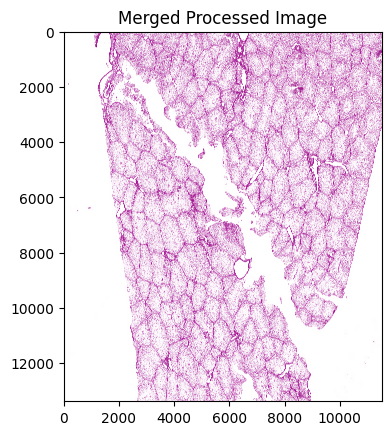

In [ ]:
from wsitools.tile_image import ImageSplitterMerger

# Create an ImageSplitterMerger instance with the specified parameters
# U-Net cell nuclei segmentation
# image = ImageSplitterMerger(filename, tilesize_px=150, overlap_px=15, pixelsize_mm=[0.001, 0.001], # tilesize_px=150, pixelsize_mm=[0.001, 0.001] with overlap_px=15 is probably best
#                             fcn=process_tile_unet)

# Mask R-CNN cell nuclei segmentation
image = ImageSplitterMerger(filename, tilesize_px=150, overlap_px=15, pixelsize_mm=[0.001, 0.001], # tilesize_px=150, pixelsize_mm=[0.001, 0.001] with overlap_px=15 is probably best
                            fcn=process_tile_mask_rcnn)

# Split and merge the image, applying the specified tile processing function
merged_image_processed = image.split_and_merge_image()

# Display the input and merged images using Matplotlib
plt.imshow(merged_image_processed)
plt.title("Merged Processed Image")
plt.show()

In [ ]:
plt.imsave("output.png", merged_image_processed)

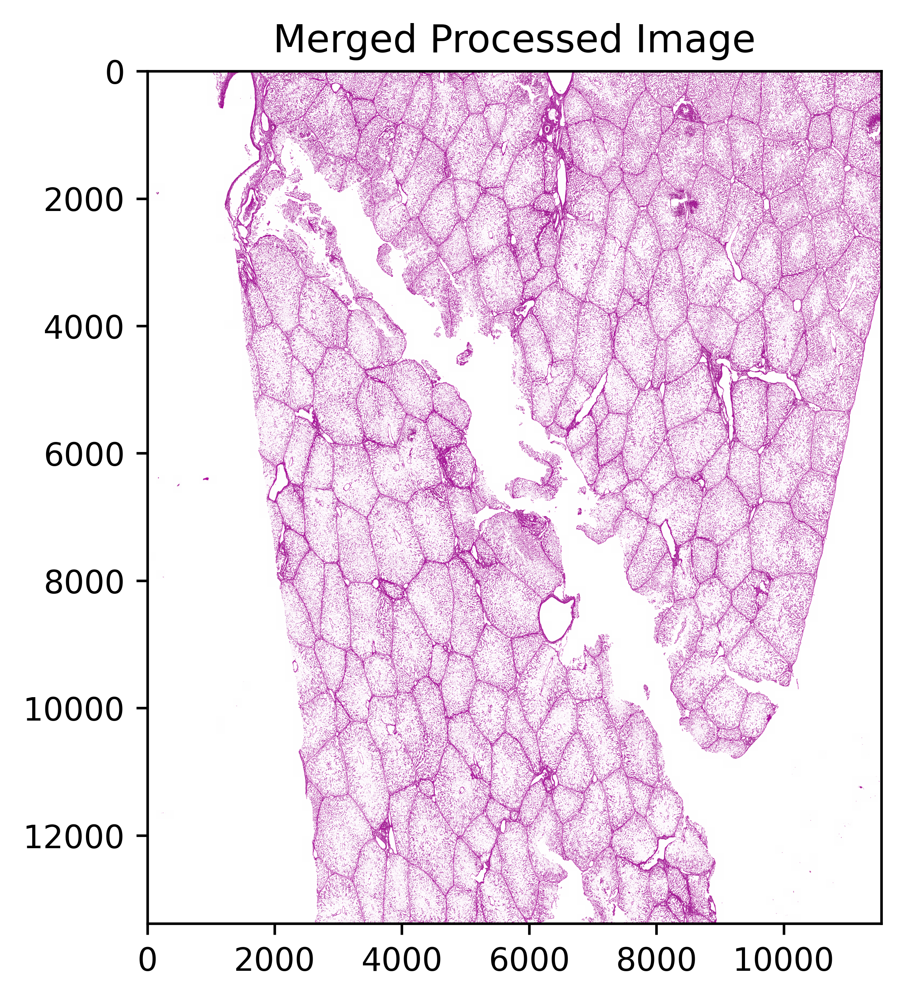

In [ ]:
plt.figure(dpi=600)
plt.imshow(merged_image_processed)
plt.title("Merged Processed Image")
plt.show()

In [ ]:
from wsitools.tile_image import ImageSplitterMerger

orig_image = ImageSplitterMerger(filename, tilesize_px=3000, overlap_px=0, pixelsize_mm=[0.001, 0.001],
                            fcn=None)

# Split and merge the image (in this case we use no tile processing function) - we
# only want to visualize the original image
orig_merged_image = orig_image.split_and_merge_image()

# plt.imshow(orig_merged_image)
# plt.title("Original Image")
# plt.show()

2024-05-14 13:38:16.055 | DEBUG    | wsitools.image:__init__:412 - fs_enc: utf-8
2024-05-14 13:38:16.059 | DEBUG    | wsitools.image:__init__:413 - Reading file J7_5_a.czi
2024-05-14 13:38:16.078 | DEBUG    | wsitools.image:_set_properties_czi:342 - nzi pixelsize  8.772367043811993e-07x8.772367043811993e-07 [m]
2024-05-14 13:38:16.084 | DEBUG    | wsitools.image:read_annotations:723 - Reading the annotation J7_5_a.czi


True


Merging Tiles: 100%|██████████| 20/20 [00:02<00:00,  8.07it/s]


### Image comparison

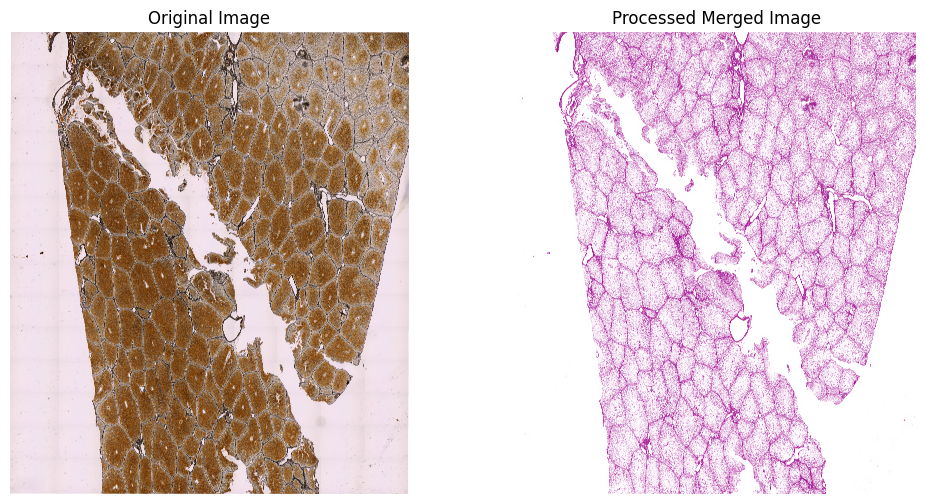

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(orig_merged_image)
axes[0].set_title("Original Image")
axes[0].axis('off')
axes[1].imshow(merged_image_processed)
axes[1].set_title("Processed Merged Image")
axes[1].axis('off')
plt.show()

## Hardware

In [ ]:
!nvidia-smi
!cat /proc/cpuinfo
!cat /proc/meminfo

Tue May 14 13:40:42 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P0              31W /  70W |   4939MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--